<a href="https://colab.research.google.com/github/ahmedengu/feature_importance/blob/master/Forex/EURUSD/EURUSD_1D_Close.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import clear_output
import pandas as pd

try:
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator
except:
  # install
  !apt-get install default-jre build-essential swig
  !pip  install h2o==3.24.0.5 yfinance==0.1.43
  !pip  install git+https://github.com/ahmedengu/findatapy.git
  clear_output(wait=True)

  !wget http://prdownloads.sourceforge.net/ta-lib/ta-lib-0.4.0-src.tar.gz
  !tar -xzvf ta-lib-0.4.0-src.tar.gz
  %cd ta-lib
  !./configure --prefix=/usr
  clear_output(wait=True)
  !make
  clear_output(wait=True)
  !make install
  clear_output(wait=True)
  !pip install Ta-Lib==0.4.17
  clear_output(wait=True)

     |████████████████████████████████| 727kB 2.8MB/s 
  Created wheel for Ta-Lib: filename=TA_Lib-0.4.17-cp36-cp36m-linux_x86_64.whl size=2405582 sha256=c02f73328d086a733211e235ac84dc824052efd9029d72d31744812db95ec575
  Stored in directory: /root/.cache/pip/wheels/2a/2e/ec/71c565b2e0091e03a2b56abfbfd062f14a01a8d7b20ffe8bd5
Successfully built Ta-Lib


In [0]:
# Experiment Config
import pandas as pd
from IPython.display import display
from IPython.core.debugger import set_trace

data_ticker = "EURUSD=X"
data_resample = '1D'
data_label = 'Close'
data_label_name = 'y'
start_date = '1 Jan 2009'
finish_date = '1 Jan 2019'
is_duka = False
is_yahoo = True
kaggle_file = 'bitstamp' # default None
kaggle_folder = '1 Day/Stocks'

folds = 0 # should be 0, corss validation cause overfitting

models_summary = {}
for metric in ['accuracy','F1','auc','logloss','mean_per_class_error','rmse','mse']:
  models_summary.update({metric:pd.DataFrame()})

best_models = {}
ensemble_model_threshold = 0.05
split_percentages = [0.2,0.1] # validation size, test size

# feature elimination config
model_selected_features = 50
PCA_k = 50
HCF_threshold = 0.90
LVF_threshold = 0.1
GLRM_k = 20
select_k = 50
select_percentile = 10
select_alpha = 0.1
select_rfe = 50
cv_rfe = 5

features_to_include = ['All', 'DLF', 'XGBF', 'RFE', 'Fwe', 'Super_learner'] # True for all , ['All','Fwe','RFE','RFECV','Percentile','KBest','LVF','HCF','PCA','XGBF','GLMF','DLF','GLRM'] 
algos_to_include = [None, 'GLM' ,'XGBoost' ,'DeepLearning'] # [None, 'DRF', 'GLM' ,'XGBoost' ,'GBM' ,'DeepLearning' ,'StackedEnsemble'], None for all
is_EDA = True
is_minmax = True # use minmax
max_models_num = 10

# pandas options
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [3]:
# random seed
from numpy.random import seed
seed(1)
from tensorflow import set_random_seed
set_random_seed(1)
import pandas as pd
import gc
import os

resample_how= {'Open': 'first', 'High': 'max', 'Low': 'min', 'Close': 'last',
                             'Volume': 'sum', 'Date': 'first'}

if is_duka:
  from findatapy.util import DataConstants

  DataConstants.market_thread_no.update({'dukascopy': 64})

  # Download dataset
  from findatapy.market import Market, MarketDataRequest, MarketDataGenerator

  market = Market(market_data_generator=MarketDataGenerator(log_every_day=30))

  md_request = MarketDataRequest(start_date=start_date, finish_date=finish_date,
                                       fields=['temp', 'ask', 'bid', 'askv', 'bidv'], vendor_fields=['temp', 'ask', 'bid', 'askv', 'bidv'],
                                       freq='tick', data_source='dukascopy',
                                       tickers=[data_ticker], vendor_tickers=[data_ticker])

  temp_dataset = market.fetch_market(md_request)
  full_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bid'].resample(data_resample).ohlc())
  full_dataset.columns = ['Open', 'High', 'Low', 'Close']
  temp_dataset = pd.DataFrame(temp_dataset[data_ticker + '.bidv'].resample(data_resample).sum())
  temp_dataset.columns = ['Volume']
  full_dataset['Volume'] = temp_dataset['Volume']

  del temp_dataset, md_request, market, DataConstants, Market, MarketDataRequest, MarketDataGenerator

  gc.collect()

elif is_yahoo:
  import yfinance as yf
  from datetime import datetime

  full_dataset = yf.download(data_ticker, start=str(datetime.strptime(start_date, '%d %b %Y')).split(' ')[0], end=str(datetime.strptime(finish_date, '%d %b %Y')).split(' ')[0])
  full_dataset['Date']=full_dataset.index
  del yf,datetime

elif data_ticker == 'EURUSD':
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2014.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2015.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2016.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2017.zip
  !wget -q https://github.com/philipperemy/FX-1-Minute-Data/raw/master/2000-Jun2019/eurusd/DAT_ASCII_EURUSD_M1_2018.zip
  !unzip -qq -o \*.zip
  full_dataset = pd.read_csv('DAT_ASCII_EURUSD_M1_2014.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';')
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2015.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2016.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2017.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset = full_dataset.append(pd.read_csv('DAT_ASCII_EURUSD_M1_2018.csv',names=['Date','Open', 'High', 'Low', 'Close','Volume'], delimiter=';'))
  full_dataset['Date'] = pd.to_datetime(full_dataset['Date'])
  full_dataset.index = full_dataset['Date']
  full_dataset = full_dataset.dropna()
  full_dataset = full_dataset.sort_index()
  full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]


    
elif data_ticker == 'APPLUSUSD':
  full_dataset=pd.read_csv('https://github.com/kyleconroy/apple-stock/raw/master/apple_stock_data.csv',index_col =0,parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > '2007-04-01']


elif data_ticker == 'COMI':
  full_dataset=pd.read_csv('https://static.mubasher.info/File.MubasherCharts/File.Historical_Stock_Charts_Dir/44507230b2b03e2da37352abf1a659545b44.csv',index_col =0,names =['Open', 'High', 'Low', 'Close','Volume'],parse_dates =[0])

  full_dataset = full_dataset.astype(float)
  full_dataset['Volume'] = full_dataset['Volume'] * full_dataset['Close'] 
  full_dataset = full_dataset.drop_duplicates()
  full_dataset['Date']=full_dataset.index
  full_dataset = full_dataset[full_dataset.index > start_date]
  full_dataset = full_dataset[full_dataset.index < finish_date]
  
elif kaggle_file is not None:
  if not os.path.isfile('kaggle.json'):
    from google.colab import files
    files.upload()
    
    import time
    time.sleep(10)
    !ls
    !mkdir -p ~/.kaggle
    !cp kaggle.json ~/.kaggle/
    !ls ~/.kaggle

    !chmod 600 /root/.kaggle/kaggle.json
    del files
    
  !kaggle datasets download $data_ticker
  !unzip -qq -o \*.zip
  !unzip -qq -o \*.zip

  if data_ticker == 'mczielinski/bitcoin-historical-data':
    
    full_dataset = pd.read_csv([file for file in os.listdir() if kaggle_file in file][0])
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Volume_(Currency)','Weighted_Price']
    full_dataset.index=pd.to_datetime(full_dataset['Date'], unit='s')

    resample_how.update({'Volume_(Currency)': 'sum', 'Weighted_Price': 'last'})

    full_dataset = full_dataset.resample(data_resample, how=resample_how).dropna()[1:-1]
    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]
  
  elif data_ticker == 'borismarjanovic/daily-and-intraday-stock-price-data':
    
    full_dataset = pd.read_csv(kaggle_folder + '/' + [file for file in os.listdir(kaggle_folder) if kaggle_file in file][0])
    if 'Time' in full_dataset.columns:
      full_dataset['Date'] = pd.to_datetime(full_dataset['Date'] + ' ' + full_dataset['Time'])
      full_dataset = full_dataset.drop('Time',axis=1)
    full_dataset.columns= ['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'OpenInt']
    full_dataset.index=pd.to_datetime(full_dataset['Date'])

    full_dataset = full_dataset[full_dataset.index > start_date]
    full_dataset = full_dataset[full_dataset.index < finish_date]

  
gc.collect()
full_dataset = full_dataset.dropna()

full_dataset = full_dataset.drop('Date',axis=1, errors='ignore')
full_dataset = full_dataset.sort_index()
full_dataset = full_dataset[-100000:]
display(full_dataset)
display(full_dataset.describe())
full_dataset.to_pickle('full_dataset')
del full_dataset, set_random_seed, seed
gc.collect()

[*********************100%***********************]  1 of 1 downloaded


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2009-01-01,1.3980,1.4054,1.3955,1.3999,1.3999,0
2009-01-02,1.4003,1.4023,1.3843,1.3923,1.3923,0
2009-01-05,1.3958,1.3958,1.3556,1.3646,1.3646,0
2009-01-06,1.3632,1.3632,1.3318,1.3510,1.3510,0
2009-01-07,1.3499,1.3742,1.3437,1.3611,1.3611,0
...,...,...,...,...,...,...
2018-12-26,1.1413,1.1419,1.1376,1.1416,1.1416,0
2018-12-27,1.1364,1.1434,1.1359,1.1361,1.1361,0
2018-12-28,1.1431,1.1473,1.1431,1.1431,1.1431,0


,Open,High,Low,Close,Adj Close,Volume
count,2605.000000,2605.000000,2605.000000,2605.000000,2605.000000,2605.0
mean,1.258565,1.263361,1.253492,1.258516,1.258516,0.0
std,0.118513,0.118918,0.118288,0.118428,0.118428,0.0
min,1.039400,1.042000,0.760600,1.039000,1.039000,0.0
25%,1.139700,1.143500,1.135900,1.139500,1.139500,0.0
50%,1.280900,1.287000,1.274700,1.281200,1.281200,0.0
75%,1.354800,1.359600,1.350000,1.354700,1.354700,0.0
max,1.512600,1.514500,1.504100,1.512800,1.512800,0.0


0

In [4]:
# OHLC EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('full_dataset')))
  del pp

/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/pandas_profiling/describe.py:392: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  variable_stats = pd.concat(ldesc, join_axes=pd.Index([names]), axis=1)


Number of variables,7
Number of observations,2605
Total Missing (%),0.0%
Total size in memory,142.6 KiB
Average record size in memory,56.0 B
Numeric,1
Categorical,0
Boolean,0
Date,1
Text (Unique),0
Rejected,5


In [5]:
# features
from talib._ta_lib import *
import talib
import numpy as np
import os

def fe(last_index = None):
  features_dataset = pd.read_pickle('full_dataset').sort_index()
  if last_index is not None:
    features_dataset = features_dataset[:-last_index]


  periods = np.resize([2, 3, 3, 2], len(features_dataset['Close'])).astype(float)
  timeperiods = [8, 12, 14, 20, 24, 30]
  matypes = [0,1,2,3,4,5,6,8]
  nbdevs = [2, 3, 4, 5]

  # date features
  features_dataset['day'] = features_dataset.index.day
  features_dataset['dayofweek'] = features_dataset.index.dayofweek
  features_dataset['dayofyear'] = features_dataset.index.dayofyear
  features_dataset['days_in_month'] = features_dataset.index.days_in_month
  features_dataset['hour'] = features_dataset.index.hour
  features_dataset['is_month_end'] = pd.factorize(features_dataset.index.is_month_end)[0]
  features_dataset['is_month_start'] = pd.factorize(features_dataset.index.is_month_start)[0]
  features_dataset['is_quarter_end'] = pd.factorize(features_dataset.index.is_quarter_end)[0]
  features_dataset['is_quarter_start'] = pd.factorize(features_dataset.index.is_quarter_start)[0]
  features_dataset['minute'] = features_dataset.index.minute
  features_dataset['month'] = features_dataset.index.month
  features_dataset['quarter'] = features_dataset.index.quarter
  features_dataset['second'] = features_dataset.index.second
  features_dataset['week'] = features_dataset.index.week
  features_dataset['weekday'] = features_dataset.index.weekday
  features_dataset['weekday_name'] = pd.factorize(features_dataset.index.weekday_name)[0]
  features_dataset['weekofyear'] = features_dataset.index.weekofyear

  # Overlap Studies
  features_dataset['HT_TRENDLINE'] = HT_TRENDLINE(features_dataset['Close'])
  features_dataset['mama'], features_dataset['fama'] = MAMA(features_dataset['Close'])
  features_dataset['SAREXT'] = SAREXT(features_dataset['High'], features_dataset['Low'], startvalue=-4e37,
                                      offsetonreverse=-4e37, accelerationinitlong=-4e37,
                                      accelerationlong=-4e37, accelerationmaxlong=-4e37, accelerationinitshort=-4e37,
                                      accelerationshort=-4e37, accelerationmaxshort=-4e37)

  for timeperiod in timeperiods:
      features_dataset['DEMA_' + str(timeperiod)] = DEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['EMA_' + str(timeperiod)] = EMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['KAMA_' + str(timeperiod)] = KAMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPOINT_' + str(timeperiod)] = MIDPOINT(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIDPRICE_' + str(timeperiod)] = MIDPRICE(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['SAR_' + str(timeperiod / 100)] = SAR(features_dataset['High'], features_dataset['Low'],
                                                            acceleration=timeperiod / 100,
                                                            maximum=timeperiod / 100)
      features_dataset['SMA_' + str(timeperiod)] = SMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TEMA_' + str(timeperiod)] = TEMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIMA_' + str(timeperiod)] = TRIMA(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WMA_' + str(timeperiod)] = WMA(features_dataset['Close'], timeperiod=timeperiod)

      for matype in matypes:
          features_dataset['MA_' + str(timeperiod) + '_' + str(matype)] = MA(features_dataset['Close'],
                                                                            timeperiod=timeperiod, matype=matype)
          features_dataset['MAVP_' + str(timeperiod) + '_' + str(matype)] = MAVP(features_dataset['Close'], periods,
                                                                                minperiod=2,
                                                                                maxperiod=timeperiod, matype=matype)
          features_dataset['T3_' + str(timeperiod) + '_' + str(matype)] = T3(features_dataset['Close'],
                                                                            timeperiod=timeperiod,
                                                                            vfactor=matype / 10)

          for nbdev in nbdevs:
              features_dataset['BBANDS_upperband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_middleband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)], \
              features_dataset['BBANDS_lowerband_' + str(timeperiod) + '_' + str(matype) + '_' + str(nbdev)] = BBANDS(
                  features_dataset['Close'], timeperiod=timeperiod, nbdevup=nbdev, nbdevdn=nbdev, matype=matype)

              
  gc.collect()
  # Momentum Indicators
  features_dataset['BOP'] = BOP(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                features_dataset['Close'])

  for timeperiod in timeperiods:
      features_dataset['ADX_' + str(timeperiod)] = ADX(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ADXR_' + str(timeperiod)] = ADXR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['aroondown_' + str(timeperiod)], features_dataset['aroonup_' + str(timeperiod)] = AROON(
          features_dataset['High'],
          features_dataset['Low'],
          timeperiod=timeperiod)
      features_dataset['AROONOSC_' + str(timeperiod)] = AROONOSC(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['CCI_' + str(timeperiod)] = CCI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['CMO_' + str(timeperiod)] = CMO(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['DX_' + str(timeperiod)] = DX(features_dataset['High'], features_dataset['Low'],
                                                    features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MACDFIX_' + str(timeperiod)], features_dataset['MACDFIX_signal_' + str(timeperiod)], features_dataset[
          'MACDFIX_hist_' + str(timeperiod)] = MACDFIX(features_dataset['Close'], signalperiod=timeperiod)
      features_dataset['MFI_' + str(timeperiod)] = MFI(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], features_dataset['Volume'],
                                                      timeperiod=timeperiod)
      features_dataset['MINUS_DI_' + str(timeperiod)] = MINUS_DI(features_dataset['High'], features_dataset['Low'],
                                                                features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINUS_DM_' + str(timeperiod)] = MINUS_DM(features_dataset['High'], features_dataset['Low'],
                                                                timeperiod=timeperiod)
      features_dataset['MOM_' + str(timeperiod)] = MOM(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DI_' + str(timeperiod)] = PLUS_DI(features_dataset['High'], features_dataset['Low'],
                                                              features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['PLUS_DM_' + str(timeperiod)] = PLUS_DM(features_dataset['High'], features_dataset['Low'],
                                                              timeperiod=timeperiod)
      features_dataset['ROC_' + str(timeperiod)] = ROC(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCP_' + str(timeperiod)] = ROCP(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR_' + str(timeperiod)] = ROCR(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['ROCR100_' + str(timeperiod)] = ROCR100(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['RSI_' + str(timeperiod)] = RSI(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['TRIX_' + str(timeperiod)] = TRIX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['WILLR_' + str(timeperiod)] = WILLR(features_dataset['High'], features_dataset['Low'],
                                                          features_dataset['Close'], timeperiod=timeperiod)

      
  gc.collect()
  features_dataset['APO'] = APO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['MACD'], features_dataset['MACD_signal'], features_dataset['MACD_hist'] = MACD(
      features_dataset['Close'], fastperiod=12,
      slowperiod=26,
      signalperiod=9)
  features_dataset['MACDEXT'], features_dataset['MACDEXT_signal'], features_dataset['MACDEXT_hist'] = MACDEXT(
      features_dataset['Close'],
      fastperiod=12,
      fastmatype=0,
      slowperiod=26,
      slowmatype=0,
      signalperiod=9,
      signalmatype=0)

  features_dataset['PPO'] = PPO(features_dataset['Close'], fastperiod=12, slowperiod=26, matype=0)

  features_dataset['STOCH_slowk'], features_dataset['STOCH_slowd'] = STOCH(features_dataset['High'],
                                                                          features_dataset['Low'],
                                                                          features_dataset['Close'], fastk_period=5,
                                                                          slowk_period=3, slowk_matype=0,
                                                                          slowd_period=3, slowd_matype=0)
  features_dataset['STOCHF_fastk'], features_dataset['STOCHF_fastd'] = STOCHF(features_dataset['High'],
                                                                              features_dataset['Low'],
                                                                              features_dataset['Close'], fastk_period=5,
                                                                              fastd_period=3, fastd_matype=0)
  features_dataset['STOCHRSI_fastk'], features_dataset['STOCHRSI_fastd'] = STOCHRSI(features_dataset['Close'],
                                                                                    timeperiod=14,
                                                                                    fastk_period=5, fastd_period=3,
                                                                                    fastd_matype=0)
  features_dataset['ULTOSC'] = ULTOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                      timeperiod1=7, timeperiod2=14, timeperiod3=28)

  # Volume Indicators
  features_dataset['AD'] = AD(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                              features_dataset['Volume'])
  features_dataset['ADOSC'] = ADOSC(features_dataset['High'], features_dataset['Low'], features_dataset['Close'],
                                    features_dataset['Volume'], fastperiod=3, slowperiod=10)
  features_dataset['OBV'] = OBV(features_dataset['Close'], features_dataset['Volume'])

  gc.collect()
  # Volatility Indicators
  for timeperiod in timeperiods:
      features_dataset['ATR_' + str(timeperiod)] = ATR(features_dataset['High'], features_dataset['Low'],
                                                      features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['NATR_' + str(timeperiod)] = NATR(features_dataset['High'], features_dataset['Low'],
                                                        features_dataset['Close'], timeperiod=timeperiod)

  features_dataset['TRANGE'] = TRANGE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  # Price Transform
  features_dataset['AVGPRICE'] = AVGPRICE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                          features_dataset['Close'])
  features_dataset['MEDPRICE'] = MEDPRICE(features_dataset['High'], features_dataset['Low'])
  features_dataset['TYPPRICE'] = TYPPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])
  features_dataset['WCLPRICE'] = WCLPRICE(features_dataset['High'], features_dataset['Low'], features_dataset['Close'])

  gc.collect()
  # Cycle Indicators
  features_dataset['HT_DCPERIOD'] = HT_DCPERIOD(features_dataset['Close'])
  features_dataset['HT_DCPHASE'] = HT_DCPHASE(features_dataset['Close'])
  features_dataset['HT_PHASOR_inphase'], features_dataset['HT_PHASOR_quadrature'] = HT_PHASOR(features_dataset['Close'])
  features_dataset['HT_SINE_sine'], features_dataset['HT_SINE_leadsine'] = HT_SINE(features_dataset['Close'])
  features_dataset['HT_TRENDMODE'] = HT_TRENDMODE(features_dataset['Close'])

  # Pattern Recognition
  features_dataset['CDL2CROWS'] = CDL2CROWS(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDL3BLACKCROWS'] = CDL3BLACKCROWS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3INSIDE'] = CDL3INSIDE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDL3LINESTRIKE'] = CDL3LINESTRIKE(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3OUTSIDE'] = CDL3OUTSIDE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3STARSINSOUTH'] = CDL3STARSINSOUTH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDL3WHITESOLDIERS'] = CDL3WHITESOLDIERS(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLABANDONEDBABY'] = CDLABANDONEDBABY(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'],
                                                          penetration=0)
  features_dataset['CDLADVANCEBLOCK'] = CDLADVANCEBLOCK(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBELTHOLD'] = CDLBELTHOLD(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLBREAKAWAY'] = CDLBREAKAWAY(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCLOSINGMARUBOZU'] = CDLCLOSINGMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCONCEALBABYSWALL'] = CDLCONCEALBABYSWALL(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLCOUNTERATTACK'] = CDLCOUNTERATTACK(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDARKCLOUDCOVER'] = CDLDARKCLOUDCOVER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'],
                                                            penetration=0)
  features_dataset['CDLDOJI'] = CDLDOJI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                        features_dataset['Close'])
  features_dataset['CDLDOJISTAR'] = CDLDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLDRAGONFLYDOJI'] = CDLDRAGONFLYDOJI(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLENGULFING'] = CDLENGULFING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLEVENINGDOJISTAR'] = CDLEVENINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLEVENINGSTAR'] = CDLEVENINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLGAPSIDESIDEWHITE'] = CDLGAPSIDESIDEWHITE(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLGRAVESTONEDOJI'] = CDLGRAVESTONEDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHAMMER'] = CDLHAMMER(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHANGINGMAN'] = CDLHANGINGMAN(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHARAMI'] = CDLHARAMI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLHARAMICROSS'] = CDLHARAMICROSS(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIGHWAVE'] = CDLHIGHWAVE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHIKKAKE'] = CDLHIKKAKE(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLHIKKAKEMOD'] = CDLHIKKAKEMOD(features_dataset['Open'], features_dataset['High'],
                                                    features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLHOMINGPIGEON'] = CDLHOMINGPIGEON(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLIDENTICAL3CROWS'] = CDLIDENTICAL3CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLINNECK'] = CDLINNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLINVERTEDHAMMER'] = CDLINVERTEDHAMMER(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLKICKING'] = CDLKICKING(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'])
  features_dataset['CDLKICKINGBYLENGTH'] = CDLKICKINGBYLENGTH(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLADDERBOTTOM'] = CDLLADDERBOTTOM(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLEGGEDDOJI'] = CDLLONGLEGGEDDOJI(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLLONGLINE'] = CDLLONGLINE(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMARUBOZU'] = CDLMARUBOZU(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATCHINGLOW'] = CDLMATCHINGLOW(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLMATHOLD'] = CDLMATHOLD(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                              features_dataset['Close'], penetration=0)
  features_dataset['CDLMORNINGDOJISTAR'] = CDLMORNINGDOJISTAR(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'],
                                                              penetration=0)
  features_dataset['CDLMORNINGSTAR'] = CDLMORNINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'], penetration=0)
  features_dataset['CDLONNECK'] = CDLONNECK(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLPIERCING'] = CDLPIERCING(features_dataset['Open'], features_dataset['High'],
                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRICKSHAWMAN'] = CDLRICKSHAWMAN(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLRISEFALL3METHODS'] = CDLRISEFALL3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSEPARATINGLINES'] = CDLSEPARATINGLINES(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHOOTINGSTAR'] = CDLSHOOTINGSTAR(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSHORTLINE'] = CDLSHORTLINE(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSPINNINGTOP'] = CDLSPINNINGTOP(features_dataset['Open'], features_dataset['High'],
                                                      features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTALLEDPATTERN'] = CDLSTALLEDPATTERN(features_dataset['Open'], features_dataset['High'],
                                                            features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLSTICKSANDWICH'] = CDLSTICKSANDWICH(features_dataset['Open'], features_dataset['High'],
                                                          features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTAKURI'] = CDLTAKURI(features_dataset['Open'], features_dataset['High'], features_dataset['Low'],
                                            features_dataset['Close'])
  features_dataset['CDLTASUKIGAP'] = CDLTASUKIGAP(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLTHRUSTING'] = CDLTHRUSTING(features_dataset['Open'], features_dataset['High'],
                                                  features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUNIQUE3RIVER'] = CDLUNIQUE3RIVER(features_dataset['Open'], features_dataset['High'],
                                                        features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLUPSIDEGAP2CROWS'] = CDLUPSIDEGAP2CROWS(features_dataset['Open'], features_dataset['High'],
                                                              features_dataset['Low'], features_dataset['Close'])
  features_dataset['CDLXSIDEGAP3METHODS'] = CDLXSIDEGAP3METHODS(features_dataset['Open'], features_dataset['High'],
                                                                features_dataset['Low'], features_dataset['Close'])
  gc.collect()

  # Statistic Functions
  for timeperiod in timeperiods:
      features_dataset['BETA_' + str(timeperiod)] = BETA(features_dataset['High'], features_dataset['Low'],
                                                        timeperiod=timeperiod)
      features_dataset['CORREL_' + str(timeperiod)] = CORREL(features_dataset['High'], features_dataset['Low'],
                                                            timeperiod=timeperiod)
      features_dataset['LINEARREG_' + str(timeperiod)] = LINEARREG(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['LINEARREG_ANGLE_' + str(timeperiod)] = LINEARREG_ANGLE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['LINEARREG_INTERCEPT_' + str(timeperiod)] = LINEARREG_INTERCEPT(features_dataset['Close'],
                                                                                      timeperiod=timeperiod)
      features_dataset['LINEARREG_SLOPE_' + str(timeperiod)] = LINEARREG_SLOPE(features_dataset['Close'],
                                                                              timeperiod=timeperiod)
      features_dataset['STDDEV_' + str(timeperiod)] = STDDEV(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)
      features_dataset['TSF_' + str(timeperiod)] = TSF(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['VAR_' + str(timeperiod)] = VAR(features_dataset['Close'], timeperiod=timeperiod, nbdev=1)

      
  gc.collect()
  # Math Transform
  features_dataset['ACOS'] = ACOS(features_dataset['Close'])
  features_dataset['ASIN'] = ASIN(features_dataset['Close'])
  features_dataset['ATAN'] = ATAN(features_dataset['Close'])
  features_dataset['CEIL'] = CEIL(features_dataset['Close'])
  features_dataset['COS'] = COS(features_dataset['Close'])
  features_dataset['COSH'] = COSH(features_dataset['Close'])
  features_dataset['EXP'] = EXP(features_dataset['Close'])
  features_dataset['FLOOR'] = FLOOR(features_dataset['Close'])
  features_dataset['LN'] = LN(features_dataset['Close'])
  features_dataset['LOG10'] = LOG10(features_dataset['Close'])
  features_dataset['SIN'] = SIN(features_dataset['Close'])
  features_dataset['SINH'] = SINH(features_dataset['Close'])
  features_dataset['SQRT'] = SQRT(features_dataset['Close'])
  features_dataset['TAN'] = TAN(features_dataset['Close'])
  features_dataset['TANH'] = TANH(features_dataset['Close'])

  gc.collect()
  # Math Operator
  features_dataset['ADD'] = ADD(features_dataset['High'], features_dataset['Low'])
  features_dataset['DIV'] = DIV(features_dataset['High'], features_dataset['Low'])
  features_dataset['MULT'] = MULT(features_dataset['High'], features_dataset['Low'])
  features_dataset['SUB'] = SUB(features_dataset['High'], features_dataset['Low'])

  for timeperiod in timeperiods:
      features_dataset['MAX_' + str(timeperiod)] = MAX(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MIN_' + str(timeperiod)] = MIN(features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['MINMAX_min_' + str(timeperiod)], features_dataset['MINMAX_max_' + str(timeperiod)] = MINMAX(
          features_dataset['Close'], timeperiod=timeperiod)
      features_dataset['SUM_' + str(timeperiod)] = SUM(features_dataset['Close'], timeperiod=timeperiod)
      
  gc.collect()


  features_dataset = features_dataset.drop(features_dataset.std()[(features_dataset.std() == 0)].index, axis=1)
  features_dataset = features_dataset[50:].replace([np.inf, -np.inf], np.nan).dropna(axis=1)
  features_dataset.to_pickle('features_dataset' if last_index is None else 'features_dataset_' + str(last_index))
  if last_index is None:
    display(features_dataset)
    display(features_dataset.describe())

  del periods, timeperiods, matypes, nbdevs, features_dataset
  gc.collect()

fe()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

In [6]:
# features EDA
if is_EDA:
  import pandas_profiling as pp
  display(pp.ProfileReport(pd.read_pickle('features_dataset')))
  del pp

Output hidden; open in https://colab.research.google.com to view.

In [7]:
# check features data leakage
fe(100)
long_df = pd.read_pickle('features_dataset')[:-100]
short_df =  pd.read_pickle('features_dataset_100')
if False in (long_df.index.values == short_df.index.values):
  print('mismatch INDEX', long_df.index.values == short_df.index.values)

for aCol in long_df.columns.values:
  try:
    if False in (long_df[aCol].values == short_df[aCol].values):
      print('mismatch, ', aCol, long_df[aCol].values == short_df[aCol].values)
  except:
    print('mismatch exception, ', aCol)

for name in dir():
  if any( n in name for n in talib.get_functions()):
    del globals()[name]

del talib, long_df, short_df
gc.collect()
print('Nothing should be printed above')

Nothing should be printed above


In [8]:
# label and scale
import numpy as np
from sklearn.preprocessing import minmax_scale
import os
import pandas as pd

features_dataset = pd.read_pickle('features_dataset')
label_df = features_dataset[[data_label]]
longs = label_df[data_label].values[1:] > label_df[data_label].values[:-1] 
shorts = label_df[data_label].values[1:] <= label_df[data_label].values[:-1] 
label_df = label_df[:-1]
label_df[data_label_name] = (longs*1 + shorts*0).astype(int)
scaled_df = features_dataset
scaled_df = pd.DataFrame((minmax_scale(scaled_df, axis=0, feature_range=(0, 1)) if is_minmax else scaled_df), columns=scaled_df.columns,
                         index=scaled_df.index)
categorical_columns = features_dataset.select_dtypes(exclude=['float64', 'float32', 'float16', 'float_']).columns

scaled_df[categorical_columns] = features_dataset[categorical_columns]
scaled_df = scaled_df[:-1]
scaled_df[data_label_name] = label_df[data_label_name]

display(scaled_df)
scaled_df.to_pickle('scaled_df') 

label_df[-50:].to_pickle('predict_df')
del features_dataset, categorical_columns, scaled_df, label_df, minmax_scale, shorts, longs
gc.collect()

,Open,High,Low,Close,Adj Close,day,dayofweek,dayofyear,days_in_month,is_month_end,is_month_start,is_quarter_end,is_quarter_start,month,quarter,week,weekday,weekday_name,weekofyear,mama,fama,SAREXT,DEMA_8,EMA_8,KAMA_8,MIDPOINT_8,MIDPRICE_8,SAR_0.08,SMA_8,TEMA_8,TRIMA_8,WMA_8,MA_8_0,MAVP_8_0,T3_8_0,BBANDS_upperband_8_0_2,BBANDS_middleband_8_0_2,BBANDS_lowerband_8_0_2,BBANDS_upperband_8_0_3,BBANDS_middleband_8_0_3,BBANDS_lowerband_8_0_3,BBANDS_upperband_8_0_4,BBANDS_middleband_8_0_4,BBANDS_lowerband_8_0_4,BBANDS_upperband_8_0_5,BBANDS_middleband_8_0_5,BBANDS_lowerband_8_0_5,MA_8_1,MAVP_8_1,T3_8_1,BBANDS_upperband_8_1_2,BBANDS_middleband_8_1_2,BBANDS_lowerband_8_1_2,BBANDS_upperband_8_1_3,BBANDS_middleband_8_1_3,BBANDS_lowerband_8_1_3,BBANDS_upperband_8_1_4,BBANDS_middleband_8_1_4,BBANDS_lowerband_8_1_4,BBANDS_upperband_8_1_5,BBANDS_middleband_8_1_5,BBANDS_lowerband_8_1_5,MA_8_2,MAVP_8_2,T3_8_2,BBANDS_upperband_8_2_2,BBANDS_middleband_8_2_2,BBANDS_lowerband_8_2_2,BBANDS_upperband_8_2_3,BBANDS_middleband_8_2_3,BBANDS_lowerband_8_2_3,BBANDS_upperband_8_2_4,BBANDS_middleband_8_2_4,BBANDS_lowerband_8_2_4,BBANDS_upperband_8_2_5,BBANDS_middleband_8_2_5,BBANDS_lowerband_8_2_5,MA_8_3,MAVP_8_3,T3_8_3,BBANDS_upperband_8_3_2,BBANDS_middleband_8_3_2,BBANDS_lowerband_8_3_2,BBANDS_upperband_8_3_3,BBANDS_middleband_8_3_3,BBANDS_lowerband_8_3_3,BBANDS_upperband_8_3_4,BBANDS_middleband_8_3_4,BBANDS_lowerband_8_3_4,BBANDS_upperband_8_3_5,BBANDS_middleband_8_3_5,BBANDS_lowerband_8_3_5,MA_8_4,MAVP_8_4,T3_8_4,BBANDS_upperband_8_4_2,BBANDS_middleband_8_4_2,BBANDS_lowerband_8_4_2,BBANDS_upperband_8_4_3,BBANDS_middleband_8_4_3,BBANDS_lowerband_8_4_3,BBANDS_upperband_8_4_4,BBANDS_middleband_8_4_4,BBANDS_lowerband_8_4_4,BBANDS_upperband_8_4_5,BBANDS_middleband_8_4_5,BBANDS_lowerband_8_4_5,MA_8_5,MAVP_8_5,T3_8_5,BBANDS_upperband_8_5_2,BBANDS_middleband_8_5_2,BBANDS_lowerband_8_5_2,BBANDS_upperband_8_5_3,BBANDS_middleband_8_5_3,BBANDS_lowerband_8_5_3,BBANDS_upperband_8_5_4,BBANDS_middleband_8_5_4,BBANDS_lowerband_8_5_4,BBANDS_upperband_8_5_5,BBANDS_middleband_8_5_5,BBANDS_lowerband_8_5_5,MA_8_6,MAVP_8_6,T3_8_6,BBANDS_upperband_8_6_2,BBANDS_middleband_8_6_2,BBANDS_lowerband_8_6_2,BBANDS_upperband_8_6_3,BBANDS_middleband_8_6_3,BBANDS_lowerband_8_6_3,BBANDS_upperband_8_6_4,BBANDS_middleband_8_6_4,BBANDS_lowerband_8_6_4,BBANDS_upperband_8_6_5,BBANDS_middleband_8_6_5,BBANDS_lowerband_8_6_5,MA_8_8,MAVP_8_8,T3_8_8,BBANDS_upperband_8_8_2,BBANDS_middleband_8_8_2,BBANDS_lowerband_8_8_2,BBANDS_upperband_8_8_3,BBANDS_middleband_8_8_3,BBANDS_lowerband_8_8_3,BBANDS_upperband_8_8_4,BBANDS_middleband_8_8_4,BBANDS_lowerband_8_8_4,BBANDS_upperband_8_8_5,BBANDS_middleband_8_8_5,BBANDS_lowerband_8_8_5,DEMA_12,EMA_12,KAMA_12,MIDPOINT_12,MIDPRICE_12,SAR_0.12,SMA_12,TEMA_12,TRIMA_12,WMA_12,MA_12_0,MAVP_12_0,BBANDS_upperband_12_0_2,BBANDS_middleband_12_0_2,BBANDS_lowerband_12_0_2,BBANDS_upperband_12_0_3,BBANDS_middleband_12_0_3,BBANDS_lowerband_12_0_3,BBANDS_upperband_12_0_4,BBANDS_middleband_12_0_4,BBANDS_lowerband_12_0_4,BBANDS_upperband_12_0_5,BBANDS_middleband_12_0_5,BBANDS_lowerband_12_0_5,MA_12_1,MAVP_12_1,BBANDS_upperband_12_1_2,BBANDS_middleband_12_1_2,BBANDS_lowerband_12_1_2,BBANDS_upperband_12_1_3,BBANDS_middleband_12_1_3,BBANDS_lowerband_12_1_3,BBANDS_upperband_12_1_4,BBANDS_middleband_12_1_4,BBANDS_lowerband_12_1_4,BBANDS_upperband_12_1_5,BBANDS_middleband_12_1_5,BBANDS_lowerband_12_1_5,MA_12_2,MAVP_12_2,BBANDS_upperband_12_2_2,BBANDS_middleband_12_2_2,BBANDS_lowerband_12_2_2,BBANDS_upperband_12_2_3,BBANDS_middleband_12_2_3,BBANDS_lowerband_12_2_3,BBANDS_upperband_12_2_4,BBANDS_middleband_12_2_4,BBANDS_lowerband_12_2_4,BBANDS_upperband_12_2_5,BBANDS_middleband_12_2_5,BBANDS_lowerband_12_2_5,MA_12_3,MAVP_12_3,BBANDS_upperband_12_3_2,BBANDS_middleband_12_3_2,BBANDS_lowerband_12_3_2,BBANDS_upperband_12_3_3,BBANDS_middleband_12_3_3,BBANDS_lowerband_12_3_3,BBANDS_upperband_12_3_4,BBANDS_middleband_12_3_4,BBANDS_lowerband_12_3_4,BBANDS_upperband_12_3_5,BBANDS_middleband_12_3_

0

In [9]:
# load data into h2o
import h2o
import pandas as pd
from h2o.automl import H2OAutoML
import matplotlib.pyplot as plt
import matplotlib as mpl
import time
import gc
import numpy as np

def load_h2o():
  global train_hf, index_splits
  try:
    h2o.cluster().shutdown()
    time.sleep(5)
  except:
    pass

  h2o.init(min_mem_size="9g",nthreads=-1)
  h2o.remove_all()
  train_hf = h2o.H2OFrame(pd.read_pickle('scaled_df'))
  
  gc.collect()
  train_hf[data_label_name] = train_hf[data_label_name].ascharacter().asfactor()
  index_splits = [int(len(train_hf)*(1-(split_percentages[0]+split_percentages[1]))),int(len(train_hf)*(1-split_percentages[1]))]
  gc.collect()


try:
  load_h2o()
except:
  pass

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.4" 2019-07-16; OpenJDK Runtime Environment (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3); OpenJDK 64-Bit Server VM (build 11.0.4+11-post-Ubuntu-1ubuntu218.04.3, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.6/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmphpr66inv
  JVM stdout: /tmp/tmphpr66inv/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmphpr66inv/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O cluster uptime:,01 secs
H2O cluster timezone:,Etc/UTC
H2O data parsing timezone:,UTC
H2O cluster version:,3.24.0.5
H2O cluster version age:,5 months and 18 days !!!
H2O cluster name:,H2O_from_python_unknownUser_9zq8rm
H2O cluster total nodes:,1
H2O cluster free memory:,9 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"accepting new members, healthy"


Parse progress: |█████████████████████████████████████████████████████████| 100%


In [0]:
# define the model
%matplotlib inline
from h2o.exceptions import H2OJobCancelled
from sklearn.metrics import accuracy_score

def model_train(feature_name='All', model_algo = None,features_list=None,training_frame=None, 
                nfolds=0,max_models=None):
  
  global train_hf, models_summary, features_to_include, max_models_num,best_models
  if features_to_include is not True and feature_name not in features_to_include:
    return []
  
  nfolds = nfolds or folds
  gc.collect()
  model_algo = [model_algo] if isinstance(model_algo,str) else model_algo
  for _ in range(3):
    try:
      aml = H2OAutoML(seed=1, nfolds=nfolds, max_models=(max_models or max_models_num),
                      include_algos=model_algo, keep_cross_validation_predictions=True)
      t_hf = (training_frame or train_hf)
      validation_frame =  t_hf[index_splits[0]:index_splits[1],:] if split_percentages[0] != 0 else None

      aml.train(x=(features_list or list(t_hf.columns[:-1])), y=data_label_name, training_frame=t_hf[:index_splits[0],:], validation_frame=validation_frame, leaderboard_frame=t_hf[index_splits[1]:,:])
      if aml.leader is None:
        return None
      break
    except (KeyboardInterrupt, H2OJobCancelled):
      raise Exception('Stopped')
    except Exception as e:
      print(e)
      load_h2o()
      
  
  important_features = None
  try:
    display(aml.leaderboard.as_data_frame())
    important_features = aml.leader.varimp(use_pandas=True)
    display(important_features)
    important_features = list(important_features['variable'].values)
    aml.leader.varimp_plot()
    display(aml.leader)
    model_performance = aml.leader.model_performance(test_data=t_hf[index_splits[1]:,:])
    for k in models_summary:
      result = getattr(model_performance, k)()
      result = result[0][1] if isinstance(result,list) else result
      models_summary[k] = models_summary[k].append(pd.DataFrame({(model_algo[0] if model_algo is not None else 'All'):[result]},index=[feature_name]))
      display((k,result))
  except Exception as e:
    print(e)
  
  try:
    best_models[str(feature_name) + '_' + str(model_algo)] = {'id':aml.leader.model_id ,'AUC':getattr(model_performance, "auc")(),
                                                              'path': h2o.save_model(aml.leader,force=True)}
    predicted = aml.leader.predict(t_hf).as_data_frame()

    # predicted['predict'] = (predicted['p1'] >= aml.leader.find_threshold_by_max_metric('f1', train=False, valid=True, xval=False)).astype(int)
    predicted.to_csv(str(feature_name) + '_' + str(model_algo) + '.csv', )
    predicted = predicted[['predict']]
    print(predicted)
    start_idx = max(-index_splits[1],-20)
    predicted = predicted[start_idx:]
    predict_df = pd.read_pickle('predict_df')[start_idx:]

    predicted.index = predict_df.index
    predicted[data_label] = predict_df[data_label]

    up_mask = predicted['predict'] == 1
    down_mask = predicted['predict'] == 0

    plt.plot(predicted[data_label], color='tab:blue', label='Actual')
    plt.scatter(predicted.index[up_mask], predicted[data_label][up_mask], marker=mpl.markers.CARETUPBASE, color='tab:green', s=100, label='Up')
    plt.scatter(predicted.index[down_mask], predicted[data_label][down_mask],marker=mpl.markers.CARETDOWNBASE, color='tab:red', s=100, label='Down')
    plt.xticks(rotation = '60')
    
    plt.legend(loc='upper left')
    plt.show()
  except Exception as e:
    print(e)
  
  try:
    display(model_performance)
    model_performance.plot()
  except Exception as e:
    print(e)

  try:
    aml.leader.std_coef_plot()
  except Exception as e:
    print(e)
  
  try:
    aml.leader.plot()
  except Exception as e:
    print(e)
  
  import json
  from PIL import Image
  try:
    model_path = aml.leader.download_mojo(get_genmodel_jar=True)

    try:
      !wget -c https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip && unzip -n h2o-3.24.0.5.zip 

      !java -Xmx6g -cp h2o-3.24.0.5/h2o.jar hex.genmodel.tools.PrintMojo --tree 0 -i $model_path -o model.gv --levels 3 -f 9
      !dot -Tpng model.gv -o model.png

      display(Image.open('model.png'))
    except Exception as e:
      pass

    try:
      !unzip -o -qq $model_path

      with open('experimental/modelDetails.json') as f:
          display(json.load(f)['parameters'])
    except:
      pass
  
  except Exception as e:
    print(e)

  try:
    del aml, predicted, Image, json, model_performance
  except Exception as e:
    print(e)

  gc.collect()

  return important_features

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.804396,0.544090,0.263065,0.430078,0.184967
1,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.802076,0.581355,0.284737,0.446072,0.198981
2,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.799695,0.548765,0.308303,0.431440,0.186141
3,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.790354,0.602600,0.292430,0.455730,0.207690
4,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.787546,0.564565,0.291819,0.436183,0.190255
5,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.785470,1.091744,0.340904,0.494104,0.244139
6,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.776190,0.614273,0.279792,0.450206,0.202686
7,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.772650,0.581478,0.364835,0.449235,0.201812
8,DeepLearning_grid_1_AutoML_20191207_222449_mod...,0.726496,0.592425,0.316361,0.454410,0.206489
9,DeepLearning_1_AutoML_20191207_222449,0.721062,0.628066,0.346886,0.469112,0.220066


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,1.000000,1.000000,0.007566
1,CDLDRAGONFLYDOJI,0.890135,0.890135,0.006735
2,CDLTAKURI,0.880377,0.880377,0.006661
3,STOCHF_fastk,0.594154,0.594154,0.004496
4,CDLINVERTEDHAMMER,0.565635,0.565635,0.004280
...,...,...,...,...
933,MA_12_0,0.093630,0.093630,0.000708
934,T3_8_5,0.093235,0.093235,0.000705
935,CDLCOUNTERATTACK,0.076627,0.076627,0.000580
936,CDL3INSIDE,0.072612,0.072612,0.000549


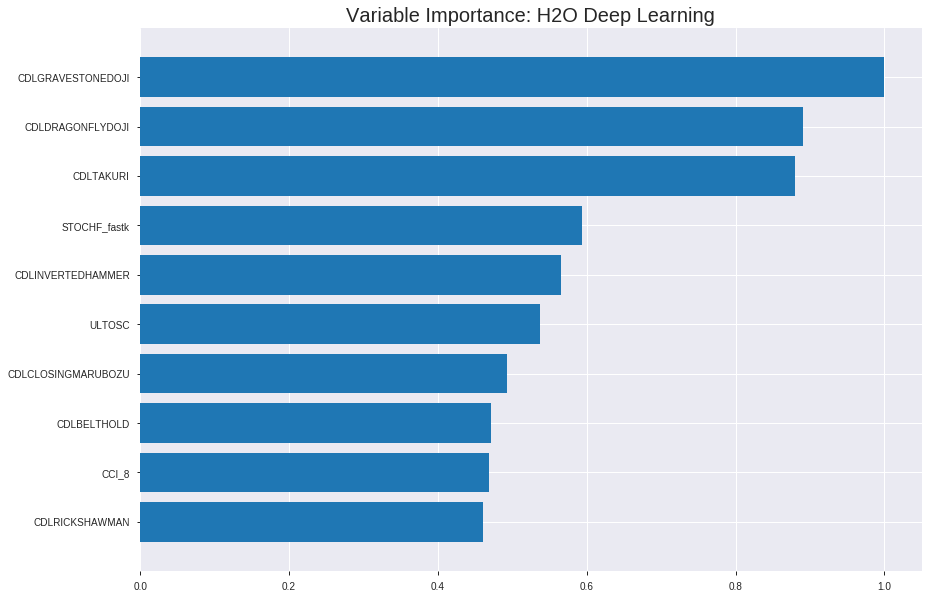

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_222449_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.15808902885776085
RMSE: 0.39760411071537083
LogLoss: 0.4728954846819719
Mean Per-Class Error: 0.23937477453102451
AUC: 0.8572380551547217
pr_auc: 0.8337480637851229
Gini: 0.7144761103094435
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.430382105858115: 


,0,1,Error,Rate
0,515.0,376.0,0.422,(376.0/891.0)
1,78.0,818.0,0.0871,(78.0/896.0)
Total,593.0,1194.0,0.2541,(454.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4303821,0.7827751,246.0
max f2,0.3811591,0.8795547,272.0
max f0point5,0.5793096,0.7908805,158.0
max accuracy,0.5018769,0.7604924,200.0
max precision,0.9996709,1.0,0.0
max recall,0.0002949,1.0,399.0
max specificity,0.9996709,1.0,0.0
max absolute_mcc,0.5389459,0.5255036,180.0
max min_per_class_accuracy,0.4797804,0.7553311,212.0
max mean_per_class_accuracy,0.5018769,0.7606252,200.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 49.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9996431,1.9944196,1.9944196,1.0,0.9998383,1.0,0.9998383,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9983414,1.9944196,1.9944196,1.0,0.9990380,1.0,0.9994382,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9960785,1.9944196,1.9944196,1.0,0.9974869,1.0,0.9987877,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9919896,1.9944196,1.9944196,1.0,0.9944521,1.0,0.9977038,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9870663,1.9944196,1.9944196,1.0,0.9902109,1.0,0.9962052,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.9234361,1.9047828,1.9498516,0.9550562,0.9579886,0.9776536,0.9772037,0.0948661,0.1953125,90.4782805,94.9851606
,7,0.1499720,0.8379398,1.8823736,1.9274429,0.9438202,0.8822246,0.9664179,0.9456621,0.09375,0.2890625,88.2373596,92.7442864
,8,0.2003358,0.7255099,1.8171379,1.8997126,0.9111111,0.7825854,0.9525140,0.9046652,0.0915179,0.3805804,81.7137897,89.9712565
,9,0.2999440,0.5910262,1.4678032,1.7562800,0.7359551,0.6465914,0.8805970,0.8189616,0.1462054,0.5267857,46.7803220,75.6279984
,10,0.4001119,0.5314025,1.2590470,1.6317979,0.6312849,0.5613211,0.8181818,0.7544614,0.1261161,0.6529018,25.9047037,63.1797890




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1875131034058385
RMSE: 0.4330278321376566
LogLoss: 0.5533229457789604
Mean Per-Class Error: 0.269558214450069
AUC: 0.8037505752416015
pr_auc: 0.7847661566731305
Gini: 0.6075011504832031
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4873888920495466: 


,0,1,Error,Rate
0,160.0,105.0,0.3962,(105.0/265.0)
1,38.0,208.0,0.1545,(38.0/246.0)
Total,198.0,313.0,0.2798,(143.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4873889,0.7441860,239.0
max f2,0.4034671,0.8472122,299.0
max f0point5,0.6134616,0.7421053,143.0
max accuracy,0.5434167,0.7299413,195.0
max precision,0.9682830,1.0,0.0
max recall,0.0353551,1.0,394.0
max specificity,0.9682830,1.0,0.0
max absolute_mcc,0.6134616,0.4638143,143.0
max min_per_class_accuracy,0.5434167,0.7283019,195.0
max mean_per_class_accuracy,0.5377108,0.7304418,199.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 53.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9433581,2.0772358,2.0772358,1.0,0.9518720,1.0,0.9518720,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9212128,2.0772358,2.0772358,1.0,0.9295764,1.0,0.9417376,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9143939,2.0772358,2.0772358,1.0,0.9177642,1.0,0.9342459,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.8990468,2.0772358,2.0772358,1.0,0.9054382,1.0,0.9273869,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.8891036,1.2463415,1.9174484,0.6,0.8944267,0.9230769,0.9210484,0.0121951,0.0975610,24.6341463,91.7448405
,6,0.1017613,0.8450132,1.7576610,1.8375547,0.8461538,0.8645730,0.8846154,0.8928107,0.0894309,0.1869919,75.7661038,83.7554722
,7,0.1506849,0.7937253,1.8279675,1.8344420,0.88,0.8256097,0.8831169,0.8709922,0.0894309,0.2764228,82.7967480,83.4441981
,8,0.2015656,0.7311871,1.4380863,1.7343910,0.6923077,0.7568165,0.8349515,0.8421712,0.0731707,0.3495935,43.8086304,73.4391033
,9,0.3013699,0.6386611,1.5477443,1.6725795,0.7450980,0.6762273,0.8051948,0.7872157,0.1544715,0.5040650,54.7744301,67.2579453
,10,0.4011742,0.5819672,1.1811733,1.5503272,0.5686275,0.6094628,0.7463415,0.7429943,0.1178862,0.6219512,18.1173282,55.0327186



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:35:13,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 22:35:17,5 min 33.861 sec,776 obs/sec,1.6491326,1,2947.0,0.5637990,2.3071397,-0.2714872,0.5883362,0.4474739,1.5512153,0.4409625,0.7201316,9.4310663,-1.0772298,0.5174106,0.1595972,1.3848238,0.5068493
,2019-12-07 22:35:36,5 min 52.761 sec,977 obs/sec,11.4706212,7,20498.0,0.4643242,0.6186517,0.1376054,0.7427856,0.7558002,1.9944196,0.3855624,0.4945603,0.6821564,0.0202858,0.7618500,0.7613285,2.0772358,0.3639922
,2019-12-07 22:35:54,6 min 10.451 sec,1030 obs/sec,21.2736430,13,38016.0,0.4580488,0.6045520,0.1607586,0.7392220,0.7406275,1.9944196,0.3665361,0.4982026,0.6890646,0.0058023,0.7265455,0.7196006,2.0772358,0.4148728
,2019-12-07 22:36:14,6 min 30.726 sec,1056 obs/sec,32.7106883,20,58454.0,0.4320206,0.5530727,0.2534270,0.8004662,0.7933762,1.9944196,0.3072188,0.4550849,0.6010837,0.1704442,0.7909112,0.7757474,2.0772358,0.3131115
,2019-12-07 22:36:34,6 min 50.585 sec,1075 obs/sec,44.1578064,27,78910.0,0.4265561,0.5416810,0.2721938,0.8140551,0.8108622,1.9944196,0.2893117,0.4657967,0.6224198,0.1309322,0.8002071,0.7826449,2.0772358,0.2954990
,2019-12-07 22:36:54,7 min 10.800 sec,1084 obs/sec,55.6743145,34,99490.0,0.4281137,0.5428455,0.2668690,0.8056883,0.7957789,1.9944196,0.3083380,0.4720661,0.6297322,0.1073805,0.7951603,0.7813577,2.0772358,0.2837573
,2019-12-07 22:37:14,7 min 30.338 sec,1094 obs/sec,67.0565193,41,119830.0,0.4096206,0.5083964,0.3288388,0.8424849,0.8320018,1.9944196,0.2613318,0.4337455,0.5554510,0.2464177,0.8061973,0.7893655,2.0772358,0.2720157
,2019-12-07 22:37:33,7 min 50.055 sec,1100 obs/sec,78.4801343,48,140244.0,0.4090174,0.5096574,0.3308138,0.8415730,0.8452858,1.9944196,0.2781198,0.4320972,0.5553130,0.2521339,0.8046173,0.7888698,2.0772358,0.2681018
,2019-12-07 22:37:53,8 min 9.383 sec,1108 obs/sec,89.9641858,55,160766.0,0.4098019,0.5061074,0.3282443,0.8412918,0.8348653,1.9944196,0.2663682,0.4587909,0.6062755,0.1568778,0.7987575,0.7849791,2.0772358,0.2700587


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,1.0,1.0,0.0075664
CDLDRAGONFLYDOJI,0.8901349,0.8901349,0.0067351
CDLTAKURI,0.8803769,0.8803769,0.0066613
STOCHF_fastk,0.5941536,0.5941536,0.0044956
CDLINVERTEDHAMMER,0.5656351,0.5656351,0.0042798
---,---,---,---
MA_12_0,0.0936304,0.0936304,0.0007084
T3_8_5,0.0932352,0.0932352,0.0007055
CDLCOUNTERATTACK,0.0766268,0.0766268,0.0005798
CDL3INSIDE,0.0726125,0.0726125,0.0005494



See the whole table with table.as_data_frame()


('accuracy', 0.7421875)

('F1', 0.7615658362989323)

('auc', 0.8043956043956043)

('logloss', 0.5440897213850029)

('mean_per_class_error', 0.2587301587301587)

('rmse', 0.4300780319052386)

('mse', 0.1849671135274834)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


/usr/local/lib/python3.6/dist-packages/pandas/plotting/_matplotlib/converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


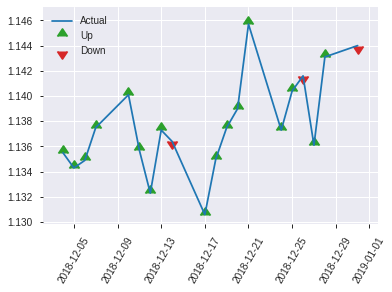


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.1849671135274834
RMSE: 0.4300780319052386
LogLoss: 0.5440897213850029
Mean Per-Class Error: 0.2587301587301587
AUC: 0.8043956043956043
pr_auc: 0.8090261888781611
Gini: 0.6087912087912086
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5090079670692539: 


,0,1,Error,Rate
0,82.0,44.0,0.3492,(44.0/126.0)
1,23.0,107.0,0.1769,(23.0/130.0)
Total,105.0,151.0,0.2617,(67.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5090080,0.7615658,150.0
max f2,0.4014211,0.8731241,212.0
max f0point5,0.5135026,0.7365439,143.0
max accuracy,0.5135026,0.7421875,143.0
max precision,0.9807396,1.0,0.0
max recall,0.0289426,1.0,254.0
max specificity,0.9807396,1.0,0.0
max absolute_mcc,0.5135026,0.4862949,143.0
max min_per_class_accuracy,0.5328241,0.7222222,128.0
max mean_per_class_accuracy,0.5135026,0.7412698,143.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 53.30 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9425942,1.9692308,1.9692308,1.0,0.9672981,1.0,0.9672981,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9222023,1.9692308,1.9692308,1.0,0.9286922,1.0,0.9479952,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9180531,1.9692308,1.9692308,1.0,0.9218113,1.0,0.9414492,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9123507,1.9692308,1.9692308,1.0,0.9153355,1.0,0.9343273,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8956603,1.9692308,1.9692308,1.0,0.9016823,1.0,0.9293050,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8261617,1.9692308,1.9692308,1.0,0.8559594,1.0,0.8926322,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7640142,1.6662722,1.8682446,0.8461538,0.7974155,0.9487179,0.8608933,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.6992371,1.0603550,1.6662722,0.5384615,0.7237388,0.8461538,0.8266047,0.0538462,0.3384615,6.0355030,66.6272189
,9,0.3007812,0.6012969,1.3390769,1.5600400,0.68,0.6404111,0.7922078,0.7661522,0.1307692,0.4692308,33.9076923,56.0039960
,10,0.4023438,0.5682361,1.2875740,1.4912621,0.6538462,0.5855162,0.7572816,0.7205548,0.1307692,0.6,28.7573964,49.1262136


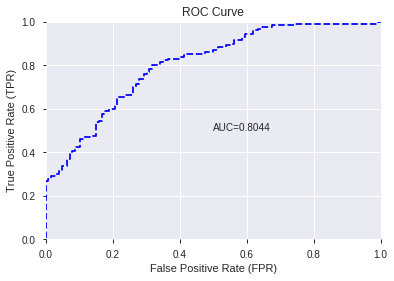

This function is available for GLM models only


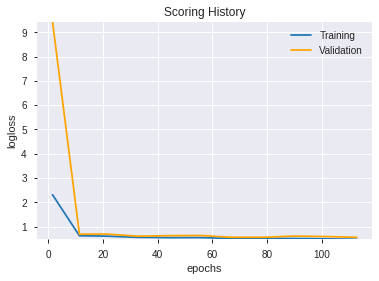

--2019-12-07 22:48:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.206.99
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.206.99|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 368257676 (351M) [application/zip]
Saving to: ‘h2o-3.24.0.5.zip’

h2o-3.24.0.5.zip    100%[===================>] 351.20M  17.0MB/s    in 22s     

2019-12-07 22:48:43 (15.8 MB/s) - ‘h2o-3.24.0.5.zip’ saved [368257676/368257676]

Archive:  h2o-3.24.0.5.zip
   creating: h2o-3.24.0.5/
   creating: h2o-3.24.0.5/bindings/
   creating: h2o-3.24.0.5/bindings/java/
 extracting: h2o-3.24.0.5/bindings/java/h2o-bindings-3.24.0.zip  
  inflating: h2o-3.24.0.5/h2o.jar    
   creating: h2o-3.24.0.5/python/
  inflating: h2o-3.24.0.5/python/h2o-3.24.0.5-py2.py3-none-any.whl  
   creating: h2o-3.24.0.5/R/
  inflating: h2o-3.24.0.5/R/h2o_3.24.0.5.tar.gz  
ERROR: Unk

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_222449_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_222449_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_2_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

938

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CDLINVERTEDHAMMER',
 'ULTOSC',
 'CDLCLOSINGMARUBOZU',
 'CDLBELTHOLD',
 'CCI_8',
 'CDLRICKSHAWMAN',
 'PLUS_DI_8',
 'CDLHANGINGMAN',
 'MINUS_DI_8',
 'days_in_month',
 'MINUS_DM_8',
 'SUB',
 'PLUS_DM_8',
 'CDLSHOOTINGSTAR',
 'DIV',
 'CCI_12',
 'CDLHIKKAKE',
 'CDLHAMMER',
 'CCI_14',
 'PLUS_DI_12',
 'TRANGE',
 'MINUS_DI_12',
 'PLUS_DM_12',
 'SAREXT',
 'CDLLONGLEGGEDDOJI',
 'weekday_name',
 'WILLR_8',
 'is_month_end',
 'CDLDOJI',
 'MINUS_DI_14',
 'aroonup_8',
 'CDLSPINNINGTOP',
 'MINUS_DM_12',
 'PLUS_DM_14',
 'CDLHIGHWAVE',
 'is_month_start',
 'AROONOSC_12',
 'CCI_20',
 'PLUS_DI_14',
 'WILLR_12',
 'CCI_30',
 'STOCH_slowk',
 'aroonup_12',
 'BETA_30',
 'STOCHF_fastd',
 'HT_DCPERIOD']

In [11]:
# DeepLearning
features_list = model_train(feature_name='All',model_algo="DeepLearning")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_224937_model_9,0.800611,0.533994,0.291697,0.426172,0.181623
1,DeepLearning_grid_1_AutoML_20191207_224937_model_8,0.794017,0.515805,0.288584,0.418841,0.175428
2,DeepLearning_grid_1_AutoML_20191207_224937_model_6,0.792735,0.524494,0.320574,0.424948,0.180581
3,DeepLearning_1_AutoML_20191207_224937,0.786752,0.542258,0.307570,0.432600,0.187143
4,DeepLearning_grid_1_AutoML_20191207_224937_model_3,0.781319,0.582549,0.320208,0.438906,0.192639
5,DeepLearning_grid_1_AutoML_20191207_224937_model_2,0.780586,0.566978,0.297009,0.441824,0.195208
6,DeepLearning_grid_1_AutoML_20191207_224937_model_5,0.769475,0.580516,0.307937,0.444138,0.197259
7,DeepLearning_grid_1_AutoML_20191207_224937_model_4,0.757814,0.714692,0.348840,0.477460,0.227968
8,DeepLearning_grid_1_AutoML_20191207_224937_model_7,0.754457,0.616328,0.319597,0.460874,0.212405
9,DeepLearning_grid_1_AutoML_20191207_224937_model_1,0.737363,0.704137,0.376374,0.474036,0.224710


,variable,relative_importance,scaled_importance,percentage
0,CDLRICKSHAWMAN,1.000000,1.000000,0.032069
1,DIV,0.975838,0.975838,0.031294
2,SUB,0.973880,0.973880,0.031231
3,CDLGRAVESTONEDOJI,0.928206,0.928206,0.029766
4,STOCHF_fastk,0.839603,0.839603,0.026925
5,CDLHANGINGMAN,0.810376,0.810376,0.025988
6,TRANGE,0.801219,0.801219,0.025694
7,CCI_8,0.780635,0.780635,0.025034
8,CDLDRAGONFLYDOJI,0.778990,0.778990,0.024981
9,CDLINVERTEDHAMMER,0.777953,0.777953,0.024948


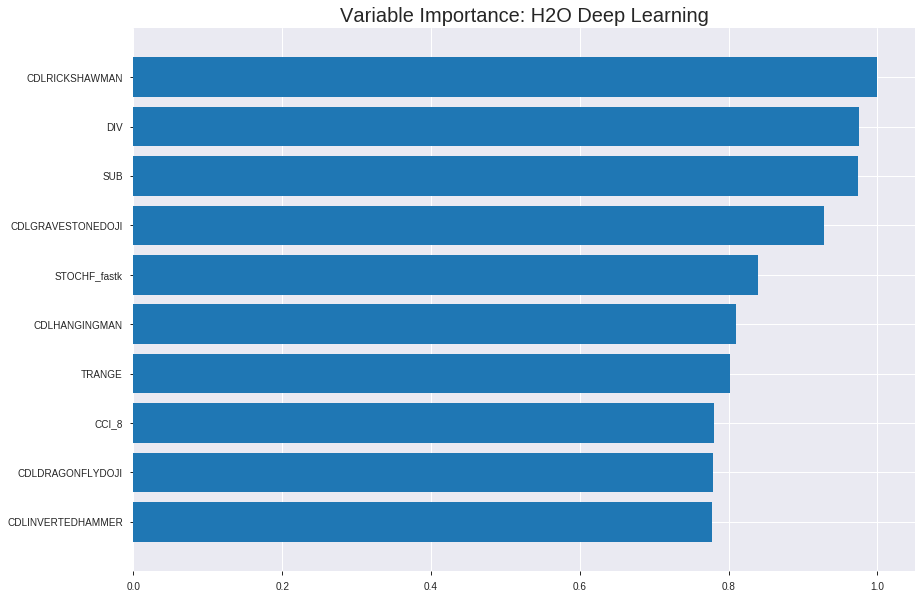

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_224937_model_9


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.1713577170793648
RMSE: 0.41395376200653716
LogLoss: 0.5079243000548023
Mean Per-Class Error: 0.27356463945005616
AUC: 0.8182438221500722
pr_auc: 0.8195196292404049
Gini: 0.6364876443001444
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4769179060744377: 


,0,1,Error,Rate
0,431.0,460.0,0.5163,(460.0/891.0)
1,51.0,845.0,0.0569,(51.0/896.0)
Total,482.0,1305.0,0.286,(511.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4769179,0.7678328,247.0
max f2,0.1359766,0.8709869,333.0
max f0point5,0.5789929,0.7340295,174.0
max accuracy,0.5146196,0.7269166,225.0
max precision,0.9734198,1.0,0.0
max recall,0.0065960,1.0,398.0
max specificity,0.9734198,1.0,0.0
max absolute_mcc,0.5146196,0.4825440,225.0
max min_per_class_accuracy,0.5220267,0.7115600,217.0
max mean_per_class_accuracy,0.5146196,0.7264354,225.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 51.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9620473,1.9944196,1.9944196,1.0,0.9658188,1.0,0.9658188,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9584558,1.9944196,1.9944196,1.0,0.9603095,1.0,0.9630642,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9562656,1.9944196,1.9944196,1.0,0.9575745,1.0,0.9612343,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9538116,1.8836186,1.9667194,0.9444444,0.9549268,0.9861111,0.9596574,0.0189732,0.0792411,88.3618552,96.6719370
,5,0.0503637,0.9512684,1.9944196,1.9722594,1.0,0.9522223,0.9888889,0.9581704,0.0200893,0.0993304,99.4419643,97.2259425
,6,0.1001679,0.9351118,1.8375552,1.9052836,0.9213483,0.9441364,0.9553073,0.9511926,0.0915179,0.1908482,83.7555177,90.5283569
,7,0.1499720,0.8816051,1.7703275,1.8604661,0.8876404,0.9119264,0.9328358,0.9381527,0.0881696,0.2790179,77.0327548,86.0466085
,8,0.2003358,0.7952068,1.6620164,1.8105765,0.8333333,0.8376203,0.9078212,0.9128792,0.0837054,0.3627232,66.2016369,81.0576491
,9,0.2999440,0.6099542,1.3445526,1.6558148,0.6741573,0.6916742,0.8302239,0.8394193,0.1339286,0.4966518,34.4552568,65.5814815
,10,0.4001119,0.5427217,1.1142009,1.5202220,0.5586592,0.5680828,0.7622378,0.7714903,0.1116071,0.6082589,11.4200918,52.0221966




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1790079138623572
RMSE: 0.42309326851458795
LogLoss: 0.5464230497696004
Mean Per-Class Error: 0.2554916398220586
AUC: 0.8184537505752415
pr_auc: 0.7868551235391055
Gini: 0.636907501150483
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5042588488521479: 


,0,1,Error,Rate
0,144.0,121.0,0.4566,(121.0/265.0)
1,25.0,221.0,0.1016,(25.0/246.0)
Total,169.0,342.0,0.2857,(146.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5042588,0.7517007,242.0
max f2,0.1715718,0.8441092,306.0
max f0point5,0.5303687,0.7628866,168.0
max accuracy,0.5227819,0.7475538,188.0
max precision,0.9688636,1.0,0.0
max recall,0.0106190,1.0,392.0
max specificity,0.9688636,1.0,0.0
max absolute_mcc,0.5227819,0.4984408,188.0
max min_per_class_accuracy,0.5208589,0.6943396,194.0
max mean_per_class_accuracy,0.5212839,0.7445084,192.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9632754,1.7310298,1.7310298,0.8333333,0.9657019,0.8333333,0.9657019,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9579370,1.6617886,1.6995565,0.8,0.9593446,0.8181818,0.9628122,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.9560966,1.6617886,1.6877541,0.8,0.9569111,0.8125,0.9609681,0.0162602,0.0528455,66.1788618,68.7754065
,4,0.0410959,0.9545808,1.6617886,1.6815718,0.8,0.9553785,0.8095238,0.9596373,0.0162602,0.0691057,66.1788618,68.1571816
,5,0.0508806,0.9535149,2.0772358,1.7576610,1.0,0.9539877,0.8461538,0.9585508,0.0203252,0.0894309,107.7235772,75.7661038
,6,0.1017613,0.9434972,1.9174484,1.8375547,0.9230769,0.9491380,0.8846154,0.9538444,0.0975610,0.1869919,91.7448405,83.7554722
,7,0.1506849,0.9311403,1.9110569,1.8614191,0.92,0.9386930,0.8961039,0.9489251,0.0934959,0.2804878,91.1056911,86.1419069
,8,0.2015656,0.8713250,1.9973421,1.8957297,0.9615385,0.9023773,0.9126214,0.9371752,0.1016260,0.3821138,99.7342089,89.5729734
,9,0.3013699,0.5992100,1.4662841,1.7535107,0.7058824,0.7350417,0.8441558,0.8702349,0.1463415,0.5284553,46.6284075,75.3510717
,10,0.4011742,0.5217835,1.2219034,1.6212572,0.5882353,0.5458105,0.7804878,0.7895244,0.1219512,0.6504065,22.1903396,62.1257188



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:55:50,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 22:55:54,2 min 21.183 sec,1289 obs/sec,2.5875769,1,4624.0,0.4645303,0.6195081,0.1368398,0.7403693,0.7394742,1.9944196,0.3463906,0.4590323,0.6100939,0.1559904,0.7585826,0.7488969,2.0772358,0.3581213
,2019-12-07 22:56:04,2 min 30.966 sec,1843 obs/sec,12.8992725,5,23051.0,0.4300976,0.5473000,0.2600583,0.7923600,0.7794435,1.6620164,0.3122552,0.4299807,0.5551558,0.2594424,0.8055607,0.7661851,1.3848238,0.2857143
,2019-12-07 22:56:14,2 min 41.277 sec,2101 obs/sec,25.7576945,10,46029.0,0.4243809,0.5330339,0.2795979,0.8018466,0.7958063,1.9944196,0.3077784,0.4256876,0.5473909,0.2741566,0.8125786,0.7782950,2.0772358,0.2622309
,2019-12-07 22:56:23,2 min 50.743 sec,2263 obs/sec,38.6273083,15,69027.0,0.4180609,0.5189720,0.3008949,0.8137695,0.8127879,1.9944196,0.2893117,0.4256502,0.5520314,0.2742844,0.8129544,0.7703099,1.3848238,0.2896282
,2019-12-07 22:56:32,2 min 59.647 sec,2385 obs/sec,51.4840515,20,92002.0,0.4139538,0.5079243,0.3145638,0.8182438,0.8195196,1.9944196,0.2859541,0.4230933,0.5464230,0.2829771,0.8184538,0.7868551,1.7310298,0.2857143
,2019-12-07 22:56:41,3 min 8.271 sec,2479 obs/sec,64.3290431,25,114956.0,0.4102387,0.5020529,0.3268116,0.8239031,0.8210881,1.9944196,0.2837157,0.4278663,0.5606632,0.2667079,0.8125633,0.7842674,1.7310298,0.2778865
,2019-12-07 22:56:50,3 min 16.802 sec,2551 obs/sec,77.1773923,30,137916.0,0.4064289,0.4913622,0.3392570,0.8334517,0.8279778,1.9944196,0.2797985,0.4244559,0.5472961,0.2783510,0.8065347,0.7831873,1.7310298,0.2857143
,2019-12-07 22:56:50,3 min 17.676 sec,2549 obs/sec,77.1773923,30,137916.0,0.4139538,0.5079243,0.3145638,0.8182438,0.8195196,1.9944196,0.2859541,0.4230933,0.5464230,0.2829771,0.8184538,0.7868551,1.7310298,0.2857143


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLRICKSHAWMAN,1.0,1.0,0.0320688
DIV,0.9758378,0.9758378,0.0312940
SUB,0.9738797,0.9738797,0.0312312
CDLGRAVESTONEDOJI,0.9282064,0.9282064,0.0297665
STOCHF_fastk,0.8396033,0.8396033,0.0269251
---,---,---,---
PLUS_DM_12,0.4584613,0.4584613,0.0147023
PLUS_DM_8,0.4500405,0.4500405,0.0144323
AROONOSC_12,0.4499963,0.4499963,0.0144308
CCI_20,0.4229417,0.4229417,0.0135632



See the whole table with table.as_data_frame()


('accuracy', 0.72265625)

('F1', 0.7549668874172185)

('auc', 0.8006105006105007)

('logloss', 0.5339944267052638)

('mean_per_class_error', 0.27832722832722834)

('rmse', 0.426172265571853)

('mse', 0.181622799942646)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


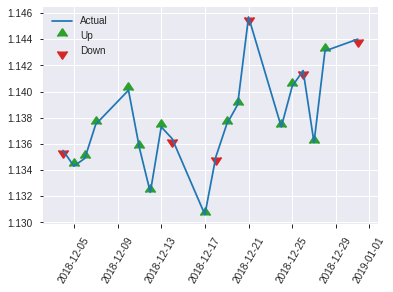


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.181622799942646
RMSE: 0.426172265571853
LogLoss: 0.5339944267052638
Mean Per-Class Error: 0.27832722832722834
AUC: 0.8006105006105007
pr_auc: 0.8103339968340649
Gini: 0.6012210012210013
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4997492546582918: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,16.0,114.0,0.1231,(16.0/130.0)
Total,84.0,172.0,0.2891,(74.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4997493,0.7549669,139.0
max f2,0.1509507,0.8674863,179.0
max f0point5,0.5459018,0.7325581,74.0
max accuracy,0.5203209,0.7226562,112.0
max precision,0.9685643,1.0,0.0
max recall,0.0094939,1.0,219.0
max specificity,0.9685643,1.0,0.0
max absolute_mcc,0.5199126,0.4488855,116.0
max min_per_class_accuracy,0.5208588,0.7,95.0
max mean_per_class_accuracy,0.5203209,0.7216728,112.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9625224,1.9692308,1.9692308,1.0,0.9651283,1.0,0.9651283,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9570345,1.9692308,1.9692308,1.0,0.9599194,1.0,0.9625238,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9564537,1.9692308,1.9692308,1.0,0.9566701,1.0,0.9610604,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9556583,1.9692308,1.9692308,1.0,0.9561010,1.0,0.9597078,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9539249,1.9692308,1.9692308,1.0,0.9546116,1.0,0.9589238,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9414341,1.9692308,1.9692308,1.0,0.9479528,1.0,0.9534383,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8874397,1.8177515,1.9187377,0.9230769,0.9222880,0.9743590,0.9430549,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.8119566,1.2118343,1.7420118,0.6153846,0.8506189,0.8846154,0.9199459,0.0615385,0.3538462,21.1834320,74.2011834
,9,0.3007812,0.5432888,1.3390769,1.6111888,0.68,0.6381197,0.8181818,0.8284439,0.1307692,0.4846154,33.9076923,61.1188811
,10,0.5,0.5208588,1.0811463,1.4,0.5490196,0.5225397,0.7109375,0.7065602,0.2153846,0.7,8.1146305,40.0000000


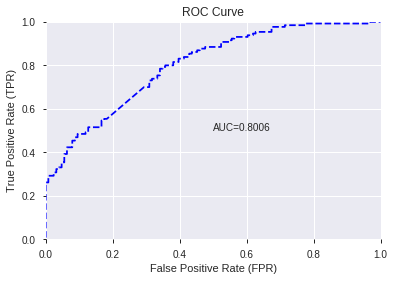

This function is available for GLM models only


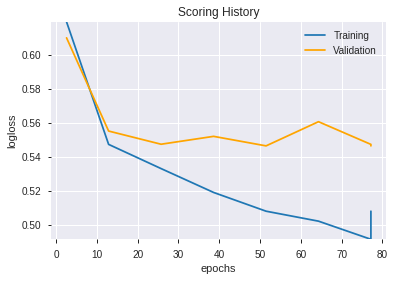

--2019-12-07 22:57:01--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.145.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.145.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_224937_model_9',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_224937_model_9',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_7_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl

['CDLRICKSHAWMAN',
 'DIV',
 'SUB',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CDLHANGINGMAN',
 'TRANGE',
 'CCI_8',
 'CDLDRAGONFLYDOJI',
 'CDLINVERTEDHAMMER',
 'CDLCLOSINGMARUBOZU',
 'CDLLONGLEGGEDDOJI',
 'CDLTAKURI',
 'is_month_end',
 'is_month_start',
 'WILLR_8',
 'ULTOSC',
 'CDLDOJI',
 'CDLHIKKAKE',
 'WILLR_12',
 'CDLBELTHOLD',
 'MINUS_DI_8',
 'days_in_month',
 'CDLSHOOTINGSTAR',
 'SAREXT',
 'weekday_name',
 'MINUS_DM_8',
 'CDLHAMMER',
 'BETA_30',
 'MINUS_DM_12',
 'PLUS_DI_14',
 'PLUS_DI_8',
 'HT_DCPERIOD',
 'STOCHF_fastd',
 'CDLSPINNINGTOP',
 'aroonup_12',
 'PLUS_DI_12',
 'STOCH_slowk',
 'MINUS_DI_14',
 'CCI_14',
 'CDLHIGHWAVE',
 'CCI_12',
 'MINUS_DI_12',
 'aroonup_8',
 'PLUS_DM_14',
 'PLUS_DM_12',
 'PLUS_DM_8',
 'AROONOSC_12',
 'CCI_20',
 'CCI_30']

In [12]:
# DeepLearning with top DeepLearning features
model_train(feature_name='DLF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_225757_model_1,0.820879,0.507667,0.251648,0.414458,0.171776


,variable,relative_importance,scaled_importance,percentage
0,MINUS_DI_12,4.189087,1.000000,0.136462
1,PLUS_DI_12,3.551979,0.847912,0.115707
2,PLUS_DM_12,2.375425,0.567051,0.077381
3,PLUS_DM_14,2.314755,0.552568,0.075404
4,MINUS_DI_14,2.310122,0.551462,0.075253
5,PLUS_DI_8,2.090562,0.499050,0.068101
6,MINUS_DI_8,2.007985,0.479337,0.065411
7,PLUS_DI_14,1.680999,0.401280,0.054759
8,CCI_8,1.108247,0.264556,0.036102
9,CCI_14,0.791844,0.189025,0.025795


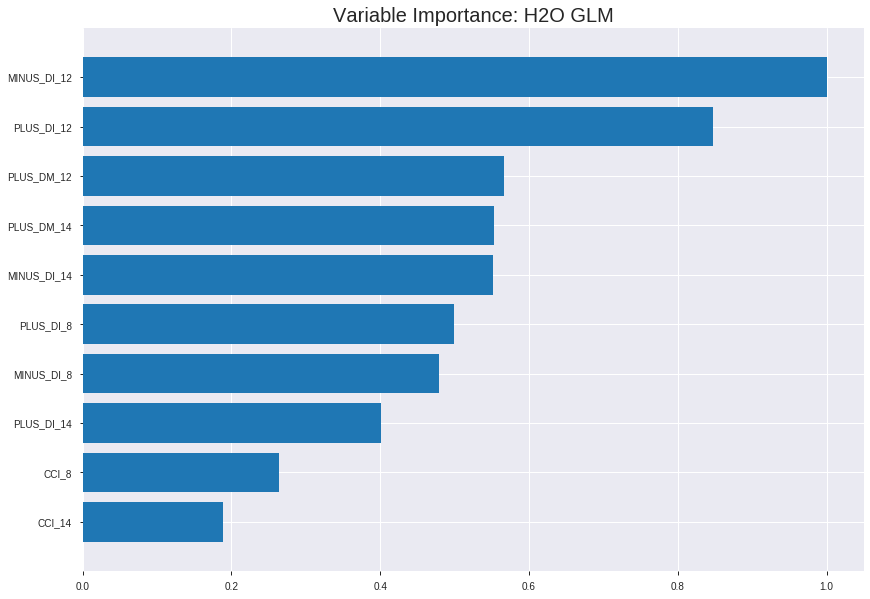

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_225757_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1811996960966861
RMSE: 0.42567557611012413
LogLoss: 0.5377232232355
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1921.822799843677
AIC: 2023.822799843677
AUC: 0.8019630832130832
pr_auc: 0.7929465163451821
Gini: 0.6039261664261664
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.39622594403342837: 


,0,1,Error,Rate
0,483.0,408.0,0.4579,(408.0/891.0)
1,115.0,781.0,0.1283,(115.0/896.0)
Total,598.0,1189.0,0.2927,(523.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3962259,0.7491607,248.0
max f2,0.1921029,0.8589017,330.0
max f0point5,0.5731113,0.7264398,164.0
max accuracy,0.4931446,0.7246782,204.0
max precision,0.9944097,1.0,0.0
max recall,0.0118581,1.0,396.0
max specificity,0.9944097,1.0,0.0
max absolute_mcc,0.4931446,0.4501409,204.0
max min_per_class_accuracy,0.5127499,0.7194164,193.0
max mean_per_class_accuracy,0.4931446,0.7245884,204.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9729704,1.8836186,1.8836186,0.9444444,0.9850026,0.9444444,0.9850026,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9602610,1.9944196,1.9390191,1.0,0.9669319,0.9722222,0.9759673,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.9466836,1.7728175,1.8836186,0.8888889,0.9533372,0.9444444,0.9684239,0.0178571,0.0569196,77.2817460,88.3618552
,4,0.0402910,0.9372841,1.8836186,1.8836186,0.9444444,0.9420568,0.9444444,0.9618322,0.0189732,0.0758929,88.3618552,88.3618552
,5,0.0503637,0.9255051,1.7728175,1.8614583,0.8888889,0.9312461,0.9333333,0.9557149,0.0178571,0.09375,77.2817460,86.1458333
,6,0.1001679,0.8752010,1.7927368,1.8272895,0.8988764,0.8998531,0.9162011,0.9279401,0.0892857,0.1830357,79.2736758,82.7289505
,7,0.1499720,0.7921272,1.6582815,1.7711637,0.8314607,0.8325666,0.8880597,0.8962675,0.0825893,0.265625,65.8281501,77.1163713
,8,0.2003358,0.7279016,1.5512153,1.7158694,0.7777778,0.7584885,0.8603352,0.8616303,0.078125,0.34375,55.1215278,71.5869413
,9,0.2999440,0.6457802,1.3893710,1.6074427,0.6966292,0.6830900,0.8059701,0.8023390,0.1383929,0.4821429,38.9370987,60.7442697
,10,0.4001119,0.5779437,1.2590470,1.5202220,0.6312849,0.6107893,0.7622378,0.7543846,0.1261161,0.6082589,25.9047037,52.0221966




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1738882709846494
RMSE: 0.4169991258799584
LogLoss: 0.5228018194429631
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497421
Residual deviance: 534.3034594707083
AIC: 636.3034594707083
AUC: 0.822288694585059
pr_auc: 0.8131695820539999
Gini: 0.6445773891701181
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41585363711205: 


,0,1,Error,Rate
0,154.0,111.0,0.4189,(111.0/265.0)
1,28.0,218.0,0.1138,(28.0/246.0)
Total,182.0,329.0,0.272,(139.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4158536,0.7582609,257.0
max f2,0.2183088,0.8439716,329.0
max f0point5,0.7051748,0.7630273,113.0
max accuracy,0.5813278,0.7475538,172.0
max precision,0.9979215,1.0,0.0
max recall,0.0187070,1.0,392.0
max specificity,0.9979215,1.0,0.0
max absolute_mcc,0.5813278,0.4961736,172.0
max min_per_class_accuracy,0.5203784,0.7320755,201.0
max mean_per_class_accuracy,0.5813278,0.7447998,172.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.60 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9777965,2.0772358,2.0772358,1.0,0.9860623,1.0,0.9860623,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9708968,2.0772358,2.0772358,1.0,0.9739155,1.0,0.9805410,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9577575,2.0772358,2.0772358,1.0,0.9665944,1.0,0.9761827,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9486386,2.0772358,2.0772358,1.0,0.9515765,1.0,0.9703241,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9418886,1.6617886,1.9973421,0.8,0.9464020,0.9615385,0.9657237,0.0162602,0.1016260,66.1788618,99.7342089
,6,0.1017613,0.8992588,1.9174484,1.9573952,0.9230769,0.9230309,0.9423077,0.9443773,0.0975610,0.1991870,91.7448405,95.7395247
,7,0.1506849,0.8564275,1.7448780,1.8883962,0.84,0.8764693,0.9090909,0.9223292,0.0853659,0.2845528,74.4878049,88.8396157
,8,0.2015656,0.7988888,1.6777674,1.8352277,0.8076923,0.8274468,0.8834951,0.8983783,0.0853659,0.3699187,67.7767355,83.5227721
,9,0.3013699,0.6774379,1.6292045,1.7669993,0.7843137,0.7342632,0.8506494,0.8440285,0.1626016,0.5325203,62.9204527,76.6999261
,10,0.4011742,0.5895523,1.1404432,1.6111243,0.5490196,0.6331925,0.7756098,0.7915766,0.1138211,0.6463415,14.0443169,61.1124331



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 22:57:58,0.000 sec,2,.16E2,51,1.3681865,1.3669654
,2019-12-07 22:57:58,0.021 sec,4,.96E1,51,1.3583975,1.3562962
,2019-12-07 22:57:58,0.037 sec,6,.6E1,51,1.3442839,1.3408117
,2019-12-07 22:57:58,0.054 sec,8,.37E1,51,1.3249863,1.3194708
,2019-12-07 22:57:58,0.072 sec,10,.23E1,51,1.3003997,1.2920259
---,---,---,---,---,---,---,---
,2019-12-07 22:57:58,0.335 sec,51,.1E-3,51,1.0778188,1.0494788
,2019-12-07 22:57:58,0.352 sec,53,.65E-4,51,1.0770838,1.0484410
,2019-12-07 22:57:58,0.369 sec,55,.4E-4,51,1.0764364,1.0474216
,2019-12-07 22:57:58,0.384 sec,57,.25E-4,51,1.0758861,1.0464629



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.75)

('F1', 0.7762237762237763)

('auc', 0.8208791208791208)

('logloss', 0.5076666742331308)

('mean_per_class_error', 0.2515262515262515)

('rmse', 0.4144582559294955)

('mse', 0.17177564590811917)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


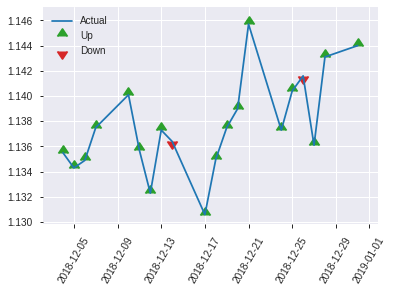


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.17177564590811917
RMSE: 0.4144582559294955
LogLoss: 0.5076666742331308
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.8709766655013
Residual deviance: 259.925337207363
AIC: 361.925337207363
AUC: 0.8208791208791208
pr_auc: 0.8317978131334045
Gini: 0.6417582417582417
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4234032166735385: 


,0,1,Error,Rate
0,81.0,45.0,0.3571,(45.0/126.0)
1,19.0,111.0,0.1462,(19.0/130.0)
Total,100.0,156.0,0.25,(64.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4234032,0.7762238,155.0
max f2,0.2355384,0.8683853,216.0
max f0point5,0.6472394,0.7587065,67.0
max accuracy,0.4301388,0.75,153.0
max precision,0.9820669,1.0,0.0
max recall,0.0607308,1.0,240.0
max specificity,0.9820669,1.0,0.0
max absolute_mcc,0.4234032,0.5089694,155.0
max min_per_class_accuracy,0.4950790,0.7301587,128.0
max mean_per_class_accuracy,0.4301388,0.7484737,153.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.72 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9667225,1.9692308,1.9692308,1.0,0.9768572,1.0,0.9768572,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9537359,1.9692308,1.9692308,1.0,0.9589686,1.0,0.9679129,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9487832,1.9692308,1.9692308,1.0,0.9534817,1.0,0.9643051,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9415556,1.9692308,1.9692308,1.0,0.9447587,1.0,0.9589742,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9335367,1.9692308,1.9692308,1.0,0.9396657,1.0,0.9560037,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8684589,1.9692308,1.9692308,1.0,0.9074619,1.0,0.9317328,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7863305,1.8177515,1.9187377,0.9230769,0.8294950,0.9743590,0.8976535,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7201221,1.5147929,1.8177515,0.7692308,0.7575102,0.9230769,0.8626177,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.6190702,1.3390769,1.6623377,0.68,0.6624222,0.8441558,0.7976192,0.1307692,0.5,33.9076923,66.2337662
,10,0.4023438,0.5612486,1.2118343,1.5486184,0.6153846,0.5853525,0.7864078,0.7440373,0.1230769,0.6230769,21.1834320,54.8618372


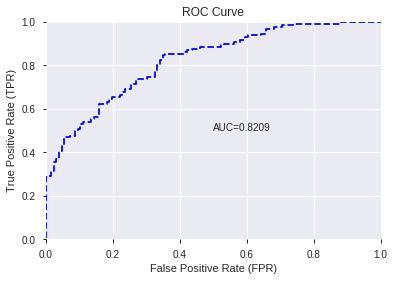

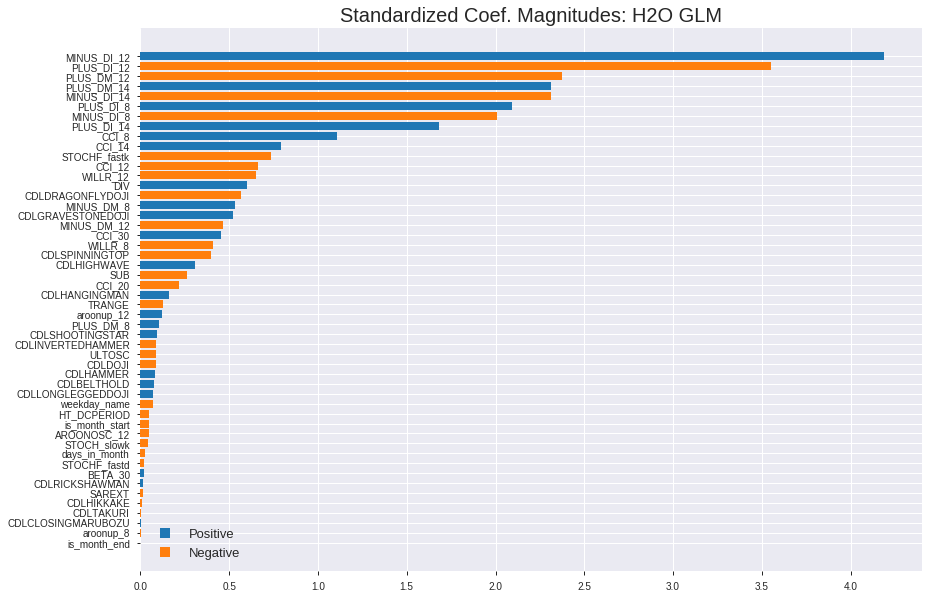

'log_likelihood'
--2019-12-07 22:58:06--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.162.19
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.162.19|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_225757_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_225757_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_12_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_12_s

['MINUS_DI_12',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'PLUS_DM_14',
 'MINUS_DI_14',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'PLUS_DI_14',
 'CCI_8',
 'CCI_14',
 'STOCHF_fastk',
 'CCI_12',
 'WILLR_12',
 'DIV',
 'CDLDRAGONFLYDOJI',
 'MINUS_DM_8',
 'CDLGRAVESTONEDOJI',
 'MINUS_DM_12',
 'CCI_30',
 'WILLR_8',
 'CDLSPINNINGTOP',
 'CDLHIGHWAVE',
 'SUB',
 'CCI_20',
 'CDLHANGINGMAN',
 'TRANGE',
 'aroonup_12',
 'PLUS_DM_8',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'ULTOSC',
 'CDLDOJI',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'CDLLONGLEGGEDDOJI',
 'weekday_name',
 'HT_DCPERIOD',
 'is_month_start',
 'AROONOSC_12',
 'STOCH_slowk',
 'days_in_month',
 'STOCHF_fastd',
 'BETA_30',
 'CDLRICKSHAWMAN',
 'SAREXT',
 'CDLHIKKAKE',
 'CDLTAKURI',
 'CDLCLOSINGMARUBOZU',
 'aroonup_8',
 'is_month_end']

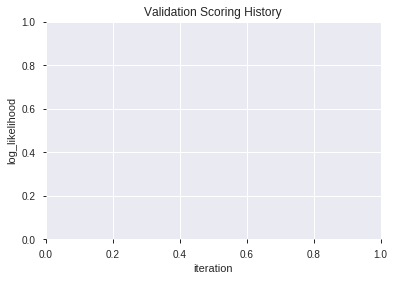

In [13]:
# GLM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20191207_225902,0.822711,0.510594,0.300733,0.413593,0.171059
1,XGBoost_3_AutoML_20191207_225902,0.821978,0.512241,0.297253,0.415280,0.172457
2,XGBoost_grid_1_AutoML_20191207_225902_model_7,0.821856,0.512459,0.301099,0.414860,0.172109
3,XGBoost_2_AutoML_20191207_225902,0.821795,0.514986,0.297131,0.415448,0.172597
4,XGBoost_grid_1_AutoML_20191207_225902_model_4,0.816361,0.525513,0.304701,0.419695,0.176144
5,XGBoost_grid_1_AutoML_20191207_225902_model_3,0.815690,0.521337,0.296642,0.418751,0.175353
6,XGBoost_grid_1_AutoML_20191207_225902_model_6,0.813858,0.522629,0.300366,0.420448,0.176777
7,XGBoost_grid_1_AutoML_20191207_225902_model_2,0.812515,0.526925,0.320940,0.422085,0.178156
8,XGBoost_grid_1_AutoML_20191207_225902_model_5,0.807082,0.521518,0.287729,0.421688,0.177821
9,XGBoost_grid_1_AutoML_20191207_225902_model_1,0.806716,0.530098,0.300855,0.422899,0.178844


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,778.458496,1.000000,0.074784
1,CDLTAKURI,676.284119,0.868748,0.064969
2,STOCHF_fastk,600.784058,0.771761,0.057716
3,CDLDRAGONFLYDOJI,566.076111,0.727176,0.054381
4,WILLR_8,536.473328,0.689148,0.051538
5,WILLR_12,509.819366,0.654909,0.048977
6,CCI_8,504.074127,0.647529,0.048425
7,ULTOSC,419.176605,0.538470,0.040269
8,TRANGE,308.087799,0.395767,0.029597
9,STOCH_slowk,305.709534,0.392711,0.029369


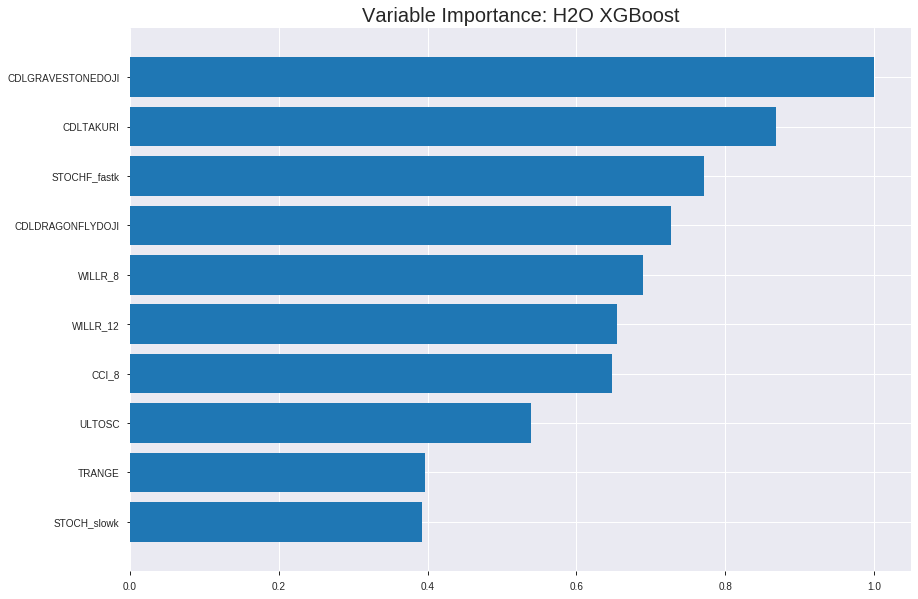

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20191207_225902


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.10739047923686312
RMSE: 0.3277048660561255
LogLoss: 0.3676571494351501
Mean Per-Class Error: 0.102402371933622
AUC: 0.9561638207471541
pr_auc: 0.9533542929301057
Gini: 0.9123276414943082
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4618825415770213: 


,0,1,Error,Rate
0,752.0,139.0,0.156,(139.0/891.0)
1,51.0,845.0,0.0569,(51.0/896.0)
Total,803.0,984.0,0.1063,(190.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4618825,0.8989362,215.0
max f2,0.4320076,0.9344581,229.0
max f0point5,0.5722164,0.9127176,171.0
max accuracy,0.5189166,0.8975937,191.0
max precision,0.9533994,1.0,0.0
max recall,0.1246031,1.0,359.0
max specificity,0.9533994,1.0,0.0
max absolute_mcc,0.5189166,0.7951923,191.0
max min_per_class_accuracy,0.5189166,0.8962054,191.0
max mean_per_class_accuracy,0.5189166,0.8975976,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9376615,1.9944196,1.9944196,1.0,0.9454388,1.0,0.9454388,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9295145,1.9944196,1.9944196,1.0,0.9338027,1.0,0.9396208,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9188644,1.9944196,1.9944196,1.0,0.9244245,1.0,0.9345553,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9085807,1.9944196,1.9944196,1.0,0.9145618,1.0,0.9295570,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9021491,1.9944196,1.9944196,1.0,0.9057575,1.0,0.9247971,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8609203,1.9944196,1.9944196,1.0,0.8807726,1.0,0.9029078,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8235569,1.9271920,1.9720940,0.9662921,0.8404588,0.9888060,0.8821691,0.0959821,0.2957589,92.7192014,97.2094050
,8,0.2003358,0.7853502,1.8614583,1.9442806,0.9333333,0.8056589,0.9748603,0.8629347,0.09375,0.3895089,86.1458333,94.4280602
,9,0.2999440,0.7030422,1.8935782,1.9274429,0.9494382,0.7448866,0.9664179,0.8237322,0.1886161,0.578125,89.3578200,92.7442864
,10,0.4001119,0.6198106,1.7492954,1.8828437,0.8770950,0.6626625,0.9440559,0.7834084,0.1752232,0.7533482,74.9295441,88.2843719




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1779530292589575
RMSE: 0.4218447928550944
LogLoss: 0.5303608289974119
Mean Per-Class Error: 0.2567801810093573
AUC: 0.8150176407424451
pr_auc: 0.8009634212670782
Gini: 0.6300352814848902
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3797365128993988: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,25.0,221.0,0.1016,(25.0/246.0)
Total,171.0,340.0,0.2818,(144.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3797365,0.7542662,269.0
max f2,0.3069145,0.8388521,291.0
max f0point5,0.7301323,0.7424594,119.0
max accuracy,0.5398372,0.7416830,202.0
max precision,0.9492476,1.0,0.0
max recall,0.0883091,1.0,382.0
max specificity,0.9492476,1.0,0.0
max absolute_mcc,0.5027316,0.4871201,215.0
max min_per_class_accuracy,0.5482795,0.7358491,198.0
max mean_per_class_accuracy,0.5027316,0.7432198,215.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 52.37 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9276722,2.0772358,2.0772358,1.0,0.9366295,1.0,0.9366295,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9158069,2.0772358,2.0772358,1.0,0.9219594,1.0,0.9299613,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9100449,2.0772358,2.0772358,1.0,0.9119664,1.0,0.9243379,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9061624,1.6617886,1.9783198,0.8,0.9075870,0.9523810,0.9203496,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.9025208,2.0772358,1.9973421,1.0,0.9038198,0.9615385,0.9171708,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8814099,1.8375547,1.9174484,0.8846154,0.8906094,0.9230769,0.9038901,0.0934959,0.1951220,83.7554722,91.7448405
,7,0.1506849,0.8467402,1.9941463,1.9423503,0.96,0.8668548,0.9350649,0.8918657,0.0975610,0.2926829,99.4146341,94.2350333
,8,0.2015656,0.8110799,1.5179800,1.8352277,0.7307692,0.8306390,0.8834951,0.8764104,0.0772358,0.3699187,51.7979987,83.5227721
,9,0.3013699,0.7301323,1.5070142,1.7265336,0.7254902,0.7668214,0.8311688,0.8401179,0.1504065,0.5203252,50.7014188,72.6533629
,10,0.4011742,0.6368909,1.0182528,1.5503272,0.4901961,0.6781596,0.7463415,0.7998259,0.1016260,0.6219512,1.8252830,55.0327186



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 22:59:03,0.257 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 22:59:03,0.390 sec,5.0,0.4677905,0.6303504,0.8728211,0.8416485,1.9944196,0.2165641,0.4747977,0.6436315,0.7916782,0.7565860,1.6995565,0.2876712
,2019-12-07 22:59:03,0.435 sec,10.0,0.4456019,0.5880424,0.8826722,0.8731398,1.9944196,0.2098489,0.4594707,0.6136057,0.7916245,0.7685506,2.0772358,0.2896282
,2019-12-07 22:59:03,0.479 sec,15.0,0.4265288,0.5516415,0.8885576,0.8791628,1.9944196,0.1902630,0.4463546,0.5873379,0.7994324,0.7798505,2.0772358,0.2935421
,2019-12-07 22:59:03,0.526 sec,20.0,0.4115944,0.5229725,0.8978575,0.8892199,1.9944196,0.1841074,0.4386822,0.5712039,0.8029069,0.7937235,2.0772358,0.2700587
,2019-12-07 22:59:03,0.585 sec,25.0,0.3995128,0.4996777,0.9043360,0.8958185,1.9944196,0.1773923,0.4329827,0.5587973,0.8060439,0.7959096,2.0772358,0.2974560
,2019-12-07 22:59:03,0.646 sec,30.0,0.3892843,0.4800232,0.9126821,0.9048740,1.9944196,0.1622832,0.4300300,0.5518424,0.8066958,0.7905801,2.0772358,0.2915851
,2019-12-07 22:59:03,0.703 sec,35.0,0.3799799,0.4622302,0.9184065,0.9101339,1.9944196,0.1611640,0.4268859,0.5445904,0.8105921,0.7950122,2.0772358,0.2602740
,2019-12-07 22:59:03,0.760 sec,40.0,0.3722041,0.4473125,0.9241792,0.9177714,1.9944196,0.1499720,0.4253725,0.5406510,0.8122028,0.7986881,2.0772358,0.2661448
,2019-12-07 22:59:03,0.819 sec,45.0,0.3648772,0.4338390,0.9302988,0.9255445,1.9944196,0.1460548,0.4233079,0.5359008,0.8148566,0.8030672,2.0772358,0.2720157


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,778.4584961,1.0,0.0747845
CDLTAKURI,676.2841187,0.8687478,0.0649688
STOCHF_fastk,600.7840576,0.7717612,0.0577158
CDLDRAGONFLYDOJI,566.0761108,0.7271757,0.0543814
WILLR_8,536.4733276,0.6891483,0.0515376
---,---,---,---
CDLDOJI,25.3409958,0.0325528,0.0024344
CDLLONGLEGGEDDOJI,10.8396158,0.0139245,0.0010413
is_month_start,3.0132699,0.0038708,0.0002895
is_month_end,2.9707463,0.0038162,0.0002854



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.763975155279503)

('auc', 0.8227106227106227)

('logloss', 0.5105943388700034)

('mean_per_class_error', 0.25378510378510377)

('rmse', 0.41359271868119085)

('mse', 0.17105893694609867)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


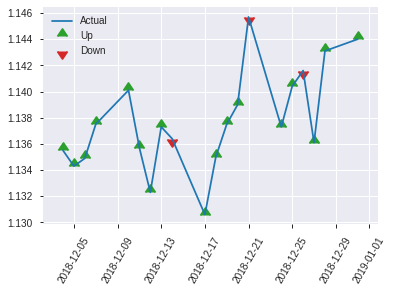


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17105893694609867
RMSE: 0.41359271868119085
LogLoss: 0.5105943388700034
Mean Per-Class Error: 0.25378510378510377
AUC: 0.8227106227106227
pr_auc: 0.8316500928484581
Gini: 0.6454212454212453
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33299320936203003: 


,0,1,Error,Rate
0,57.0,69.0,0.5476,(69.0/126.0)
1,7.0,123.0,0.0538,(7.0/130.0)
Total,64.0,192.0,0.2969,(76.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3329932,0.7639752,191.0
max f2,0.2752349,0.8713693,202.0
max f0point5,0.6084209,0.7677903,100.0
max accuracy,0.5054057,0.7460938,126.0
max precision,0.9416023,1.0,0.0
max recall,0.0825847,1.0,245.0
max specificity,0.9416023,1.0,0.0
max absolute_mcc,0.5904645,0.4944785,105.0
max min_per_class_accuracy,0.4902426,0.7460317,128.0
max mean_per_class_accuracy,0.5054057,0.7462149,126.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9332660,1.9692308,1.9692308,1.0,0.9385634,1.0,0.9385634,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9188578,1.9692308,1.9692308,1.0,0.9274238,1.0,0.9329936,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9110082,1.9692308,1.9692308,1.0,0.9130185,1.0,0.9279998,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9043337,1.9692308,1.9692308,1.0,0.9069828,1.0,0.9222679,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8990438,1.9692308,1.9692308,1.0,0.9002571,1.0,0.9188816,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8707180,1.9692308,1.9692308,1.0,0.8869403,1.0,0.9029110,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8152791,1.6662722,1.8682446,0.8461538,0.8368680,0.9487179,0.8808966,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.7614888,1.6662722,1.8177515,0.8461538,0.7858375,0.9230769,0.8571319,0.0846154,0.3692308,66.6272189,81.7751479
,9,0.3007812,0.6753415,1.2603077,1.6367632,0.64,0.7153954,0.8311688,0.8111135,0.1230769,0.4923077,26.0307692,63.6763237
,10,0.4023438,0.6078265,1.4390533,1.5868559,0.7307692,0.6336929,0.8058252,0.7663277,0.1461538,0.6384615,43.9053254,58.6855863


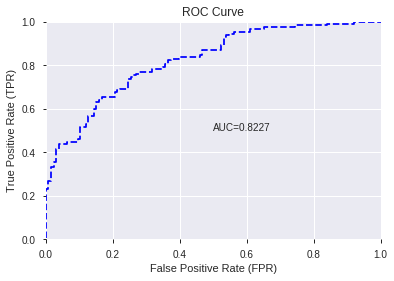

This function is available for GLM models only


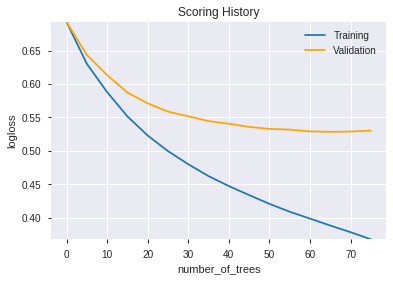

--2019-12-07 22:59:23--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.38.36
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.38.36|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.findInclusiveNa(SharedTreeNode.java:129)
	at hex.genmodel.algos.tree.SharedTreeNode.calculateChildInclusiveNa(SharedTreeNode.java:133)
	at hex.genmodel.algos.tree.SharedTreeNode.setLeftChild(SharedTreeNode.java:207)
	at hex.genmodel.algos.tree.SharedTreeSubgraph.makeLeftEdge(SharedTreeSubgraph.java:82)
	at hex.genmodel.algos.tree.SharedTreeSubgraph.makeLeftChildNode(

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20191207_225902',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20191207_225902',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_17_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_17_sid_8e77',
   'type

['CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'WILLR_8',
 'WILLR_12',
 'CCI_8',
 'ULTOSC',
 'TRANGE',
 'STOCH_slowk',
 'SAREXT',
 'HT_DCPERIOD',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'BETA_30',
 'CCI_30',
 'DIV',
 'PLUS_DM_8',
 'MINUS_DM_8',
 'CCI_20',
 'CCI_12',
 'MINUS_DM_12',
 'aroonup_12',
 'aroonup_8',
 'MINUS_DI_12',
 'PLUS_DM_14',
 'CCI_14',
 'MINUS_DI_14',
 'PLUS_DM_12',
 'SUB',
 'PLUS_DI_14',
 'PLUS_DI_12',
 'STOCHF_fastd',
 'weekday_name',
 'AROONOSC_12',
 'days_in_month',
 'CDLSPINNINGTOP',
 'CDLRICKSHAWMAN',
 'CDLHIGHWAVE',
 'CDLDOJI',
 'CDLLONGLEGGEDDOJI',
 'is_month_start',
 'is_month_end',
 'CDLHAMMER']

In [14]:
# XGBoost with top DeepLearning features
model_train(feature_name='DLF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [15]:
# DRF with top DeepLearning features
model_train(feature_name='DLF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191207_230130,0.822222,0.519902,0.242613,0.417366,0.174195
1,GBM_2_AutoML_20191207_230130,0.817277,0.513780,0.280159,0.416770,0.173697
2,GBM_grid_1_AutoML_20191207_230130_model_5,0.810379,0.685048,0.252381,0.495935,0.245951
3,GBM_3_AutoML_20191207_230130,0.809768,0.520437,0.308059,0.420661,0.176956
4,GBM_grid_1_AutoML_20191207_230130_model_4,0.808791,0.649440,0.288095,0.477784,0.228278
5,GBM_grid_1_AutoML_20191207_230130_model_1,0.807509,0.580347,0.320818,0.443193,0.196420
6,GBM_4_AutoML_20191207_230130,0.807143,0.527331,0.247436,0.424789,0.180446
7,GBM_grid_1_AutoML_20191207_230130_model_2,0.801099,0.599833,0.332357,0.452983,0.205194
8,GBM_1_AutoML_20191207_230130,0.797985,0.533937,0.299267,0.426441,0.181852
9,GBM_grid_1_AutoML_20191207_230130_model_3,0.773260,0.679652,0.315385,0.463239,0.214590


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,123.803902,1.000000,0.144650
1,CDLGRAVESTONEDOJI,113.953056,0.920432,0.133140
2,CDLDRAGONFLYDOJI,99.339211,0.802392,0.116066
3,STOCHF_fastk,76.632011,0.618979,0.089535
4,CCI_8,55.061317,0.444746,0.064333
5,WILLR_8,53.721306,0.433923,0.062767
6,WILLR_12,45.002918,0.363502,0.052581
7,ULTOSC,26.781744,0.216324,0.031291
8,CCI_12,24.911524,0.201218,0.029106
9,aroonup_12,24.682215,0.199365,0.028838


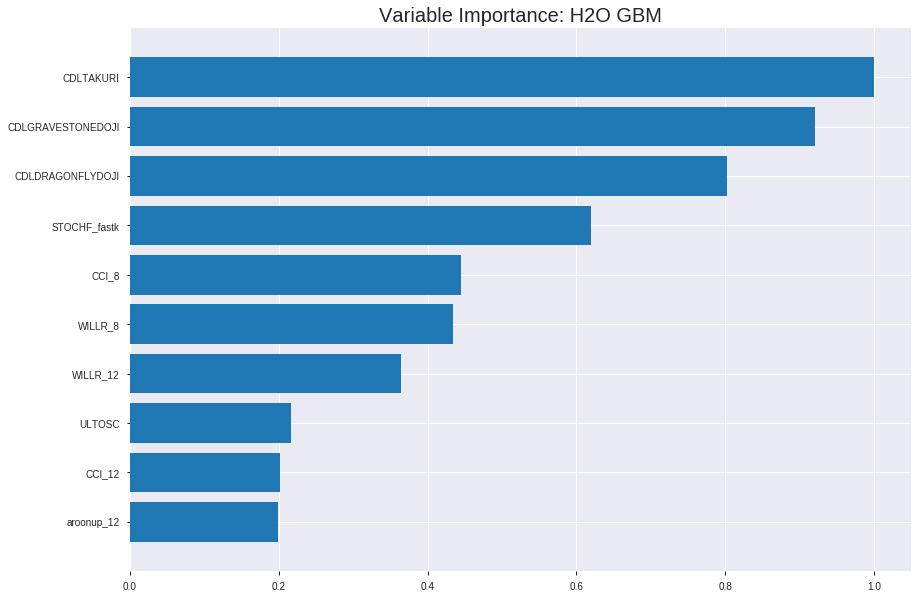

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191207_230130


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.1549636235538393
RMSE: 0.3936541928569278
LogLoss: 0.47930723471105396
Mean Per-Class Error: 0.21066380571588905
AUC: 0.8712691147586981
pr_auc: 0.8610406780963143
Gini: 0.7425382295173961
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45114721909479627: 


,0,1,Error,Rate
0,619.0,272.0,0.3053,(272.0/891.0)
1,104.0,792.0,0.1161,(104.0/896.0)
Total,723.0,1064.0,0.2104,(376.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4511472,0.8081633,227.0
max f2,0.3820552,0.8764816,262.0
max f0point5,0.5896819,0.8116178,154.0
max accuracy,0.4561753,0.7895915,225.0
max precision,0.9285464,1.0,0.0
max recall,0.0907543,1.0,382.0
max specificity,0.9285464,1.0,0.0
max absolute_mcc,0.4511472,0.5894834,227.0
max min_per_class_accuracy,0.5108745,0.7867565,194.0
max mean_per_class_accuracy,0.4561753,0.7893362,225.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.18 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9106867,1.9944196,1.9944196,1.0,0.9168376,1.0,0.9168376,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8976057,1.8836186,1.9390191,0.9444444,0.9035026,0.9722222,0.9101701,0.0189732,0.0390625,88.3618552,93.9019097
,3,0.0302182,0.8914300,1.8836186,1.9205522,0.9444444,0.8943481,0.9629630,0.9048961,0.0189732,0.0580357,88.3618552,92.0552249
,4,0.0402910,0.8825170,1.7728175,1.8836186,0.8888889,0.8864380,0.9444444,0.9002816,0.0178571,0.0758929,77.2817460,88.3618552
,5,0.0503637,0.8746087,1.9944196,1.9057788,1.0,0.8784650,0.9555556,0.8959182,0.0200893,0.0959821,99.4419643,90.5778770
,6,0.1001679,0.8349934,1.9271920,1.9164256,0.9662921,0.8552942,0.9608939,0.8757197,0.0959821,0.1919643,92.7192014,91.6425579
,7,0.1499720,0.7872873,1.8151460,1.8827917,0.9101124,0.8124146,0.9440299,0.8546967,0.0904018,0.2823661,81.5145967,88.2791678
,8,0.2003358,0.7379733,1.6620164,1.8272895,0.8333333,0.7608119,0.9162011,0.8310944,0.0837054,0.3660714,66.2016369,82.7289505
,9,0.2999440,0.6473888,1.6246677,1.7600009,0.8146067,0.6900338,0.8824627,0.7842497,0.1618304,0.5279018,62.4667687,76.0000916
,10,0.4001119,0.5832114,1.4930292,1.6931646,0.7486034,0.6120736,0.8489510,0.7411454,0.1495536,0.6774554,49.3029230,69.3164648




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17741484039417693
RMSE: 0.42120641067554626
LogLoss: 0.5294051762719533
Mean Per-Class Error: 0.26043104770670344
AUC: 0.8138057984353428
pr_auc: 0.7997631560329116
Gini: 0.6276115968706857
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.44487092412922047: 


,0,1,Error,Rate
0,163.0,102.0,0.3849,(102.0/265.0)
1,38.0,208.0,0.1545,(38.0/246.0)
Total,201.0,310.0,0.274,(140.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4448709,0.7482014,235.0
max f2,0.2355416,0.8469751,327.0
max f0point5,0.6169592,0.7574257,144.0
max accuracy,0.6169592,0.7436399,144.0
max precision,0.9293976,1.0,0.0
max recall,0.1021807,1.0,379.0
max specificity,0.9293976,1.0,0.0
max absolute_mcc,0.6169592,0.4942318,144.0
max min_per_class_accuracy,0.5235985,0.7195122,189.0
max mean_per_class_accuracy,0.6095622,0.7395690,147.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.54 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9069738,2.0772358,2.0772358,1.0,0.9157969,1.0,0.9157969,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9004009,1.6617886,1.8883962,0.8,0.9038846,0.9090909,0.9103822,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.8972669,2.0772358,1.9474085,1.0,0.8988694,0.9375,0.9067845,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.8890585,1.6617886,1.8794038,0.8,0.8928703,0.9047619,0.9034716,0.0162602,0.0772358,66.1788618,87.9403794
,5,0.0508806,0.8856469,2.0772358,1.9174484,1.0,0.8875114,0.9230769,0.9004023,0.0203252,0.0975610,107.7235772,91.7448405
,6,0.1017613,0.8585590,1.8375547,1.8775016,0.8846154,0.8727466,0.9038462,0.8865744,0.0934959,0.1910569,83.7554722,87.7501563
,7,0.1506849,0.8299917,2.0772358,1.9423503,1.0,0.8457937,0.9350649,0.8733339,0.1016260,0.2926829,107.7235772,94.2350333
,8,0.2015656,0.7872720,1.4380863,1.8150604,0.6923077,0.8042826,0.8737864,0.8559035,0.0731707,0.3658537,43.8086304,81.5060384
,9,0.3013699,0.6929160,1.5477443,1.7265336,0.7450980,0.7385602,0.8311688,0.8170431,0.1544715,0.5203252,54.7744301,72.6533629
,10,0.4011742,0.5973880,1.1811733,1.5908586,0.5686275,0.6387540,0.7658537,0.7726882,0.1178862,0.6382114,18.1173282,59.0858616



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:01:35,0.002 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-07 23:01:35,0.046 sec,5.0,0.4594575,0.6134016,0.7998393,0.6074108,1.7839532,0.2853945,0.4567327,0.6080772,0.8013882,0.5217906,1.9153732,0.3150685
,2019-12-07 23:01:35,0.093 sec,10.0,0.4381143,0.5702232,0.8173200,0.7705704,1.8804528,0.2501399,0.4367937,0.5670167,0.8099632,0.7291152,1.7804878,0.2974560
,2019-12-07 23:01:36,0.139 sec,15.0,0.4263840,0.5455289,0.8276070,0.8012792,1.8044749,0.2512591,0.4283933,0.5478670,0.8143580,0.7844934,2.0772358,0.2837573
,2019-12-07 23:01:36,0.182 sec,20.0,0.4179743,0.5279624,0.8363346,0.8246433,1.8836186,0.2434247,0.4249525,0.5398715,0.8145958,0.7920203,2.0772358,0.2759295
,2019-12-07 23:01:36,0.228 sec,25.0,0.4110626,0.5137431,0.8459151,0.8351957,1.8836186,0.2288752,0.4224042,0.5333802,0.8167127,0.8022239,2.0772358,0.2641879
,2019-12-07 23:01:36,0.270 sec,30.0,0.4048853,0.5014271,0.8546433,0.8408039,1.9944196,0.2255176,0.4218713,0.5318175,0.8148259,0.8005959,2.0772358,0.2739726
,2019-12-07 23:01:36,0.315 sec,35.0,0.3990017,0.4896776,0.8636689,0.8543082,1.8836186,0.2199217,0.4215152,0.5308018,0.8139592,0.7961734,2.0772358,0.2759295
,2019-12-07 23:01:36,0.368 sec,40.0,0.3936542,0.4793072,0.8712691,0.8610407,1.9944196,0.2104085,0.4212064,0.5294052,0.8138058,0.7997632,2.0772358,0.2739726


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,123.8039017,1.0,0.1446500
CDLGRAVESTONEDOJI,113.9530563,0.9204319,0.1331405
CDLDRAGONFLYDOJI,99.3392105,0.8023916,0.1160659
STOCHF_fastk,76.6320114,0.6189790,0.0895353
CCI_8,55.0613174,0.4447462,0.0643325
---,---,---,---
CDLHANGINGMAN,0.0,0.0,0.0
CDLHIKKAKE,0.0,0.0,0.0
CDLINVERTEDHAMMER,0.0,0.0,0.0
CDLLONGLEGGEDDOJI,0.0,0.0,0.0



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7578125)

('F1', 0.7669172932330828)

('auc', 0.8222222222222222)

('logloss', 0.5199023082229305)

('mean_per_class_error', 0.24224664224664227)

('rmse', 0.4173663658208168)

('mse', 0.17419468331847587)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


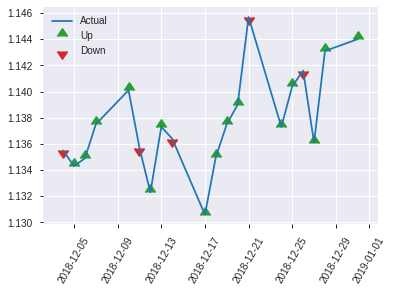


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17419468331847587
RMSE: 0.4173663658208168
LogLoss: 0.5199023082229305
Mean Per-Class Error: 0.24224664224664227
AUC: 0.8222222222222222
pr_auc: 0.8240485783272695
Gini: 0.6444444444444444
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47059713518922097: 


,0,1,Error,Rate
0,92.0,34.0,0.2698,(34.0/126.0)
1,28.0,102.0,0.2154,(28.0/130.0)
Total,120.0,136.0,0.2422,(62.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4705971,0.7669173,135.0
max f2,0.3156568,0.8683473,193.0
max f0point5,0.4824618,0.7615385,129.0
max accuracy,0.4824618,0.7578125,129.0
max precision,0.9261191,1.0,0.0
max recall,0.1283473,1.0,235.0
max specificity,0.9261191,1.0,0.0
max absolute_mcc,0.4705971,0.5157195,135.0
max min_per_class_accuracy,0.4824618,0.7539683,129.0
max mean_per_class_accuracy,0.4824618,0.7577534,129.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9126499,1.9692308,1.9692308,1.0,0.9184255,1.0,0.9184255,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9002874,1.9692308,1.9692308,1.0,0.9056965,1.0,0.9120610,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8972894,1.9692308,1.9692308,1.0,0.8979162,1.0,0.9085248,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8777892,1.9692308,1.9692308,1.0,0.8880472,1.0,0.9029400,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8732226,1.9692308,1.9692308,1.0,0.8752220,1.0,0.8986757,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8271112,1.8177515,1.8934911,0.9230769,0.8508324,0.9615385,0.8747541,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.7777122,1.9692308,1.9187377,1.0,0.8018699,0.9743590,0.8504593,0.1,0.2923077,96.9230769,91.8737673
,8,0.203125,0.7229295,1.3633136,1.7798817,0.6923077,0.7418080,0.9038462,0.8232965,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.5950694,1.1815385,1.5856144,0.6,0.6491254,0.8051948,0.7667474,0.1153846,0.4769231,18.1538462,58.5614386
,10,0.4023438,0.5425900,1.3633136,1.5294996,0.6923077,0.5681593,0.7766990,0.7166184,0.1384615,0.6153846,36.3313609,52.9499627


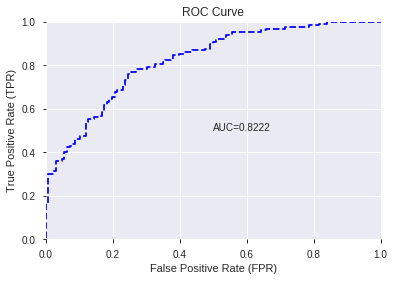

This function is available for GLM models only


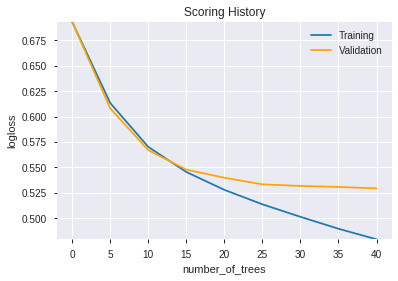

--2019-12-07 23:01:48--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.187.51
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.187.51|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1573.0
            depth:       1
            colId:       27
            colName:     STOCHF_fastk
            leftward:    true
            naVsRest:    false
            splitVal:    0.51171875
            isBitset:    false
            predValue:   0.058677305
            squaredErr:  387.57278
            leftChild:   Node 3
            r

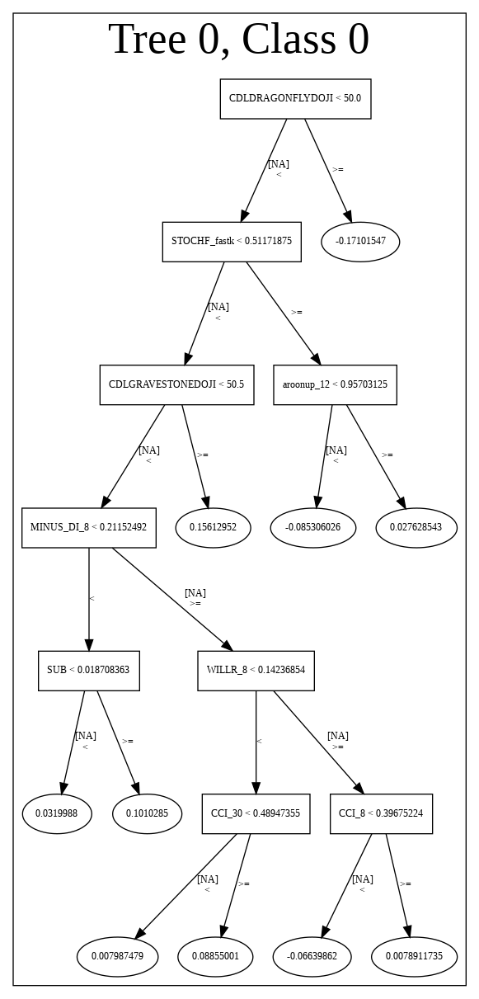

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191207_230130',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191207_230130',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_27_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_27_sid_8e77',
   'type': 'Key<

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'WILLR_12',
 'ULTOSC',
 'CCI_12',
 'aroonup_12',
 'MINUS_DI_8',
 'aroonup_8',
 'CCI_14',
 'HT_DCPERIOD',
 'CCI_20',
 'STOCHF_fastd',
 'MINUS_DM_12',
 'PLUS_DI_8',
 'SUB',
 'CCI_30',
 'BETA_30',
 'PLUS_DM_14',
 'PLUS_DI_12',
 'STOCH_slowk',
 'PLUS_DM_12',
 'TRANGE',
 'CDLHIGHWAVE',
 'SAREXT',
 'DIV',
 'days_in_month',
 'PLUS_DM_8',
 'CDLSPINNINGTOP',
 'MINUS_DI_14',
 'PLUS_DI_14',
 'AROONOSC_12',
 'weekday_name',
 'MINUS_DI_12',
 'CDLRICKSHAWMAN',
 'MINUS_DM_8',
 'is_month_end',
 'is_month_start',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDOJI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLHIKKAKE',
 'CDLINVERTEDHAMMER',
 'CDLLONGLEGGEDDOJI',
 'CDLSHOOTINGSTAR']

In [16]:
# GBM with top DeepLearning features
model_train(feature_name='DLF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [17]:
# StackedEnsemble with top DeepLearning features
model_train(feature_name='DLF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_1_AutoML_20191207_230245,0.822711,0.510594,0.300733,0.413593,0.171059
1,GBM_5_AutoML_20191207_230245,0.822222,0.519902,0.242613,0.417366,0.174195
2,XGBoost_3_AutoML_20191207_230245,0.821978,0.512241,0.297253,0.415280,0.172457
3,XGBoost_2_AutoML_20191207_230245,0.821795,0.514986,0.297131,0.415448,0.172597
4,GLM_grid_1_AutoML_20191207_230245_model_1,0.820879,0.507667,0.251648,0.414458,0.171776
5,GBM_2_AutoML_20191207_230245,0.817277,0.513780,0.280159,0.416770,0.173697
6,GBM_3_AutoML_20191207_230245,0.809768,0.520437,0.308059,0.420661,0.176956
7,GBM_4_AutoML_20191207_230245,0.807143,0.527331,0.247436,0.424789,0.180446
8,GBM_1_AutoML_20191207_230245,0.797985,0.533937,0.299267,0.426441,0.181852
9,DRF_1_AutoML_20191207_230245,0.774176,0.556586,0.327411,0.437994,0.191839


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,778.458496,1.000000,0.074784
1,CDLTAKURI,676.284119,0.868748,0.064969
2,STOCHF_fastk,600.784058,0.771761,0.057716
3,CDLDRAGONFLYDOJI,566.076111,0.727176,0.054381
4,WILLR_8,536.473328,0.689148,0.051538
5,WILLR_12,509.819366,0.654909,0.048977
6,CCI_8,504.074127,0.647529,0.048425
7,ULTOSC,419.176605,0.538470,0.040269
8,TRANGE,308.087799,0.395767,0.029597
9,STOCH_slowk,305.709534,0.392711,0.029369


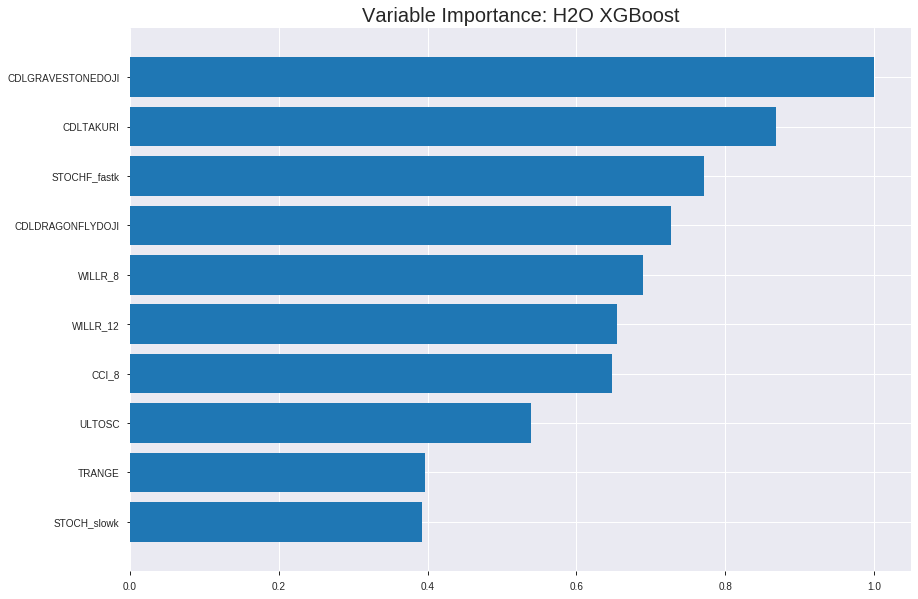

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_20191207_230245


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.10739047923686312
RMSE: 0.3277048660561255
LogLoss: 0.3676571494351501
Mean Per-Class Error: 0.102402371933622
AUC: 0.9561638207471541
pr_auc: 0.9533542929301057
Gini: 0.9123276414943082
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4618825415770213: 


,0,1,Error,Rate
0,752.0,139.0,0.156,(139.0/891.0)
1,51.0,845.0,0.0569,(51.0/896.0)
Total,803.0,984.0,0.1063,(190.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4618825,0.8989362,215.0
max f2,0.4320076,0.9344581,229.0
max f0point5,0.5722164,0.9127176,171.0
max accuracy,0.5189166,0.8975937,191.0
max precision,0.9533994,1.0,0.0
max recall,0.1246031,1.0,359.0
max specificity,0.9533994,1.0,0.0
max absolute_mcc,0.5189166,0.7951923,191.0
max min_per_class_accuracy,0.5189166,0.8962054,191.0
max mean_per_class_accuracy,0.5189166,0.8975976,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9376615,1.9944196,1.9944196,1.0,0.9454388,1.0,0.9454388,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9295145,1.9944196,1.9944196,1.0,0.9338027,1.0,0.9396208,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9188644,1.9944196,1.9944196,1.0,0.9244245,1.0,0.9345553,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9085807,1.9944196,1.9944196,1.0,0.9145618,1.0,0.9295570,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9021491,1.9944196,1.9944196,1.0,0.9057575,1.0,0.9247971,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8609203,1.9944196,1.9944196,1.0,0.8807726,1.0,0.9029078,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8235569,1.9271920,1.9720940,0.9662921,0.8404588,0.9888060,0.8821691,0.0959821,0.2957589,92.7192014,97.2094050
,8,0.2003358,0.7853502,1.8614583,1.9442806,0.9333333,0.8056589,0.9748603,0.8629347,0.09375,0.3895089,86.1458333,94.4280602
,9,0.2999440,0.7030422,1.8935782,1.9274429,0.9494382,0.7448866,0.9664179,0.8237322,0.1886161,0.578125,89.3578200,92.7442864
,10,0.4001119,0.6198106,1.7492954,1.8828437,0.8770950,0.6626625,0.9440559,0.7834084,0.1752232,0.7533482,74.9295441,88.2843719




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1779530292589575
RMSE: 0.4218447928550944
LogLoss: 0.5303608289974119
Mean Per-Class Error: 0.2567801810093573
AUC: 0.8150176407424451
pr_auc: 0.8009634212670782
Gini: 0.6300352814848902
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3797365128993988: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,25.0,221.0,0.1016,(25.0/246.0)
Total,171.0,340.0,0.2818,(144.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3797365,0.7542662,269.0
max f2,0.3069145,0.8388521,291.0
max f0point5,0.7301323,0.7424594,119.0
max accuracy,0.5398372,0.7416830,202.0
max precision,0.9492476,1.0,0.0
max recall,0.0883091,1.0,382.0
max specificity,0.9492476,1.0,0.0
max absolute_mcc,0.5027316,0.4871201,215.0
max min_per_class_accuracy,0.5482795,0.7358491,198.0
max mean_per_class_accuracy,0.5027316,0.7432198,215.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 52.37 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9276722,2.0772358,2.0772358,1.0,0.9366295,1.0,0.9366295,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9158069,2.0772358,2.0772358,1.0,0.9219594,1.0,0.9299613,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9100449,2.0772358,2.0772358,1.0,0.9119664,1.0,0.9243379,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9061624,1.6617886,1.9783198,0.8,0.9075870,0.9523810,0.9203496,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.9025208,2.0772358,1.9973421,1.0,0.9038198,0.9615385,0.9171708,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8814099,1.8375547,1.9174484,0.8846154,0.8906094,0.9230769,0.9038901,0.0934959,0.1951220,83.7554722,91.7448405
,7,0.1506849,0.8467402,1.9941463,1.9423503,0.96,0.8668548,0.9350649,0.8918657,0.0975610,0.2926829,99.4146341,94.2350333
,8,0.2015656,0.8110799,1.5179800,1.8352277,0.7307692,0.8306390,0.8834951,0.8764104,0.0772358,0.3699187,51.7979987,83.5227721
,9,0.3013699,0.7301323,1.5070142,1.7265336,0.7254902,0.7668214,0.8311688,0.8401179,0.1504065,0.5203252,50.7014188,72.6533629
,10,0.4011742,0.6368909,1.0182528,1.5503272,0.4901961,0.6781596,0.7463415,0.7998259,0.1016260,0.6219512,1.8252830,55.0327186



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:02:45,0.003 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 23:02:45,0.078 sec,5.0,0.4677905,0.6303504,0.8728211,0.8416485,1.9944196,0.2165641,0.4747977,0.6436315,0.7916782,0.7565860,1.6995565,0.2876712
,2019-12-07 23:02:45,0.119 sec,10.0,0.4456019,0.5880424,0.8826722,0.8731398,1.9944196,0.2098489,0.4594707,0.6136057,0.7916245,0.7685506,2.0772358,0.2896282
,2019-12-07 23:02:46,0.163 sec,15.0,0.4265288,0.5516415,0.8885576,0.8791628,1.9944196,0.1902630,0.4463546,0.5873379,0.7994324,0.7798505,2.0772358,0.2935421
,2019-12-07 23:02:46,0.211 sec,20.0,0.4115944,0.5229725,0.8978575,0.8892199,1.9944196,0.1841074,0.4386822,0.5712039,0.8029069,0.7937235,2.0772358,0.2700587
,2019-12-07 23:02:46,0.260 sec,25.0,0.3995128,0.4996777,0.9043360,0.8958185,1.9944196,0.1773923,0.4329827,0.5587973,0.8060439,0.7959096,2.0772358,0.2974560
,2019-12-07 23:02:46,0.309 sec,30.0,0.3892843,0.4800232,0.9126821,0.9048740,1.9944196,0.1622832,0.4300300,0.5518424,0.8066958,0.7905801,2.0772358,0.2915851
,2019-12-07 23:02:46,0.357 sec,35.0,0.3799799,0.4622302,0.9184065,0.9101339,1.9944196,0.1611640,0.4268859,0.5445904,0.8105921,0.7950122,2.0772358,0.2602740
,2019-12-07 23:02:46,0.407 sec,40.0,0.3722041,0.4473125,0.9241792,0.9177714,1.9944196,0.1499720,0.4253725,0.5406510,0.8122028,0.7986881,2.0772358,0.2661448
,2019-12-07 23:02:46,0.458 sec,45.0,0.3648772,0.4338390,0.9302988,0.9255445,1.9944196,0.1460548,0.4233079,0.5359008,0.8148566,0.8030672,2.0772358,0.2720157


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,778.4584961,1.0,0.0747845
CDLTAKURI,676.2841187,0.8687478,0.0649688
STOCHF_fastk,600.7840576,0.7717612,0.0577158
CDLDRAGONFLYDOJI,566.0761108,0.7271757,0.0543814
WILLR_8,536.4733276,0.6891483,0.0515376
---,---,---,---
CDLDOJI,25.3409958,0.0325528,0.0024344
CDLLONGLEGGEDDOJI,10.8396158,0.0139245,0.0010413
is_month_start,3.0132699,0.0038708,0.0002895
is_month_end,2.9707463,0.0038162,0.0002854



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.763975155279503)

('auc', 0.8227106227106227)

('logloss', 0.5105943388700034)

('mean_per_class_error', 0.25378510378510377)

('rmse', 0.41359271868119085)

('mse', 0.17105893694609867)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


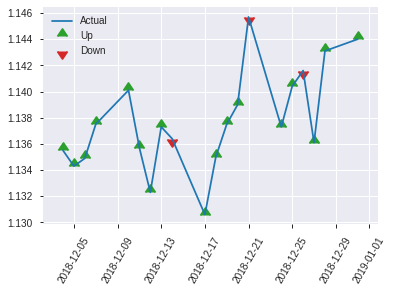


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17105893694609867
RMSE: 0.41359271868119085
LogLoss: 0.5105943388700034
Mean Per-Class Error: 0.25378510378510377
AUC: 0.8227106227106227
pr_auc: 0.8316500928484581
Gini: 0.6454212454212453
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.33299320936203003: 


,0,1,Error,Rate
0,57.0,69.0,0.5476,(69.0/126.0)
1,7.0,123.0,0.0538,(7.0/130.0)
Total,64.0,192.0,0.2969,(76.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3329932,0.7639752,191.0
max f2,0.2752349,0.8713693,202.0
max f0point5,0.6084209,0.7677903,100.0
max accuracy,0.5054057,0.7460938,126.0
max precision,0.9416023,1.0,0.0
max recall,0.0825847,1.0,245.0
max specificity,0.9416023,1.0,0.0
max absolute_mcc,0.5904645,0.4944785,105.0
max min_per_class_accuracy,0.4902426,0.7460317,128.0
max mean_per_class_accuracy,0.5054057,0.7462149,126.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 50.61 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9332660,1.9692308,1.9692308,1.0,0.9385634,1.0,0.9385634,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9188578,1.9692308,1.9692308,1.0,0.9274238,1.0,0.9329936,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9110082,1.9692308,1.9692308,1.0,0.9130185,1.0,0.9279998,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9043337,1.9692308,1.9692308,1.0,0.9069828,1.0,0.9222679,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8990438,1.9692308,1.9692308,1.0,0.9002571,1.0,0.9188816,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8707180,1.9692308,1.9692308,1.0,0.8869403,1.0,0.9029110,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8152791,1.6662722,1.8682446,0.8461538,0.8368680,0.9487179,0.8808966,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.7614888,1.6662722,1.8177515,0.8461538,0.7858375,0.9230769,0.8571319,0.0846154,0.3692308,66.6272189,81.7751479
,9,0.3007812,0.6753415,1.2603077,1.6367632,0.64,0.7153954,0.8311688,0.8111135,0.1230769,0.4923077,26.0307692,63.6763237
,10,0.4023438,0.6078265,1.4390533,1.5868559,0.7307692,0.6336929,0.8058252,0.7663277,0.1461538,0.6384615,43.9053254,58.6855863


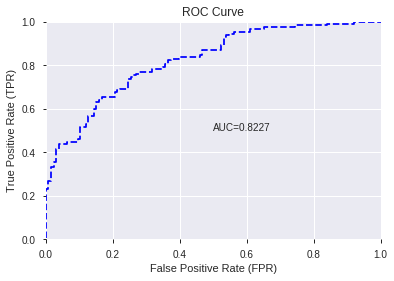

This function is available for GLM models only


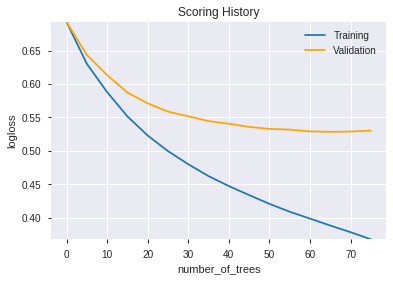

--2019-12-07 23:03:03--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.106.156
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.106.156|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

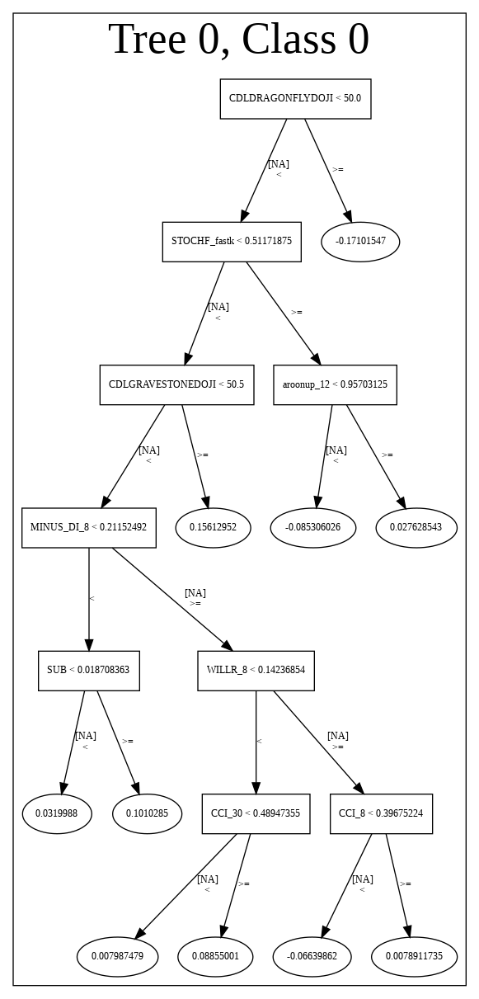

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_1_AutoML_20191207_230245',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_1_AutoML_20191207_230245',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_35_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_35_sid_8e77',
   'type

['CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CDLDRAGONFLYDOJI',
 'WILLR_8',
 'WILLR_12',
 'CCI_8',
 'ULTOSC',
 'TRANGE',
 'STOCH_slowk',
 'SAREXT',
 'HT_DCPERIOD',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'BETA_30',
 'CCI_30',
 'DIV',
 'PLUS_DM_8',
 'MINUS_DM_8',
 'CCI_20',
 'CCI_12',
 'MINUS_DM_12',
 'aroonup_12',
 'aroonup_8',
 'MINUS_DI_12',
 'PLUS_DM_14',
 'CCI_14',
 'MINUS_DI_14',
 'PLUS_DM_12',
 'SUB',
 'PLUS_DI_14',
 'PLUS_DI_12',
 'STOCHF_fastd',
 'weekday_name',
 'AROONOSC_12',
 'days_in_month',
 'CDLSPINNINGTOP',
 'CDLRICKSHAWMAN',
 'CDLHIGHWAVE',
 'CDLDOJI',
 'CDLLONGLEGGEDDOJI',
 'is_month_start',
 'is_month_end',
 'CDLHAMMER']

In [18]:
# All algos with top DeepLearning features
model_train(feature_name='DLF',model_algo=None,features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_230359_model_1,0.802442,0.536924,0.271123,0.427108,0.182422


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.325175,1.000000,2.233160e-02
1,CCI_8,0.303912,0.934609,2.087132e-02
2,STOCHF_fastk,0.302237,0.929458,2.075628e-02
3,MINUS_DI_8,0.236539,0.727421,1.624446e-02
4,CDLDRAGONFLYDOJI,0.236250,0.726531,1.622461e-02
...,...,...,...,...
933,LINEARREG_INTERCEPT_20,0.000050,0.000153,3.415815e-06
934,MIDPOINT_30,0.000038,0.000117,2.618451e-06
935,BBANDS_lowerband_14_3_2,0.000018,0.000056,1.251654e-06
936,BBANDS_upperband_30_5_4,0.000018,0.000056,1.251643e-06


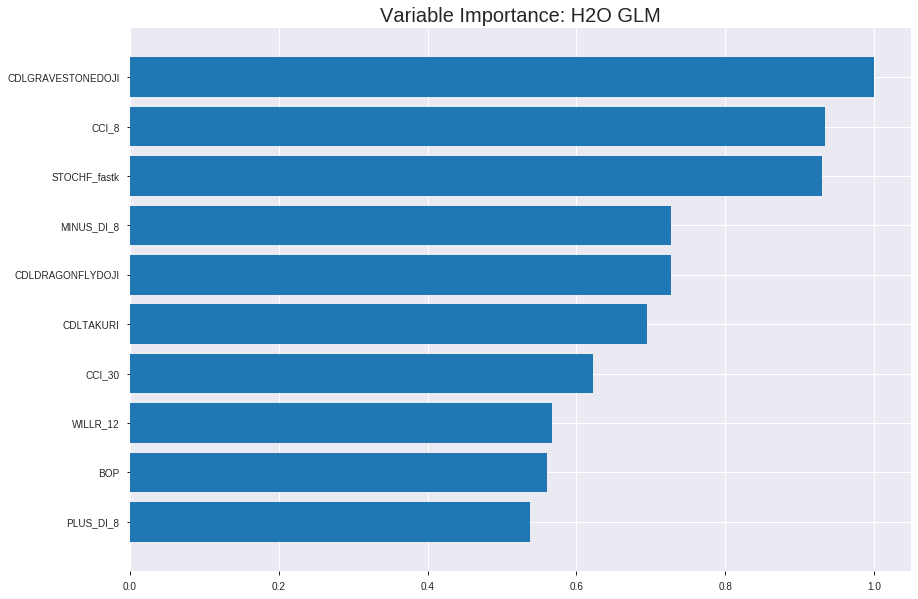

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_230359_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.17597760864785691
RMSE: 0.41949685177347507
LogLoss: 0.5243609228354653
Null degrees of freedom: 1786
Residual degrees of freedom: 848
Null deviance: 2477.294033375748
Residual deviance: 1874.065938213953
AIC: 3752.065938213953
AUC: 0.8197663640371974
pr_auc: 0.817708809192524
Gini: 0.6395327280743948
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40485434690378996: 


,0,1,Error,Rate
0,474.0,417.0,0.468,(417.0/891.0)
1,95.0,801.0,0.106,(95.0/896.0)
Total,569.0,1218.0,0.2865,(512.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4048543,0.7578051,256.0
max f2,0.3196848,0.8673978,300.0
max f0point5,0.5420167,0.7449749,182.0
max accuracy,0.5235795,0.7369894,193.0
max precision,0.9925109,1.0,0.0
max recall,0.0467763,1.0,389.0
max specificity,0.9925109,1.0,0.0
max absolute_mcc,0.5235795,0.4748007,193.0
max min_per_class_accuracy,0.5097373,0.7299107,200.0
max mean_per_class_accuracy,0.5235795,0.7370656,193.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9541358,1.9944196,1.9944196,1.0,0.9673581,1.0,0.9673581,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9339193,1.9944196,1.9944196,1.0,0.9410616,1.0,0.9542099,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9217405,1.8836186,1.9574859,0.9444444,0.9276538,0.9814815,0.9453578,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9024943,1.7728175,1.9113188,0.8888889,0.9113749,0.9583333,0.9368621,0.0178571,0.0770089,77.2817460,91.1318824
,5,0.0503637,0.8908577,1.9944196,1.9279390,1.0,0.8973784,0.9666667,0.9289654,0.0200893,0.0970982,99.4419643,92.7938988
,6,0.1001679,0.8351724,1.7927368,1.8607155,0.8988764,0.8632347,0.9329609,0.8962836,0.0892857,0.1863839,79.2736758,86.0715533
,7,0.1499720,0.7557297,1.7479183,1.8232568,0.8764045,0.7927722,0.9141791,0.8619086,0.0870536,0.2734375,74.7918339,82.3256763
,8,0.2003358,0.6926338,1.7284970,1.7994345,0.8666667,0.7258689,0.9022346,0.8277086,0.0870536,0.3604911,72.8497024,79.9434482
,9,0.2999440,0.6179417,1.3221434,1.6409311,0.6629213,0.6566953,0.8227612,0.7709169,0.1316964,0.4921875,32.2143359,64.0931087
,10,0.4001119,0.5574757,1.3147571,1.5592735,0.6592179,0.5869195,0.7818182,0.7248532,0.1316964,0.6238839,31.4757083,55.9273539




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.18037399928702497
RMSE: 0.4247046023850283
LogLoss: 0.539290655503272
Null degrees of freedom: 510
Residual degrees of freedom: -428
Null deviance: 708.5067427497421
Residual deviance: 551.155049924344
AIC: 2429.155049924344
AUC: 0.8086899831262464
pr_auc: 0.7905753881252982
Gini: 0.6173799662524928
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41168291178044636: 


,0,1,Error,Rate
0,169.0,96.0,0.3623,(96.0/265.0)
1,40.0,206.0,0.1626,(40.0/246.0)
Total,209.0,302.0,0.2661,(136.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4116829,0.7518248,234.0
max f2,0.1501116,0.8414804,347.0
max f0point5,0.5145948,0.7383178,167.0
max accuracy,0.4352173,0.7377691,219.0
max precision,0.9839399,1.0,0.0
max recall,0.0378901,1.0,389.0
max specificity,0.9839399,1.0,0.0
max absolute_mcc,0.4116829,0.4828700,234.0
max min_per_class_accuracy,0.4744600,0.7276423,196.0
max mean_per_class_accuracy,0.4352173,0.7400291,219.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 47.45 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9578800,1.7310298,1.7310298,0.8333333,0.9670317,0.8333333,0.9670317,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9420457,2.0772358,1.8883962,1.0,0.9508035,0.9090909,0.9596553,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.9207190,2.0772358,1.9474085,1.0,0.9316669,0.9375,0.9509089,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9116174,2.0772358,1.9783198,1.0,0.9162323,0.9523810,0.9426526,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8966038,1.6617886,1.9174484,0.8,0.9044814,0.9230769,0.9353120,0.0162602,0.0975610,66.1788618,91.7448405
,6,0.1017613,0.8431322,2.0772358,1.9973421,1.0,0.8669949,0.9615385,0.9011534,0.1056911,0.2032520,107.7235772,99.7342089
,7,0.1506849,0.7862994,1.6617886,1.8883962,0.8,0.8131442,0.9090909,0.8725790,0.0813008,0.2845528,66.1788618,88.8396157
,8,0.2015656,0.7210701,1.5179800,1.7948930,0.7307692,0.7596028,0.8640777,0.8440607,0.0772358,0.3617886,51.7979987,79.4893046
,9,0.3013699,0.6011750,1.5070142,1.6995565,0.7254902,0.6545358,0.8181818,0.7812960,0.1504065,0.5121951,50.7014188,69.9556541
,10,0.4011742,0.5147305,1.2626335,1.5908586,0.6078431,0.5538113,0.7658537,0.7247022,0.1260163,0.6382114,26.2633509,59.0858616



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:04:01,0.000 sec,2,.16E2,882,1.3640022,1.3638611
,2019-12-07 23:04:02,0.958 sec,4,.11E2,911,1.3567729,1.3564896
,2019-12-07 23:04:03,1.863 sec,6,.82E1,926,1.3476128,1.3470444
,2019-12-07 23:04:04,2.776 sec,8,.6E1,936,1.3361888,1.3350886
,2019-12-07 23:04:05,3.705 sec,10,.44E1,939,1.3222758,1.3203629
---,---,---,---,---,---,---,---
,2019-12-07 23:04:21,19.592 sec,42,.27E-1,939,1.0378929,1.0788817
,2019-12-07 23:04:22,20.530 sec,44,.2E-1,939,1.0281861,1.0807026
,2019-12-07 23:04:22,21.447 sec,46,.14E-1,939,1.0195124,1.0837153
,2019-12-07 23:04:23,22.363 sec,48,.1E-1,939,1.0116651,1.0875544



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.73046875)

('F1', 0.7578947368421053)

('auc', 0.8024420024420024)

('logloss', 0.5369235600458144)

('mean_per_class_error', 0.27112332112332105)

('rmse', 0.42710841334104394)

('mse', 0.18242159674670402)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


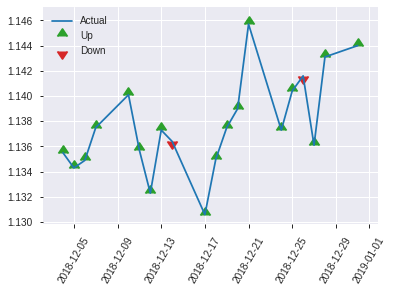


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.18242159674670402
RMSE: 0.42710841334104394
LogLoss: 0.5369235600458144
Null degrees of freedom: 255
Residual degrees of freedom: -683
Null deviance: 354.8709766655013
Residual deviance: 274.904862743457
AIC: 2152.9048627434568
AUC: 0.8024420024420024
pr_auc: 0.8081135898748364
Gini: 0.6048840048840047
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41855858050948047: 


,0,1,Error,Rate
0,79.0,47.0,0.373,(47.0/126.0)
1,22.0,108.0,0.1692,(22.0/130.0)
Total,101.0,155.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4185586,0.7578947,154.0
max f2,0.2578615,0.8683853,216.0
max f0point5,0.4955691,0.7258065,106.0
max accuracy,0.4185586,0.7304688,154.0
max precision,0.9549827,1.0,0.0
max recall,0.0629956,1.0,248.0
max specificity,0.9549827,1.0,0.0
max absolute_mcc,0.4185586,0.4682329,154.0
max min_per_class_accuracy,0.4634156,0.7076923,126.0
max mean_per_class_accuracy,0.4185586,0.7288767,154.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.72 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9463511,1.9692308,1.9692308,1.0,0.9529541,1.0,0.9529541,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9328792,1.9692308,1.9692308,1.0,0.9385920,1.0,0.9457731,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9077225,1.9692308,1.9692308,1.0,0.9112041,1.0,0.9371308,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8903615,1.9692308,1.9692308,1.0,0.8981088,1.0,0.9264885,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8845202,1.9692308,1.9692308,1.0,0.8873513,1.0,0.9204674,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8093516,1.9692308,1.9692308,1.0,0.8482432,1.0,0.8843553,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7309025,1.6662722,1.8682446,0.8461538,0.7733739,0.9487179,0.8473615,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.6690065,1.3633136,1.7420118,0.6923077,0.6914548,0.8846154,0.8083848,0.0692308,0.3538462,36.3313609,74.2011834
,9,0.3007812,0.5640608,1.2603077,1.5856144,0.64,0.6125027,0.8051948,0.7447867,0.1230769,0.4769231,26.0307692,58.5614386
,10,0.4023438,0.5034549,1.2118343,1.4912621,0.6153846,0.5416096,0.7572816,0.6934993,0.1230769,0.6,21.1834320,49.1262136


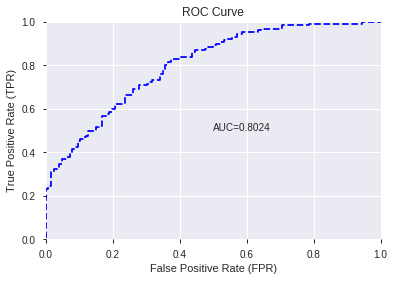

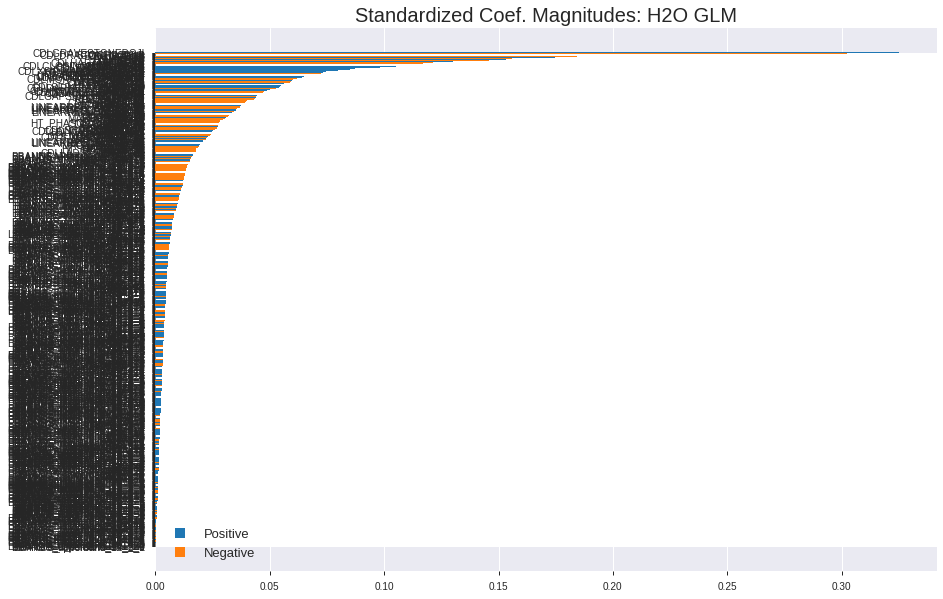

'log_likelihood'
--2019-12-07 23:04:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.207.67
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.207.67|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


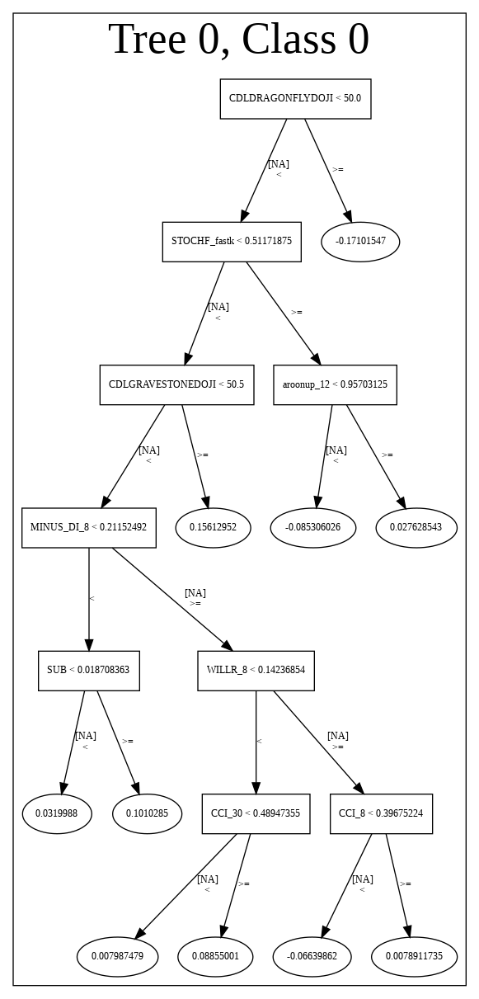

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_230359_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_230359_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_40_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_40_s

['CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CCI_30',
 'WILLR_12',
 'BOP',
 'PLUS_DI_8',
 'DIV',
 'WILLR_14',
 'CCI_14',
 'CCI_24',
 'CCI_20',
 'ULTOSC',
 'WILLR_8',
 'CCI_12',
 'aroonup_12',
 'CDLHARAMICROSS',
 'TAN',
 'WILLR_24',
 'MINUS_DI_12',
 'PLUS_DM_8',
 'CDLCLOSINGMARUBOZU',
 'WILLR_20',
 'CDLHANGINGMAN',
 'CORREL_30',
 'PLUS_DI_12',
 'CDLSPINNINGTOP',
 'BETA_24',
 'BETA_8',
 'SUB',
 'AROONOSC_12',
 'CDLXSIDEGAP3METHODS',
 'HT_PHASOR_inphase',
 'MINUS_DM_30',
 'MINUS_DI_14',
 'CDLADVANCEBLOCK',
 'PLUS_DI_14',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'SAREXT',
 'days_in_month',
 'CDL3LINESTRIKE',
 'STOCH_slowd',
 'CDLCOUNTERATTACK',
 'ADXR_8',
 'High',
 'CDLMORNINGDOJISTAR']

938

['CDLGRAVESTONEDOJI',
 'CCI_8',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'CCI_30',
 'WILLR_12',
 'BOP',
 'PLUS_DI_8',
 'DIV',
 'WILLR_14',
 'CCI_14',
 'CCI_24',
 'CCI_20',
 'ULTOSC',
 'WILLR_8',
 'CCI_12',
 'aroonup_12',
 'CDLHARAMICROSS',
 'TAN',
 'WILLR_24',
 'MINUS_DI_12',
 'PLUS_DM_8',
 'CDLCLOSINGMARUBOZU',
 'WILLR_20',
 'CDLHANGINGMAN',
 'CORREL_30',
 'PLUS_DI_12',
 'CDLSPINNINGTOP',
 'BETA_24',
 'BETA_8',
 'SUB',
 'AROONOSC_12',
 'CDLXSIDEGAP3METHODS',
 'HT_PHASOR_inphase',
 'MINUS_DM_30',
 'MINUS_DI_14',
 'CDLADVANCEBLOCK',
 'PLUS_DI_14',
 'LINEARREG_ANGLE_8',
 'LINEARREG_SLOPE_8',
 'SAREXT',
 'days_in_month',
 'CDL3LINESTRIKE',
 'STOCH_slowd',
 'CDLCOUNTERATTACK',
 'ADXR_8',
 'High',
 'CDLMORNINGDOJISTAR']

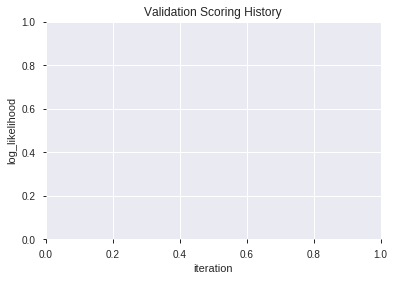

In [19]:
# GLM
features_list = model_train(feature_name='All',model_algo="GLM")
display(features_list[:model_selected_features])
display(len(features_list),features_list[:model_selected_features])

In [20]:
# DeepLearning with top GLM features
model_train(feature_name='GLMF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

[]

In [21]:
# GLM with top GLM features
model_train(feature_name='GLMF',model_algo="GLM",features_list = features_list[:model_selected_features])

[]

In [22]:
# XGBoost with top GLM features
model_train(feature_name='GLMF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

[]

In [23]:
# DRF with top GLM features
model_train(feature_name='GLMF',model_algo="DRF",features_list = features_list[:model_selected_features])

[]

In [24]:
# GBM with top GLM features
model_train(feature_name='GLMF',model_algo="GBM",features_list = features_list[:model_selected_features])

[]

In [25]:
# StackedEnsemble with top GLM features
model_train(feature_name='GLMF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

[]

In [26]:
# All algos with top GLM features
model_train(feature_name='GLMF',model_algo=None,features_list = features_list[:model_selected_features])

[]

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_230540_model_4,0.818132,0.528774,0.295788,0.420557,0.176868
1,XGBoost_grid_1_AutoML_20191207_230540_model_2,0.810745,0.529132,0.324298,0.422001,0.178085
2,XGBoost_1_AutoML_20191207_230540,0.809829,0.527070,0.300000,0.421593,0.177741
3,XGBoost_grid_1_AutoML_20191207_230540_model_7,0.805922,0.531304,0.312271,0.423725,0.179543
4,XGBoost_2_AutoML_20191207_230540,0.805800,0.533440,0.304212,0.424296,0.180027
5,XGBoost_grid_1_AutoML_20191207_230540_model_3,0.805250,0.529064,0.328144,0.423580,0.179420
6,XGBoost_grid_1_AutoML_20191207_230540_model_6,0.803480,0.532831,0.283883,0.424598,0.180283
7,XGBoost_grid_1_AutoML_20191207_230540_model_1,0.802259,0.534738,0.286996,0.425071,0.180685
8,XGBoost_grid_1_AutoML_20191207_230540_model_5,0.801221,0.534321,0.308181,0.426716,0.182086
9,XGBoost_3_AutoML_20191207_230540,0.800488,0.534823,0.275214,0.425696,0.181217


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,692.503723,1.000000,0.107985
1,CDLDRAGONFLYDOJI,623.510925,0.900372,0.097227
2,CDLTAKURI,543.455444,0.784769,0.084743
3,STOCHF_fastk,534.583130,0.771957,0.083360
4,CCI_8,272.336090,0.393263,0.042467
...,...,...,...,...
144,BBANDS_lowerband_20_3_3,5.117916,0.007390,0.000798
145,ADXR_12,4.975081,0.007184,0.000776
146,NATR_12,4.683388,0.006763,0.000730
147,TRIX_12,4.348453,0.006279,0.000678


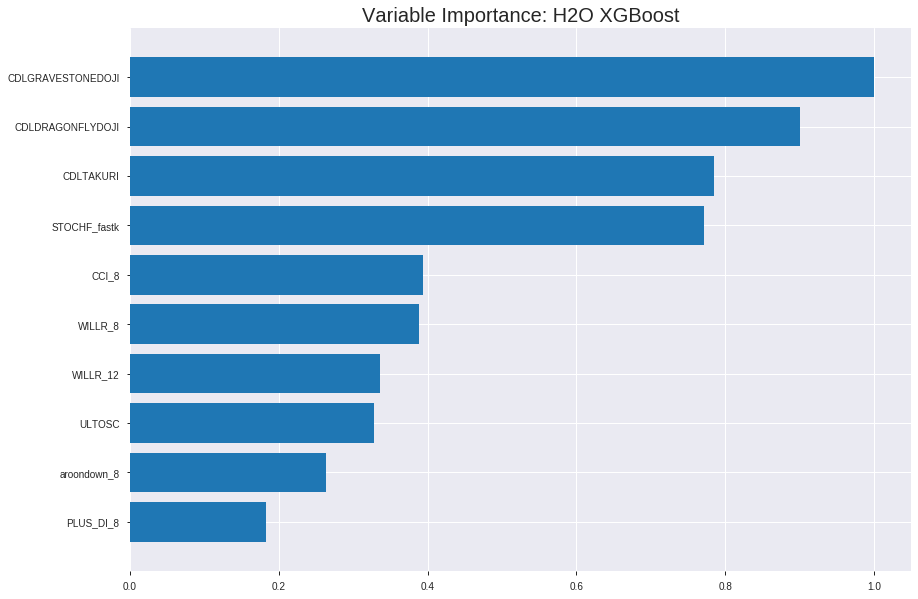

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_230540_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15765694372088057
RMSE: 0.3970603779286981
LogLoss: 0.48878531163321914
Mean Per-Class Error: 0.196553205667789
AUC: 0.8793672087942922
pr_auc: 0.8708429203921296
Gini: 0.7587344175885844
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4611719300349553: 


,0,1,Error,Rate
0,644.0,247.0,0.2772,(247.0/891.0)
1,109.0,787.0,0.1217,(109.0/896.0)
Total,753.0,1034.0,0.1992,(356.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4611719,0.8155440,223.0
max f2,0.3650012,0.8810932,273.0
max f0point5,0.5458035,0.8094768,173.0
max accuracy,0.4772125,0.8035814,213.0
max precision,0.9111907,1.0,0.0
max recall,0.1186294,1.0,378.0
max specificity,0.9111907,1.0,0.0
max absolute_mcc,0.4772125,0.6098224,213.0
max min_per_class_accuracy,0.5056042,0.7957351,196.0
max mean_per_class_accuracy,0.4772125,0.8034468,213.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8856811,1.9944196,1.9944196,1.0,0.8943367,1.0,0.8943367,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8734426,1.9944196,1.9944196,1.0,0.8806408,1.0,0.8874887,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8643295,1.9944196,1.9944196,1.0,0.8685957,1.0,0.8811911,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8568780,1.7728175,1.9390191,0.8888889,0.8608449,0.9722222,0.8761045,0.0178571,0.078125,77.2817460,93.9019097
,5,0.0503637,0.8495338,1.8836186,1.9279390,0.9444444,0.8529870,0.9666667,0.8714810,0.0189732,0.0970982,88.3618552,92.7938988
,6,0.1001679,0.7944669,1.8599644,1.8941416,0.9325843,0.8229066,0.9497207,0.8473295,0.0926339,0.1897321,85.9964386,89.4141560
,7,0.1499720,0.7465507,1.7479183,1.8455824,0.8764045,0.7713363,0.9253731,0.8220930,0.0870536,0.2767857,74.7918339,84.5582356
,8,0.2003358,0.6973984,1.8171379,1.8384315,0.9111111,0.7224957,0.9217877,0.7970545,0.0915179,0.3683036,81.7137897,83.8431514
,9,0.2999440,0.6317051,1.6806907,1.7860474,0.8426966,0.6618526,0.8955224,0.7521554,0.1674107,0.5357143,68.0690710,78.6047441
,10,0.4001119,0.5731353,1.3816091,1.6847965,0.6927374,0.6026758,0.8447552,0.7147332,0.1383929,0.6741071,38.1609138,68.4796454




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17992699382912017
RMSE: 0.42417802138856764
LogLoss: 0.5378203436726883
Mean Per-Class Error: 0.25911182696732626
AUC: 0.8120417241908268
pr_auc: 0.7909998585324445
Gini: 0.6240834483816535
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4857880771160126: 


,0,1,Error,Rate
0,182.0,83.0,0.3132,(83.0/265.0)
1,52.0,194.0,0.2114,(52.0/246.0)
Total,234.0,277.0,0.2642,(135.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4857881,0.7418738,221.0
max f2,0.3160410,0.8417997,306.0
max f0point5,0.5997998,0.7494970,147.0
max accuracy,0.5281286,0.7416830,193.0
max precision,0.8954056,1.0,0.0
max recall,0.1289085,1.0,379.0
max specificity,0.8954056,1.0,0.0
max absolute_mcc,0.5281286,0.4823316,193.0
max min_per_class_accuracy,0.5120717,0.7358491,202.0
max mean_per_class_accuracy,0.5281286,0.7408882,193.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.46 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8792585,2.0772358,2.0772358,1.0,0.8880013,1.0,0.8880013,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8711354,1.6617886,1.8883962,0.8,0.8743518,0.9090909,0.8817970,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.8649491,1.6617886,1.8175813,0.8,0.8679460,0.875,0.8774686,0.0162602,0.0569106,66.1788618,81.7581301
,4,0.0410959,0.8596496,2.0772358,1.8794038,1.0,0.8625388,0.9047619,0.8739138,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8497844,1.6617886,1.8375547,0.8,0.8544250,0.8846154,0.8701660,0.0162602,0.0934959,66.1788618,83.7554722
,6,0.1017613,0.8196402,1.9973421,1.9174484,0.9615385,0.8356443,0.9230769,0.8529052,0.1016260,0.1951220,99.7342089,91.7448405
,7,0.1506849,0.7830943,1.8279675,1.8883962,0.88,0.8011016,0.9090909,0.8360858,0.0894309,0.2845528,82.7967480,88.8396157
,8,0.2015656,0.7333980,1.5179800,1.7948930,0.7307692,0.7568897,0.8640777,0.8160946,0.0772358,0.3617886,51.7979987,79.4893046
,9,0.3013699,0.6326931,1.4662841,1.6860680,0.7058824,0.6849537,0.8116883,0.7726648,0.1463415,0.5081301,46.6284075,68.6067997
,10,0.4011742,0.5779150,1.2626335,1.5807258,0.6078431,0.6060241,0.7609756,0.7312078,0.1260163,0.6341463,26.2633509,58.0725758



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:05:59,7.900 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 23:06:00,8.399 sec,5.0,0.4771836,0.6481801,0.8002508,0.5953737,1.7717868,0.3060996,0.4752473,0.6444228,0.7896610,0.4908882,1.8598506,0.3228963
,2019-12-07 23:06:00,8.544 sec,10.0,0.4632449,0.6206401,0.8065639,0.5997133,1.7717868,0.2960269,0.4615016,0.6171372,0.7853735,0.4876696,1.8598506,0.3033268
,2019-12-07 23:06:00,8.681 sec,15.0,0.4526633,0.5993323,0.8182733,0.7795046,1.9231904,0.2607722,0.4520183,0.5976535,0.7921844,0.5633009,1.9432206,0.3307241
,2019-12-07 23:06:00,8.820 sec,20.0,0.4438204,0.5813068,0.8253680,0.8097312,1.8921417,0.2624510,0.4443270,0.5814635,0.7983663,0.7367923,1.9288618,0.3052838
,2019-12-07 23:06:00,8.968 sec,25.0,0.4369127,0.5671106,0.8307580,0.8183728,1.9944196,0.2490207,0.4388215,0.5697117,0.8030910,0.7554732,2.0772358,0.3072407
,2019-12-07 23:06:00,9.107 sec,30.0,0.4311535,0.5554147,0.8375484,0.8233559,1.9944196,0.2484611,0.4349583,0.5612656,0.8028685,0.7750822,2.0772358,0.2994129
,2019-12-07 23:06:01,9.251 sec,35.0,0.4259075,0.5449948,0.8431494,0.8309059,1.9944196,0.2367096,0.4325459,0.5561060,0.8056450,0.7841659,2.0772358,0.3150685
,2019-12-07 23:06:01,9.397 sec,40.0,0.4208123,0.5349719,0.8492408,0.8364762,1.9944196,0.2294348,0.4311363,0.5528839,0.8074321,0.7854453,1.7310298,0.3111546
,2019-12-07 23:06:01,9.543 sec,45.0,0.4163263,0.5259579,0.8531239,0.8413511,1.9944196,0.2266368,0.4287276,0.5476248,0.8095183,0.7867110,1.7310298,0.2681018


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,692.5037231,1.0,0.1079853
CDLDRAGONFLYDOJI,623.5109253,0.9003719,0.0972269
CDLTAKURI,543.4554443,0.7847690,0.0847435
STOCHF_fastk,534.5831299,0.7719570,0.0833600
CCI_8,272.3360901,0.3932630,0.0424666
---,---,---,---
BBANDS_lowerband_20_3_3,5.1179161,0.0073905,0.0007981
ADXR_12,4.9750814,0.0071842,0.0007758
NATR_12,4.6833878,0.0067630,0.0007303
TRIX_12,4.3484526,0.0062793,0.0006781



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7421875)

('F1', 0.7540983606557377)

('auc', 0.8181318681318682)

('logloss', 0.5287736440985129)

('mean_per_class_error', 0.25799755799755797)

('rmse', 0.4205566942703566)

('mse', 0.17686793309561016)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


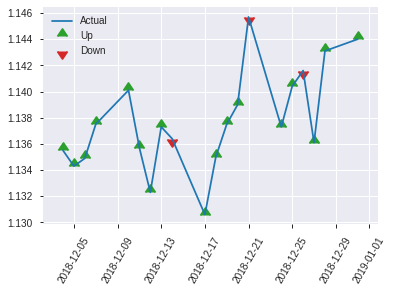


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.17686793309561016
RMSE: 0.4205566942703566
LogLoss: 0.5287736440985129
Mean Per-Class Error: 0.25799755799755797
AUC: 0.8181318681318682
pr_auc: 0.8331444541909977
Gini: 0.6362637362637364
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3848046660423279: 


,0,1,Error,Rate
0,66.0,60.0,0.4762,(60.0/126.0)
1,15.0,115.0,0.1154,(15.0/130.0)
Total,81.0,175.0,0.293,(75.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3848047,0.7540984,174.0
max f2,0.2693501,0.8630137,209.0
max f0point5,0.5580564,0.7656827,102.0
max accuracy,0.5030313,0.7421875,131.0
max precision,0.8930295,1.0,0.0
max recall,0.1148559,1.0,246.0
max specificity,0.8930295,1.0,0.0
max absolute_mcc,0.5580564,0.4890922,102.0
max min_per_class_accuracy,0.5076250,0.7380952,128.0
max mean_per_class_accuracy,0.5030313,0.7420024,131.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.66 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8828881,1.9692308,1.9692308,1.0,0.8900497,1.0,0.8900497,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8728056,1.9692308,1.9692308,1.0,0.8753261,1.0,0.8826879,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8586312,1.9692308,1.9692308,1.0,0.8680048,1.0,0.8790172,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8521426,1.9692308,1.9692308,1.0,0.8537177,1.0,0.8721173,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8425888,1.9692308,1.9692308,1.0,0.8500977,1.0,0.8687297,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8202561,1.9692308,1.9692308,1.0,0.8290013,1.0,0.8488655,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7614207,1.9692308,1.9692308,1.0,0.7866981,1.0,0.8281430,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7026529,1.2118343,1.7798817,0.6153846,0.7298044,0.9038462,0.8035584,0.0615385,0.3615385,21.1834320,77.9881657
,9,0.3007812,0.6217188,1.4966154,1.6879121,0.76,0.6530217,0.8571429,0.7546828,0.1461538,0.5076923,49.6615385,68.7912088
,10,0.4023438,0.5580564,1.2875740,1.5868559,0.6538462,0.5895551,0.8058252,0.7130001,0.1307692,0.6384615,28.7573964,58.6855863


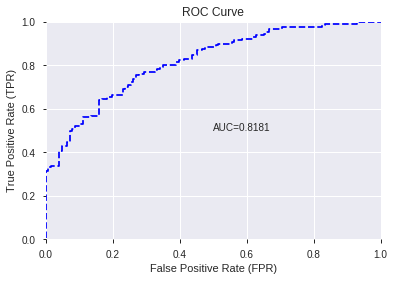

This function is available for GLM models only


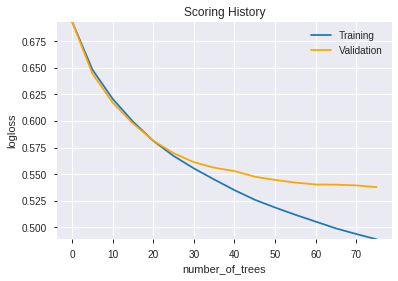

--2019-12-07 23:06:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.37.164
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.37.164|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.

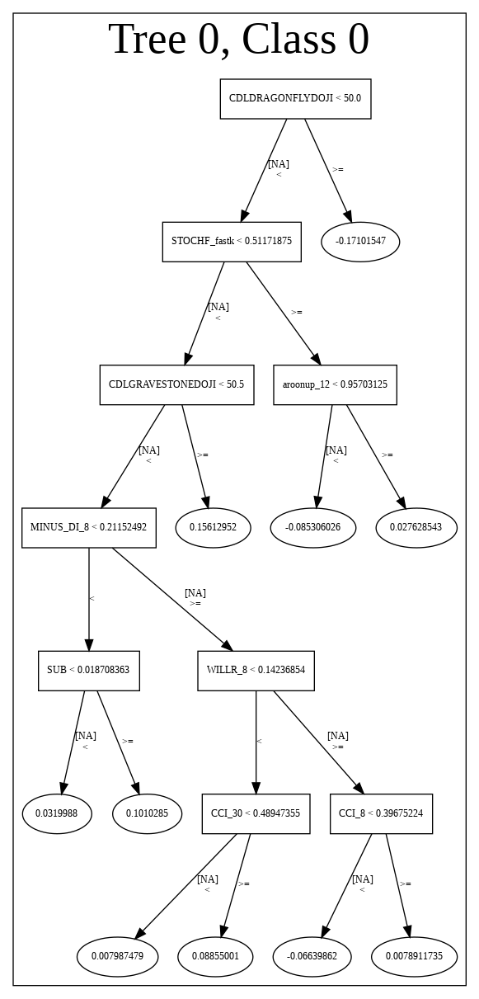

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_230540_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_230540_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_45_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

149

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'CDLTAKURI',
 'STOCHF_fastk',
 'CCI_8',
 'WILLR_8',
 'WILLR_12',
 'ULTOSC',
 'aroondown_8',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'aroonup_12',
 'WILLR_14',
 'CCI_14',
 'LINEARREG_ANGLE_8',
 'CCI_20',
 'CCI_24',
 'HT_DCPERIOD',
 'PLUS_DM_8',
 'CORREL_20',
 'CMO_8',
 'STOCH_slowk',
 'ADX_8',
 'BETA_8',
 'STDDEV_12',
 'dayofyear',
 'CCI_12',
 'HT_PHASOR_quadrature',
 'MINUS_DM_8',
 'STDDEV_24',
 'BBANDS_upperband_30_2_5',
 'ATR_24',
 'days_in_month',
 'aroonup_8',
 'BOP',
 'DIV',
 'STDDEV_8',
 'PLUS_DI_14',
 'TRANGE',
 'KAMA_14',
 'BETA_20',
 'STOCHRSI_fastk',
 'aroondown_12',
 'BETA_30',
 'NATR_24',
 'TRIX_14',
 'MACDEXT_hist',
 'STOCH_slowd',
 'CORREL_30',
 'PLUS_DI_24']

In [27]:
# XGBoost
features_list = model_train(feature_name='All',model_algo="XGBoost")
display(len(features_list),features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_230717_model_6,0.794872,0.542133,0.271490,0.429486,0.184459
1,DeepLearning_grid_1_AutoML_20191207_230717_model_9,0.788584,0.547251,0.279182,0.433709,0.188103
2,DeepLearning_grid_1_AutoML_20191207_230717_model_2,0.786142,0.558042,0.303846,0.437033,0.190997
3,DeepLearning_grid_1_AutoML_20191207_230717_model_8,0.784554,0.557270,0.328266,0.437866,0.191727
4,DeepLearning_grid_1_AutoML_20191207_230717_model_3,0.782845,0.596700,0.336813,0.452068,0.204366
5,DeepLearning_grid_1_AutoML_20191207_230717_model_5,0.777595,0.553120,0.295910,0.438058,0.191895
6,DeepLearning_1_AutoML_20191207_230717,0.777045,0.551119,0.318987,0.436062,0.190150
7,DeepLearning_grid_1_AutoML_20191207_230717_model_1,0.773993,0.635763,0.312149,0.458909,0.210597
8,DeepLearning_grid_1_AutoML_20191207_230717_model_4,0.767949,0.656904,0.331746,0.464570,0.215826
9,DeepLearning_grid_1_AutoML_20191207_230717_model_7,0.764042,0.652208,0.357021,0.468655,0.219638


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,1.000000,1.000000,0.028595
1,CDLTAKURI,0.886010,0.886010,0.025335
2,CDLDRAGONFLYDOJI,0.862910,0.862910,0.024675
3,STOCHF_fastk,0.791453,0.791453,0.022631
4,ULTOSC,0.790850,0.790850,0.022614
5,MINUS_DI_8,0.739817,0.739817,0.021155
6,CCI_8,0.739030,0.739030,0.021132
7,BETA_20,0.723534,0.723534,0.020689
8,TRANGE,0.717016,0.717016,0.020503
9,dayofyear,0.707423,0.707423,0.020228


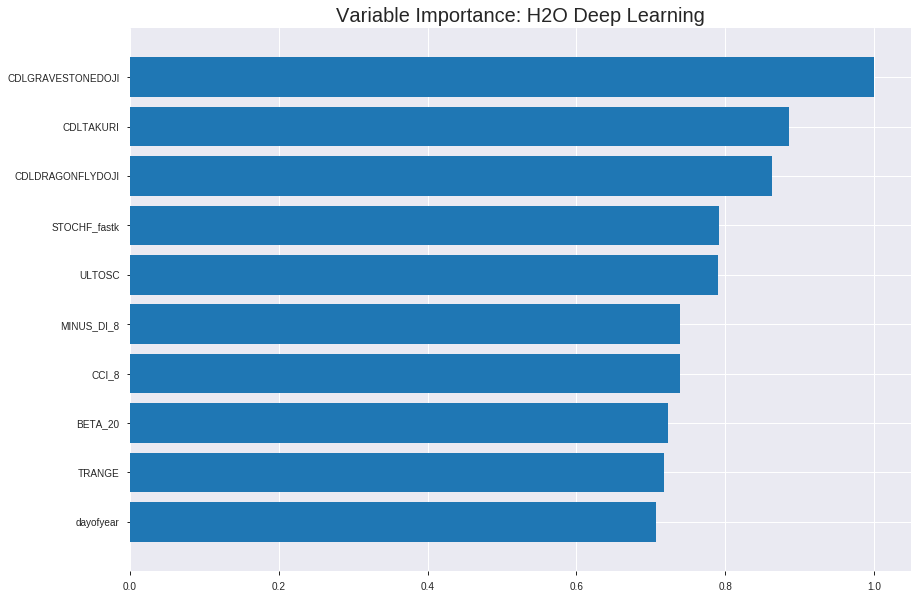

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_230717_model_6


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.19299928229412644
RMSE: 0.43931683588741105
LogLoss: 0.5623422520585257
Mean Per-Class Error: 0.3055611922799423
AUC: 0.7732865610469777
pr_auc: 0.7729245361750197
Gini: 0.5465731220939554
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.38436431834391044: 


,0,1,Error,Rate
0,424.0,467.0,0.5241,(467.0/891.0)
1,103.0,793.0,0.115,(103.0/896.0)
Total,527.0,1260.0,0.319,(570.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3843643,0.7356215,258.0
max f2,0.2454090,0.8572544,322.0
max f0point5,0.5372641,0.7060440,169.0
max accuracy,0.4840267,0.6944600,199.0
max precision,0.9719686,1.0,0.0
max recall,0.0192489,1.0,390.0
max specificity,0.9719686,1.0,0.0
max absolute_mcc,0.4185475,0.4028358,238.0
max min_per_class_accuracy,0.4867733,0.6913580,197.0
max mean_per_class_accuracy,0.4840267,0.6944388,199.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 47.63 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9450608,1.9944196,1.9944196,1.0,0.9564601,1.0,0.9564601,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9230207,1.9944196,1.9944196,1.0,0.9330588,1.0,0.9447595,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9082324,1.9944196,1.9944196,1.0,0.9152458,1.0,0.9349216,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8903616,1.9944196,1.9944196,1.0,0.8976357,1.0,0.9256001,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8772538,1.4404142,1.8836186,0.7222222,0.8839000,0.9444444,0.9172601,0.0145089,0.0948661,44.0414187,88.3618552
,6,0.1001679,0.7904708,1.8375552,1.8607155,0.9213483,0.8376689,0.9329609,0.8776868,0.0915179,0.1863839,83.7555177,86.0715533
,7,0.1499720,0.6933701,1.4790078,1.7339544,0.7415730,0.7373115,0.8694030,0.8310696,0.0736607,0.2600446,47.9007825,73.3954391
,8,0.2003358,0.6395617,1.4404142,1.6601594,0.7222222,0.6658538,0.8324022,0.7895349,0.0725446,0.3325893,44.0414187,66.0159368
,9,0.2999440,0.5782914,1.2549157,1.5255822,0.6292135,0.6087206,0.7649254,0.7294884,0.125,0.4575893,25.4915730,52.5582189
,10,0.4001119,0.5309792,1.3036151,1.4700128,0.6536313,0.5527803,0.7370629,0.6852496,0.1305804,0.5881696,30.3615074,47.0012800




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.1892487070303433
RMSE: 0.43502724860673186
LogLoss: 0.5611668405965232
Mean Per-Class Error: 0.27348519711612207
AUC: 0.7861175026844608
pr_auc: 0.7639599690200286
Gini: 0.5722350053689216
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46271982544591295: 


,0,1,Error,Rate
0,163.0,102.0,0.3849,(102.0/265.0)
1,50.0,196.0,0.2033,(50.0/246.0)
Total,213.0,298.0,0.2975,(152.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4627198,0.7205882,227.0
max f2,0.3359715,0.8423326,308.0
max f0point5,0.5162379,0.7228916,181.0
max accuracy,0.5162379,0.7279843,181.0
max precision,0.9783061,1.0,0.0
max recall,0.0344292,1.0,381.0
max specificity,0.9783061,1.0,0.0
max absolute_mcc,0.5162379,0.4548784,181.0
max min_per_class_accuracy,0.5008827,0.7073171,198.0
max mean_per_class_accuracy,0.5143844,0.7265148,182.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.46 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9427297,2.0772358,2.0772358,1.0,0.9581747,1.0,0.9581747,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9255998,1.2463415,1.6995565,0.6,0.9319482,0.8181818,0.9462536,0.0121951,0.0365854,24.6341463,69.9556541
,3,0.0313112,0.9198063,1.6617886,1.6877541,0.8,0.9221938,0.8125,0.9387349,0.0162602,0.0528455,66.1788618,68.7754065
,4,0.0410959,0.9124521,2.0772358,1.7804878,1.0,0.9168986,0.8571429,0.9335358,0.0203252,0.0731707,107.7235772,78.0487805
,5,0.0508806,0.9062853,2.0772358,1.8375547,1.0,0.9092389,0.8846154,0.9288633,0.0203252,0.0934959,107.7235772,83.7554722
,6,0.1017613,0.8573724,1.8375547,1.8375547,0.8846154,0.8814034,0.8846154,0.9051334,0.0934959,0.1869919,83.7554722,83.7554722
,7,0.1506849,0.7970185,1.9941463,1.8883962,0.96,0.8315115,0.9090909,0.8812302,0.0975610,0.2845528,99.4146341,88.8396157
,8,0.2015656,0.6884881,1.5179800,1.7948930,0.7307692,0.7416678,0.8640777,0.8460008,0.0772358,0.3617886,51.7979987,79.4893046
,9,0.3013699,0.5850062,1.2626335,1.6186253,0.6078431,0.6298929,0.7792208,0.7744326,0.1260163,0.4878049,26.2633509,61.8625277
,10,0.4011742,0.5376101,1.2626335,1.5300615,0.6078431,0.5573743,0.7365854,0.7204328,0.1260163,0.6138211,26.2633509,53.0061471



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:10:39,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 23:10:42,1 min 44.365 sec,2741 obs/sec,5.0,1,8935.0,0.4393168,0.5623423,0.2279968,0.7732866,0.7729245,1.9944196,0.3189703,0.4350272,0.5611668,0.2419572,0.7861175,0.7639600,2.0772358,0.2974560
,2019-12-07 23:10:48,1 min 49.927 sec,4277 obs/sec,20.0,4,35740.0,0.4282157,0.5394258,0.2665197,0.8022368,0.8048897,1.9944196,0.3021824,0.4326848,0.5653508,0.2500986,0.7953981,0.7613904,1.3848238,0.2896282
,2019-12-07 23:10:53,1 min 55.110 sec,4782 obs/sec,35.0,7,62545.0,0.4158730,0.5145617,0.3081931,0.8311983,0.8335488,1.9944196,0.2602126,0.4335467,0.5737142,0.2471081,0.7981439,0.7559653,1.3848238,0.2857143
,2019-12-07 23:10:58,2 min 0.206 sec,5044 obs/sec,50.0,10,89350.0,0.3997702,0.4831593,0.3607301,0.8498026,0.8490536,1.9944196,0.2613318,0.4328946,0.5822152,0.2493713,0.7975303,0.7579702,1.3848238,0.2661448
,2019-12-07 23:11:03,2 min 5.318 sec,5199 obs/sec,65.0,13,116155.0,0.3906407,0.4613664,0.3895946,0.8660232,0.8684882,1.9944196,0.2411863,0.4308572,0.5821482,0.2564202,0.8018254,0.7594634,1.3848238,0.2602740
,2019-12-07 23:11:08,2 min 10.443 sec,5296 obs/sec,80.0,16,142960.0,0.3789920,0.4401565,0.4254556,0.8808497,0.8841338,1.9944196,0.2132065,0.4298034,0.5714701,0.2600532,0.8016183,0.7672458,1.7310298,0.2720157
,2019-12-07 23:11:09,2 min 10.935 sec,5293 obs/sec,80.0,16,142960.0,0.4393168,0.5623423,0.2279968,0.7732866,0.7729245,1.9944196,0.3189703,0.4350272,0.5611668,0.2419572,0.7861175,0.7639600,2.0772358,0.2974560


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,1.0,1.0,0.0285946
CDLTAKURI,0.8860103,0.8860103,0.0253351
CDLDRAGONFLYDOJI,0.8629104,0.8629104,0.0246746
STOCHF_fastk,0.7914529,0.7914529,0.0226313
ULTOSC,0.7908502,0.7908502,0.0226141
---,---,---,---
BETA_8,0.6432454,0.6432454,0.0183934
CORREL_20,0.6415225,0.6415225,0.0183441
CCI_20,0.6405495,0.6405495,0.0183163
STDDEV_8,0.6309315,0.6309315,0.0180413



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.73046875)

('F1', 0.7628865979381443)

('auc', 0.7948717948717949)

('logloss', 0.5421332507691008)

('mean_per_class_error', 0.2714896214896215)

('rmse', 0.42948632782540824)

('mse', 0.18445850578895404)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


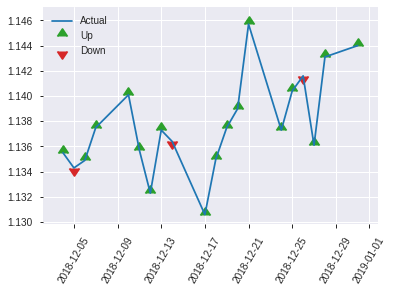


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.18445850578895404
RMSE: 0.42948632782540824
LogLoss: 0.5421332507691008
Mean Per-Class Error: 0.2714896214896215
AUC: 0.7948717948717949
pr_auc: 0.8024991822370777
Gini: 0.5897435897435899
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41263729158364953: 


,0,1,Error,Rate
0,76.0,50.0,0.3968,(50.0/126.0)
1,19.0,111.0,0.1462,(19.0/130.0)
Total,95.0,161.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4126373,0.7628866,160.0
max f2,0.2350879,0.8657718,224.0
max f0point5,0.5468120,0.7278481,85.0
max accuracy,0.4126373,0.7304688,160.0
max precision,0.9641568,1.0,0.0
max recall,0.0215623,1.0,248.0
max specificity,0.9641568,1.0,0.0
max absolute_mcc,0.4126373,0.4729532,160.0
max min_per_class_accuracy,0.4605701,0.6923077,127.0
max mean_per_class_accuracy,0.4126373,0.7285104,160.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.85 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9420856,1.9692308,1.9692308,1.0,0.9570135,1.0,0.9570135,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9222812,1.9692308,1.9692308,1.0,0.9306628,1.0,0.9438381,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9108432,1.9692308,1.9692308,1.0,0.9162300,1.0,0.9369361,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8843387,1.9692308,1.9692308,1.0,0.8978055,1.0,0.9262641,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8722400,1.9692308,1.9692308,1.0,0.8772391,1.0,0.9187218,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8205488,1.9692308,1.9692308,1.0,0.8509090,1.0,0.8848154,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7392132,1.8177515,1.9187377,0.9230769,0.7842738,0.9743590,0.8513015,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6430540,1.2118343,1.7420118,0.6153846,0.6742162,0.8846154,0.8070302,0.0615385,0.3538462,21.1834320,74.2011834
,9,0.3007812,0.5609858,1.2603077,1.5856144,0.64,0.5965690,0.8051948,0.7386987,0.1230769,0.4769231,26.0307692,58.5614386
,10,0.4023438,0.5113820,0.9846154,1.4339059,0.5,0.5365079,0.7281553,0.6876602,0.1,0.5769231,-1.5384615,43.3905900


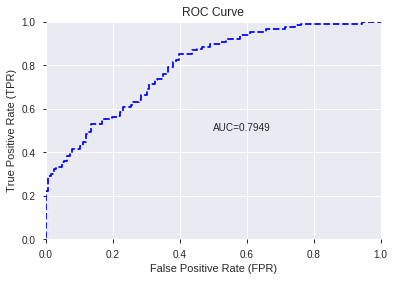

This function is available for GLM models only


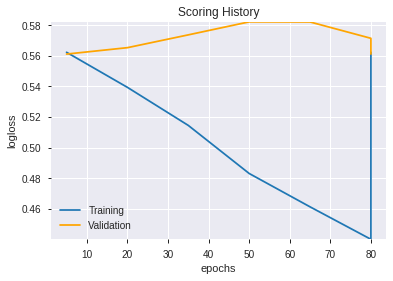

--2019-12-07 23:14:20--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.0.212
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.0.212|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


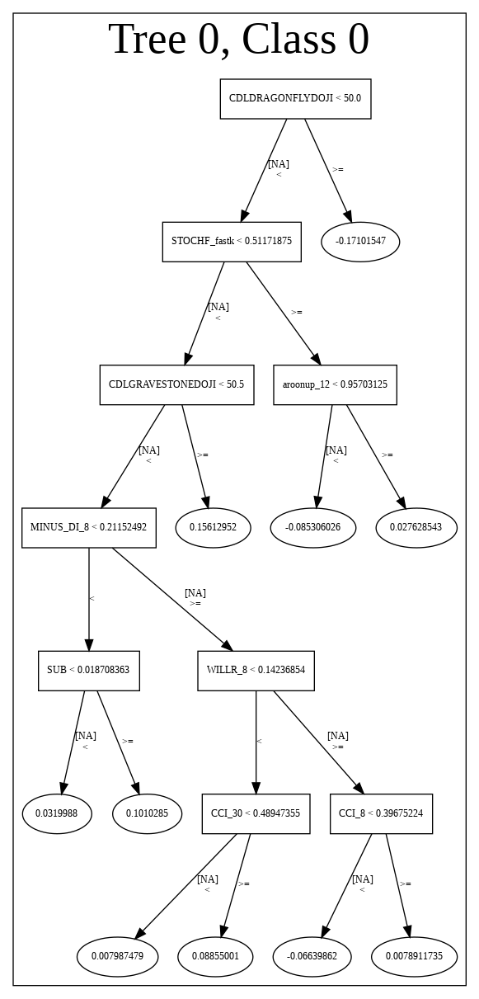

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_230717_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_230717_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_50_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLGRAVESTONEDOJI',
 'CDLTAKURI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'ULTOSC',
 'MINUS_DI_8',
 'CCI_8',
 'BETA_20',
 'TRANGE',
 'dayofyear',
 'CMO_8',
 'WILLR_12',
 'days_in_month',
 'CCI_14',
 'HT_PHASOR_quadrature',
 'LINEARREG_ANGLE_8',
 'NATR_24',
 'STDDEV_24',
 'WILLR_8',
 'BETA_30',
 'BBANDS_upperband_30_2_5',
 'CCI_12',
 'DIV',
 'PLUS_DI_14',
 'STDDEV_12',
 'aroonup_8',
 'WILLR_14',
 'MINUS_DM_8',
 'PLUS_DI_8',
 'ATR_24',
 'aroonup_12',
 'PLUS_DM_8',
 'CORREL_30',
 'TRIX_14',
 'STOCHRSI_fastk',
 'PLUS_DI_24',
 'BOP',
 'ADX_8',
 'MACDEXT_hist',
 'KAMA_14',
 'STOCH_slowk',
 'HT_DCPERIOD',
 'aroondown_8',
 'CCI_24',
 'aroondown_12',
 'BETA_8',
 'CORREL_20',
 'CCI_20',
 'STDDEV_8',
 'STOCH_slowd']

In [28]:
# DeepLearning with top XGBoost features
model_train(feature_name='XGBF',model_algo="DeepLearning",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_231516_model_1,0.820208,0.509784,0.271734,0.415264,0.172444


,variable,relative_importance,scaled_importance,percentage
0,STOCHF_fastk,0.614120,1.000000,0.069692
1,CCI_8,0.585653,0.953646,0.066462
2,CMO_8,0.523540,0.852506,0.059413
3,MINUS_DI_8,0.434641,0.707747,0.049324
4,CDLGRAVESTONEDOJI,0.429371,0.699165,0.048726
5,PLUS_DI_8,0.398733,0.649275,0.045249
6,LINEARREG_ANGLE_8,0.383506,0.624481,0.043521
7,DIV,0.361175,0.588118,0.040987
8,WILLR_14,0.359576,0.585515,0.040806
9,WILLR_12,0.306282,0.498734,0.034758


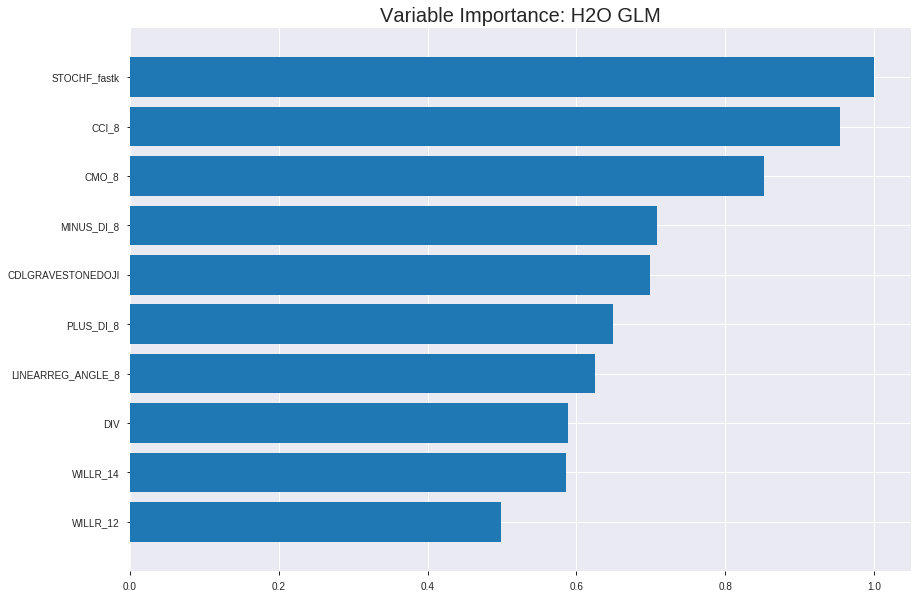

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_231516_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1792031521160172
RMSE: 0.423323932841054
LogLoss: 0.5324586872937423
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1903.007348387835
AIC: 2005.007348387835
AUC: 0.8080720398428731
pr_auc: 0.8010152766361633
Gini: 0.6161440796857462
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3911589670575051: 


,0,1,Error,Rate
0,462.0,429.0,0.4815,(429.0/891.0)
1,97.0,799.0,0.1083,(97.0/896.0)
Total,559.0,1228.0,0.2943,(526.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3911590,0.7523540,256.0
max f2,0.2283122,0.8604150,326.0
max f0point5,0.5266894,0.7326779,192.0
max accuracy,0.5048849,0.7313934,202.0
max precision,0.9956640,1.0,0.0
max recall,0.0368610,1.0,388.0
max specificity,0.9956640,1.0,0.0
max absolute_mcc,0.5048849,0.4628041,202.0
max min_per_class_accuracy,0.5102013,0.7299107,200.0
max mean_per_class_accuracy,0.5048849,0.7313725,202.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9680758,1.8836186,1.8836186,0.9444444,0.9803466,0.9444444,0.9803466,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9476126,1.9944196,1.9390191,1.0,0.9553120,0.9722222,0.9678293,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.9363234,1.7728175,1.8836186,0.8888889,0.9423669,0.9444444,0.9593418,0.0178571,0.0569196,77.2817460,88.3618552
,4,0.0402910,0.9226671,1.7728175,1.8559183,0.8888889,0.9294466,0.9305556,0.9518680,0.0178571,0.0747768,77.2817460,85.5918279
,5,0.0503637,0.9175079,1.8836186,1.8614583,0.9444444,0.9198910,0.9333333,0.9454726,0.0189732,0.09375,88.3618552,86.1458333
,6,0.1001679,0.8571446,1.8823736,1.8718575,0.9438202,0.8894029,0.9385475,0.9175944,0.09375,0.1875,88.2373596,87.1857542
,7,0.1499720,0.7755601,1.6582815,1.8009312,0.8314607,0.8168116,0.9029851,0.8841255,0.0825893,0.2700893,65.8281501,80.0931170
,8,0.2003358,0.7129576,1.5068948,1.7270114,0.7555556,0.7466893,0.8659218,0.8495745,0.0758929,0.3459821,50.6894841,72.7011423
,9,0.2999440,0.6264675,1.4341894,1.6297683,0.7191011,0.6662561,0.8171642,0.7886964,0.1428571,0.4888393,43.4189406,62.9768290
,10,0.4001119,0.5674165,1.2256210,1.5285902,0.6145251,0.5950494,0.7664336,0.7402169,0.1227679,0.6116071,22.5621010,52.8590160




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.17568431670531248
RMSE: 0.4191471301408522
LogLoss: 0.5269448045874279
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497421
Residual deviance: 538.5375902883515
AIC: 640.5375902883515
AUC: 0.8168814235312164
pr_auc: 0.7999579208630612
Gini: 0.6337628470624328
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42169181819523743: 


,0,1,Error,Rate
0,174.0,91.0,0.3434,(91.0/265.0)
1,36.0,210.0,0.1463,(36.0/246.0)
Total,210.0,301.0,0.2485,(127.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4216918,0.7678245,239.0
max f2,0.2403614,0.8453237,318.0
max f0point5,0.6251454,0.7584270,130.0
max accuracy,0.4864342,0.7514677,200.0
max precision,0.9943924,1.0,0.0
max recall,0.0530640,1.0,379.0
max specificity,0.9943924,1.0,0.0
max absolute_mcc,0.4216918,0.5181925,239.0
max min_per_class_accuracy,0.4806728,0.7509434,203.0
max mean_per_class_accuracy,0.4216918,0.7551312,239.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.09 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9733123,2.0772358,2.0772358,1.0,0.9819030,1.0,0.9819030,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9650014,1.6617886,1.8883962,0.8,0.9673476,0.9090909,0.9752869,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.9468888,2.0772358,1.9474085,1.0,0.9529868,0.9375,0.9683181,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.9361558,2.0772358,1.9783198,1.0,0.9426934,0.9523810,0.9622170,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.9313055,2.0772358,1.9973421,1.0,0.9338812,0.9615385,0.9567678,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8839371,1.8375547,1.9174484,0.8846154,0.9038195,0.9230769,0.9302936,0.0934959,0.1951220,83.7554722,91.7448405
,7,0.1506849,0.8251102,1.6617886,1.8344420,0.8,0.8541141,0.8831169,0.9055600,0.0813008,0.2764228,66.1788618,83.4441981
,8,0.2015656,0.7767477,1.5978737,1.7747257,0.7692308,0.8005700,0.8543689,0.8790577,0.0813008,0.3577236,59.7873671,77.4725708
,9,0.3013699,0.6447223,1.6292045,1.7265336,0.7843137,0.7079355,0.8311688,0.8223874,0.1626016,0.5203252,62.9204527,72.6533629
,10,0.4011742,0.5488757,1.1811733,1.5908586,0.5686275,0.5929821,0.7658537,0.7653158,0.1178862,0.6382114,18.1173282,59.0858616



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:15:16,0.000 sec,2,.16E2,51,1.3719874,1.3709639
,2019-12-07 23:15:16,0.006 sec,4,.96E1,51,1.3640311,1.3622699
,2019-12-07 23:15:16,0.017 sec,6,.6E1,51,1.3522829,1.3493773
,2019-12-07 23:15:16,0.028 sec,8,.37E1,51,1.3356483,1.3310237
,2019-12-07 23:15:16,0.036 sec,10,.23E1,51,1.3134437,1.3063368
---,---,---,---,---,---,---,---
,2019-12-07 23:15:16,0.129 sec,36,.47E-2,51,1.0609108,1.0549806
,2019-12-07 23:15:16,0.136 sec,38,.29E-2,51,1.0582516,1.0570208
,2019-12-07 23:15:16,0.144 sec,40,.18E-2,51,1.0565203,1.0594372
,2019-12-07 23:15:16,0.150 sec,42,.11E-2,51,1.0553912,1.0618469



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7661016949152543)

('auc', 0.8202075702075702)

('logloss', 0.5097843030001458)

('mean_per_class_error', 0.26520146520146515)

('rmse', 0.41526361538263135)

('mse', 0.172443870260654)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


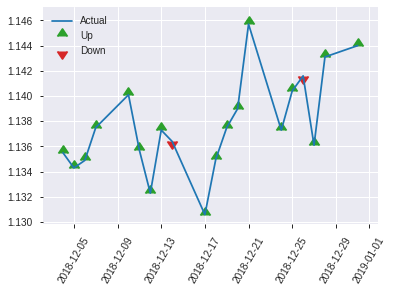


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.172443870260654
RMSE: 0.41526361538263135
LogLoss: 0.5097843030001458
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.8709766655013
Residual deviance: 261.0095631360747
AIC: 363.0095631360747
AUC: 0.8202075702075702
pr_auc: 0.8312031117206355
Gini: 0.6404151404151404
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.394802304157804: 


,0,1,Error,Rate
0,74.0,52.0,0.4127,(52.0/126.0)
1,17.0,113.0,0.1308,(17.0/130.0)
Total,91.0,165.0,0.2695,(69.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3948023,0.7661017,164.0
max f2,0.2772150,0.8686731,210.0
max f0point5,0.5251172,0.7490975,105.0
max accuracy,0.4990067,0.734375,121.0
max precision,0.9731925,1.0,0.0
max recall,0.0637764,1.0,241.0
max specificity,0.9731925,1.0,0.0
max absolute_mcc,0.3948023,0.4768325,164.0
max min_per_class_accuracy,0.4756125,0.7301587,128.0
max mean_per_class_accuracy,0.4990067,0.7347985,121.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9667210,1.9692308,1.9692308,1.0,0.9712153,1.0,0.9712153,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9462342,1.9692308,1.9692308,1.0,0.9579790,1.0,0.9645971,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9372499,1.9692308,1.9692308,1.0,0.9393239,1.0,0.9582788,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9284494,1.9692308,1.9692308,1.0,0.9328552,1.0,0.9513451,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9164739,1.9692308,1.9692308,1.0,0.9209547,1.0,0.9466697,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8684917,1.9692308,1.9692308,1.0,0.8920365,1.0,0.9193531,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7786684,1.9692308,1.9692308,1.0,0.8304091,1.0,0.8897051,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7053136,1.3633136,1.8177515,0.6923077,0.7382165,0.9230769,0.8518329,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.6077517,1.1815385,1.6111888,0.6,0.6490878,0.8181818,0.7860066,0.1153846,0.4846154,18.1538462,61.1188811
,10,0.4023438,0.5330553,1.2875740,1.5294996,0.6538462,0.5653451,0.7766990,0.7303057,0.1307692,0.6153846,28.7573964,52.9499627


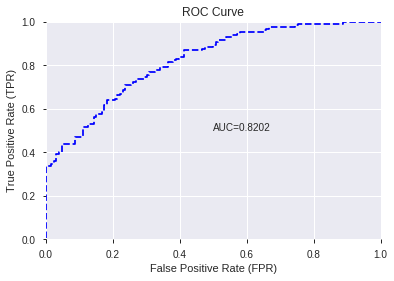

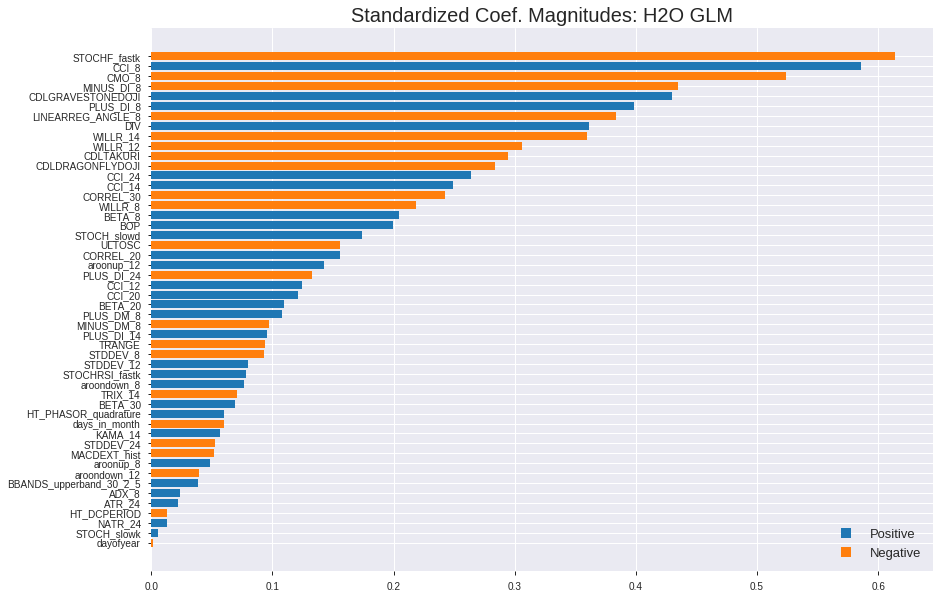

'log_likelihood'
--2019-12-07 23:15:25--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.237.59
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.237.59|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


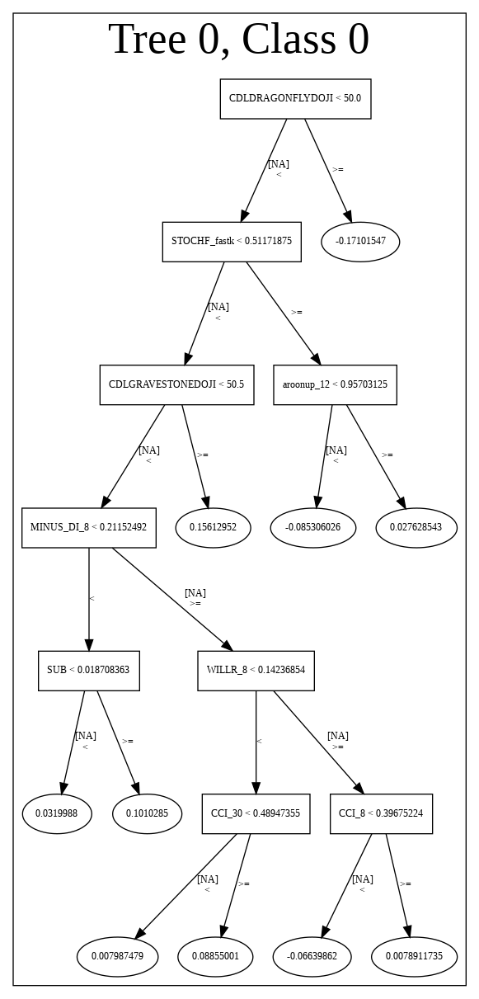

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_231516_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_231516_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_55_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_55_s

['STOCHF_fastk',
 'CCI_8',
 'CMO_8',
 'MINUS_DI_8',
 'CDLGRAVESTONEDOJI',
 'PLUS_DI_8',
 'LINEARREG_ANGLE_8',
 'DIV',
 'WILLR_14',
 'WILLR_12',
 'CDLTAKURI',
 'CDLDRAGONFLYDOJI',
 'CCI_24',
 'CCI_14',
 'CORREL_30',
 'WILLR_8',
 'BETA_8',
 'BOP',
 'STOCH_slowd',
 'ULTOSC',
 'CORREL_20',
 'aroonup_12',
 'PLUS_DI_24',
 'CCI_12',
 'CCI_20',
 'BETA_20',
 'PLUS_DM_8',
 'MINUS_DM_8',
 'PLUS_DI_14',
 'TRANGE',
 'STDDEV_8',
 'STDDEV_12',
 'STOCHRSI_fastk',
 'aroondown_8',
 'TRIX_14',
 'BETA_30',
 'HT_PHASOR_quadrature',
 'days_in_month',
 'KAMA_14',
 'STDDEV_24',
 'MACDEXT_hist',
 'aroonup_8',
 'aroondown_12',
 'BBANDS_upperband_30_2_5',
 'ADX_8',
 'ATR_24',
 'HT_DCPERIOD',
 'NATR_24',
 'STOCH_slowk',
 'dayofyear']

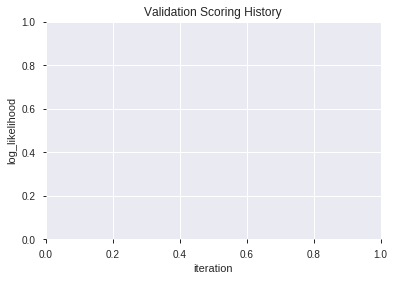

In [29]:
# GLM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GLM",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_231621_model_4,0.828449,0.519834,0.284005,0.416123,0.173158
1,XGBoost_3_AutoML_20191207_231621,0.824542,0.520602,0.247436,0.417081,0.173957
2,XGBoost_grid_1_AutoML_20191207_231621_model_7,0.822527,0.517176,0.239499,0.415306,0.172479
3,XGBoost_1_AutoML_20191207_231621,0.821245,0.522733,0.259341,0.418105,0.174812
4,XGBoost_grid_1_AutoML_20191207_231621_model_2,0.820330,0.520337,0.275824,0.417578,0.174372
5,XGBoost_grid_1_AutoML_20191207_231621_model_5,0.817643,0.517806,0.284493,0.418390,0.175050
6,XGBoost_grid_1_AutoML_20191207_231621_model_3,0.810623,0.529793,0.287485,0.422234,0.178281
7,XGBoost_2_AutoML_20191207_231621,0.810317,0.529389,0.279304,0.422491,0.178499
8,XGBoost_grid_1_AutoML_20191207_231621_model_1,0.802930,0.538639,0.303602,0.426768,0.182131
9,XGBoost_grid_1_AutoML_20191207_231621_model_6,0.797314,0.534940,0.316239,0.426713,0.182084


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,687.486084,1.000000,0.107943
1,CDLDRAGONFLYDOJI,623.279785,0.906607,0.097862
2,STOCHF_fastk,590.623352,0.859106,0.092735
3,CDLTAKURI,543.363464,0.790363,0.085314
4,CCI_8,416.272156,0.605499,0.065360
5,WILLR_8,393.032898,0.571696,0.061711
6,WILLR_12,225.110382,0.327440,0.035345
7,ULTOSC,218.268661,0.317488,0.034271
8,aroondown_8,208.329056,0.303030,0.032710
9,PLUS_DI_8,152.844208,0.222323,0.023998


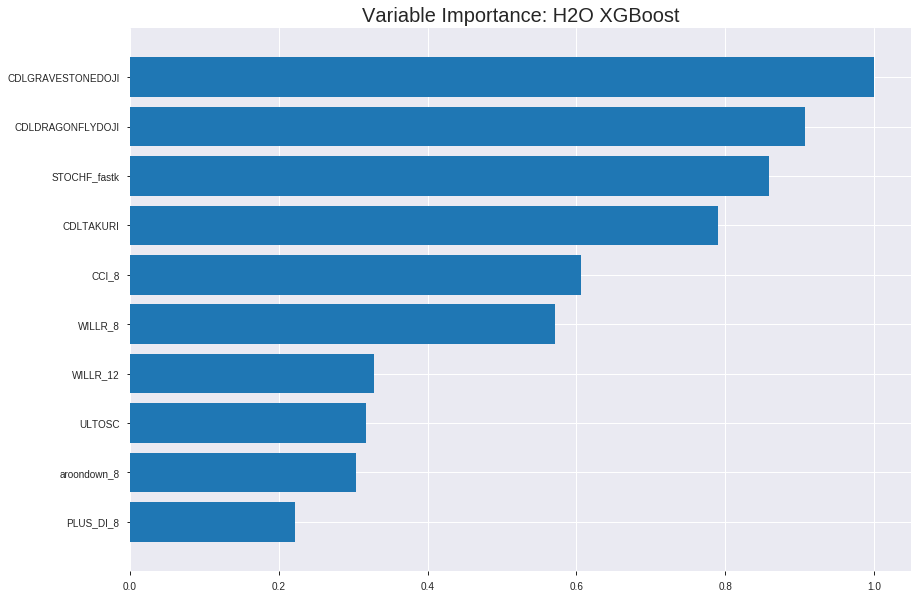

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_231621_model_4


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.15725359222405305
RMSE: 0.396552130525172
LogLoss: 0.4866000352534435
Mean Per-Class Error: 0.20154108044733055
AUC: 0.873602718654802
pr_auc: 0.864338700824644
Gini: 0.747205437309604
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4593795910477638: 


,0,1,Error,Rate
0,635.0,256.0,0.2873,(256.0/891.0)
1,114.0,782.0,0.1272,(114.0/896.0)
Total,749.0,1038.0,0.2071,(370.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4593796,0.8086867,217.0
max f2,0.3791068,0.8796775,263.0
max f0point5,0.5555627,0.8059211,164.0
max accuracy,0.4926485,0.7985450,199.0
max precision,0.9119270,1.0,0.0
max recall,0.1076792,1.0,382.0
max specificity,0.9119270,1.0,0.0
max absolute_mcc,0.4926485,0.5981125,199.0
max min_per_class_accuracy,0.5105809,0.7890011,188.0
max mean_per_class_accuracy,0.4926485,0.7984589,199.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.04 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8950619,1.9944196,1.9944196,1.0,0.9028201,1.0,0.9028201,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8849634,1.9944196,1.9944196,1.0,0.8895347,1.0,0.8961774,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8764366,1.9944196,1.9944196,1.0,0.8812432,1.0,0.8911994,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8676219,1.7728175,1.9390191,0.8888889,0.8725382,0.9722222,0.8865341,0.0178571,0.078125,77.2817460,93.9019097
,5,0.0503637,0.8587277,1.8836186,1.9279390,0.9444444,0.8635150,0.9666667,0.8819302,0.0189732,0.0970982,88.3618552,92.7938988
,6,0.1001679,0.8115601,1.8823736,1.9052836,0.9438202,0.8343156,0.9553073,0.8582559,0.09375,0.1908482,88.2373596,90.5283569
,7,0.1499720,0.7619643,1.7927368,1.8679079,0.8988764,0.7870828,0.9365672,0.8346201,0.0892857,0.2801339,79.2736758,86.7907949
,8,0.2003358,0.7160897,1.7063368,1.8272895,0.8555556,0.7388785,0.9162011,0.8105510,0.0859375,0.3660714,70.6336806,82.7289505
,9,0.2999440,0.6328429,1.6246677,1.7600009,0.8146067,0.6712300,0.8824627,0.7642839,0.1618304,0.5279018,62.4667687,76.0000916
,10,0.4001119,0.5693439,1.4707452,1.6875859,0.7374302,0.6010244,0.8461538,0.7234120,0.1473214,0.6752232,47.0745211,68.7585852




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.1765894035984348
RMSE: 0.42022541998127005
LogLoss: 0.5301694678791252
Mean Per-Class Error: 0.2511274735388863
AUC: 0.817479674796748
pr_auc: 0.797290955329876
Gini: 0.634959349593496
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5014535784721375: 


,0,1,Error,Rate
0,191.0,74.0,0.2792,(74.0/265.0)
1,55.0,191.0,0.2236,(55.0/246.0)
Total,246.0,265.0,0.2524,(129.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5014536,0.7475538,205.0
max f2,0.2322074,0.8464286,318.0
max f0point5,0.5927966,0.7600382,156.0
max accuracy,0.5927966,0.7495108,156.0
max precision,0.9105121,1.0,0.0
max recall,0.1248992,1.0,373.0
max specificity,0.9105121,1.0,0.0
max absolute_mcc,0.5927966,0.5033022,156.0
max min_per_class_accuracy,0.5205961,0.7433962,195.0
max mean_per_class_accuracy,0.5398720,0.7488725,188.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 50.69 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8945190,2.0772358,2.0772358,1.0,0.9041954,1.0,0.9041954,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8760222,2.0772358,2.0772358,1.0,0.8819369,1.0,0.8940779,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8685201,1.6617886,1.9474085,0.8,0.8709395,0.9375,0.8868471,0.0162602,0.0609756,66.1788618,94.7408537
,4,0.0410959,0.8645355,2.0772358,1.9783198,1.0,0.8662873,0.9523810,0.8819519,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8614465,2.0772358,1.9973421,1.0,0.8622612,0.9615385,0.8781653,0.0203252,0.1016260,107.7235772,99.7342089
,6,0.1017613,0.8332707,1.7576610,1.8775016,0.8461538,0.8447776,0.9038462,0.8614715,0.0894309,0.1910569,75.7661038,87.7501563
,7,0.1506849,0.7928675,1.7448780,1.8344420,0.84,0.8102190,0.8831169,0.8448311,0.0853659,0.2764228,74.4878049,83.4441981
,8,0.2015656,0.7511903,1.5978737,1.7747257,0.7692308,0.7751612,0.8543689,0.8272445,0.0813008,0.3577236,59.7873671,77.4725708
,9,0.3013699,0.6629416,1.5477443,1.6995565,0.7450980,0.7092275,0.8181818,0.7881609,0.1544715,0.5121951,54.7744301,69.9556541
,10,0.4011742,0.5901771,1.4255540,1.6313900,0.6862745,0.6235499,0.7853659,0.7472089,0.1422764,0.6544715,42.5553961,63.1390046



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:16:27,2.891 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 23:16:27,2.929 sec,5.0,0.4770523,0.6479285,0.8017382,0.5958456,1.7717868,0.2898713,0.4752125,0.6443561,0.7897224,0.4919682,1.8598506,0.3287671
,2019-12-07 23:16:27,2.952 sec,10.0,0.4629391,0.6200705,0.8093397,0.6023347,1.7717868,0.2708450,0.4614404,0.6170202,0.7847446,0.4879484,1.8598506,0.3365949
,2019-12-07 23:16:27,2.979 sec,15.0,0.4518795,0.5978956,0.8230181,0.7774711,1.9357602,0.2646894,0.4521731,0.5979343,0.7879276,0.5594300,1.9432206,0.3346380
,2019-12-07 23:16:27,3.005 sec,20.0,0.4422816,0.5784861,0.8280561,0.8086305,1.8894502,0.2439843,0.4424902,0.5781113,0.8031293,0.7345994,1.9288618,0.2994129
,2019-12-07 23:16:27,3.038 sec,25.0,0.4358081,0.5650067,0.8304555,0.8145958,1.9944196,0.2557359,0.4377117,0.5676591,0.8057064,0.7819280,2.0772358,0.3091977
,2019-12-07 23:16:27,3.068 sec,30.0,0.4303167,0.5537995,0.8368845,0.8255843,1.9944196,0.2439843,0.4334048,0.5583958,0.8089124,0.7857606,2.0772358,0.3091977
,2019-12-07 23:16:27,3.099 sec,35.0,0.4257887,0.5447482,0.8392193,0.8280881,1.9944196,0.2383884,0.4308261,0.5531273,0.8106918,0.7925631,2.0772358,0.3072407
,2019-12-07 23:16:27,3.133 sec,40.0,0.4212966,0.5357726,0.8427636,0.8317186,1.9944196,0.2417459,0.4281768,0.5473776,0.8134607,0.7979118,2.0772358,0.3033268
,2019-12-07 23:16:27,3.172 sec,45.0,0.4166935,0.5265696,0.8490573,0.8387404,1.9944196,0.2277560,0.4261857,0.5428869,0.8166053,0.8018767,2.0772358,0.2759295


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,687.4860840,1.0,0.1079433
CDLDRAGONFLYDOJI,623.2797852,0.9066071,0.0978622
STOCHF_fastk,590.6233521,0.8591059,0.0927348
CDLTAKURI,543.3634644,0.7903629,0.0853144
CCI_8,416.2721558,0.6054990,0.0653596
---,---,---,---
HT_PHASOR_quadrature,25.4862061,0.0370716,0.0040016
PLUS_DI_14,23.8600235,0.0347062,0.0037463
STDDEV_24,18.4536171,0.0268422,0.0028974
STOCHRSI_fastk,17.2961731,0.0251586,0.0027157



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.75390625)

('F1', 0.7631578947368421)

('auc', 0.8284493284493285)

('logloss', 0.5198341444894131)

('mean_per_class_error', 0.24621489621489623)

('rmse', 0.416122789190952)

('mse', 0.1731581756840575)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


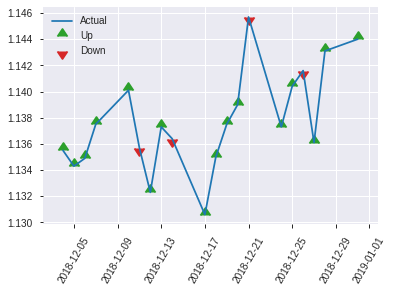


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1731581756840575
RMSE: 0.416122789190952
LogLoss: 0.5198341444894131
Mean Per-Class Error: 0.24621489621489623
AUC: 0.8284493284493285
pr_auc: 0.8405375878505552
Gini: 0.656898656898657
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3706682324409485: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,82.0,174.0,0.2812,(72.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3706682,0.7631579,173.0
max f2,0.2813261,0.8677686,205.0
max f0point5,0.6113360,0.7847534,78.0
max accuracy,0.5004335,0.7539062,130.0
max precision,0.9104905,1.0,0.0
max recall,0.1207565,1.0,241.0
max specificity,0.9104905,1.0,0.0
max absolute_mcc,0.4960576,0.5076515,132.0
max min_per_class_accuracy,0.5086265,0.7460317,128.0
max mean_per_class_accuracy,0.5004335,0.7537851,130.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 49.36 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8932352,1.9692308,1.9692308,1.0,0.9018687,1.0,0.9018687,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8852488,1.9692308,1.9692308,1.0,0.8894086,1.0,0.8956386,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8695557,1.9692308,1.9692308,1.0,0.8801951,1.0,0.8917778,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8613068,1.9692308,1.9692308,1.0,0.8634732,1.0,0.8840584,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8525088,1.9692308,1.9692308,1.0,0.8560400,1.0,0.8797478,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8181506,1.9692308,1.9692308,1.0,0.8392011,1.0,0.8594745,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7666176,1.9692308,1.9692308,1.0,0.7909640,1.0,0.8366376,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.6968279,1.3633136,1.8177515,0.6923077,0.7256645,0.9230769,0.8088944,0.0692308,0.3692308,36.3313609,81.7751479
,9,0.3007812,0.6116338,1.5753846,1.7390609,0.8,0.6510123,0.8831169,0.7576339,0.1538462,0.5230769,57.5384615,73.9060939
,10,0.4023438,0.5634349,1.0603550,1.5677371,0.5384615,0.5911700,0.7961165,0.7156139,0.1076923,0.6307692,6.0355030,56.7737117


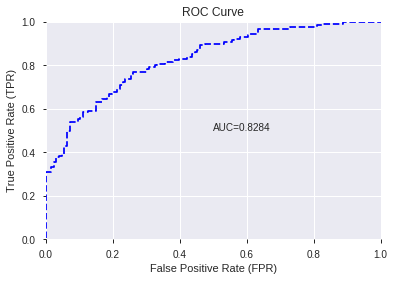

This function is available for GLM models only


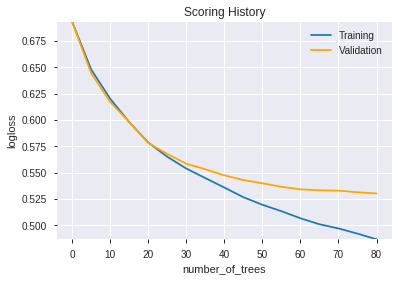

--2019-12-07 23:16:40--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.45.12
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.45.12|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
log4j:WARN No appenders could be found for logger (ml.dmlc.xgboost4j.java.Booster).
log4j:WARN Please initialize the log4j system properly.
log4j:WARN See http://logging.apache.org/log4j/1.2/faq.html#noconfig for more info.
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.ge

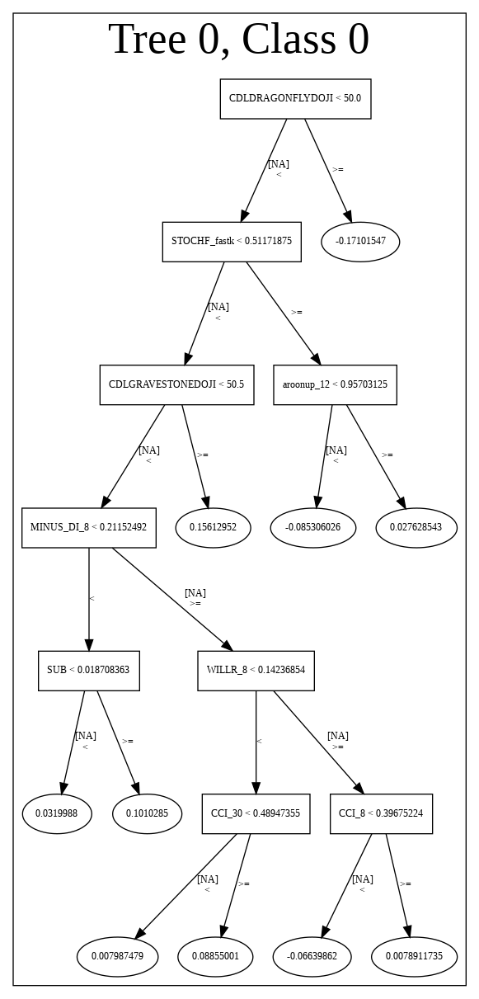

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_231621_model_4',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_231621_model_4',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_60_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'CDLTAKURI',
 'CCI_8',
 'WILLR_8',
 'WILLR_12',
 'ULTOSC',
 'aroondown_8',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'aroonup_12',
 'LINEARREG_ANGLE_8',
 'CCI_20',
 'CORREL_20',
 'WILLR_14',
 'ADX_8',
 'ATR_24',
 'CCI_14',
 'BBANDS_upperband_30_2_5',
 'PLUS_DM_8',
 'TRIX_14',
 'CCI_24',
 'BETA_8',
 'HT_DCPERIOD',
 'MINUS_DM_8',
 'dayofyear',
 'DIV',
 'STOCH_slowk',
 'STDDEV_12',
 'CMO_8',
 'BETA_30',
 'CORREL_30',
 'BOP',
 'aroonup_8',
 'BETA_20',
 'MACDEXT_hist',
 'PLUS_DI_24',
 'days_in_month',
 'STOCH_slowd',
 'NATR_24',
 'CCI_12',
 'STDDEV_8',
 'TRANGE',
 'HT_PHASOR_quadrature',
 'PLUS_DI_14',
 'STDDEV_24',
 'STOCHRSI_fastk',
 'KAMA_14']

In [30]:
# XGBoost with top XGBoost features
model_train(feature_name='XGBF',model_algo="XGBoost",features_list = features_list[:model_selected_features])

In [31]:
# DRF with top XGBoost features
model_train(feature_name='XGBF',model_algo="DRF",features_list = features_list[:model_selected_features])

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191207_231843,0.828022,0.512022,0.231197,0.413405,0.170904
1,GBM_grid_1_AutoML_20191207_231843_model_1,0.812149,0.583682,0.307814,0.444766,0.197817
2,GBM_2_AutoML_20191207_231843,0.808059,0.526863,0.271978,0.422468,0.178479
3,GBM_4_AutoML_20191207_231843,0.806227,0.534634,0.263187,0.425335,0.180910
4,GBM_grid_1_AutoML_20191207_231843_model_5,0.803053,0.685670,0.275458,0.496248,0.246262
5,GBM_1_AutoML_20191207_231843,0.802442,0.532725,0.316850,0.425466,0.181021
6,GBM_3_AutoML_20191207_231843,0.801465,0.539078,0.271612,0.427005,0.182333
7,GBM_grid_1_AutoML_20191207_231843_model_2,0.798962,0.594571,0.290476,0.450469,0.202922
8,GBM_grid_1_AutoML_20191207_231843_model_3,0.796764,0.661230,0.260073,0.458965,0.210649
9,GBM_grid_1_AutoML_20191207_231843_model_4,0.794628,0.648961,0.282662,0.477554,0.228058


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,145.580994,1.000000,0.155294
1,CDLGRAVESTONEDOJI,108.555595,0.745671,0.115798
2,CDLDRAGONFLYDOJI,81.996315,0.563235,0.087467
3,STOCHF_fastk,71.688301,0.492429,0.076471
4,WILLR_8,60.390278,0.414823,0.064419
5,CCI_8,54.613792,0.375144,0.058258
6,WILLR_12,41.080276,0.282182,0.043821
7,aroondown_8,24.334927,0.167157,0.025959
8,aroonup_12,23.883734,0.164058,0.025477
9,ULTOSC,20.200752,0.138760,0.021549


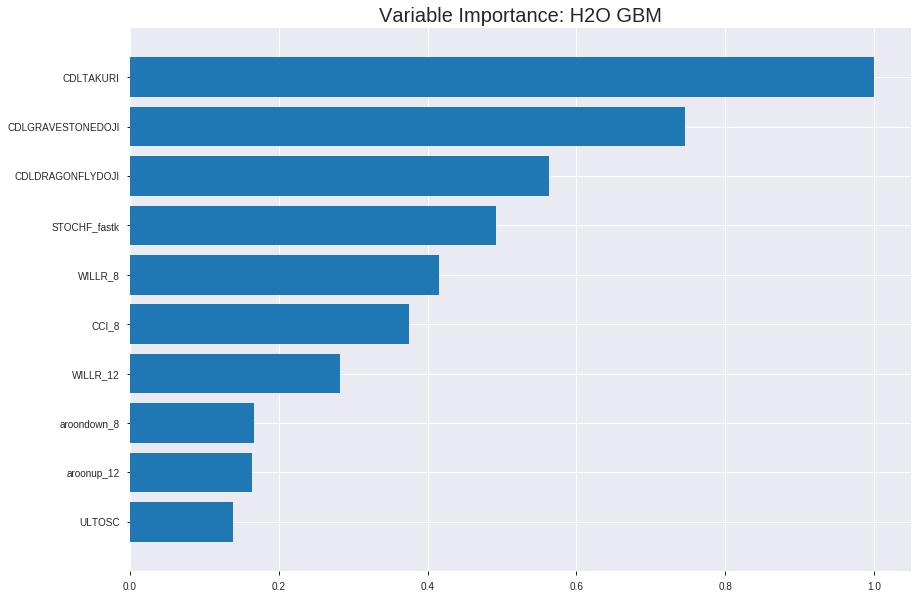

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191207_231843


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.14521838262715422
RMSE: 0.38107529784434235
LogLoss: 0.4558799655517061
Mean Per-Class Error: 0.18976596320346317
AUC: 0.8907045404441238
pr_auc: 0.8836596887991064
Gini: 0.7814090808882477
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4394234368711757: 


,0,1,Error,Rate
0,639.0,252.0,0.2828,(252.0/891.0)
1,98.0,798.0,0.1094,(98.0/896.0)
Total,737.0,1050.0,0.1959,(350.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4394234,0.8201439,227.0
max f2,0.3383712,0.8876589,276.0
max f0point5,0.5910659,0.8324382,157.0
max accuracy,0.4913579,0.8102966,204.0
max precision,0.9414304,1.0,0.0
max recall,0.0843375,1.0,382.0
max specificity,0.9414304,1.0,0.0
max absolute_mcc,0.5501293,0.6219889,176.0
max min_per_class_accuracy,0.5096487,0.8058036,194.0
max mean_per_class_accuracy,0.4913579,0.8102340,204.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9188127,1.9944196,1.9944196,1.0,0.9293947,1.0,0.9293947,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9107902,1.9944196,1.9944196,1.0,0.9145378,1.0,0.9219662,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9016148,1.9944196,1.9944196,1.0,0.9072415,1.0,0.9170580,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8915240,1.8836186,1.9667194,0.9444444,0.8964004,0.9861111,0.9118936,0.0189732,0.0792411,88.3618552,96.6719370
,5,0.0503637,0.8823652,1.8836186,1.9500992,0.9444444,0.8870403,0.9777778,0.9069229,0.0189732,0.0982143,88.3618552,95.0099206
,6,0.1001679,0.8412793,1.8599644,1.9052836,0.9325843,0.8644395,0.9553073,0.8857999,0.0926339,0.1908482,85.9964386,90.5283569
,7,0.1499720,0.7988008,1.8599644,1.8902335,0.9325843,0.8187975,0.9477612,0.8635491,0.0926339,0.2834821,85.9964386,89.0233542
,8,0.2003358,0.7449293,1.8171379,1.8718575,0.9111111,0.7752037,0.9385475,0.8413394,0.0915179,0.375,81.7137897,87.1857542
,9,0.2999440,0.6611909,1.6582815,1.8009312,0.8314607,0.6990153,0.9029851,0.7940750,0.1651786,0.5401786,65.8281501,80.0931170
,10,0.4001119,0.5848360,1.5487393,1.7377950,0.7765363,0.6228756,0.8713287,0.7512153,0.1551339,0.6953125,54.8739276,73.7795017




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.172770417603059
RMSE: 0.4156566102001254
LogLoss: 0.5204800256032003
Mean Per-Class Error: 0.2528685381193434
AUC: 0.8214450069028992
pr_auc: 0.7949266428867974
Gini: 0.6428900138057985
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3598052217437385: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,23.0,223.0,0.0935,(23.0/246.0)
Total,169.0,342.0,0.2779,(142.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3598052,0.7585034,268.0
max f2,0.2482968,0.8513709,319.0
max f0point5,0.6415071,0.7578947,137.0
max accuracy,0.5104579,0.7475538,193.0
max precision,0.9392345,1.0,0.0
max recall,0.0837315,1.0,388.0
max specificity,0.9392345,1.0,0.0
max absolute_mcc,0.5104579,0.4943388,193.0
max min_per_class_accuracy,0.4972020,0.7398374,197.0
max mean_per_class_accuracy,0.5104579,0.7471315,193.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9066204,2.0772358,2.0772358,1.0,0.9222040,1.0,0.9222040,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8995273,2.0772358,2.0772358,1.0,0.9019689,1.0,0.9130062,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8912461,1.2463415,1.8175813,0.6,0.8950980,0.875,0.9074099,0.0121951,0.0569106,24.6341463,81.7581301
,4,0.0410959,0.8873869,2.0772358,1.8794038,1.0,0.8888962,0.9047619,0.9030019,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8836342,1.6617886,1.8375547,0.8,0.8855030,0.8846154,0.8996367,0.0162602,0.0934959,66.1788618,83.7554722
,6,0.1017613,0.8490066,1.9174484,1.8775016,0.9230769,0.8656688,0.9038462,0.8826528,0.0975610,0.1910569,91.7448405,87.7501563
,7,0.1506849,0.8165290,1.6617886,1.8074649,0.8,0.8316610,0.8701299,0.8660970,0.0813008,0.2723577,66.1788618,80.7464893
,8,0.2015656,0.7840043,1.6777674,1.7747257,0.8076923,0.8022385,0.8543689,0.8499774,0.0853659,0.3577236,67.7767355,77.4725708
,9,0.3013699,0.6798649,1.5477443,1.6995565,0.7450980,0.7357006,0.8181818,0.8121325,0.1544715,0.5121951,54.7744301,69.9556541
,10,0.4011742,0.5680162,1.3440937,1.6111243,0.6470588,0.6268590,0.7756098,0.7660401,0.1341463,0.6463415,34.4093735,61.1124331



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:18:48,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-07 23:18:48,0.054 sec,5.0,0.4581532,0.6110873,0.8103255,0.7431091,1.8856331,0.2937885,0.4564344,0.6077386,0.8087820,0.6917517,1.7310298,0.2661448
,2019-12-07 23:18:48,0.096 sec,10.0,0.4380936,0.5705154,0.8258578,0.8013854,1.6922348,0.2686066,0.4393337,0.5720949,0.8091272,0.7851532,2.0772358,0.2915851
,2019-12-07 23:18:48,0.142 sec,15.0,0.4256046,0.5444402,0.8356362,0.8222970,1.7728175,0.2462227,0.4293602,0.5504127,0.8152017,0.7926040,1.9288618,0.2837573
,2019-12-07 23:18:48,0.190 sec,20.0,0.4154202,0.5234912,0.8456095,0.8338541,1.9944196,0.2434247,0.4246179,0.5393560,0.8151097,0.7879251,1.9041328,0.3052838
,2019-12-07 23:18:48,0.241 sec,25.0,0.4074470,0.5075143,0.8556798,0.8465528,1.9944196,0.2294348,0.4217595,0.5331840,0.8173109,0.7915927,2.0772358,0.2974560
,2019-12-07 23:18:48,0.289 sec,30.0,0.3999817,0.4926617,0.8662831,0.8573706,1.9944196,0.2204813,0.4197189,0.5293697,0.8194278,0.7910548,1.7310298,0.2544031
,2019-12-07 23:18:48,0.335 sec,35.0,0.3929234,0.4787128,0.8751823,0.8668310,1.9944196,0.2221600,0.4181588,0.5257224,0.8194662,0.7977964,2.0772358,0.2915851
,2019-12-07 23:18:48,0.382 sec,40.0,0.3865025,0.4659829,0.8834639,0.8767682,1.9944196,0.2081701,0.4166647,0.5223963,0.8213376,0.7984113,2.0772358,0.2778865
,2019-12-07 23:18:48,0.432 sec,45.0,0.3810753,0.4558800,0.8907045,0.8836597,1.9944196,0.1958590,0.4156566,0.5204800,0.8214450,0.7949266,2.0772358,0.2778865


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,145.5809937,1.0,0.1552939
CDLGRAVESTONEDOJI,108.5555954,0.7456715,0.1157982
CDLDRAGONFLYDOJI,81.9963150,0.5632350,0.0874670
STOCHF_fastk,71.6883011,0.4924290,0.0764712
WILLR_8,60.3902779,0.4148225,0.0644194
---,---,---,---
STOCH_slowk,4.2052860,0.0288862,0.0044859
MINUS_DM_8,3.3135939,0.0227612,0.0035347
CORREL_30,2.0135589,0.0138312,0.0021479
KAMA_14,1.9164637,0.0131642,0.0020443



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.76953125)

('F1', 0.7822878228782287)

('auc', 0.8280219780219781)

('logloss', 0.5120220964185226)

('mean_per_class_error', 0.23119658119658126)

('rmse', 0.41340516460883886)

('mse', 0.17090383012526117)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


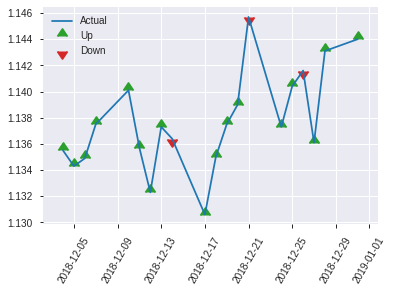


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17090383012526117
RMSE: 0.41340516460883886
LogLoss: 0.5120220964185226
Mean Per-Class Error: 0.23119658119658126
AUC: 0.8280219780219781
pr_auc: 0.8329162606521099
Gini: 0.6560439560439562
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45642792562956436: 


,0,1,Error,Rate
0,91.0,35.0,0.2778,(35.0/126.0)
1,24.0,106.0,0.1846,(24.0/130.0)
Total,115.0,141.0,0.2305,(59.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4564279,0.7822878,140.0
max f2,0.2465982,0.8677686,205.0
max f0point5,0.4564279,0.7636888,140.0
max accuracy,0.4564279,0.7695312,140.0
max precision,0.9220742,1.0,0.0
max recall,0.1155405,1.0,234.0
max specificity,0.9220742,1.0,0.0
max absolute_mcc,0.4564279,0.5403352,140.0
max min_per_class_accuracy,0.5018499,0.7380952,128.0
max mean_per_class_accuracy,0.4564279,0.7688034,140.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9124868,1.9692308,1.9692308,1.0,0.9181161,1.0,0.9181161,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9007695,1.9692308,1.9692308,1.0,0.9072333,1.0,0.9126747,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8961298,1.9692308,1.9692308,1.0,0.8983997,1.0,0.9091059,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8872315,1.9692308,1.9692308,1.0,0.8923984,1.0,0.9045493,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8773614,1.9692308,1.9692308,1.0,0.8835690,1.0,0.9013216,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8406826,1.9692308,1.9692308,1.0,0.8576043,1.0,0.8794630,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7880279,1.8177515,1.9187377,0.9230769,0.8125205,0.9743590,0.8571488,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7260631,1.3633136,1.7798817,0.6923077,0.7594207,0.9038462,0.8327168,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6314414,1.4178462,1.6623377,0.72,0.6773080,0.8441558,0.7822594,0.1384615,0.5,41.7846154,66.2337662
,10,0.4023438,0.5497797,1.1360947,1.5294996,0.5769231,0.5942579,0.7766990,0.7348027,0.1153846,0.6153846,13.6094675,52.9499627


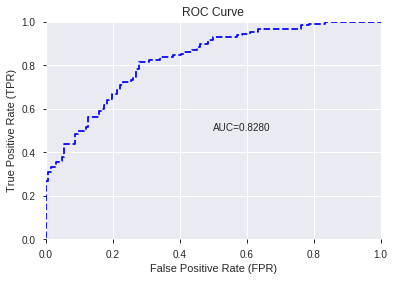

This function is available for GLM models only


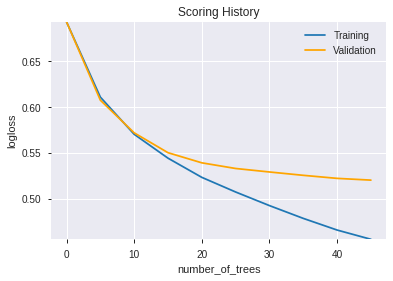

--2019-12-07 23:19:00--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.204.51
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.204.51|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1569.0
            depth:       1
            colId:       38
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.059467815
            squaredErr:  386.43723
            leftChild:   Node 3
            ri

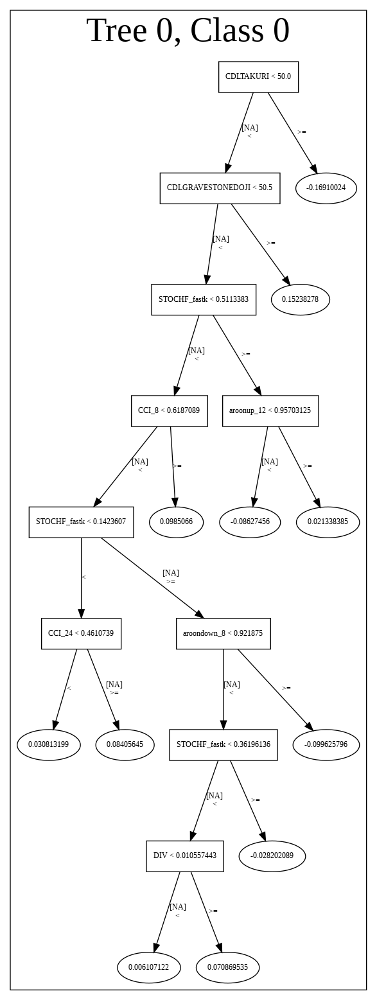

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191207_231843',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191207_231843',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_70_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_70_sid_8e77',
   'type': 'Key<

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'WILLR_12',
 'aroondown_8',
 'aroonup_12',
 'ULTOSC',
 'LINEARREG_ANGLE_8',
 'MINUS_DI_8',
 'CCI_20',
 'aroonup_8',
 'CORREL_20',
 'aroondown_12',
 'PLUS_DM_8',
 'ATR_24',
 'PLUS_DI_8',
 'CCI_12',
 'CCI_14',
 'WILLR_14',
 'ADX_8',
 'DIV',
 'STDDEV_12',
 'HT_DCPERIOD',
 'NATR_24',
 'dayofyear',
 'BBANDS_upperband_30_2_5',
 'STOCH_slowd',
 'CCI_24',
 'TRIX_14',
 'PLUS_DI_24',
 'PLUS_DI_14',
 'BOP',
 'TRANGE',
 'CMO_8',
 'STDDEV_24',
 'STOCHRSI_fastk',
 'HT_PHASOR_quadrature',
 'days_in_month',
 'MACDEXT_hist',
 'STDDEV_8',
 'BETA_8',
 'BETA_20',
 'STOCH_slowk',
 'MINUS_DM_8',
 'CORREL_30',
 'KAMA_14',
 'BETA_30']

In [32]:
# GBM with top XGBoost features
model_train(feature_name='XGBF',model_algo="GBM",features_list = features_list[:model_selected_features])

In [33]:
# StackedEnsemble with top XGBoost features
model_train(feature_name='XGBF',model_algo="StackedEnsemble",features_list = features_list[:model_selected_features])

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_5_AutoML_20191207_231958,0.828022,0.512022,0.231197,0.413405,0.170904
1,XGBoost_3_AutoML_20191207_231958,0.824542,0.520602,0.247436,0.417081,0.173957
2,XGBoost_1_AutoML_20191207_231958,0.821245,0.522733,0.259341,0.418105,0.174812
3,GLM_grid_1_AutoML_20191207_231958_model_1,0.820208,0.509784,0.271734,0.415264,0.172444
4,XGBoost_2_AutoML_20191207_231958,0.810317,0.529389,0.279304,0.422491,0.178499
5,GBM_2_AutoML_20191207_231958,0.808059,0.526863,0.271978,0.422468,0.178479
6,GBM_4_AutoML_20191207_231958,0.806227,0.534634,0.263187,0.425335,0.180910
7,GBM_1_AutoML_20191207_231958,0.802442,0.532725,0.316850,0.425466,0.181021
8,GBM_3_AutoML_20191207_231958,0.801465,0.539078,0.271612,0.427005,0.182333
9,DRF_1_AutoML_20191207_231958,0.756349,0.581308,0.372161,0.448072,0.200768


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,145.580994,1.000000,0.155294
1,CDLGRAVESTONEDOJI,108.555595,0.745671,0.115798
2,CDLDRAGONFLYDOJI,81.996315,0.563235,0.087467
3,STOCHF_fastk,71.688301,0.492429,0.076471
4,WILLR_8,60.390278,0.414823,0.064419
5,CCI_8,54.613792,0.375144,0.058258
6,WILLR_12,41.080276,0.282182,0.043821
7,aroondown_8,24.334927,0.167157,0.025959
8,aroonup_12,23.883734,0.164058,0.025477
9,ULTOSC,20.200752,0.138760,0.021549


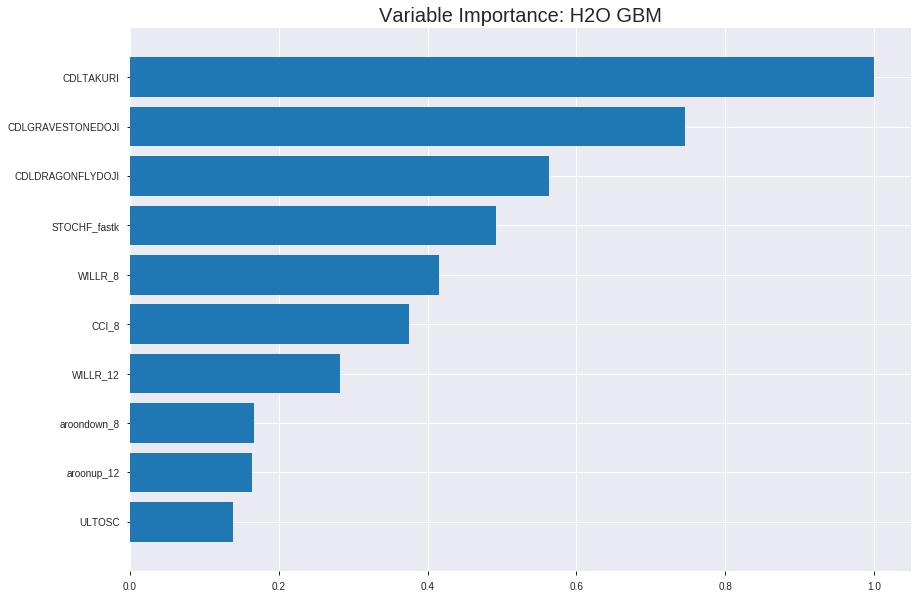

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_5_AutoML_20191207_231958


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.14521838262715422
RMSE: 0.38107529784434235
LogLoss: 0.4558799655517061
Mean Per-Class Error: 0.18976596320346317
AUC: 0.8907045404441238
pr_auc: 0.8836596887991064
Gini: 0.7814090808882477
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4394234368711757: 


,0,1,Error,Rate
0,639.0,252.0,0.2828,(252.0/891.0)
1,98.0,798.0,0.1094,(98.0/896.0)
Total,737.0,1050.0,0.1959,(350.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4394234,0.8201439,227.0
max f2,0.3383712,0.8876589,276.0
max f0point5,0.5910659,0.8324382,157.0
max accuracy,0.4913579,0.8102966,204.0
max precision,0.9414304,1.0,0.0
max recall,0.0843375,1.0,382.0
max specificity,0.9414304,1.0,0.0
max absolute_mcc,0.5501293,0.6219889,176.0
max min_per_class_accuracy,0.5096487,0.8058036,194.0
max mean_per_class_accuracy,0.4913579,0.8102340,204.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9188127,1.9944196,1.9944196,1.0,0.9293947,1.0,0.9293947,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9107902,1.9944196,1.9944196,1.0,0.9145378,1.0,0.9219662,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9016148,1.9944196,1.9944196,1.0,0.9072415,1.0,0.9170580,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8915240,1.8836186,1.9667194,0.9444444,0.8964004,0.9861111,0.9118936,0.0189732,0.0792411,88.3618552,96.6719370
,5,0.0503637,0.8823652,1.8836186,1.9500992,0.9444444,0.8870403,0.9777778,0.9069229,0.0189732,0.0982143,88.3618552,95.0099206
,6,0.1001679,0.8412793,1.8599644,1.9052836,0.9325843,0.8644395,0.9553073,0.8857999,0.0926339,0.1908482,85.9964386,90.5283569
,7,0.1499720,0.7988008,1.8599644,1.8902335,0.9325843,0.8187975,0.9477612,0.8635491,0.0926339,0.2834821,85.9964386,89.0233542
,8,0.2003358,0.7449293,1.8171379,1.8718575,0.9111111,0.7752037,0.9385475,0.8413394,0.0915179,0.375,81.7137897,87.1857542
,9,0.2999440,0.6611909,1.6582815,1.8009312,0.8314607,0.6990153,0.9029851,0.7940750,0.1651786,0.5401786,65.8281501,80.0931170
,10,0.4001119,0.5848360,1.5487393,1.7377950,0.7765363,0.6228756,0.8713287,0.7512153,0.1551339,0.6953125,54.8739276,73.7795017




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.172770417603059
RMSE: 0.4156566102001254
LogLoss: 0.5204800256032003
Mean Per-Class Error: 0.2528685381193434
AUC: 0.8214450069028992
pr_auc: 0.7949266428867974
Gini: 0.6428900138057985
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3598052217437385: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,23.0,223.0,0.0935,(23.0/246.0)
Total,169.0,342.0,0.2779,(142.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3598052,0.7585034,268.0
max f2,0.2482968,0.8513709,319.0
max f0point5,0.6415071,0.7578947,137.0
max accuracy,0.5104579,0.7475538,193.0
max precision,0.9392345,1.0,0.0
max recall,0.0837315,1.0,388.0
max specificity,0.9392345,1.0,0.0
max absolute_mcc,0.5104579,0.4943388,193.0
max min_per_class_accuracy,0.4972020,0.7398374,197.0
max mean_per_class_accuracy,0.5104579,0.7471315,193.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.64 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9066204,2.0772358,2.0772358,1.0,0.9222040,1.0,0.9222040,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8995273,2.0772358,2.0772358,1.0,0.9019689,1.0,0.9130062,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.8912461,1.2463415,1.8175813,0.6,0.8950980,0.875,0.9074099,0.0121951,0.0569106,24.6341463,81.7581301
,4,0.0410959,0.8873869,2.0772358,1.8794038,1.0,0.8888962,0.9047619,0.9030019,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8836342,1.6617886,1.8375547,0.8,0.8855030,0.8846154,0.8996367,0.0162602,0.0934959,66.1788618,83.7554722
,6,0.1017613,0.8490066,1.9174484,1.8775016,0.9230769,0.8656688,0.9038462,0.8826528,0.0975610,0.1910569,91.7448405,87.7501563
,7,0.1506849,0.8165290,1.6617886,1.8074649,0.8,0.8316610,0.8701299,0.8660970,0.0813008,0.2723577,66.1788618,80.7464893
,8,0.2015656,0.7840043,1.6777674,1.7747257,0.8076923,0.8022385,0.8543689,0.8499774,0.0853659,0.3577236,67.7767355,77.4725708
,9,0.3013699,0.6798649,1.5477443,1.6995565,0.7450980,0.7357006,0.8181818,0.8121325,0.1544715,0.5121951,54.7744301,69.9556541
,10,0.4011742,0.5680162,1.3440937,1.6111243,0.6470588,0.6268590,0.7756098,0.7660401,0.1341463,0.6463415,34.4093735,61.1124331



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:20:07,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-07 23:20:07,0.052 sec,5.0,0.4581532,0.6110873,0.8103255,0.7431091,1.8856331,0.2937885,0.4564344,0.6077386,0.8087820,0.6917517,1.7310298,0.2661448
,2019-12-07 23:20:07,0.101 sec,10.0,0.4380936,0.5705154,0.8258578,0.8013854,1.6922348,0.2686066,0.4393337,0.5720949,0.8091272,0.7851532,2.0772358,0.2915851
,2019-12-07 23:20:07,0.157 sec,15.0,0.4256046,0.5444402,0.8356362,0.8222970,1.7728175,0.2462227,0.4293602,0.5504127,0.8152017,0.7926040,1.9288618,0.2837573
,2019-12-07 23:20:07,0.206 sec,20.0,0.4154202,0.5234912,0.8456095,0.8338541,1.9944196,0.2434247,0.4246179,0.5393560,0.8151097,0.7879251,1.9041328,0.3052838
,2019-12-07 23:20:07,0.255 sec,25.0,0.4074470,0.5075143,0.8556798,0.8465528,1.9944196,0.2294348,0.4217595,0.5331840,0.8173109,0.7915927,2.0772358,0.2974560
,2019-12-07 23:20:07,0.303 sec,30.0,0.3999817,0.4926617,0.8662831,0.8573706,1.9944196,0.2204813,0.4197189,0.5293697,0.8194278,0.7910548,1.7310298,0.2544031
,2019-12-07 23:20:07,0.352 sec,35.0,0.3929234,0.4787128,0.8751823,0.8668310,1.9944196,0.2221600,0.4181588,0.5257224,0.8194662,0.7977964,2.0772358,0.2915851
,2019-12-07 23:20:07,0.400 sec,40.0,0.3865025,0.4659829,0.8834639,0.8767682,1.9944196,0.2081701,0.4166647,0.5223963,0.8213376,0.7984113,2.0772358,0.2778865
,2019-12-07 23:20:07,0.451 sec,45.0,0.3810753,0.4558800,0.8907045,0.8836597,1.9944196,0.1958590,0.4156566,0.5204800,0.8214450,0.7949266,2.0772358,0.2778865


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,145.5809937,1.0,0.1552939
CDLGRAVESTONEDOJI,108.5555954,0.7456715,0.1157982
CDLDRAGONFLYDOJI,81.9963150,0.5632350,0.0874670
STOCHF_fastk,71.6883011,0.4924290,0.0764712
WILLR_8,60.3902779,0.4148225,0.0644194
---,---,---,---
STOCH_slowk,4.2052860,0.0288862,0.0044859
MINUS_DM_8,3.3135939,0.0227612,0.0035347
CORREL_30,2.0135589,0.0138312,0.0021479
KAMA_14,1.9164637,0.0131642,0.0020443



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.76953125)

('F1', 0.7822878228782287)

('auc', 0.8280219780219781)

('logloss', 0.5120220964185226)

('mean_per_class_error', 0.23119658119658126)

('rmse', 0.41340516460883886)

('mse', 0.17090383012526117)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


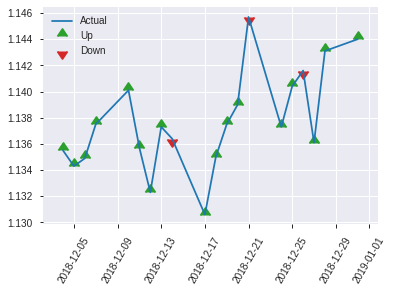


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17090383012526117
RMSE: 0.41340516460883886
LogLoss: 0.5120220964185226
Mean Per-Class Error: 0.23119658119658126
AUC: 0.8280219780219781
pr_auc: 0.8329162606521099
Gini: 0.6560439560439562
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.45642792562956436: 


,0,1,Error,Rate
0,91.0,35.0,0.2778,(35.0/126.0)
1,24.0,106.0,0.1846,(24.0/130.0)
Total,115.0,141.0,0.2305,(59.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4564279,0.7822878,140.0
max f2,0.2465982,0.8677686,205.0
max f0point5,0.4564279,0.7636888,140.0
max accuracy,0.4564279,0.7695312,140.0
max precision,0.9220742,1.0,0.0
max recall,0.1155405,1.0,234.0
max specificity,0.9220742,1.0,0.0
max absolute_mcc,0.4564279,0.5403352,140.0
max min_per_class_accuracy,0.5018499,0.7380952,128.0
max mean_per_class_accuracy,0.4564279,0.7688034,140.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.92 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9124868,1.9692308,1.9692308,1.0,0.9181161,1.0,0.9181161,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9007695,1.9692308,1.9692308,1.0,0.9072333,1.0,0.9126747,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8961298,1.9692308,1.9692308,1.0,0.8983997,1.0,0.9091059,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8872315,1.9692308,1.9692308,1.0,0.8923984,1.0,0.9045493,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8773614,1.9692308,1.9692308,1.0,0.8835690,1.0,0.9013216,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8406826,1.9692308,1.9692308,1.0,0.8576043,1.0,0.8794630,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7880279,1.8177515,1.9187377,0.9230769,0.8125205,0.9743590,0.8571488,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7260631,1.3633136,1.7798817,0.6923077,0.7594207,0.9038462,0.8327168,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.6314414,1.4178462,1.6623377,0.72,0.6773080,0.8441558,0.7822594,0.1384615,0.5,41.7846154,66.2337662
,10,0.4023438,0.5497797,1.1360947,1.5294996,0.5769231,0.5942579,0.7766990,0.7348027,0.1153846,0.6153846,13.6094675,52.9499627


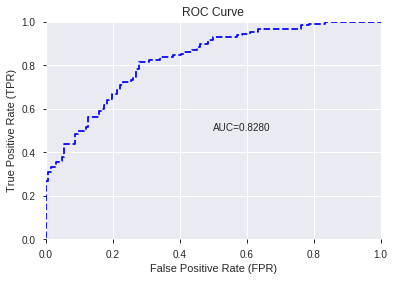

This function is available for GLM models only


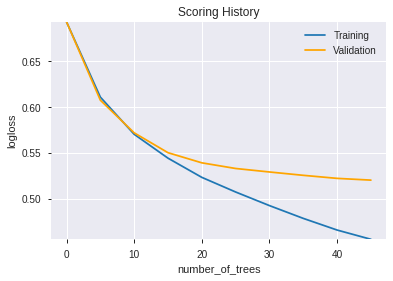

--2019-12-07 23:20:15--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.140.252
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.140.252|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 1 (parent)
            weight:      1569.0
            depth:       1
            colId:       38
            colName:     CDLGRAVESTONEDOJI
            leftward:    true
            naVsRest:    false
            splitVal:    50.5
            isBitset:    false
            predValue:   0.059467815
            squaredErr:  386.43723
            leftChild:   Node 3
            

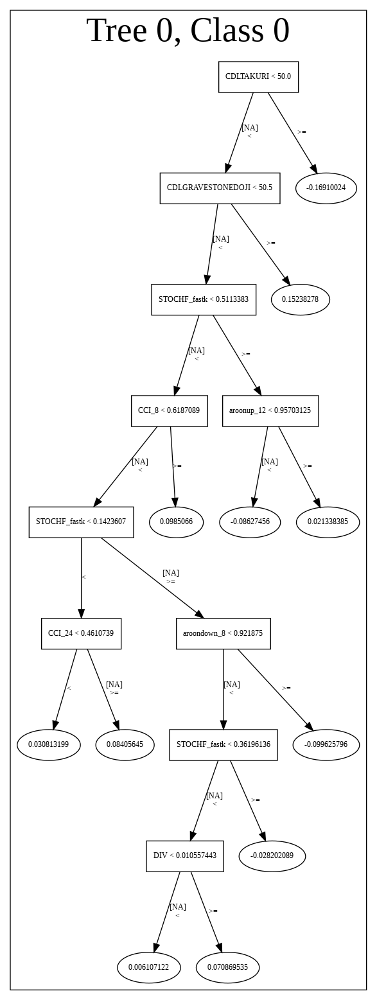

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_5_AutoML_20191207_231958',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_5_AutoML_20191207_231958',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_78_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_78_sid_8e77',
   'type': 'Key<

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'CCI_8',
 'WILLR_12',
 'aroondown_8',
 'aroonup_12',
 'ULTOSC',
 'LINEARREG_ANGLE_8',
 'MINUS_DI_8',
 'CCI_20',
 'aroonup_8',
 'CORREL_20',
 'aroondown_12',
 'PLUS_DM_8',
 'ATR_24',
 'PLUS_DI_8',
 'CCI_12',
 'CCI_14',
 'WILLR_14',
 'ADX_8',
 'DIV',
 'STDDEV_12',
 'HT_DCPERIOD',
 'NATR_24',
 'dayofyear',
 'BBANDS_upperband_30_2_5',
 'STOCH_slowd',
 'CCI_24',
 'TRIX_14',
 'PLUS_DI_24',
 'PLUS_DI_14',
 'BOP',
 'TRANGE',
 'CMO_8',
 'STDDEV_24',
 'STOCHRSI_fastk',
 'HT_PHASOR_quadrature',
 'days_in_month',
 'MACDEXT_hist',
 'STDDEV_8',
 'BETA_8',
 'BETA_20',
 'STOCH_slowk',
 'MINUS_DM_8',
 'CORREL_30',
 'KAMA_14',
 'BETA_30']

In [34]:
# All algos with top XGBoost features
model_train(feature_name='XGBF',model_algo=None,features_list = features_list[:model_selected_features])

In [0]:
# PCA
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'PCA' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.pca import H2OPrincipalComponentAnalysisEstimator
      h2o_model = H2OPrincipalComponentAnalysisEstimator(seed=1, k=PCA_k, pca_method="GramSVD", max_iterations=10000)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OPrincipalComponentAnalysisEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [36]:
# DeepLearning with PCA
model_train(feature_name='PCA',model_algo="DeepLearning",training_frame=training_frame)

[]

In [37]:
# GLM with PCA
model_train(feature_name='PCA',model_algo="GLM",training_frame=training_frame)

[]

In [38]:
# XGBoost with PCA
model_train(feature_name='PCA',model_algo="XGBoost",training_frame=training_frame)

[]

In [39]:
# DRF with top PCA features
model_train(feature_name='PCA',model_algo="DRF",training_frame=training_frame)

[]

In [40]:
# GBM with top PCA features
model_train(feature_name='PCA',model_algo="GBM",training_frame=training_frame)

[]

In [41]:
# StackedEnsemble with top PCA features
model_train(feature_name='PCA',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [42]:
# All algos with top PCA features
model_train(feature_name='PCA',model_algo=None,training_frame=training_frame)

[]

In [0]:
# Generalized Low Rank
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'GLRM' in features_to_include:
  for _ in range(3):
    try:
      from h2o.estimators.glrm import H2OGeneralizedLowRankEstimator

      h2o_model = H2OGeneralizedLowRankEstimator(seed=1, k=GLRM_k)
      h2o_model.train(x=list(train_hf.columns[:-1]), training_frame=train_hf[:index_splits[0],:])

      display(h2o_model.varimp(use_pandas=True))
      display(h2o_model)

      training_frame = h2o_model.predict(train_hf)
      del h2o_model, H2OGeneralizedLowRankEstimator
      gc.collect()

      training_frame = training_frame.cbind(train_hf[data_label_name])
      break
    except KeyboardInterrupt:
      break
    except Exception as e:
      print(e)
      load_h2o()
else:
  training_frame = []

In [44]:
# DeepLearning with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DeepLearning",training_frame=training_frame)

[]

In [45]:
# GLM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GLM",training_frame=training_frame)

[]

In [46]:
# XGBoost with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="XGBoost",training_frame=training_frame)

[]

In [47]:
# DRF with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="DRF",training_frame=training_frame)

[]

In [48]:
# GBM with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="GBM",training_frame=training_frame)

[]

In [49]:
# StackedEnsemble with Generalized Low Rank
model_train(feature_name='GLRM',model_algo="StackedEnsemble",training_frame=training_frame)

[]

In [50]:
# All algos with Generalized Low Rank
model_train(feature_name='GLRM',model_algo=None,training_frame=training_frame)

[]

In [0]:
# High Correlation Filter 
try:
  del training_frame
except:
  pass
gc.collect()

if features_to_include is True or 'HCF' in features_to_include:
  corr_matrix = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).corr().abs()

  upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

  features_list = [column for column in upper.columns if not any(upper[column] > HCF_threshold)]

  del corr_matrix, upper
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [52]:
# DeepLearning with low correlation features
model_train(feature_name='HCF',model_algo="DeepLearning",features_list=features_list)

[]

In [53]:
# GLM with low correlation features
model_train(feature_name='HCF',model_algo="GLM",features_list=features_list)

[]

In [54]:
# XGBoost with low correlation features
model_train(feature_name='HCF',model_algo="XGBoost",features_list=features_list)

[]

In [55]:
# DRF with low correlation features
model_train(feature_name='HCF',model_algo="DRF",features_list=features_list)

[]

In [56]:
# GBM with low correlation features
model_train(feature_name='HCF',model_algo="GBM",features_list=features_list)

[]

In [57]:
# StackedEnsemble with low correlation features
model_train(feature_name='HCF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [58]:
# All algos with low correlation features
model_train(feature_name='HCF',model_algo=None,features_list=features_list)

[]

In [0]:
#	Low Variance Filter  
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'LVF' in features_to_include:
  df_variance = pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1).var()
  features_list = [column for column in df_variance.index if df_variance[column]  > LVF_threshold]

  del df_variance
  gc.collect()

  display(len(features_list),features_list)
else:
  features_list = []

In [60]:
# DeepLearning with Low Variance features  
model_train(feature_name='LVF',model_algo="DeepLearning",features_list=features_list)

[]

In [61]:
# GLM with Low Variance features  
model_train(feature_name='LVF',model_algo="GLM",features_list=features_list)

[]

In [62]:
# XGBoost with Low Variance features  
model_train(feature_name='LVF',model_algo="XGBoost",features_list=features_list)

[]

In [63]:
# DRF with Low Variance features
model_train(feature_name='LVF',model_algo="DRF",features_list=features_list)

[]

In [64]:
# GBM with Low Variance features
model_train(feature_name='LVF',model_algo="GBM",features_list=features_list)

[]

In [65]:
# StackedEnsemble with Low Variance features
model_train(feature_name='LVF',model_algo="StackedEnsemble",features_list=features_list)

[]

In [66]:
# All algos with Low Variance features
model_train(feature_name='LVF',model_algo=None,features_list=features_list)

[]

In [0]:
# Select k best features
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'KBest' in features_to_include:
  from sklearn.feature_selection import SelectKBest
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectKBest(score_func=f_classif, k=select_k).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectKBest, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [68]:
# DeepLearning with Select k best features 
model_train(feature_name='KBest',model_algo="DeepLearning",features_list=features_list)

[]

In [69]:
# GLM with Select k best features
model_train(feature_name='KBest',model_algo="GLM",features_list=features_list)

[]

In [70]:
# XGBoost with Select k best features
model_train(feature_name='KBest',model_algo="XGBoost",features_list=features_list)

[]

In [71]:
# DRF with Select k best features
model_train(feature_name='KBest',model_algo="DRF",features_list=features_list)

[]

In [72]:
# GBM with Select k best features
model_train(feature_name='KBest',model_algo="GBM",features_list=features_list)

[]

In [73]:
# StackedEnsemble with Select k best features
model_train(feature_name='KBest',model_algo="StackedEnsemble",features_list=features_list)

[]

In [74]:
# All algos with Select k best features
model_train(feature_name='KBest',model_algo=None,features_list=features_list)

[]

In [0]:
# Select Percentile
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Percentile' in features_to_include:
  from sklearn.feature_selection import SelectPercentile
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectPercentile(score_func=f_classif, percentile=select_percentile).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectPercentile, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

In [76]:
# DeepLearning with Select Percentile features  
model_train(feature_name='Percentile',model_algo="DeepLearning",features_list=features_list)

[]

In [77]:
# GLM with Select Percentile features  
model_train(feature_name='Percentile',model_algo="GLM",features_list=features_list)

[]

In [78]:
# XGBoost with Select Percentile features  
model_train(feature_name='Percentile',model_algo="XGBoost",features_list=features_list)

[]

In [79]:
# DRF with Select Percentile features
model_train(feature_name='Percentile',model_algo="DRF",features_list=features_list)

[]

In [80]:
# GBM with Select Percentile features
model_train(feature_name='Percentile',model_algo="GBM",features_list=features_list)

[]

In [81]:
# StackedEnsemble with Select Percentile features
model_train(feature_name='Percentile',model_algo="StackedEnsemble",features_list=features_list)

[]

In [82]:
# All algos with Select Percentile features
model_train(feature_name='Percentile',model_algo=None,features_list=features_list)

[]

In [83]:
# Select Family-wise error
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'Fwe' in features_to_include:
  from sklearn.feature_selection import SelectFwe
  from sklearn.feature_selection import f_classif

  bestfeatures = SelectFwe(score_func=f_classif, alpha=select_alpha).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, SelectFwe, f_classif
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list=[]

/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:114: UserWarning: Features [829] are constant.
  UserWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:115: RuntimeWarning: invalid value encountered in true_divide
  f = msb / msw
/usr/local/lib/python3.6/dist-packages/sklearn/feature_selection/univariate_selection.py:721: RuntimeWarning: invalid value encountered in less
  return (self.pvalues_ < self.alpha / len(self.pvalues_))


17

['MINUS_DI_8',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'ULTOSC',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'CDLHAMMER',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLTAKURI']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_232113_model_2,0.803602,0.534307,0.304823,0.425660,0.181187
1,DeepLearning_1_AutoML_20191207_232113,0.799267,0.536208,0.295299,0.430335,0.185188
2,DeepLearning_grid_1_AutoML_20191207_232113_model_8,0.794750,0.551670,0.299145,0.432782,0.187301
3,DeepLearning_grid_1_AutoML_20191207_232113_model_5,0.790476,0.546583,0.316117,0.429415,0.184397
4,DeepLearning_grid_1_AutoML_20191207_232113_model_9,0.789866,0.552543,0.335470,0.436550,0.190576
5,DeepLearning_grid_1_AutoML_20191207_232113_model_6,0.786081,0.565535,0.339560,0.441346,0.194786
6,DeepLearning_grid_1_AutoML_20191207_232113_model_1,0.781746,0.561843,0.376862,0.436067,0.190155
7,DeepLearning_grid_1_AutoML_20191207_232113_model_7,0.779731,0.561158,0.360745,0.439175,0.192875
8,DeepLearning_grid_1_AutoML_20191207_232113_model_3,0.755800,0.592035,0.364713,0.452533,0.204786
9,DeepLearning_grid_1_AutoML_20191207_232113_model_4,0.728571,0.586724,0.376496,0.451046,0.203442


,variable,relative_importance,scaled_importance,percentage
0,CDLHANGINGMAN,1.000000,1.000000,0.098243
1,WILLR_12,0.647619,0.647619,0.063624
2,PLUS_DI_8,0.645764,0.645764,0.063442
3,MINUS_DI_8,0.644765,0.644765,0.063343
4,STOCHF_fastk,0.637565,0.637565,0.062636
5,ULTOSC,0.629855,0.629855,0.061879
6,CDLTAKURI,0.610340,0.610340,0.059961
7,WILLR_8,0.610278,0.610278,0.059955
8,CDLDRAGONFLYDOJI,0.588220,0.588220,0.057788
9,CDLGRAVESTONEDOJI,0.573990,0.573990,0.056390


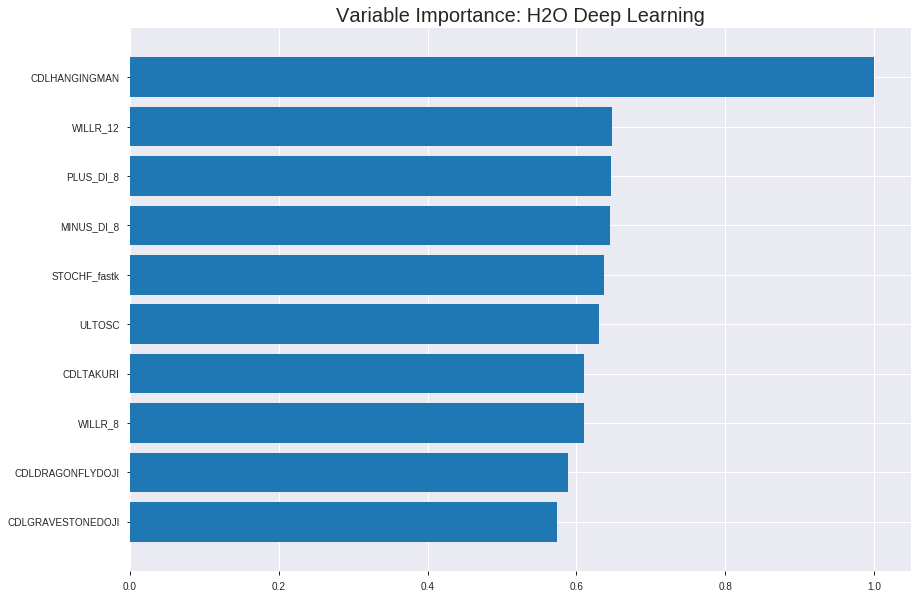

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_232113_model_2


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.2125963098233343
RMSE: 0.4610816737014542
LogLoss: 0.6317889823520388
Mean Per-Class Error: 0.3259485980840148
AUC: 0.7434069113756614
pr_auc: 0.7476060389822002
Gini: 0.4868138227513228
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.13512237003323427: 


,0,1,Error,Rate
0,239.0,652.0,0.7318,(652.0/891.0)
1,42.0,854.0,0.0469,(42.0/896.0)
Total,281.0,1506.0,0.3884,(694.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1351224,0.7110741,339.0
max f2,0.0446443,0.8465098,371.0
max f0point5,0.5143028,0.6873550,163.0
max accuracy,0.4928172,0.6737549,175.0
max precision,0.9660213,1.0,0.0
max recall,0.0018296,1.0,398.0
max specificity,0.9660213,1.0,0.0
max absolute_mcc,0.5392313,0.3615707,148.0
max min_per_class_accuracy,0.4310341,0.6588103,208.0
max mean_per_class_accuracy,0.4928172,0.6740514,175.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 41.65 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9201532,1.8836186,1.8836186,0.9444444,0.9405298,0.9444444,0.9405298,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.8962670,1.9944196,1.9390191,1.0,0.9067212,0.9722222,0.9236255,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.8757184,1.6620164,1.8466849,0.8333333,0.8865283,0.9259259,0.9112598,0.0167411,0.0558036,66.2016369,84.6684854
,4,0.0402910,0.8577696,1.8836186,1.8559183,0.9444444,0.8643648,0.9305556,0.8995360,0.0189732,0.0747768,88.3618552,85.5918279
,5,0.0503637,0.8403198,1.8836186,1.8614583,0.9444444,0.8480797,0.9333333,0.8892448,0.0189732,0.09375,88.3618552,86.1458333
,6,0.1001679,0.7666769,1.6358723,1.7492954,0.8202247,0.8035546,0.8770950,0.8466390,0.0814732,0.1752232,63.5872291,74.9295441
,7,0.1499720,0.6576718,1.6358723,1.7116288,0.8202247,0.7111527,0.8582090,0.8016454,0.0814732,0.2566964,63.5872291,71.1628798
,8,0.2003358,0.6064751,1.4182540,1.6378753,0.7111111,0.6294044,0.8212291,0.7583446,0.0714286,0.328125,41.8253968,63.7875349
,9,0.2999440,0.5408636,1.3557572,1.5441869,0.6797753,0.5722376,0.7742537,0.6965404,0.1350446,0.4631696,35.5757173,54.4186850
,10,0.4001119,0.4890385,1.0919169,1.4309612,0.5474860,0.5155530,0.7174825,0.6512303,0.109375,0.5725446,9.1916899,43.0961226




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.18743764202549348
RMSE: 0.43294069111772515
LogLoss: 0.5617705631156251
Mean Per-Class Error: 0.2713069489185458
AUC: 0.7889783709157847
pr_auc: 0.7731782384703751
Gini: 0.5779567418315694
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4091703375930928: 


,0,1,Error,Rate
0,161.0,104.0,0.3925,(104.0/265.0)
1,46.0,200.0,0.187,(46.0/246.0)
Total,207.0,304.0,0.2935,(150.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4091703,0.7272727,237.0
max f2,0.2554153,0.8441558,316.0
max f0point5,0.5091340,0.7240204,180.0
max accuracy,0.5091340,0.7299413,180.0
max precision,0.9551862,1.0,0.0
max recall,0.0064075,1.0,393.0
max specificity,0.9551862,1.0,0.0
max absolute_mcc,0.5091340,0.4587230,180.0
max min_per_class_accuracy,0.4945982,0.7073171,193.0
max mean_per_class_accuracy,0.5070204,0.7286931,182.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 45.79 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9287966,2.0772358,2.0772358,1.0,0.9406219,1.0,0.9406219,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9070437,1.6617886,1.8883962,0.8,0.9144972,0.9090909,0.9287470,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.8818732,2.0772358,1.9474085,1.0,0.8914967,0.9375,0.9171063,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.8620458,2.0772358,1.9783198,1.0,0.8694732,0.9523810,0.9057651,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8486118,1.6617886,1.9174484,0.8,0.8549913,0.9230769,0.8960009,0.0162602,0.0975610,66.1788618,91.7448405
,6,0.1017613,0.7938507,1.8375547,1.8775016,0.8846154,0.8168198,0.9038462,0.8564103,0.0934959,0.1910569,83.7554722,87.7501563
,7,0.1506849,0.7507458,1.8279675,1.8614191,0.88,0.7726297,0.8961039,0.8292088,0.0894309,0.2804878,82.7967480,86.1419069
,8,0.2015656,0.6629440,1.5978737,1.7948930,0.7692308,0.7022775,0.8640777,0.7971679,0.0813008,0.3617886,59.7873671,79.4893046
,9,0.3013699,0.5906301,1.3033636,1.6321138,0.6274510,0.6202696,0.7857143,0.7385847,0.1300813,0.4918699,30.3363622,63.2113821
,10,0.4011742,0.5287126,1.2219034,1.5300615,0.5882353,0.5610613,0.7365854,0.6944203,0.1219512,0.6138211,22.1903396,53.0061471



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:21:50,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 23:21:51,36.541 sec,19745 obs/sec,10.0,1,17870.0,0.4610817,0.6317890,0.1496081,0.7434069,0.7476060,1.8836186,0.3883604,0.4329407,0.5617706,0.2492115,0.7889784,0.7731782,2.0772358,0.2935421
,2019-12-07 23:21:56,41.577 sec,36339 obs/sec,120.0,12,214440.0,0.4440875,0.5761084,0.2111390,0.7781097,0.7767823,1.9944196,0.3195299,0.4601434,0.6471454,0.1518998,0.7821752,0.7524182,1.3848238,0.3268102
,2019-12-07 23:22:01,46.857 sec,41696 obs/sec,260.0,26,464620.0,0.4303395,0.5499255,0.2592260,0.8036416,0.7938428,1.9944196,0.3049804,0.4608713,0.6863505,0.1492144,0.7890167,0.7619230,1.7310298,0.3131115
,2019-12-07 23:22:06,51.919 sec,44208 obs/sec,400.0,40,714800.0,0.4171060,0.5127643,0.3040850,0.8274066,0.8055494,1.9944196,0.2596530,0.4595835,0.7076560,0.1539622,0.7857724,0.7372665,2.0772358,0.2641879
,2019-12-07 23:22:11,57.165 sec,45976 obs/sec,550.0,55,982850.0,0.4093509,0.4903655,0.3297221,0.8378628,0.8178322,1.9944196,0.2730834,0.4612828,0.7213603,0.1476944,0.7754487,0.7261278,1.7310298,0.3346380
,2019-12-07 23:22:17,1 min 2.359 sec,47148 obs/sec,700.0,70,1250900.0,0.3981948,0.4646613,0.3657587,0.8526178,0.8299783,1.9944196,0.2367096,0.4599013,0.7167326,0.1527921,0.7704172,0.7251483,2.0772358,0.3131115
,2019-12-07 23:22:17,1 min 2.398 sec,47141 obs/sec,700.0,70,1250900.0,0.4610817,0.6317890,0.1496081,0.7434069,0.7476060,1.8836186,0.3883604,0.4329407,0.5617706,0.2492115,0.7889784,0.7731782,2.0772358,0.2935421


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLHANGINGMAN,1.0,1.0,0.0982426
WILLR_12,0.6476189,0.6476189,0.0636238
PLUS_DI_8,0.6457644,0.6457644,0.0634416
MINUS_DI_8,0.6447650,0.6447650,0.0633434
STOCHF_fastk,0.6375655,0.6375655,0.0626361
ULTOSC,0.6298547,0.6298547,0.0618786
CDLTAKURI,0.6103395,0.6103395,0.0599613
WILLR_8,0.6102782,0.6102782,0.0599553
CDLDRAGONFLYDOJI,0.5882198,0.5882198,0.0577882
CDLGRAVESTONEDOJI,0.5739900,0.5739900,0.0563903


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71484375)

('F1', 0.7630769230769231)

('auc', 0.8036019536019536)

('logloss', 0.5343066074133582)

('mean_per_class_error', 0.2854090354090355)

('rmse', 0.4256603171189984)

('mse', 0.18118670556984626)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           0
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


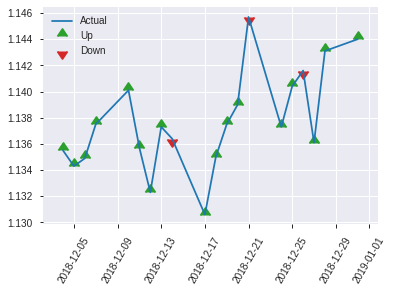


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.18118670556984626
RMSE: 0.4256603171189984
LogLoss: 0.5343066074133582
Mean Per-Class Error: 0.2854090354090355
AUC: 0.8036019536019536
pr_auc: 0.8208375814352216
Gini: 0.6072039072039073
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.32492380936938803: 


,0,1,Error,Rate
0,55.0,71.0,0.5635,(71.0/126.0)
1,6.0,124.0,0.0462,(6.0/130.0)
Total,61.0,195.0,0.3008,(77.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3249238,0.7630769,194.0
max f2,0.2731582,0.8698630,209.0
max f0point5,0.5717387,0.7642487,63.0
max accuracy,0.4355454,0.7148438,132.0
max precision,0.9290517,1.0,0.0
max recall,0.0202229,1.0,244.0
max specificity,0.9290517,1.0,0.0
max absolute_mcc,0.5717387,0.4781766,63.0
max min_per_class_accuracy,0.4436638,0.7076923,127.0
max mean_per_class_accuracy,0.4355454,0.7145910,132.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 45.22 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9146594,1.9692308,1.9692308,1.0,0.9234453,1.0,0.9234453,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9077606,1.9692308,1.9692308,1.0,0.9101593,1.0,0.9168023,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8942325,1.9692308,1.9692308,1.0,0.8969906,1.0,0.9118494,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8806829,1.9692308,1.9692308,1.0,0.8879280,1.0,0.9053254,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8684628,1.9692308,1.9692308,1.0,0.8724821,1.0,0.9002726,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.7924591,1.9692308,1.9692308,1.0,0.8331843,1.0,0.8667284,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7223833,1.8177515,1.9187377,0.9230769,0.7682464,0.9743590,0.8339011,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6077788,1.5147929,1.8177515,0.7692308,0.6488531,0.9230769,0.7876391,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.5491897,1.1815385,1.6111888,0.6,0.5742487,0.8181818,0.7183565,0.1153846,0.4846154,18.1538462,61.1188811
,10,0.4023438,0.4837894,1.0603550,1.4721434,0.5384615,0.5145873,0.7475728,0.6669196,0.1076923,0.5923077,6.0355030,47.2143391


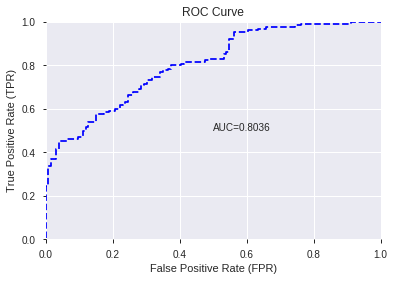

This function is available for GLM models only


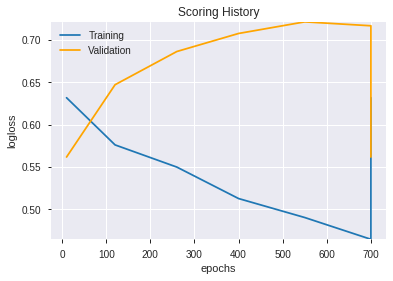

--2019-12-07 23:28:07--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.138.243
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.138.243|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


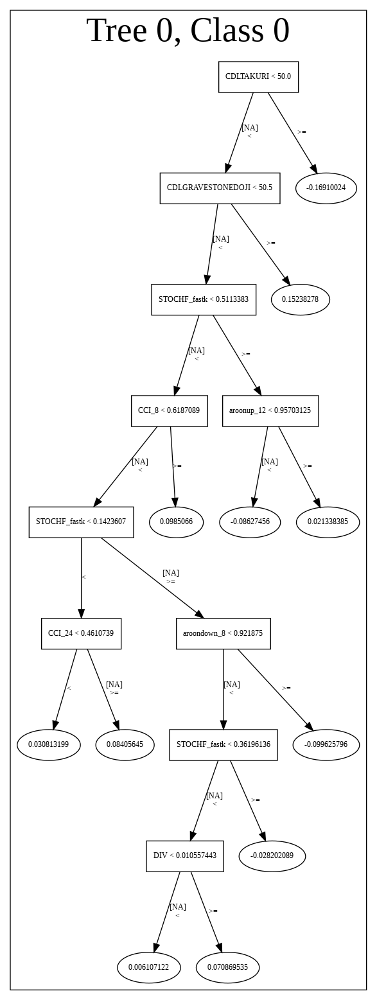

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_232113_model_2',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_232113_model_2',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_83_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'autom

['CDLHANGINGMAN',
 'WILLR_12',
 'PLUS_DI_8',
 'MINUS_DI_8',
 'STOCHF_fastk',
 'ULTOSC',
 'CDLTAKURI',
 'WILLR_8',
 'CDLDRAGONFLYDOJI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastd',
 'CDLINVERTEDHAMMER',
 'CDLHAMMER',
 'STOCH_slowk',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLSHOOTINGSTAR']

In [84]:
# DeepLearning with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_232903_model_1,0.800122,0.536327,0.303846,0.428155,0.183316


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.650919,1.000000,0.175082
1,CDLDRAGONFLYDOJI,0.537226,0.825335,0.144502
2,STOCHF_fastk,0.479050,0.735959,0.128853
3,PLUS_DI_8,0.399173,0.613246,0.107368
4,WILLR_8,0.304459,0.467737,0.081893
5,WILLR_12,0.291446,0.447746,0.078392
6,MINUS_DI_8,0.246226,0.378275,0.066229
7,ULTOSC,0.182264,0.280011,0.049025
8,CDLTAKURI,0.170055,0.261253,0.045741
9,CDLHANGINGMAN,0.100208,0.153948,0.026954


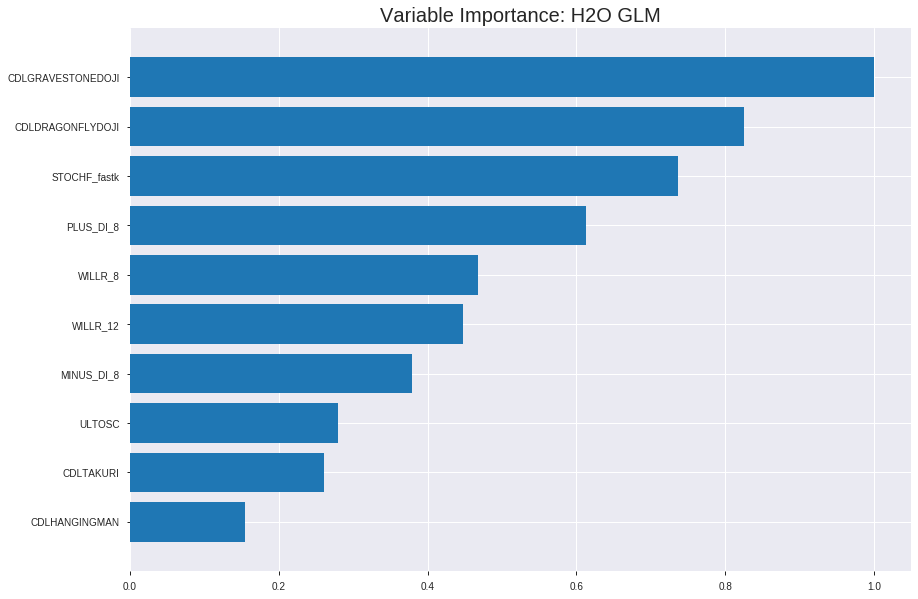

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_232903_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1966070470949274
RMSE: 0.44340393220508023
LogLoss: 0.5735804788681979
Null degrees of freedom: 1786
Residual degrees of freedom: 1769
Null deviance: 2477.294033375748
Residual deviance: 2049.9766314749395
AIC: 2085.9766314749395
AUC: 0.7621402517235851
pr_auc: 0.7502411581291555
Gini: 0.5242805034471703
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42370142061056165: 


,0,1,Error,Rate
0,407.0,484.0,0.5432,(484.0/891.0)
1,109.0,787.0,0.1217,(109.0/896.0)
Total,516.0,1271.0,0.3318,(593.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4237014,0.7263498,257.0
max f2,0.3130236,0.8564996,312.0
max f0point5,0.5363111,0.6985670,177.0
max accuracy,0.5363111,0.6883044,177.0
max precision,0.9715027,1.0,0.0
max recall,0.0185292,1.0,394.0
max specificity,0.9715027,1.0,0.0
max absolute_mcc,0.5363111,0.3818001,177.0
max min_per_class_accuracy,0.5068399,0.6846240,198.0
max mean_per_class_accuracy,0.5363111,0.6885259,177.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9518388,1.7728175,1.7728175,0.8888889,0.9585130,0.8888889,0.9585130,0.0178571,0.0178571,77.2817460,77.2817460
,2,0.0201455,0.9392471,1.6620164,1.7174169,0.8333333,0.9460772,0.8611111,0.9522951,0.0167411,0.0345982,66.2016369,71.7416915
,3,0.0302182,0.9285049,1.7728175,1.7358838,0.8888889,0.9331422,0.8703704,0.9459108,0.0178571,0.0524554,77.2817460,73.5883763
,4,0.0402910,0.9193992,1.7728175,1.7451172,0.8888889,0.9237186,0.875,0.9403627,0.0178571,0.0703125,77.2817460,74.5117188
,5,0.0503637,0.9103946,1.9944196,1.7949777,1.0,0.9138866,0.9,0.9350675,0.0200893,0.0904018,99.4419643,79.4977679
,6,0.1001679,0.8505174,1.8151460,1.8050055,0.9101124,0.8852113,0.9050279,0.9102787,0.0904018,0.1808036,81.5145967,80.5005487
,7,0.1499720,0.6992894,1.5238262,1.7116288,0.7640449,0.7624365,0.8582090,0.8611818,0.0758929,0.2566964,52.3826244,71.1628798
,8,0.2003358,0.6487461,1.3960937,1.6323043,0.7,0.6722568,0.8184358,0.8136867,0.0703125,0.3270089,39.6093750,63.2304345
,9,0.2999440,0.5863591,1.3109388,1.5255822,0.6573034,0.6163853,0.7649254,0.7481650,0.1305804,0.4575893,31.0938754,52.5582189
,10,0.4001119,0.5422140,1.2033370,1.4449082,0.6033520,0.5630977,0.7244755,0.7018334,0.1205357,0.578125,20.3336991,44.4908217




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1908134259641512
RMSE: 0.4368219614032143
LogLoss: 0.5557423708113357
Null degrees of freedom: 510
Residual degrees of freedom: 493
Null deviance: 708.5067427497421
Residual deviance: 567.968702969185
AIC: 603.968702969185
AUC: 0.7912256481055377
pr_auc: 0.7876421136411478
Gini: 0.5824512962110755
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4615517744165888: 


,0,1,Error,Rate
0,129.0,136.0,0.5132,(136.0/265.0)
1,26.0,220.0,0.1057,(26.0/246.0)
Total,155.0,356.0,0.317,(162.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4615518,0.7308970,264.0
max f2,0.1270636,0.8426184,347.0
max f0point5,0.5844990,0.7117117,171.0
max accuracy,0.5439044,0.7221135,205.0
max precision,0.9741831,1.0,0.0
max recall,0.0378465,1.0,393.0
max specificity,0.9741831,1.0,0.0
max absolute_mcc,0.5393486,0.4484055,208.0
max min_per_class_accuracy,0.5564656,0.7132075,194.0
max mean_per_class_accuracy,0.5393486,0.7237690,208.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 53.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9515371,2.0772358,2.0772358,1.0,0.9616398,1.0,0.9616398,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9454836,2.0772358,2.0772358,1.0,0.9481887,1.0,0.9555257,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9384121,2.0772358,2.0772358,1.0,0.9411360,1.0,0.9510289,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9329209,2.0772358,2.0772358,1.0,0.9348442,1.0,0.9471754,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9289538,2.0772358,2.0772358,1.0,0.9314283,1.0,0.9441471,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8967362,1.9174484,1.9973421,0.9230769,0.9125220,0.9615385,0.9283345,0.0975610,0.2032520,91.7448405,99.7342089
,7,0.1506849,0.8291623,1.8279675,1.9423503,0.88,0.8740912,0.9350649,0.9107231,0.0894309,0.2926829,82.7967480,94.2350333
,8,0.2015656,0.7196212,1.1984053,1.7545584,0.5769231,0.7742292,0.8446602,0.8762683,0.0609756,0.3536585,19.8405253,75.4558371
,9,0.3013699,0.6325516,1.2219034,1.5781596,0.5882353,0.6655272,0.7597403,0.8064774,0.1219512,0.4756098,22.1903396,57.8159645
,10,0.4011742,0.5901937,1.3440937,1.5199286,0.6470588,0.6128982,0.7317073,0.7583187,0.1341463,0.6097561,34.4093735,51.9928614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:29:03,0.000 sec,2,.16E2,18,1.3705789,1.3686082
,2019-12-07 23:29:03,0.004 sec,4,.96E1,18,1.3620496,1.3588507
,2019-12-07 23:29:03,0.008 sec,6,.6E1,18,1.3497127,1.3446901
,2019-12-07 23:29:03,0.011 sec,8,.37E1,18,1.3327878,1.3251789
,2019-12-07 23:29:03,0.014 sec,10,.23E1,18,1.3111398,1.3000916
---,---,---,---,---,---,---,---
,2019-12-07 23:29:03,0.052 sec,40,.11E-2,18,1.1469495,1.1115702
,2019-12-07 23:29:03,0.053 sec,41,.7E-3,18,1.1468228,1.1116703
,2019-12-07 23:29:03,0.055 sec,42,.44E-3,18,1.1467501,1.1117665
,2019-12-07 23:29:03,0.057 sec,43,.27E-3,18,1.1467113,1.1118464



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7508090614886731)

('auc', 0.8001221001221002)

('logloss', 0.5363267204752452)

('mean_per_class_error', 0.2638583638583638)

('rmse', 0.42815463643243246)

('mse', 0.1833163926985884)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


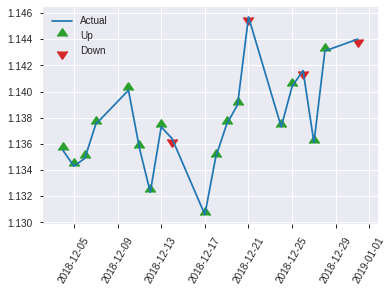


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1833163926985884
RMSE: 0.42815463643243246
LogLoss: 0.5363267204752452
Null degrees of freedom: 255
Residual degrees of freedom: 238
Null deviance: 354.8709766655013
Residual deviance: 274.59928088332555
AIC: 310.59928088332555
AUC: 0.8001221001221002
pr_auc: 0.8171579465828352
Gini: 0.6002442002442003
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4451546702068863: 


,0,1,Error,Rate
0,63.0,63.0,0.5,(63.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,77.0,179.0,0.3008,(77.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4451547,0.7508091,178.0
max f2,0.3017191,0.8622995,227.0
max f0point5,0.5549565,0.7641509,99.0
max accuracy,0.5549565,0.734375,99.0
max precision,0.9644407,1.0,0.0
max recall,0.0651992,1.0,246.0
max specificity,0.9644407,1.0,0.0
max absolute_mcc,0.5549565,0.4839463,99.0
max min_per_class_accuracy,0.5182614,0.7,126.0
max mean_per_class_accuracy,0.5549565,0.7361416,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9561896,1.9692308,1.9692308,1.0,0.9617887,1.0,0.9617887,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9488285,1.9692308,1.9692308,1.0,0.9511910,1.0,0.9564899,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9387317,1.9692308,1.9692308,1.0,0.9443563,1.0,0.9534565,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9322600,1.9692308,1.9692308,1.0,0.9346064,1.0,0.9483156,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9285756,1.9692308,1.9692308,1.0,0.9306000,1.0,0.9455901,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8714831,1.9692308,1.9692308,1.0,0.8965357,1.0,0.9210629,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7449367,1.8177515,1.9187377,0.9230769,0.8230810,0.9743590,0.8884023,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6686287,1.3633136,1.7798817,0.6923077,0.6949005,0.9038462,0.8400269,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.5946524,1.3390769,1.6367632,0.68,0.6250560,0.8311688,0.7702311,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.5515030,1.3633136,1.5677371,0.6923077,0.5675938,0.7961165,0.7190800,0.1384615,0.6307692,36.3313609,56.7737117


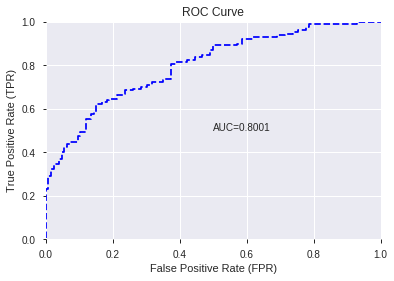

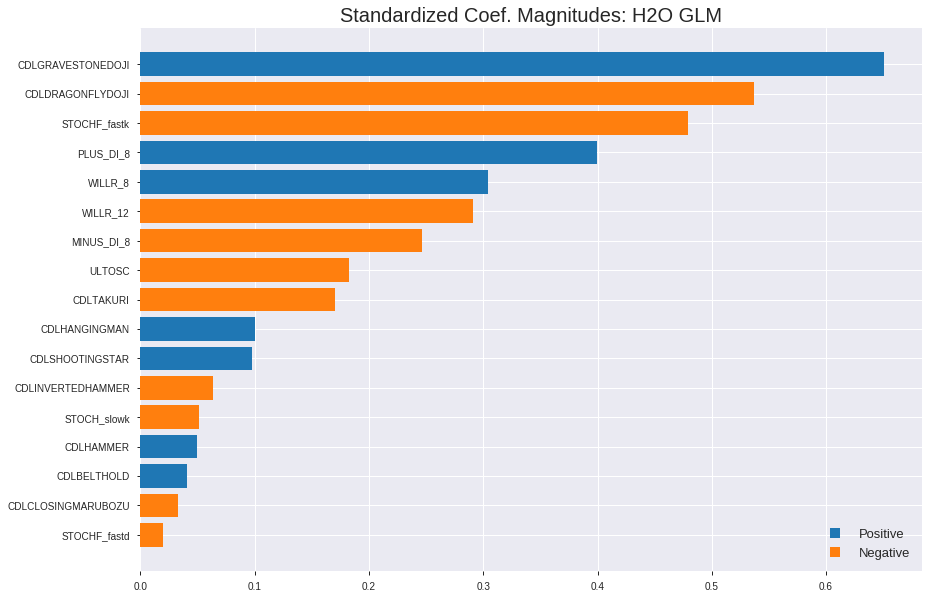

'log_likelihood'
--2019-12-07 23:29:12--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.107.212
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.107.212|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


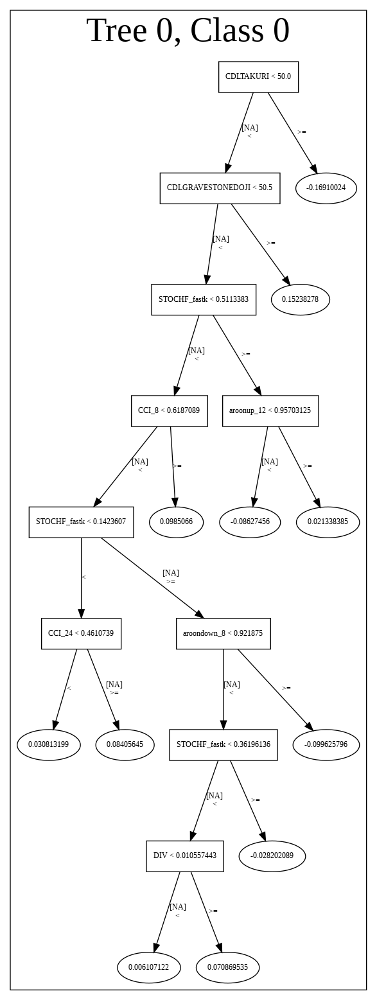

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_232903_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_232903_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_88_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_88_s

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'MINUS_DI_8',
 'ULTOSC',
 'CDLTAKURI',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'STOCH_slowk',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastd']

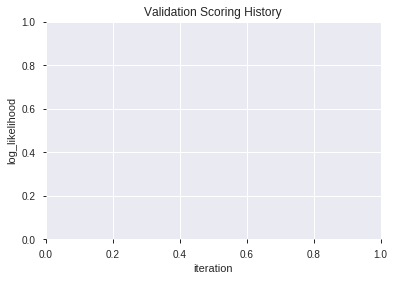

In [85]:
# GLM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_grid_1_AutoML_20191207_233008_model_6,0.798291,0.531790,0.284005,0.425833,0.181333
1,XGBoost_grid_1_AutoML_20191207_233008_model_3,0.794383,0.537571,0.295665,0.428081,0.183253
2,XGBoost_grid_1_AutoML_20191207_233008_model_1,0.789927,0.540850,0.311050,0.430301,0.185159
3,XGBoost_grid_1_AutoML_20191207_233008_model_4,0.788400,0.550442,0.299756,0.432627,0.187166
4,XGBoost_3_AutoML_20191207_233008,0.787546,0.542821,0.336203,0.430674,0.185480
5,XGBoost_2_AutoML_20191207_233008,0.786691,0.545744,0.303602,0.431690,0.186356
6,XGBoost_grid_1_AutoML_20191207_233008_model_2,0.786630,0.546874,0.315751,0.432339,0.186917
7,XGBoost_grid_1_AutoML_20191207_233008_model_7,0.771856,0.559885,0.348230,0.439343,0.193023
8,XGBoost_grid_1_AutoML_20191207_233008_model_5,0.771429,0.566076,0.318620,0.444036,0.197168
9,XGBoost_1_AutoML_20191207_233008,0.767033,0.566873,0.356044,0.442399,0.195717


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,853.794067,1.000000,0.110414
1,PLUS_DI_8,846.876282,0.991898,0.109520
2,STOCHF_fastk,810.510376,0.949304,0.104817
3,ULTOSC,809.185547,0.947753,0.104645
4,MINUS_DI_8,784.437134,0.918766,0.101445
5,CDLDRAGONFLYDOJI,766.403992,0.897645,0.099113
6,WILLR_12,760.650696,0.890907,0.098369
7,WILLR_8,653.228027,0.765089,0.084477
8,STOCH_slowk,640.839966,0.750579,0.082875
9,CDLTAKURI,638.538025,0.747883,0.082577


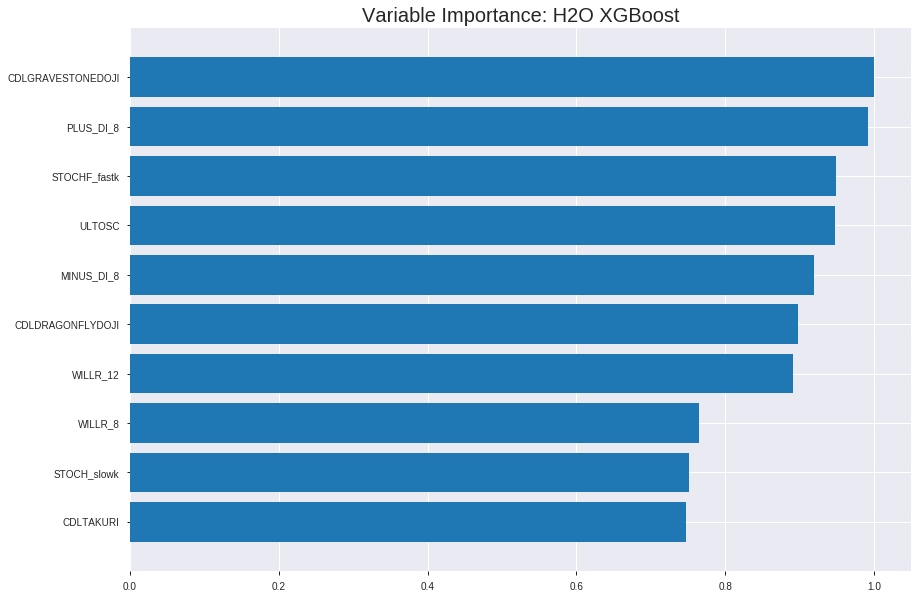

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_grid_1_AutoML_20191207_233008_model_6


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.16268963414951168
RMSE: 0.4033480310470248
LogLoss: 0.49283075915804014
Mean Per-Class Error: 0.2282798220298221
AUC: 0.85710340007215
pr_auc: 0.8562328095446736
Gini: 0.7142068001443
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4552163928747177: 


,0,1,Error,Rate
0,608.0,283.0,0.3176,(283.0/891.0)
1,144.0,752.0,0.1607,(144.0/896.0)
Total,752.0,1035.0,0.2389,(427.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4552164,0.7788711,221.0
max f2,0.3057667,0.8780971,301.0
max f0point5,0.5457663,0.7868020,170.0
max accuracy,0.5074497,0.7716844,191.0
max precision,0.9325550,1.0,0.0
max recall,0.1392551,1.0,358.0
max specificity,0.9325550,1.0,0.0
max absolute_mcc,0.5310023,0.5442805,178.0
max min_per_class_accuracy,0.5003078,0.7676768,195.0
max mean_per_class_accuracy,0.5074497,0.7717202,191.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.00 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9176781,1.9944196,1.9944196,1.0,0.9247716,1.0,0.9247716,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9032960,1.9944196,1.9944196,1.0,0.9102649,1.0,0.9175182,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8960737,1.9944196,1.9944196,1.0,0.8995386,1.0,0.9115250,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8894988,1.9944196,1.9944196,1.0,0.8932476,1.0,0.9069557,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8806649,1.9944196,1.9944196,1.0,0.8843051,1.0,0.9024256,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8280855,1.9496012,1.9721356,0.9775281,0.8577429,0.9888268,0.8802090,0.0970982,0.1975446,94.9601224,97.2135625
,7,0.1499720,0.7503627,1.7703275,1.9051173,0.8876404,0.7867895,0.9552239,0.8491854,0.0881696,0.2857143,77.0327548,90.5117271
,8,0.2003358,0.7007910,1.6620164,1.8440025,0.8333333,0.7240705,0.9245810,0.8177319,0.0837054,0.3694196,66.2016369,84.4002519
,9,0.2999440,0.6233167,1.5462355,1.7451172,0.7752809,0.6580122,0.875,0.7646907,0.1540179,0.5234375,54.6235453,74.5117188
,10,0.4001119,0.5567459,1.3147571,1.6373767,0.6592179,0.5879402,0.8209790,0.7204412,0.1316964,0.6551339,31.4757083,63.7376686




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.18869657574437834
RMSE: 0.4343921911641349
LogLoss: 0.5567656741957822
Mean Per-Class Error: 0.2715984046632919
AUC: 0.7952293296517872
pr_auc: 0.7743580499096658
Gini: 0.5904586593035743
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.47079598903656006: 


,0,1,Error,Rate
0,158.0,107.0,0.4038,(107.0/265.0)
1,41.0,205.0,0.1667,(41.0/246.0)
Total,199.0,312.0,0.2896,(148.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4707960,0.7347670,244.0
max f2,0.3155800,0.8469751,325.0
max f0point5,0.6503665,0.7330097,150.0
max accuracy,0.6000571,0.7299413,178.0
max precision,0.9320232,1.0,0.0
max recall,0.0669960,1.0,391.0
max specificity,0.9320232,1.0,0.0
max absolute_mcc,0.6000571,0.4587780,178.0
max min_per_class_accuracy,0.5745032,0.7073171,193.0
max mean_per_class_accuracy,0.6000571,0.7284016,178.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.05 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9216251,1.7310298,1.7310298,0.8333333,0.9264549,0.8333333,0.9264549,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9160556,1.6617886,1.6995565,0.8,0.9187374,0.8181818,0.9229469,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.9069054,2.0772358,1.8175813,1.0,0.9122182,0.875,0.9195942,0.0203252,0.0569106,107.7235772,81.7581301
,4,0.0410959,0.9008962,2.0772358,1.8794038,1.0,0.9029246,0.9047619,0.9156252,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8972335,2.0772358,1.9174484,1.0,0.8987998,0.9230769,0.9123896,0.0203252,0.0975610,107.7235772,91.7448405
,6,0.1017613,0.8687868,1.9973421,1.9573952,0.9615385,0.8836460,0.9423077,0.8980178,0.1016260,0.1991870,99.7342089,95.7395247
,7,0.1506849,0.8361443,1.6617886,1.8614191,0.8,0.8529014,0.8961039,0.8833696,0.0813008,0.2804878,66.1788618,86.1419069
,8,0.2015656,0.7911620,1.6777674,1.8150604,0.8076923,0.8168988,0.8737864,0.8665906,0.0853659,0.3658537,67.7767355,81.5060384
,9,0.3013699,0.6964100,1.1811733,1.6051367,0.5686275,0.7309462,0.7727273,0.8216694,0.1178862,0.4837398,18.1173282,60.5136733
,10,0.4011742,0.6392134,1.4255540,1.5604600,0.6862745,0.6681986,0.7512195,0.7834889,0.1422764,0.6260163,42.5553961,56.0460044



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:30:16,4.674 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 23:30:16,4.710 sec,5.0,0.4769365,0.6476667,0.7912070,0.7618556,1.9320940,0.3128148,0.4764478,0.6467230,0.7736156,0.7200422,1.5978737,0.3346380
,2019-12-07 23:30:16,4.735 sec,10.0,0.4608509,0.6158778,0.8022167,0.8036097,1.9944196,0.3033016,0.4628572,0.6196626,0.7732781,0.7530982,1.4837398,0.2739726
,2019-12-07 23:30:16,4.762 sec,15.0,0.4493619,0.5924072,0.8082800,0.8098996,1.9944196,0.2915501,0.4525313,0.5984704,0.7843304,0.7615133,1.3848238,0.2818004
,2019-12-07 23:30:16,4.789 sec,20.0,0.4413795,0.5752669,0.8116883,0.8143317,1.9944196,0.3021824,0.4457892,0.5838886,0.7877052,0.7657685,1.3848238,0.2935421
,2019-12-07 23:30:16,4.819 sec,25.0,0.4345892,0.5606928,0.8159184,0.8188545,1.9944196,0.2943481,0.4416274,0.5747026,0.7902056,0.7711460,1.3848238,0.2720157
,2019-12-07 23:30:16,4.849 sec,30.0,0.4294272,0.5490233,0.8198966,0.8225683,1.9944196,0.2825965,0.4391761,0.5688755,0.7919850,0.7747287,2.0772358,0.2720157
,2019-12-07 23:30:16,4.880 sec,35.0,0.4251409,0.5393989,0.8257225,0.8274804,1.9944196,0.2758814,0.4371821,0.5640351,0.7946081,0.7775872,2.0772358,0.3091977
,2019-12-07 23:30:16,4.914 sec,40.0,0.4208255,0.5300474,0.8314313,0.8332163,1.9944196,0.2585339,0.4358979,0.5608868,0.7945774,0.7745126,1.7310298,0.3131115
,2019-12-07 23:30:16,4.948 sec,45.0,0.4170155,0.5217969,0.8374356,0.8400084,1.9944196,0.2607722,0.4353020,0.5594220,0.7938411,0.7742461,1.7310298,0.3072407


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLGRAVESTONEDOJI,853.7940674,1.0,0.1104144
PLUS_DI_8,846.8762817,0.9918976,0.1095197
STOCHF_fastk,810.5103760,0.9493043,0.1048168
ULTOSC,809.1855469,0.9477526,0.1046455
MINUS_DI_8,784.4371338,0.9187662,0.1014450
CDLDRAGONFLYDOJI,766.4039917,0.8976450,0.0991129
WILLR_12,760.6506958,0.8909065,0.0983689
WILLR_8,653.2280273,0.7650885,0.0844768
STOCH_slowk,640.8399658,0.7505791,0.0828747
CDLTAKURI,638.5380249,0.7478829,0.0825770


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71875)

('F1', 0.7631578947368421)

('auc', 0.7982905982905983)

('logloss', 0.5317898451647491)

('mean_per_class_error', 0.28327228327228327)

('rmse', 0.42583256018678556)

('mse', 0.18133336931523236)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


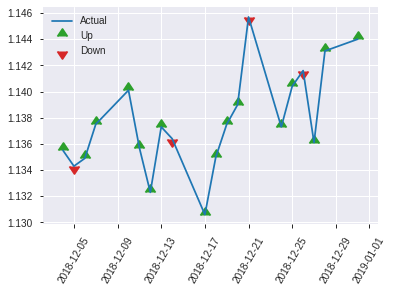


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.18133336931523236
RMSE: 0.42583256018678556
LogLoss: 0.5317898451647491
Mean Per-Class Error: 0.28327228327228327
AUC: 0.7982905982905983
pr_auc: 0.811778567990835
Gini: 0.5965811965811967
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4184782803058624: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,82.0,174.0,0.2812,(72.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4184783,0.7631579,173.0
max f2,0.2906013,0.8660352,218.0
max f0point5,0.7156214,0.7369942,53.0
max accuracy,0.4458503,0.71875,161.0
max precision,0.9384878,1.0,0.0
max recall,0.1517645,1.0,235.0
max specificity,0.9384878,1.0,0.0
max absolute_mcc,0.4184783,0.4628597,173.0
max min_per_class_accuracy,0.5163443,0.7063492,128.0
max mean_per_class_accuracy,0.4458503,0.7167277,161.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.06 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9205291,1.9692308,1.9692308,1.0,0.9340003,1.0,0.9340003,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9079903,1.9692308,1.9692308,1.0,0.9100737,1.0,0.9220370,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9057526,1.9692308,1.9692308,1.0,0.9065692,1.0,0.9181700,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9028849,1.9692308,1.9692308,1.0,0.9045512,1.0,0.9144558,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8967579,1.9692308,1.9692308,1.0,0.8998371,1.0,0.9122068,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8705732,1.9692308,1.9692308,1.0,0.8840013,1.0,0.8981040,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8043183,1.8177515,1.9187377,0.9230769,0.8386415,0.9743590,0.8782832,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7183164,1.6662722,1.8556213,0.8461538,0.7491467,0.9423077,0.8459990,0.0846154,0.3769231,66.6272189,85.5621302
,9,0.3007812,0.6342802,0.8664615,1.5344655,0.44,0.6745982,0.7792208,0.7903494,0.0846154,0.4615385,-13.3538462,53.4465534
,10,0.4023438,0.5780438,1.2875740,1.4721434,0.6538462,0.6005669,0.7475728,0.7424432,0.1307692,0.5923077,28.7573964,47.2143391


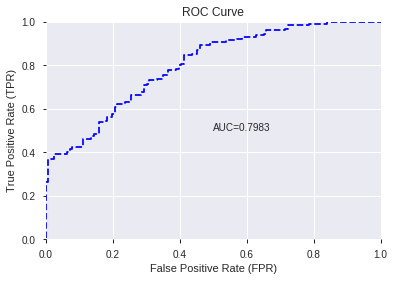

This function is available for GLM models only


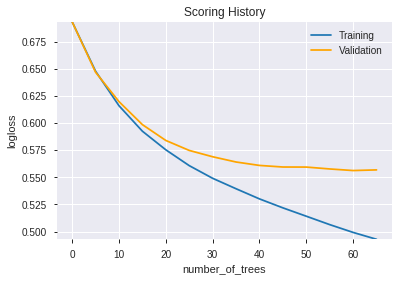

--2019-12-07 23:30:25--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.145.139
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.145.139|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
Exception in thread "main" java.lang.StackOverflowError
	at java.base/java.lang.String.substring(String.java:1874)
	at java.base/java.lang.String.split(String.java:2289)
	at java.base/java.lang.String.split(String.java:2364)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:101)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:112)
	at hex.genmodel.algos.xgboost.XGBoostMojoModel.constructSubgraph(XGBoostMojoModel.java:106)
	at hex.genmodel.algos.xgboost.XGBoostMojoMo

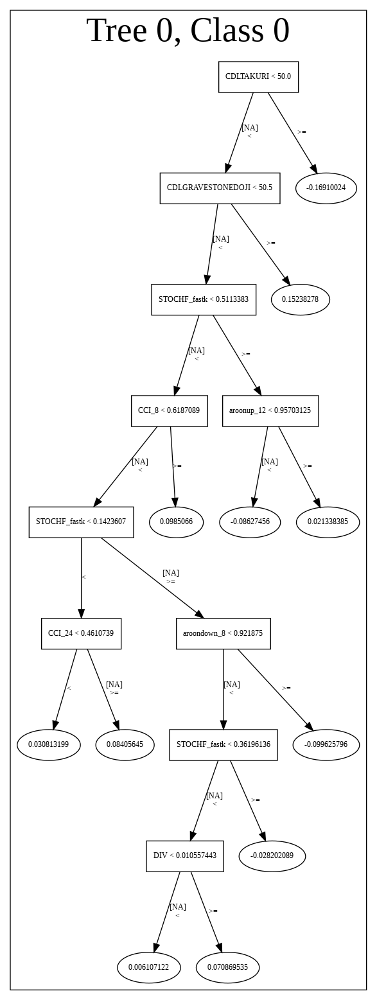

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_grid_1_AutoML_20191207_233008_model_6',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_grid_1_AutoML_20191207_233008_model_6',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_93_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training

['CDLGRAVESTONEDOJI',
 'PLUS_DI_8',
 'STOCHF_fastk',
 'ULTOSC',
 'MINUS_DI_8',
 'CDLDRAGONFLYDOJI',
 'WILLR_12',
 'WILLR_8',
 'STOCH_slowk',
 'CDLTAKURI',
 'STOCHF_fastd',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'CDLHAMMER',
 'CDLSHOOTINGSTAR',
 'CDLHANGINGMAN',
 'CDLINVERTEDHAMMER']

In [86]:
# XGBoost with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="XGBoost",features_list=features_list)

In [87]:
# DRF with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_2_AutoML_20191207_233229,0.797375,0.535306,0.295665,0.427725,0.182949
1,GBM_5_AutoML_20191207_233229,0.790354,0.542086,0.320085,0.429820,0.184745
2,GBM_1_AutoML_20191207_233229,0.788523,0.545220,0.311050,0.431946,0.186577
3,GBM_4_AutoML_20191207_233229,0.788523,0.543417,0.368437,0.433080,0.187558
4,GBM_grid_1_AutoML_20191207_233229_model_2,0.785989,0.608056,0.307448,0.457127,0.208965
5,GBM_3_AutoML_20191207_233229,0.785531,0.544201,0.356288,0.433449,0.187878
6,GBM_grid_1_AutoML_20191207_233229_model_4,0.784432,0.662321,0.335958,0.484396,0.234640
7,GBM_grid_1_AutoML_20191207_233229_model_1,0.777656,0.601706,0.323199,0.454161,0.206262
8,GBM_grid_1_AutoML_20191207_233229_model_5,0.763492,0.686355,0.376618,0.496593,0.246604
9,GBM_grid_1_AutoML_20191207_233229_model_3,0.730586,0.751509,0.375885,0.494805,0.244832


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,149.001816,1.000000,0.130913
1,STOCHF_fastk,139.254059,0.934580,0.122348
2,MINUS_DI_8,130.296143,0.874460,0.114478
3,WILLR_12,119.685768,0.803250,0.105156
4,PLUS_DI_8,112.586899,0.755608,0.098919
5,ULTOSC,108.177307,0.726013,0.095044
6,WILLR_8,100.412178,0.673899,0.088222
7,CDLGRAVESTONEDOJI,99.802498,0.669807,0.087686
8,STOCHF_fastd,63.608772,0.426899,0.055887
9,STOCH_slowk,54.602097,0.366453,0.047973


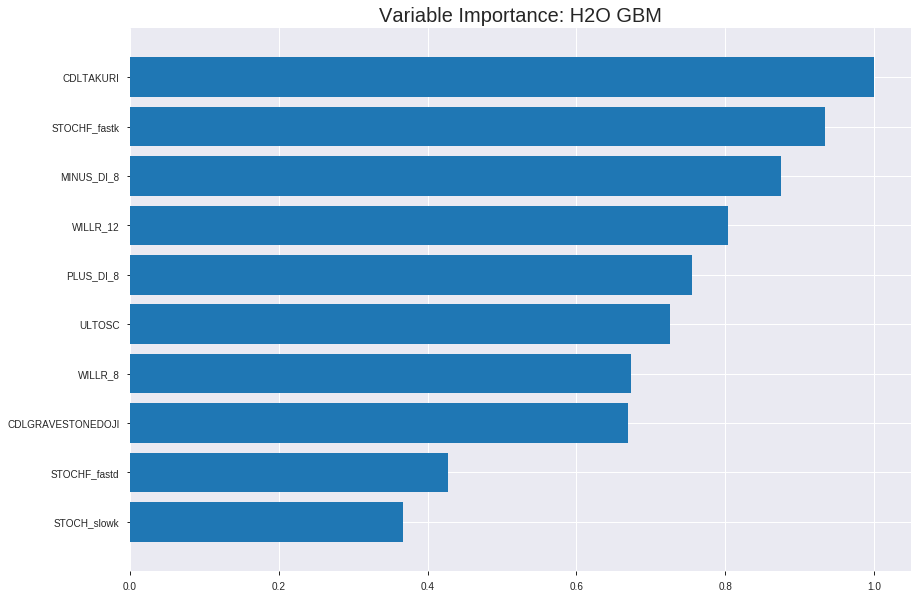

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_2_AutoML_20191207_233229


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.12943397426922237
RMSE: 0.3597693348094337
LogLoss: 0.4156272347875676
Mean Per-Class Error: 0.16736624679333012
AUC: 0.9265459656084657
pr_auc: 0.9280441898746783
Gini: 0.8530919312169314
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4461808113001847: 


,0,1,Error,Rate
0,666.0,225.0,0.2525,(225.0/891.0)
1,75.0,821.0,0.0837,(75.0/896.0)
Total,741.0,1046.0,0.1679,(300.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4461808,0.8455201,225.0
max f2,0.3665062,0.9080484,260.0
max f0point5,0.6017848,0.8604260,151.0
max accuracy,0.4976509,0.8326805,200.0
max precision,0.9583447,1.0,0.0
max recall,0.2439072,1.0,316.0
max specificity,0.9583447,1.0,0.0
max absolute_mcc,0.4461808,0.6736513,225.0
max min_per_class_accuracy,0.5110819,0.8282828,193.0
max mean_per_class_accuracy,0.4976509,0.8326338,200.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.19 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9369750,1.9944196,1.9944196,1.0,0.9450253,1.0,0.9450253,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9289985,1.9944196,1.9944196,1.0,0.9330678,1.0,0.9390466,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9202405,1.9944196,1.9944196,1.0,0.9238065,1.0,0.9339665,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9125145,1.9944196,1.9944196,1.0,0.9172868,1.0,0.9297966,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9067895,1.9944196,1.9944196,1.0,0.9100939,1.0,0.9258561,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8588108,1.9944196,1.9944196,1.0,0.8834111,1.0,0.9047521,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.7990859,1.9944196,1.9944196,1.0,0.8281199,1.0,0.8793034,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.7436004,1.9722594,1.9888486,0.9888889,0.7711630,0.9972067,0.8521172,0.0993304,0.3984375,97.2259425,98.8848638
,9,0.2999440,0.6608527,1.7703275,1.9162801,0.8876404,0.6985490,0.9608209,0.8011188,0.1763393,0.5747768,77.0327548,91.6280067
,10,0.4001119,0.5841495,1.3816091,1.7824254,0.6927374,0.6205769,0.8937063,0.7559202,0.1383929,0.7131696,38.1609138,78.2425387




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.19146381507456917
RMSE: 0.43756578371094007
LogLoss: 0.5632876321805463
Mean Per-Class Error: 0.27653014265991716
AUC: 0.7901288541187298
pr_auc: 0.7588968153220174
Gini: 0.5802577082374596
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3730410414063205: 


,0,1,Error,Rate
0,124.0,141.0,0.5321,(141.0/265.0)
1,23.0,223.0,0.0935,(23.0/246.0)
Total,147.0,364.0,0.3209,(164.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3730410,0.7311475,283.0
max f2,0.2140369,0.8415493,340.0
max f0point5,0.6823472,0.7200811,140.0
max accuracy,0.6038624,0.7240705,184.0
max precision,0.9552103,1.0,0.0
max recall,0.0766525,1.0,384.0
max specificity,0.9552103,1.0,0.0
max absolute_mcc,0.6019657,0.4471661,185.0
max min_per_class_accuracy,0.5922963,0.7154472,189.0
max mean_per_class_accuracy,0.6019657,0.7234699,185.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 54.24 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9427099,1.7310298,1.7310298,0.8333333,0.9492177,0.8333333,0.9492177,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9357044,1.6617886,1.6995565,0.8,0.9388665,0.8181818,0.9445126,0.0162602,0.0365854,66.1788618,69.9556541
,3,0.0313112,0.9289728,1.6617886,1.6877541,0.8,0.9325991,0.8125,0.9407896,0.0162602,0.0528455,66.1788618,68.7754065
,4,0.0410959,0.9215517,2.0772358,1.7804878,1.0,0.9241345,0.8571429,0.9368241,0.0203252,0.0731707,107.7235772,78.0487805
,5,0.0508806,0.9140826,2.0772358,1.8375547,1.0,0.9178797,0.8846154,0.9331810,0.0203252,0.0934959,107.7235772,83.7554722
,6,0.1017613,0.8753314,1.7576610,1.7976079,0.8461538,0.8946653,0.8653846,0.9139231,0.0894309,0.1829268,75.7661038,79.7607880
,7,0.1506849,0.8460237,1.7448780,1.7804878,0.84,0.8584645,0.8571429,0.8959171,0.0853659,0.2682927,74.4878049,78.0487805
,8,0.2015656,0.8146425,1.5978737,1.7343910,0.7692308,0.8285544,0.8349515,0.8789129,0.0813008,0.3495935,59.7873671,73.4391033
,9,0.3013699,0.7262418,1.4255540,1.6321138,0.6862745,0.7703207,0.7857143,0.8429506,0.1422764,0.4918699,42.5553961,63.2113821
,10,0.4011742,0.6582578,1.2219034,1.5300615,0.5882353,0.6883023,0.7365854,0.8044771,0.1219512,0.6138211,22.1903396,53.0061471



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:32:30,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-07 23:32:30,0.033 sec,5.0,0.4503805,0.5964812,0.8421222,0.8439625,1.9944196,0.2602126,0.4604193,0.6151632,0.7790075,0.7583519,2.0772358,0.2915851
,2019-12-07 23:32:30,0.062 sec,10.0,0.4238297,0.5426996,0.8548381,0.8596425,1.9944196,0.2462227,0.4429979,0.5784505,0.7910109,0.7657999,2.0772358,0.2661448
,2019-12-07 23:32:30,0.091 sec,15.0,0.4078174,0.5082668,0.8670109,0.8730849,1.9944196,0.2395076,0.4378577,0.5652232,0.7924988,0.7705633,1.7310298,0.2739726
,2019-12-07 23:32:30,0.121 sec,20.0,0.3919546,0.4762641,0.8869023,0.8903183,1.9944196,0.2126469,0.4357362,0.5597658,0.7937797,0.7642352,1.7310298,0.3091977
,2019-12-07 23:32:30,0.183 sec,25.0,0.3804046,0.4535408,0.9019129,0.9050412,1.9944196,0.2098489,0.4382882,0.5642610,0.7884415,0.7614757,1.7310298,0.3228963
,2019-12-07 23:32:30,0.212 sec,30.0,0.3694045,0.4331230,0.9155024,0.9158512,1.9944196,0.1829882,0.4366412,0.5605081,0.7918776,0.7622772,1.7310298,0.3170254
,2019-12-07 23:32:30,0.244 sec,35.0,0.3597693,0.4156272,0.9265460,0.9280442,1.9944196,0.1678791,0.4375658,0.5632876,0.7901289,0.7588968,1.7310298,0.3209393


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,149.0018158,1.0,0.1309127
STOCHF_fastk,139.2540588,0.9345796,0.1223484
MINUS_DI_8,130.2961426,0.8744601,0.1144779
WILLR_12,119.6857681,0.8032504,0.1051557
PLUS_DI_8,112.5868988,0.7556076,0.0989186
ULTOSC,108.1773071,0.7260133,0.0950444
WILLR_8,100.4121780,0.6738990,0.0882219
CDLGRAVESTONEDOJI,99.8024979,0.6698073,0.0876863
STOCHF_fastd,63.6087723,0.4268993,0.0558865
STOCH_slowk,54.6020966,0.3664526,0.0479733


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.71484375)

('F1', 0.7524752475247525)

('auc', 0.7973748473748473)

('logloss', 0.535305651173382)

('mean_per_class_error', 0.2841880341880342)

('rmse', 0.42772525749114615)

('mse', 0.1829488958958673)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


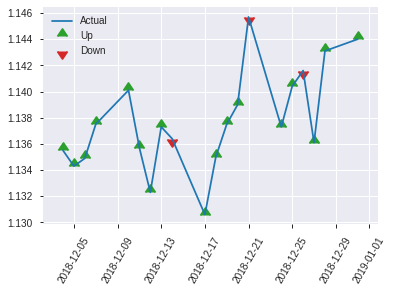


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.1829488958958673
RMSE: 0.42772525749114615
LogLoss: 0.535305651173382
Mean Per-Class Error: 0.2841880341880342
AUC: 0.7973748473748473
pr_auc: 0.8147859582294682
Gini: 0.5947496947496946
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.401189107139692: 


,0,1,Error,Rate
0,67.0,59.0,0.4683,(59.0/126.0)
1,16.0,114.0,0.1231,(16.0/130.0)
Total,83.0,173.0,0.293,(75.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4011891,0.7524752,172.0
max f2,0.1932957,0.8602151,223.0
max f0point5,0.7215861,0.7460733,62.0
max accuracy,0.5783779,0.7148438,112.0
max precision,0.9464374,1.0,0.0
max recall,0.1364159,1.0,236.0
max specificity,0.9464374,1.0,0.0
max absolute_mcc,0.7215861,0.4536384,62.0
max min_per_class_accuracy,0.5254894,0.7063492,128.0
max mean_per_class_accuracy,0.5783779,0.7158120,112.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.28 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9378659,1.9692308,1.9692308,1.0,0.9409466,1.0,0.9409466,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9279355,1.9692308,1.9692308,1.0,0.9332343,1.0,0.9370905,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9220761,1.9692308,1.9692308,1.0,0.9242852,1.0,0.9338892,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9209011,1.9692308,1.9692308,1.0,0.9213405,1.0,0.9304668,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9197389,1.9692308,1.9692308,1.0,0.9200293,1.0,0.9288610,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8805787,1.9692308,1.9692308,1.0,0.9028867,1.0,0.9158738,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8253474,1.6662722,1.8682446,0.8461538,0.8505832,0.9487179,0.8941103,0.0846154,0.2846154,66.6272189,86.8244576
,8,0.203125,0.7711770,1.6662722,1.8177515,0.8461538,0.7987314,0.9230769,0.8702656,0.0846154,0.3692308,66.6272189,81.7751479
,9,0.3007812,0.6632077,1.1027692,1.5856144,0.56,0.7125974,0.8051948,0.8190746,0.1076923,0.4769231,10.2769231,58.5614386
,10,0.4023438,0.6062947,1.2118343,1.4912621,0.6153846,0.6362198,0.7572816,0.7729171,0.1230769,0.6,21.1834320,49.1262136


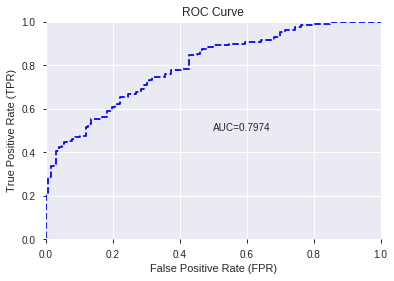

This function is available for GLM models only


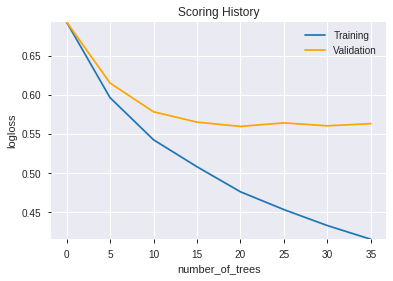

--2019-12-07 23:32:44--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.42.252
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.42.252|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      1497.0
            depth:       1
            colId:       0
            colName:     MINUS_DI_8
            leftward:    true
            naVsRest:    false
            splitVal:    0.21289062
            isBitset:    false
            predValue:   -0.04114514
            squaredErr:  371.8851
            leftChild:   Node 5
            right

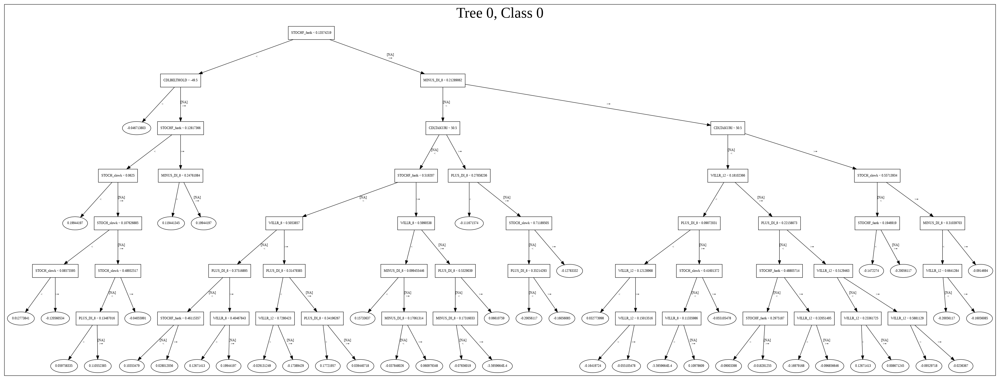

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_2_AutoML_20191207_233229',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_2_AutoML_20191207_233229',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_103_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_103_sid_8e77',
   'type': 'Ke

['CDLTAKURI',
 'STOCHF_fastk',
 'MINUS_DI_8',
 'WILLR_12',
 'PLUS_DI_8',
 'ULTOSC',
 'WILLR_8',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastd',
 'STOCH_slowk',
 'CDLDRAGONFLYDOJI',
 'CDLBELTHOLD',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'CDLCLOSINGMARUBOZU',
 'CDLHAMMER',
 'CDLHANGINGMAN']

In [88]:
# GBM with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="GBM",features_list=features_list)

In [89]:
# StackedEnsemble with Select Family-wise error features
model_train(feature_name='Fwe',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_233341_model_1,0.800122,0.536327,0.303846,0.428155,0.183316
1,GBM_2_AutoML_20191207_233341,0.797375,0.535306,0.295665,0.427725,0.182949
2,GBM_5_AutoML_20191207_233341,0.790354,0.542086,0.320085,0.429820,0.184745
3,GBM_4_AutoML_20191207_233341,0.788523,0.543417,0.368437,0.433080,0.187558
4,GBM_1_AutoML_20191207_233341,0.788523,0.545220,0.311050,0.431946,0.186577
5,XGBoost_3_AutoML_20191207_233341,0.787546,0.542821,0.336203,0.430674,0.185480
6,XGBoost_2_AutoML_20191207_233341,0.786691,0.545744,0.303602,0.431690,0.186356
7,GBM_3_AutoML_20191207_233341,0.785531,0.544201,0.356288,0.433449,0.187878
8,DRF_1_AutoML_20191207_233341,0.770024,0.556928,0.332967,0.440907,0.194399
9,XGBoost_1_AutoML_20191207_233341,0.767033,0.566873,0.356044,0.442399,0.195717


,variable,relative_importance,scaled_importance,percentage
0,CDLGRAVESTONEDOJI,0.650919,1.000000,0.175082
1,CDLDRAGONFLYDOJI,0.537226,0.825335,0.144502
2,STOCHF_fastk,0.479050,0.735959,0.128853
3,PLUS_DI_8,0.399173,0.613246,0.107368
4,WILLR_8,0.304459,0.467737,0.081893
5,WILLR_12,0.291446,0.447746,0.078392
6,MINUS_DI_8,0.246226,0.378275,0.066229
7,ULTOSC,0.182264,0.280011,0.049025
8,CDLTAKURI,0.170055,0.261253,0.045741
9,CDLHANGINGMAN,0.100208,0.153948,0.026954


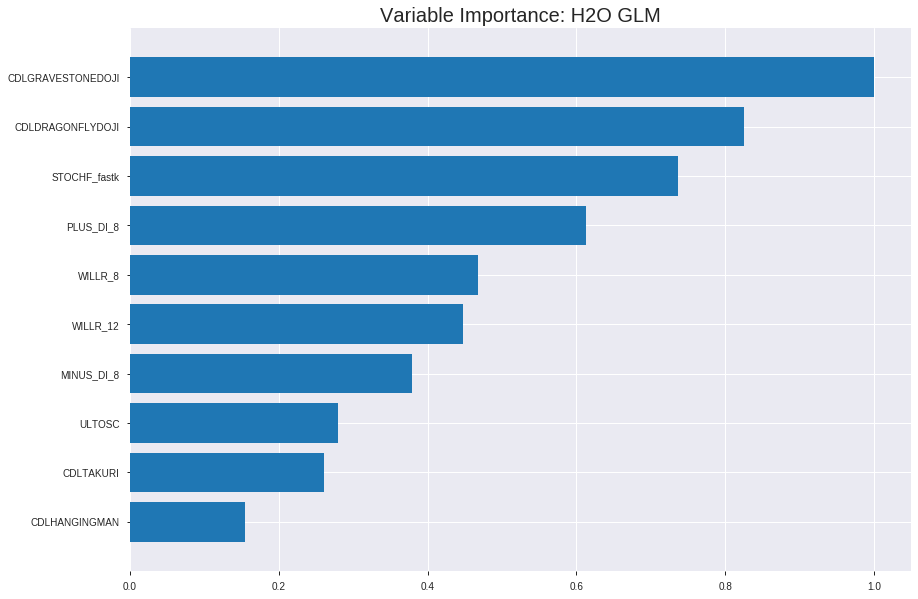

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_233341_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.1966070470949274
RMSE: 0.44340393220508023
LogLoss: 0.5735804788681979
Null degrees of freedom: 1786
Residual degrees of freedom: 1769
Null deviance: 2477.294033375748
Residual deviance: 2049.9766314749395
AIC: 2085.9766314749395
AUC: 0.7621402517235851
pr_auc: 0.7502411581291555
Gini: 0.5242805034471703
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42370142061056165: 


,0,1,Error,Rate
0,407.0,484.0,0.5432,(484.0/891.0)
1,109.0,787.0,0.1217,(109.0/896.0)
Total,516.0,1271.0,0.3318,(593.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4237014,0.7263498,257.0
max f2,0.3130236,0.8564996,312.0
max f0point5,0.5363111,0.6985670,177.0
max accuracy,0.5363111,0.6883044,177.0
max precision,0.9715027,1.0,0.0
max recall,0.0185292,1.0,394.0
max specificity,0.9715027,1.0,0.0
max absolute_mcc,0.5363111,0.3818001,177.0
max min_per_class_accuracy,0.5068399,0.6846240,198.0
max mean_per_class_accuracy,0.5363111,0.6885259,177.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9518388,1.7728175,1.7728175,0.8888889,0.9585130,0.8888889,0.9585130,0.0178571,0.0178571,77.2817460,77.2817460
,2,0.0201455,0.9392471,1.6620164,1.7174169,0.8333333,0.9460772,0.8611111,0.9522951,0.0167411,0.0345982,66.2016369,71.7416915
,3,0.0302182,0.9285049,1.7728175,1.7358838,0.8888889,0.9331422,0.8703704,0.9459108,0.0178571,0.0524554,77.2817460,73.5883763
,4,0.0402910,0.9193992,1.7728175,1.7451172,0.8888889,0.9237186,0.875,0.9403627,0.0178571,0.0703125,77.2817460,74.5117188
,5,0.0503637,0.9103946,1.9944196,1.7949777,1.0,0.9138866,0.9,0.9350675,0.0200893,0.0904018,99.4419643,79.4977679
,6,0.1001679,0.8505174,1.8151460,1.8050055,0.9101124,0.8852113,0.9050279,0.9102787,0.0904018,0.1808036,81.5145967,80.5005487
,7,0.1499720,0.6992894,1.5238262,1.7116288,0.7640449,0.7624365,0.8582090,0.8611818,0.0758929,0.2566964,52.3826244,71.1628798
,8,0.2003358,0.6487461,1.3960937,1.6323043,0.7,0.6722568,0.8184358,0.8136867,0.0703125,0.3270089,39.6093750,63.2304345
,9,0.2999440,0.5863591,1.3109388,1.5255822,0.6573034,0.6163853,0.7649254,0.7481650,0.1305804,0.4575893,31.0938754,52.5582189
,10,0.4001119,0.5422140,1.2033370,1.4449082,0.6033520,0.5630977,0.7244755,0.7018334,0.1205357,0.578125,20.3336991,44.4908217




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.1908134259641512
RMSE: 0.4368219614032143
LogLoss: 0.5557423708113357
Null degrees of freedom: 510
Residual degrees of freedom: 493
Null deviance: 708.5067427497421
Residual deviance: 567.968702969185
AIC: 603.968702969185
AUC: 0.7912256481055377
pr_auc: 0.7876421136411478
Gini: 0.5824512962110755
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4615517744165888: 


,0,1,Error,Rate
0,129.0,136.0,0.5132,(136.0/265.0)
1,26.0,220.0,0.1057,(26.0/246.0)
Total,155.0,356.0,0.317,(162.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4615518,0.7308970,264.0
max f2,0.1270636,0.8426184,347.0
max f0point5,0.5844990,0.7117117,171.0
max accuracy,0.5439044,0.7221135,205.0
max precision,0.9741831,1.0,0.0
max recall,0.0378465,1.0,393.0
max specificity,0.9741831,1.0,0.0
max absolute_mcc,0.5393486,0.4484055,208.0
max min_per_class_accuracy,0.5564656,0.7132075,194.0
max mean_per_class_accuracy,0.5393486,0.7237690,208.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 53.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9515371,2.0772358,2.0772358,1.0,0.9616398,1.0,0.9616398,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9454836,2.0772358,2.0772358,1.0,0.9481887,1.0,0.9555257,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9384121,2.0772358,2.0772358,1.0,0.9411360,1.0,0.9510289,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9329209,2.0772358,2.0772358,1.0,0.9348442,1.0,0.9471754,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9289538,2.0772358,2.0772358,1.0,0.9314283,1.0,0.9441471,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.8967362,1.9174484,1.9973421,0.9230769,0.9125220,0.9615385,0.9283345,0.0975610,0.2032520,91.7448405,99.7342089
,7,0.1506849,0.8291623,1.8279675,1.9423503,0.88,0.8740912,0.9350649,0.9107231,0.0894309,0.2926829,82.7967480,94.2350333
,8,0.2015656,0.7196212,1.1984053,1.7545584,0.5769231,0.7742292,0.8446602,0.8762683,0.0609756,0.3536585,19.8405253,75.4558371
,9,0.3013699,0.6325516,1.2219034,1.5781596,0.5882353,0.6655272,0.7597403,0.8064774,0.1219512,0.4756098,22.1903396,57.8159645
,10,0.4011742,0.5901937,1.3440937,1.5199286,0.6470588,0.6128982,0.7317073,0.7583187,0.1341463,0.6097561,34.4093735,51.9928614



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:33:44,0.000 sec,2,.16E2,18,1.3705789,1.3686082
,2019-12-07 23:33:44,0.004 sec,4,.96E1,18,1.3620496,1.3588507
,2019-12-07 23:33:44,0.008 sec,6,.6E1,18,1.3497127,1.3446901
,2019-12-07 23:33:44,0.011 sec,8,.37E1,18,1.3327878,1.3251789
,2019-12-07 23:33:44,0.013 sec,10,.23E1,18,1.3111398,1.3000916
---,---,---,---,---,---,---,---
,2019-12-07 23:33:44,0.057 sec,40,.11E-2,18,1.1469495,1.1115702
,2019-12-07 23:33:44,0.058 sec,41,.7E-3,18,1.1468228,1.1116703
,2019-12-07 23:33:44,0.060 sec,42,.44E-3,18,1.1467501,1.1117665
,2019-12-07 23:33:44,0.061 sec,43,.27E-3,18,1.1467113,1.1118464



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7508090614886731)

('auc', 0.8001221001221002)

('logloss', 0.5363267204752452)

('mean_per_class_error', 0.2638583638583638)

('rmse', 0.42815463643243246)

('mse', 0.1833163926985884)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           0
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        0

[2554 rows x 1 columns]


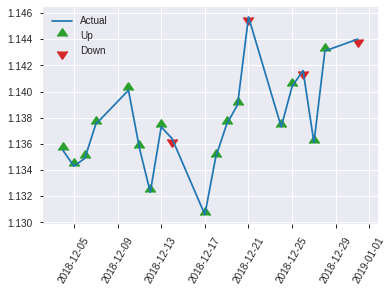


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.1833163926985884
RMSE: 0.42815463643243246
LogLoss: 0.5363267204752452
Null degrees of freedom: 255
Residual degrees of freedom: 238
Null deviance: 354.8709766655013
Residual deviance: 274.59928088332555
AIC: 310.59928088332555
AUC: 0.8001221001221002
pr_auc: 0.8171579465828352
Gini: 0.6002442002442003
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4451546702068863: 


,0,1,Error,Rate
0,63.0,63.0,0.5,(63.0/126.0)
1,14.0,116.0,0.1077,(14.0/130.0)
Total,77.0,179.0,0.3008,(77.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4451547,0.7508091,178.0
max f2,0.3017191,0.8622995,227.0
max f0point5,0.5549565,0.7641509,99.0
max accuracy,0.5549565,0.734375,99.0
max precision,0.9644407,1.0,0.0
max recall,0.0651992,1.0,246.0
max specificity,0.9644407,1.0,0.0
max absolute_mcc,0.5549565,0.4839463,99.0
max min_per_class_accuracy,0.5182614,0.7,126.0
max mean_per_class_accuracy,0.5549565,0.7361416,99.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 52.16 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9561896,1.9692308,1.9692308,1.0,0.9617887,1.0,0.9617887,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9488285,1.9692308,1.9692308,1.0,0.9511910,1.0,0.9564899,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9387317,1.9692308,1.9692308,1.0,0.9443563,1.0,0.9534565,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9322600,1.9692308,1.9692308,1.0,0.9346064,1.0,0.9483156,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9285756,1.9692308,1.9692308,1.0,0.9306000,1.0,0.9455901,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8714831,1.9692308,1.9692308,1.0,0.8965357,1.0,0.9210629,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7449367,1.8177515,1.9187377,0.9230769,0.8230810,0.9743590,0.8884023,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.6686287,1.3633136,1.7798817,0.6923077,0.6949005,0.9038462,0.8400269,0.0692308,0.3615385,36.3313609,77.9881657
,9,0.3007812,0.5946524,1.3390769,1.6367632,0.68,0.6250560,0.8311688,0.7702311,0.1307692,0.4923077,33.9076923,63.6763237
,10,0.4023438,0.5515030,1.3633136,1.5677371,0.6923077,0.5675938,0.7961165,0.7190800,0.1384615,0.6307692,36.3313609,56.7737117


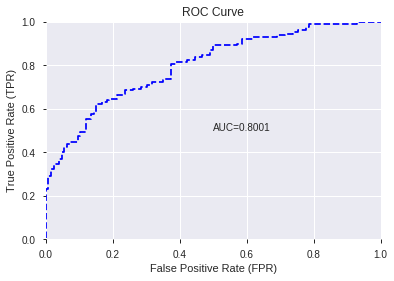

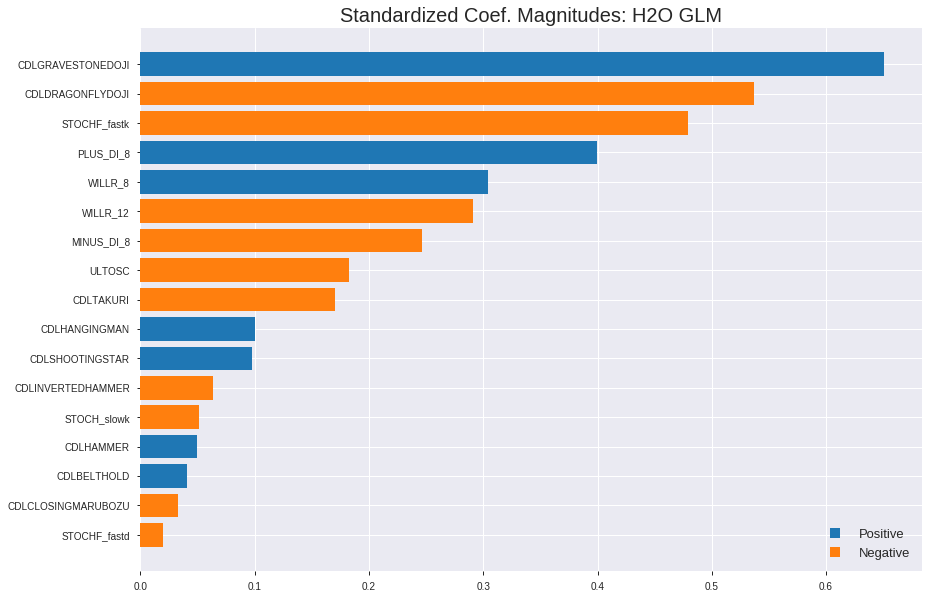

'log_likelihood'
--2019-12-07 23:33:59--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.10.196
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.10.196|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


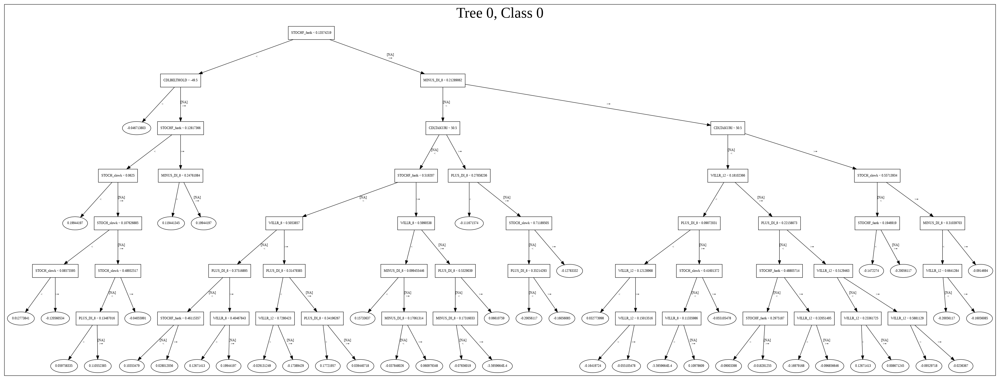

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_233341_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_233341_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_111_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_111

['CDLGRAVESTONEDOJI',
 'CDLDRAGONFLYDOJI',
 'STOCHF_fastk',
 'PLUS_DI_8',
 'WILLR_8',
 'WILLR_12',
 'MINUS_DI_8',
 'ULTOSC',
 'CDLTAKURI',
 'CDLHANGINGMAN',
 'CDLSHOOTINGSTAR',
 'CDLINVERTEDHAMMER',
 'STOCH_slowk',
 'CDLHAMMER',
 'CDLBELTHOLD',
 'CDLCLOSINGMARUBOZU',
 'STOCHF_fastd']

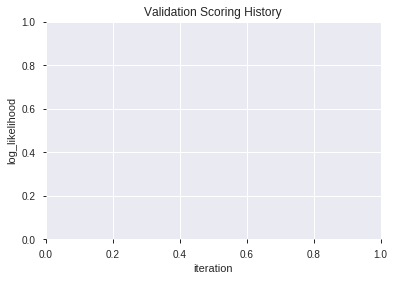

In [90]:
# All algos with Select Family-wise error features
model_train(feature_name='Fwe',model_algo=None,features_list=features_list)

In [91]:
# recursive feature elimination
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFE' in features_to_include:
  from sklearn.feature_selection import RFE
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFE(ExtraTreeClassifier(random_state=1,criterion='entropy'), n_features_to_select=select_rfe, step=1).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFE, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

50

['BBANDS_lowerband_14_1_3',
 'BBANDS_middleband_14_2_2',
 'BBANDS_lowerband_14_2_4',
 'BOP',
 'aroondown_8',
 'aroonup_8',
 'AROONOSC_8',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'ROC_8',
 'WILLR_8',
 'aroonup_12',
 'CMO_12',
 'PLUS_DI_12',
 'PLUS_DM_12',
 'ROCR_12',
 'WILLR_12',
 'ADX_14',
 'CCI_14',
 'ROCR100_14',
 'WILLR_14',
 'MACDFIX_20',
 'MACDFIX_hist_20',
 'MINUS_DI_20',
 'MOM_20',
 'RSI_20',
 'aroondown_24',
 'CCI_24',
 'MINUS_DM_24',
 'PLUS_DI_24',
 'ROC_24',
 'ROCP_24',
 'ROCR_24',
 'aroondown_30',
 'CCI_30',
 'PLUS_DI_30',
 'ROCP_30',
 'WILLR_30',
 'APO',
 'STOCH_slowk',
 'STOCHF_fastk',
 'STOCHF_fastd',
 'ULTOSC',
 'HT_PHASOR_quadrature',
 'CDLGRAVESTONEDOJI',
 'CDLRICKSHAWMAN',
 'CDLTAKURI',
 'BETA_8',
 'STDDEV_8',
 'VAR_8']

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,DeepLearning_grid_1_AutoML_20191207_233505_model_3,0.827534,0.511395,0.304335,0.417916,0.174654
1,DeepLearning_grid_1_AutoML_20191207_233505_model_9,0.816239,0.522343,0.304457,0.419220,0.175745
2,DeepLearning_grid_1_AutoML_20191207_233505_model_8,0.812271,0.501515,0.289072,0.411322,0.169186
3,DeepLearning_grid_1_AutoML_20191207_233505_model_5,0.811477,0.513272,0.301099,0.418132,0.174835
4,DeepLearning_1_AutoML_20191207_233505,0.809585,0.518582,0.289072,0.420545,0.176858
5,DeepLearning_grid_1_AutoML_20191207_233505_model_6,0.799939,0.535226,0.312637,0.427467,0.182728
6,DeepLearning_grid_1_AutoML_20191207_233505_model_1,0.793834,0.610096,0.294444,0.454248,0.206341
7,DeepLearning_grid_1_AutoML_20191207_233505_model_7,0.775885,0.594674,0.308913,0.450204,0.202684
8,DeepLearning_grid_1_AutoML_20191207_233505_model_2,0.773932,0.625833,0.295055,0.460708,0.212252
9,DeepLearning_grid_1_AutoML_20191207_233505_model_4,0.759768,0.614375,0.356166,0.461080,0.212595


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,1.000000,1.000000,0.052395
1,CDLGRAVESTONEDOJI,0.830438,0.830438,0.043511
2,BETA_8,0.699228,0.699228,0.036636
3,ULTOSC,0.550817,0.550817,0.028860
4,MINUS_DM_24,0.505014,0.505014,0.026460
5,ADX_14,0.503047,0.503047,0.026357
6,CDLRICKSHAWMAN,0.498351,0.498351,0.026111
7,MINUS_DI_8,0.452762,0.452762,0.023723
8,BOP,0.443612,0.443612,0.023243
9,aroonup_8,0.436417,0.436417,0.022866


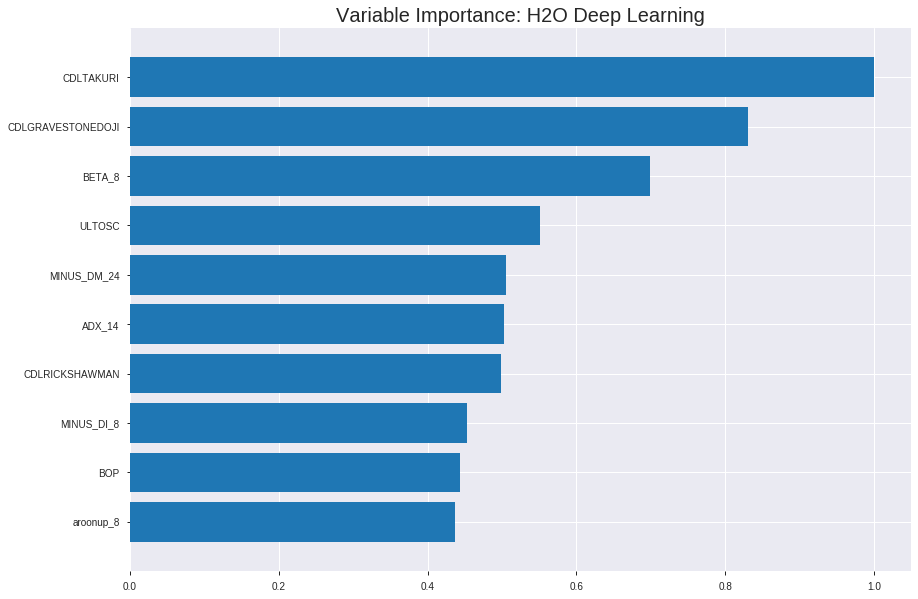

Model Details
H2ODeepLearningEstimator :  Deep Learning
Model Key:  DeepLearning_grid_1_AutoML_20191207_233505_model_3


ModelMetricsBinomial: deeplearning
** Reported on train data. **

MSE: 0.16203882351754517
RMSE: 0.40254046196319837
LogLoss: 0.5046130574972336
Mean Per-Class Error: 0.23684138007054678
AUC: 0.8451090768799102
pr_auc: 0.8291844727959532
Gini: 0.6902181537598204
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.40462639901696623: 


,0,1,Error,Rate
0,539.0,352.0,0.3951,(352.0/891.0)
1,84.0,812.0,0.0938,(84.0/896.0)
Total,623.0,1164.0,0.244,(436.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4046264,0.7883495,253.0
max f2,0.3199242,0.8716534,288.0
max f0point5,0.6425671,0.7705128,160.0
max accuracy,0.5133563,0.7632904,213.0
max precision,0.9986965,1.0,0.0
max recall,0.0006588,1.0,399.0
max specificity,0.9986965,1.0,0.0
max absolute_mcc,0.4046264,0.5363561,253.0
max min_per_class_accuracy,0.5669348,0.7600446,192.0
max mean_per_class_accuracy,0.5133563,0.7631586,213.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 53.20 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9965071,1.9944196,1.9944196,1.0,0.9977377,1.0,0.9977377,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9926664,1.9944196,1.9944196,1.0,0.9946788,1.0,0.9962082,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9906146,1.8836186,1.9574859,0.9444444,0.9918812,0.9814815,0.9947659,0.0189732,0.0591518,88.3618552,95.7485946
,4,0.0402910,0.9860136,1.7728175,1.9113188,0.8888889,0.9889341,0.9583333,0.9933079,0.0178571,0.0770089,77.2817460,91.1318824
,5,0.0503637,0.9815947,1.6620164,1.8614583,0.8333333,0.9838520,0.9333333,0.9914168,0.0167411,0.09375,66.2016369,86.1458333
,6,0.1001679,0.9514564,1.8823736,1.8718575,0.9438202,0.9682213,0.9385475,0.9798838,0.09375,0.1875,88.2373596,87.1857542
,7,0.1499720,0.9011917,1.7255091,1.8232568,0.8651685,0.9272474,0.9141791,0.9624038,0.0859375,0.2734375,72.5509129,82.3256763
,8,0.2003358,0.8462595,1.8171379,1.8217185,0.9111111,0.8704227,0.9134078,0.9392801,0.0915179,0.3649554,81.7137897,82.1718501
,9,0.2999440,0.7453716,1.3893710,1.6781404,0.6966292,0.7962323,0.8414179,0.8917754,0.1383929,0.5033482,38.9370987,67.8140408
,10,0.4001119,0.6591591,1.3593251,1.5983251,0.6815642,0.7006578,0.8013986,0.8439292,0.1361607,0.6395089,35.9325120,59.8325112




ModelMetricsBinomial: deeplearning
** Reported on validation data. **

MSE: 0.19029699634482442
RMSE: 0.4362304394982363
LogLoss: 0.5715779081197507
Mean Per-Class Error: 0.26157386102162916
AUC: 0.8094646418162295
pr_auc: 0.8029038371091948
Gini: 0.6189292836324589
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.49064990878781134: 


,0,1,Error,Rate
0,147.0,118.0,0.4453,(118.0/265.0)
1,30.0,216.0,0.122,(30.0/246.0)
Total,177.0,334.0,0.2896,(148.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4906499,0.7448276,255.0
max f2,0.1565009,0.8456660,348.0
max f0point5,0.6779272,0.7330097,145.0
max accuracy,0.6103177,0.7377691,191.0
max precision,0.9982111,1.0,0.0
max recall,0.0054144,1.0,388.0
max specificity,0.9982111,1.0,0.0
max absolute_mcc,0.6013553,0.4765965,194.0
max min_per_class_accuracy,0.6139600,0.7283019,187.0
max mean_per_class_accuracy,0.6013553,0.7384261,194.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 56.55 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9925193,2.0772358,2.0772358,1.0,0.9945890,1.0,0.9945890,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9900268,2.0772358,2.0772358,1.0,0.9905408,1.0,0.9927489,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9888919,2.0772358,2.0772358,1.0,0.9896171,1.0,0.9917702,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9871110,2.0772358,2.0772358,1.0,0.9876987,1.0,0.9908008,0.0203252,0.0853659,107.7235772,107.7235772
,5,0.0508806,0.9859055,2.0772358,2.0772358,1.0,0.9864475,1.0,0.9899636,0.0203252,0.1056911,107.7235772,107.7235772
,6,0.1017613,0.9723906,1.8375547,1.9573952,0.8846154,0.9818302,0.9423077,0.9858969,0.0934959,0.1991870,83.7554722,95.7395247
,7,0.1506849,0.9434335,1.8279675,1.9153732,0.88,0.9602606,0.9220779,0.9775734,0.0894309,0.2886179,82.7967480,91.5373245
,8,0.2015656,0.8576651,1.5179800,1.8150604,0.7307692,0.9027124,0.8737864,0.9586765,0.0772358,0.3658537,51.7979987,81.5060384
,9,0.3013699,0.7567363,1.3848238,1.6725795,0.6666667,0.8034996,0.8051948,0.9072867,0.1382114,0.5040650,38.4823848,67.2579453
,10,0.4011742,0.6672001,1.2626335,1.5705929,0.6078431,0.7115644,0.7560976,0.8585948,0.1260163,0.6300813,26.2633509,57.0592901



Scoring History: 


,timestamp,duration,training_speed,epochs,iterations,samples,training_rmse,training_logloss,training_r2,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_r2,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:36:21,0.000 sec,None,0.0,0,0.0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
,2019-12-07 23:36:23,1 min 16.724 sec,11425 obs/sec,10.0,1,17870.0,0.4735455,0.7052223,0.1030116,0.7404207,0.7366346,1.8836186,0.3749301,0.4619148,0.6614769,0.1453572,0.7650330,0.7590036,2.0772358,0.3307241
,2019-12-07 23:36:28,1 min 21.850 sec,13490 obs/sec,50.0,5,89350.0,0.4278247,0.5451542,0.2678584,0.8064668,0.7918713,1.9944196,0.2674874,0.4766250,0.6496789,0.0900563,0.7871759,0.7764840,2.0772358,0.3052838
,2019-12-07 23:36:33,1 min 27.186 sec,15021 obs/sec,100.0,10,178700.0,0.4025405,0.5046131,0.3518396,0.8451091,0.8291845,1.9944196,0.2439843,0.4362304,0.5715779,0.2377582,0.8094646,0.8029038,2.0772358,0.2896282
,2019-12-07 23:36:39,1 min 33.012 sec,16190 obs/sec,160.0,16,285920.0,0.3870191,0.4657732,0.4008602,0.8742660,0.8497607,1.9944196,0.2008954,0.4550332,0.6174342,0.1706326,0.8050851,0.7832054,1.7310298,0.2778865
,2019-12-07 23:36:44,1 min 38.112 sec,17320 obs/sec,220.0,22,393140.0,0.3598030,0.4234762,0.4821632,0.8978820,0.8711959,1.9944196,0.1751539,0.4309273,0.5980225,0.2561782,0.8139285,0.7974678,2.0772358,0.2622309
,2019-12-07 23:36:50,1 min 43.692 sec,18371 obs/sec,290.0,29,518230.0,0.3409388,0.3776665,0.5350392,0.9255195,0.8930389,1.9944196,0.1477336,0.4460466,0.6397190,0.2030681,0.8029069,0.7704330,1.7310298,0.2700587
,2019-12-07 23:36:55,1 min 49.008 sec,19225 obs/sec,360.0,36,643320.0,0.3205003,0.3565863,0.5891149,0.9352917,0.8876996,1.9944196,0.1203134,0.4434156,0.6549935,0.2124416,0.7988649,0.7646135,2.0772358,0.3072407
,2019-12-07 23:37:00,1 min 54.165 sec,19932 obs/sec,430.0,43,768410.0,0.3050307,0.3150766,0.6278221,0.9512711,0.8909127,1.9944196,0.1063234,0.4378435,0.6490140,0.2321107,0.8049087,0.7710775,2.0772358,0.2524462
,2019-12-07 23:37:00,1 min 54.242 sec,19929 obs/sec,430.0,43,768410.0,0.4025405,0.5046131,0.3518396,0.8451091,0.8291845,1.9944196,0.2439843,0.4362304,0.5715779,0.2377582,0.8094646,0.8029038,2.0772358,0.2896282


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,1.0,1.0,0.0523954
CDLGRAVESTONEDOJI,0.8304383,0.8304383,0.0435112
BETA_8,0.6992283,0.6992283,0.0366364
ULTOSC,0.5508169,0.5508169,0.0288603
MINUS_DM_24,0.5050145,0.5050145,0.0264605
---,---,---,---
ROC_8,0.2743220,0.2743220,0.0143732
BBANDS_lowerband_14_2_4,0.2692928,0.2692928,0.0141097
ROCR_24,0.2688898,0.2688898,0.0140886
ROC_24,0.2669543,0.2669543,0.0139872



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.7570977917981073)

('auc', 0.8275335775335776)

('logloss', 0.5113954061363541)

('mean_per_class_error', 0.2526862026862027)

('rmse', 0.4179160621533428)

('mse', 0.17465383500575668)

deeplearning prediction progress: |███████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


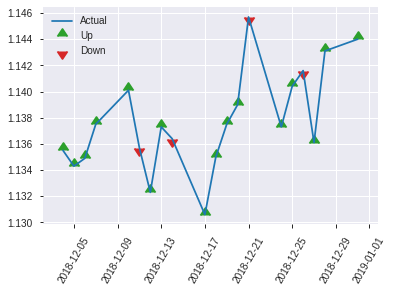


ModelMetricsBinomial: deeplearning
** Reported on test data. **

MSE: 0.17465383500575668
RMSE: 0.4179160621533428
LogLoss: 0.5113954061363541
Mean Per-Class Error: 0.2526862026862027
AUC: 0.8275335775335776
pr_auc: 0.8404895183004338
Gini: 0.6550671550671552
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4569281324612233: 


,0,1,Error,Rate
0,59.0,67.0,0.5317,(67.0/126.0)
1,10.0,120.0,0.0769,(10.0/130.0)
Total,69.0,187.0,0.3008,(77.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4569281,0.7570978,186.0
max f2,0.2225356,0.8728011,218.0
max f0point5,0.7093382,0.7959641,78.0
max accuracy,0.6377519,0.7460938,108.0
max precision,0.9955308,1.0,0.0
max recall,0.0058545,1.0,242.0
max specificity,0.9955308,1.0,0.0
max absolute_mcc,0.7093382,0.5223958,78.0
max min_per_class_accuracy,0.6032763,0.7230769,125.0
max mean_per_class_accuracy,0.6377519,0.7473138,108.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 56.94 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9939678,1.9692308,1.9692308,1.0,0.9954518,1.0,0.9954518,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9899308,1.9692308,1.9692308,1.0,0.9911341,1.0,0.9932929,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9878188,1.9692308,1.9692308,1.0,0.9887865,1.0,0.9921663,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9869695,1.9692308,1.9692308,1.0,0.9872896,1.0,0.9908363,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9840628,1.9692308,1.9692308,1.0,0.9862170,1.0,0.9901256,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.9664339,1.9692308,1.9692308,1.0,0.9754447,1.0,0.9827852,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8961512,1.8177515,1.9187377,0.9230769,0.9448425,0.9743590,0.9701376,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.8312991,1.5147929,1.8177515,0.7692308,0.8534622,0.9230769,0.9409688,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.7132162,1.6541538,1.7646354,0.84,0.7590718,0.8961039,0.8819113,0.1615385,0.5307692,65.4153846,76.4635365
,10,0.4023438,0.6512682,0.9846154,1.5677371,0.5,0.6781467,0.7961165,0.8304756,0.1,0.6307692,-1.5384615,56.7737117


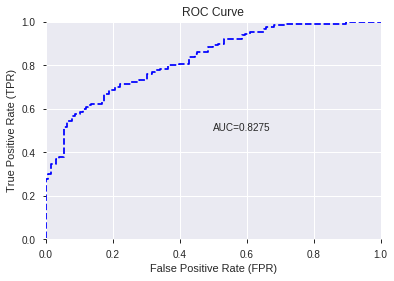

This function is available for GLM models only


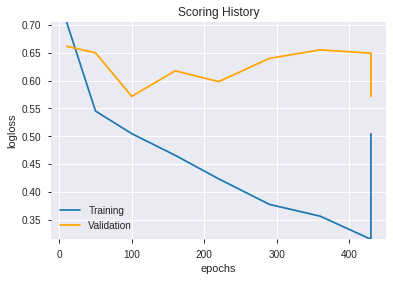

--2019-12-07 23:42:51--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.109.83
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.109.83|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


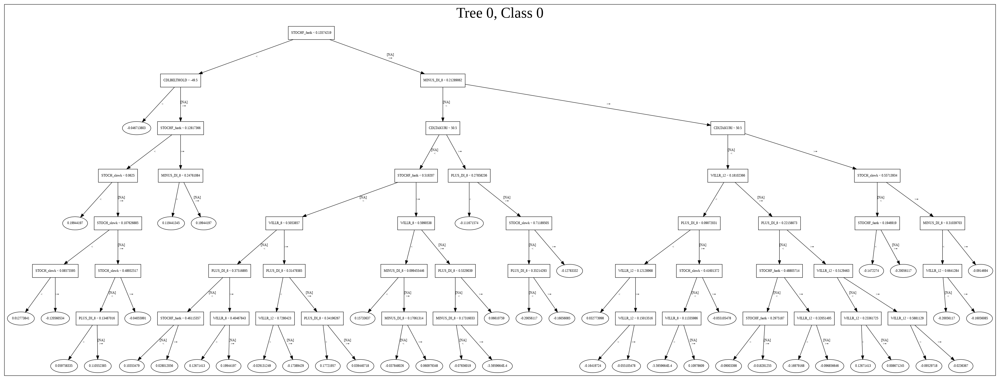

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/DeepLearning_grid_1_AutoML_20191207_233505_model_3',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'DeepLearning_grid_1_AutoML_20191207_233505_model_3',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_116_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'auto

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'BETA_8',
 'ULTOSC',
 'MINUS_DM_24',
 'ADX_14',
 'CDLRICKSHAWMAN',
 'MINUS_DI_8',
 'BOP',
 'aroonup_8',
 'aroondown_30',
 'STOCHF_fastk',
 'aroonup_12',
 'VAR_8',
 'PLUS_DI_8',
 'HT_PHASOR_quadrature',
 'STDDEV_8',
 'MINUS_DI_20',
 'aroondown_24',
 'PLUS_DM_12',
 'aroondown_8',
 'MACDFIX_hist_20',
 'CCI_14',
 'STOCHF_fastd',
 'WILLR_8',
 'PLUS_DI_30',
 'STOCH_slowk',
 'CCI_30',
 'BBANDS_middleband_14_2_2',
 'ROCP_30',
 'CCI_24',
 'AROONOSC_8',
 'MOM_20',
 'PLUS_DI_24',
 'BBANDS_lowerband_14_1_3',
 'PLUS_DI_12',
 'WILLR_14',
 'APO',
 'ROCR100_14',
 'WILLR_12',
 'ROCP_24',
 'WILLR_30',
 'ROCR_12',
 'RSI_20',
 'MACDFIX_20',
 'ROC_8',
 'BBANDS_lowerband_14_2_4',
 'ROCR_24',
 'ROC_24',
 'CMO_12']

In [92]:
# DeepLearning with recursive feature elimination
model_train(feature_name='RFE',model_algo="DeepLearning",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_234348_model_1,0.809524,0.525298,0.29243,0.42216,0.178219


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,0.576722,1.000000,0.071237
1,CCI_14,0.564321,0.978496,0.069705
2,MINUS_DI_8,0.535102,0.927833,0.066096
3,PLUS_DI_8,0.475897,0.825176,0.058783
4,CDLGRAVESTONEDOJI,0.456599,0.791714,0.056399
5,STOCHF_fastk,0.447268,0.775535,0.055246
6,CCI_30,0.376223,0.652347,0.046471
7,MINUS_DM_24,0.332688,0.576861,0.041094
8,CMO_12,0.320079,0.554997,0.039536
9,WILLR_14,0.318297,0.551907,0.039316


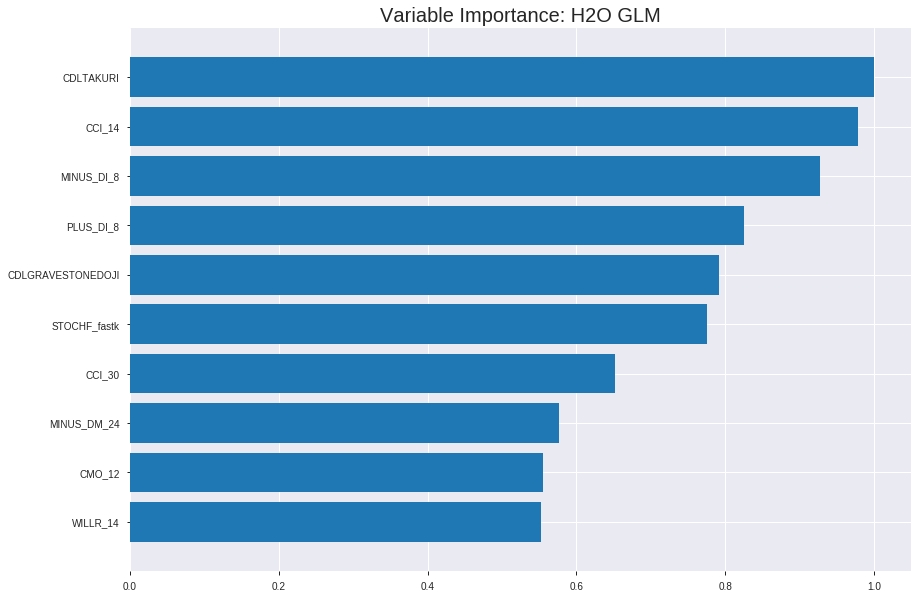

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_234348_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.18322854814266093
RMSE: 0.42805203905910894
LogLoss: 0.5444700092163052
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.294033375748
Residual deviance: 1945.9358129390748
AIC: 2047.9358129390748
AUC: 0.7988428431136764
pr_auc: 0.7864851482560903
Gini: 0.5976856862273527
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4014613745728516: 


,0,1,Error,Rate
0,467.0,424.0,0.4759,(424.0/891.0)
1,90.0,806.0,0.1004,(90.0/896.0)
Total,557.0,1230.0,0.2876,(514.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4014614,0.7582314,249.0
max f2,0.2520628,0.8586850,313.0
max f0point5,0.5405551,0.7198825,178.0
max accuracy,0.4895590,0.7202015,203.0
max precision,0.9908710,1.0,0.0
max recall,0.0010557,1.0,399.0
max specificity,0.9908710,1.0,0.0
max absolute_mcc,0.4014614,0.4573562,249.0
max min_per_class_accuracy,0.5126548,0.7120536,192.0
max mean_per_class_accuracy,0.4895590,0.7200991,203.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9582518,1.8836186,1.8836186,0.9444444,0.9698106,0.9444444,0.9698106,0.0189732,0.0189732,88.3618552,88.3618552
,2,0.0201455,0.9429821,1.9944196,1.9390191,1.0,0.9500153,0.9722222,0.9599130,0.0200893,0.0390625,99.4419643,93.9019097
,3,0.0302182,0.9356704,1.6620164,1.8466849,0.8333333,0.9393677,0.9259259,0.9530646,0.0167411,0.0558036,66.2016369,84.6684854
,4,0.0402910,0.9210700,1.9944196,1.8836186,1.0,0.9271474,0.9444444,0.9465853,0.0200893,0.0758929,99.4419643,88.3618552
,5,0.0503637,0.9050134,1.6620164,1.8392981,0.8333333,0.9135597,0.9222222,0.9399801,0.0167411,0.0926339,66.2016369,83.9298115
,6,0.1001679,0.8474289,1.8375552,1.8384315,0.9213483,0.8769572,0.9217877,0.9086447,0.0915179,0.1841518,83.7555177,83.8431514
,7,0.1499720,0.7492007,1.7255091,1.8009312,0.8651685,0.7985259,0.9029851,0.8720754,0.0859375,0.2700893,72.5509129,80.0931170
,8,0.2003358,0.6962773,1.2852927,1.6713014,0.6444444,0.7171358,0.8379888,0.8331241,0.0647321,0.3348214,28.5292659,67.1301377
,9,0.2999440,0.6210417,1.4790078,1.6074427,0.7415730,0.6565241,0.8059701,0.7744771,0.1473214,0.4821429,47.9007825,60.7442697
,10,0.4001119,0.5643633,1.1587690,1.4951174,0.5810056,0.5905311,0.7496503,0.7284263,0.1160714,0.5982143,15.8768955,49.5117383




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.17743083888132344
RMSE: 0.4212254015148225
LogLoss: 0.5311147080409557
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497421
Residual deviance: 542.7992316178567
AIC: 644.7992316178567
AUC: 0.8133609449302039
pr_auc: 0.7916582104815295
Gini: 0.6267218898604079
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.36532559620734073: 


,0,1,Error,Rate
0,146.0,119.0,0.4491,(119.0/265.0)
1,25.0,221.0,0.1016,(25.0/246.0)
Total,171.0,340.0,0.2818,(144.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3653256,0.7542662,255.0
max f2,0.2449076,0.8471521,307.0
max f0point5,0.5853441,0.7392197,138.0
max accuracy,0.4534321,0.7455969,207.0
max precision,0.9885125,1.0,0.0
max recall,0.0504013,1.0,381.0
max specificity,0.9885125,1.0,0.0
max absolute_mcc,0.4534321,0.4961185,207.0
max min_per_class_accuracy,0.4794850,0.7357724,189.0
max mean_per_class_accuracy,0.4534321,0.7474306,207.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 48.42 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9573166,2.0772358,2.0772358,1.0,0.9704140,1.0,0.9704140,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9453884,2.0772358,2.0772358,1.0,0.9507514,1.0,0.9614764,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9411916,2.0772358,2.0772358,1.0,0.9435712,1.0,0.9558810,0.0203252,0.0650407,107.7235772,107.7235772
,4,0.0410959,0.9304674,1.6617886,1.9783198,0.8,0.9365125,0.9523810,0.9512695,0.0162602,0.0813008,66.1788618,97.8319783
,5,0.0508806,0.9168221,1.6617886,1.9174484,0.8,0.9237917,0.9230769,0.9459853,0.0162602,0.0975610,66.1788618,91.7448405
,6,0.1017613,0.8713856,1.8375547,1.8775016,0.8846154,0.8961185,0.9038462,0.9210519,0.0934959,0.1910569,83.7554722,87.7501563
,7,0.1506849,0.8122056,1.6617886,1.8074649,0.8,0.8421849,0.8701299,0.8954457,0.0813008,0.2723577,66.1788618,80.7464893
,8,0.2015656,0.7465435,1.7576610,1.7948930,0.8461538,0.7833246,0.8640777,0.8671433,0.0894309,0.3617886,75.7661038,79.4893046
,9,0.3013699,0.6310661,1.3440937,1.6456024,0.6470588,0.6769750,0.7922078,0.8041655,0.1341463,0.4959350,34.4093735,64.5602365
,10,0.4011742,0.5431415,1.3848238,1.5807258,0.6666667,0.5864812,0.7609756,0.7500099,0.1382114,0.6341463,38.4823848,58.0725758



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:43:48,0.000 sec,2,.16E2,51,1.3748753,1.3738621
,2019-12-07 23:43:48,0.006 sec,4,.96E1,51,1.3684604,1.3667089
,2019-12-07 23:43:48,0.014 sec,6,.6E1,51,1.3588800,1.3559781
,2019-12-07 23:43:48,0.021 sec,8,.37E1,51,1.3450811,1.3404123
,2019-12-07 23:43:48,0.028 sec,10,.23E1,51,1.3262334,1.3189478
---,---,---,---,---,---,---,---
,2019-12-07 23:43:48,0.115 sec,36,.47E-2,51,1.0850666,1.0633818
,2019-12-07 23:43:48,0.122 sec,38,.29E-2,51,1.0823056,1.0659039
,2019-12-07 23:43:48,0.130 sec,40,.18E-2,51,1.0803715,1.0682137
,2019-12-07 23:43:48,0.138 sec,42,.11E-2,51,1.0791185,1.0701231



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7643312101910829)

('auc', 0.8095238095238095)

('logloss', 0.5252980635021742)

('mean_per_class_error', 0.26642246642246636)

('rmse', 0.42216023243406714)

('mse', 0.17821926184878562)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


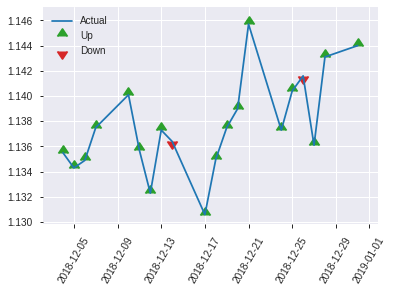


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.17821926184878562
RMSE: 0.42216023243406714
LogLoss: 0.5252980635021742
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.8709766655013
Residual deviance: 268.95260851311315
AIC: 370.95260851311315
AUC: 0.8095238095238095
pr_auc: 0.8192655143922206
Gini: 0.6190476190476191
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3563848930199191: 


,0,1,Error,Rate
0,62.0,64.0,0.5079,(64.0/126.0)
1,10.0,120.0,0.0769,(10.0/130.0)
Total,72.0,184.0,0.2891,(74.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3563849,0.7643312,183.0
max f2,0.2418393,0.8683853,216.0
max f0point5,0.5342297,0.7329317,91.0
max accuracy,0.4328414,0.734375,141.0
max precision,0.9614637,1.0,0.0
max recall,0.0393826,1.0,250.0
max specificity,0.9614637,1.0,0.0
max absolute_mcc,0.4328414,0.4699173,141.0
max min_per_class_accuracy,0.4549709,0.7230769,127.0
max mean_per_class_accuracy,0.4328414,0.7335775,141.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.39 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9507111,1.9692308,1.9692308,1.0,0.9567260,1.0,0.9567260,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9386473,1.9692308,1.9692308,1.0,0.9431926,1.0,0.9499593,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9277317,1.9692308,1.9692308,1.0,0.9369168,1.0,0.9466987,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9186340,1.9692308,1.9692308,1.0,0.9219011,1.0,0.9399357,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8959112,1.9692308,1.9692308,1.0,0.9100963,1.0,0.9353450,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8447718,1.9692308,1.9692308,1.0,0.8730636,1.0,0.9042043,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.7521772,1.9692308,1.9692308,1.0,0.8060865,1.0,0.8714984,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.6613326,1.0603550,1.7420118,0.5384615,0.6998744,0.8846154,0.8285924,0.0538462,0.3538462,6.0355030,74.2011834
,9,0.3007812,0.5748954,1.3390769,1.6111888,0.68,0.6061554,0.8181818,0.7563726,0.1307692,0.4846154,33.9076923,61.1188811
,10,0.4023438,0.4959476,1.0603550,1.4721434,0.5384615,0.5396449,0.7475728,0.7016646,0.1076923,0.5923077,6.0355030,47.2143391


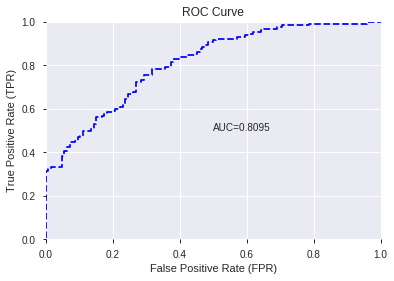

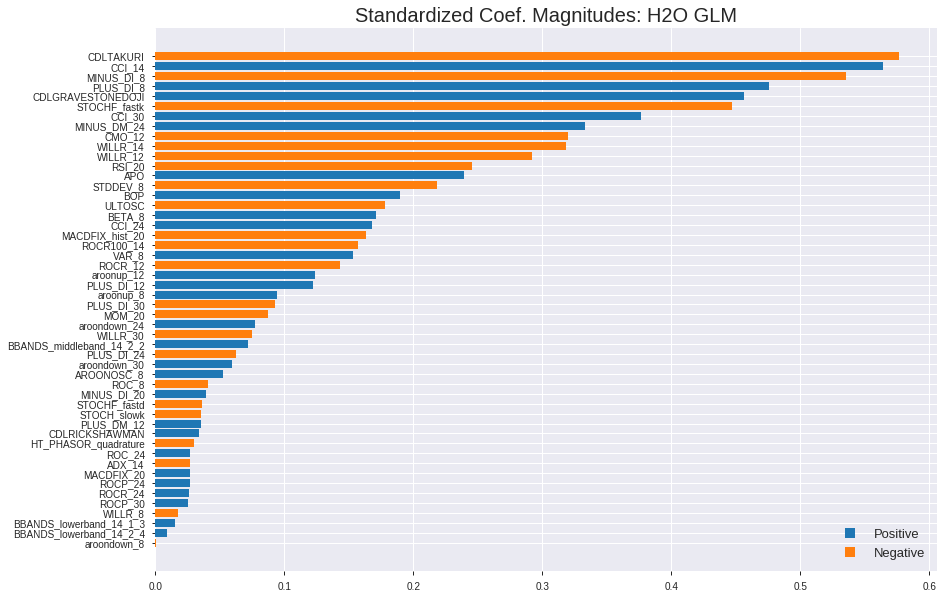

'log_likelihood'
--2019-12-07 23:43:56--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.39.68
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.39.68|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


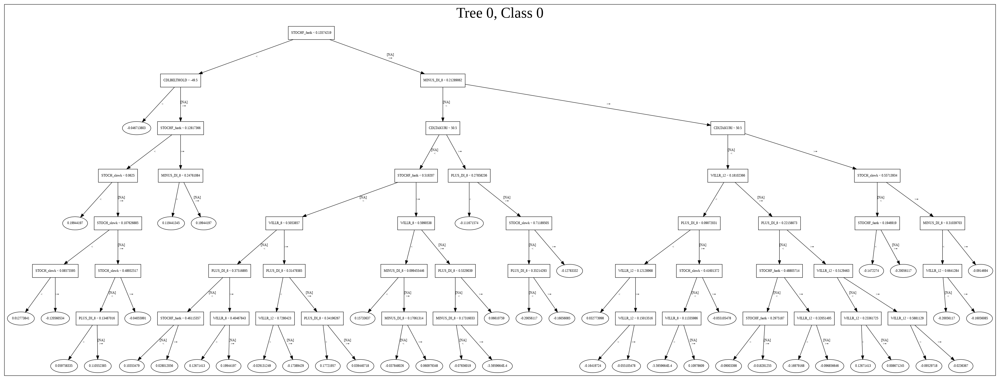

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_234348_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_234348_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_121_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_121

['CDLTAKURI',
 'CCI_14',
 'MINUS_DI_8',
 'PLUS_DI_8',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'CCI_30',
 'MINUS_DM_24',
 'CMO_12',
 'WILLR_14',
 'WILLR_12',
 'RSI_20',
 'APO',
 'STDDEV_8',
 'BOP',
 'ULTOSC',
 'BETA_8',
 'CCI_24',
 'MACDFIX_hist_20',
 'ROCR100_14',
 'VAR_8',
 'ROCR_12',
 'aroonup_12',
 'PLUS_DI_12',
 'aroonup_8',
 'PLUS_DI_30',
 'MOM_20',
 'aroondown_24',
 'WILLR_30',
 'BBANDS_middleband_14_2_2',
 'PLUS_DI_24',
 'aroondown_30',
 'AROONOSC_8',
 'ROC_8',
 'MINUS_DI_20',
 'STOCHF_fastd',
 'STOCH_slowk',
 'PLUS_DM_12',
 'CDLRICKSHAWMAN',
 'HT_PHASOR_quadrature',
 'ROC_24',
 'ADX_14',
 'MACDFIX_20',
 'ROCP_24',
 'ROCR_24',
 'ROCP_30',
 'WILLR_8',
 'BBANDS_lowerband_14_1_3',
 'BBANDS_lowerband_14_2_4',
 'aroondown_8']

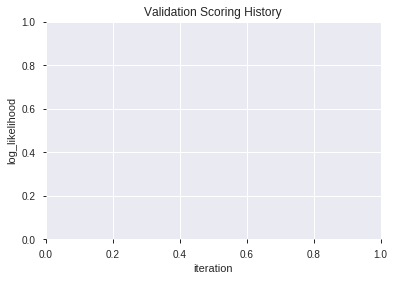

In [93]:
# GLM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GLM",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20191207_234453,0.813309,0.525806,0.291697,0.420477,0.176800
1,XGBoost_grid_1_AutoML_20191207_234453_model_7,0.805983,0.534057,0.316484,0.424280,0.180014
2,XGBoost_grid_1_AutoML_20191207_234453_model_3,0.805372,0.530770,0.271123,0.423546,0.179392
3,XGBoost_grid_1_AutoML_20191207_234453_model_6,0.803541,0.534964,0.266422,0.425881,0.181374
4,XGBoost_grid_1_AutoML_20191207_234453_model_5,0.800366,0.537771,0.308791,0.428222,0.183374
5,XGBoost_grid_1_AutoML_20191207_234453_model_2,0.797985,0.539005,0.336325,0.427996,0.183181
6,XGBoost_1_AutoML_20191207_234453,0.797802,0.538164,0.304335,0.427975,0.183162
7,XGBoost_grid_1_AutoML_20191207_234453_model_4,0.797375,0.542300,0.316484,0.428154,0.183316
8,XGBoost_grid_1_AutoML_20191207_234453_model_1,0.793895,0.542882,0.303968,0.429034,0.184070
9,XGBoost_3_AutoML_20191207_234453,0.791758,0.539900,0.320208,0.429044,0.184079


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,990.010681,1.000000,0.116810
1,CDLGRAVESTONEDOJI,740.440125,0.747911,0.087363
2,STOCHF_fastk,593.802185,0.599794,0.070062
3,WILLR_8,405.363647,0.409454,0.047828
4,ULTOSC,395.953369,0.399949,0.046718
5,MINUS_DI_8,318.366394,0.321579,0.037563
6,CCI_14,306.881927,0.309978,0.036208
7,WILLR_12,302.932068,0.305989,0.035742
8,PLUS_DI_8,220.177231,0.222399,0.025978
9,CCI_24,210.618469,0.212744,0.024851


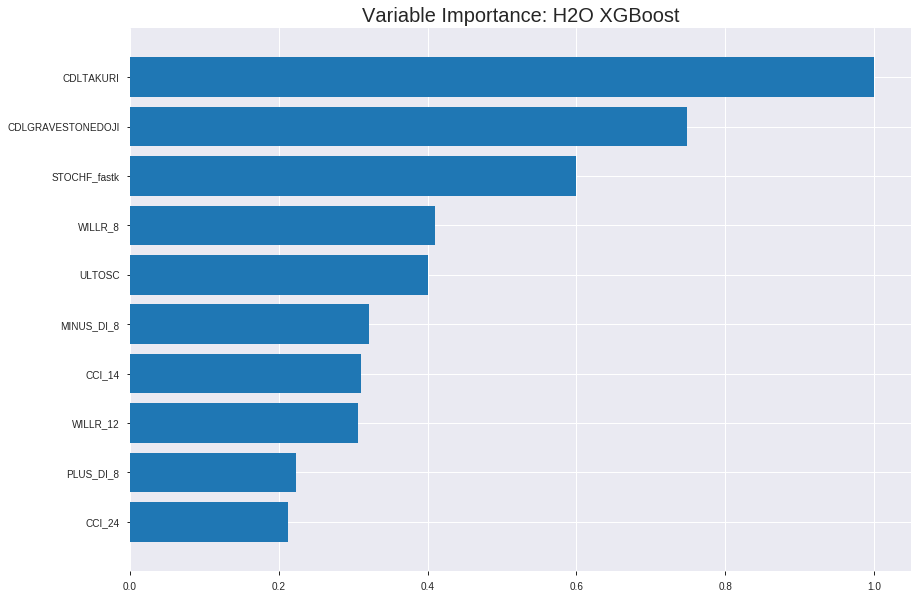

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20191207_234453


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1305137798234506
RMSE: 0.36126690939449546
LogLoss: 0.42418521673048454
Mean Per-Class Error: 0.14284399050024055
AUC: 0.9229891925204425
pr_auc: 0.9164694198251522
Gini: 0.8459783850408851
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4721976965665817: 


,0,1,Error,Rate
0,717.0,174.0,0.1953,(174.0/891.0)
1,81.0,815.0,0.0904,(81.0/896.0)
Total,798.0,989.0,0.1427,(255.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4721977,0.8647215,216.0
max f2,0.3816896,0.9067904,256.0
max f0point5,0.5912570,0.8606992,160.0
max accuracy,0.4721977,0.8573027,216.0
max precision,0.9407630,1.0,0.0
max recall,0.1024023,1.0,376.0
max specificity,0.9407630,1.0,0.0
max absolute_mcc,0.4721977,0.7184246,216.0
max min_per_class_accuracy,0.5101071,0.8540965,198.0
max mean_per_class_accuracy,0.4721977,0.8571560,216.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9182640,1.9944196,1.9944196,1.0,0.9256282,1.0,0.9256282,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9057612,1.9944196,1.9944196,1.0,0.9115805,1.0,0.9186044,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8971130,1.9944196,1.9944196,1.0,0.9017859,1.0,0.9129982,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8877597,1.9944196,1.9944196,1.0,0.8923622,1.0,0.9078392,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8817154,1.8836186,1.9722594,0.9444444,0.8847418,0.9888889,0.9032197,0.0189732,0.0993304,88.3618552,97.2259425
,6,0.1001679,0.8423150,1.9047828,1.9387096,0.9550562,0.8607313,0.9720670,0.8820942,0.0948661,0.1941964,90.4782805,93.8709597
,7,0.1499720,0.7940423,1.9047828,1.9274429,0.9550562,0.8172220,0.9664179,0.8605508,0.0948661,0.2890625,90.4782805,92.7442864
,8,0.2003358,0.7504952,1.7728175,1.8885706,0.8888889,0.7722605,0.9469274,0.8383549,0.0892857,0.3783482,77.2817460,88.8570556
,9,0.2999440,0.6704691,1.8151460,1.8641870,0.9101124,0.7089102,0.9347015,0.7953677,0.1808036,0.5591518,81.5145967,86.4187017
,10,0.4001119,0.5926667,1.6155913,1.8019512,0.8100559,0.6329749,0.9034965,0.7547127,0.1618304,0.7209821,61.5591331,80.1951174




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17494395214903288
RMSE: 0.41826301790743214
LogLoss: 0.5259777654459385
Mean Per-Class Error: 0.251280871299279
AUC: 0.8184767602393005
pr_auc: 0.7923934521907942
Gini: 0.636953520478601
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3905769884586334: 


,0,1,Error,Rate
0,151.0,114.0,0.4302,(114.0/265.0)
1,29.0,217.0,0.1179,(29.0/246.0)
Total,180.0,331.0,0.2798,(143.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3905770,0.7521664,256.0
max f2,0.3099041,0.8437730,293.0
max f0point5,0.6014697,0.7598499,153.0
max accuracy,0.6014697,0.7514677,153.0
max precision,0.9006655,0.9333333,13.0
max recall,0.1049333,1.0,379.0
max specificity,0.9315596,0.9962264,0.0
max absolute_mcc,0.6014697,0.5059097,153.0
max min_per_class_accuracy,0.5254228,0.7357724,189.0
max mean_per_class_accuracy,0.5793771,0.7487191,160.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9209340,1.7310298,1.7310298,0.8333333,0.9254447,0.8333333,0.9254447,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9105544,2.0772358,1.8883962,1.0,0.9139614,0.9090909,0.9202250,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.8967526,1.6617886,1.8175813,0.8,0.9034093,0.875,0.9149701,0.0162602,0.0569106,66.1788618,81.7581301
,4,0.0410959,0.8926458,2.0772358,1.8794038,1.0,0.8948226,0.9047619,0.9101731,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8854440,1.2463415,1.7576610,0.6,0.8886851,0.8461538,0.9060408,0.0121951,0.0894309,24.6341463,75.7661038
,6,0.1017613,0.8579935,1.9973421,1.8775016,0.9615385,0.8721859,0.9038462,0.8891133,0.1016260,0.1910569,99.7342089,87.7501563
,7,0.1506849,0.8256877,1.8279675,1.8614191,0.88,0.8409033,0.8961039,0.8734607,0.0894309,0.2804878,82.7967480,86.1419069
,8,0.2015656,0.7845060,1.9174484,1.8755624,0.9230769,0.8068121,0.9029126,0.8566368,0.0975610,0.3780488,91.7448405,87.5562396
,9,0.3013699,0.6924100,1.3440937,1.6995565,0.6470588,0.7444547,0.8181818,0.8194856,0.1341463,0.5121951,34.4093735,69.9556541
,10,0.4011742,0.6014697,1.4662841,1.6415229,0.7058824,0.6503764,0.7902439,0.7774145,0.1463415,0.6585366,46.6284075,64.1522903



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:44:54,0.002 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 23:44:54,0.047 sec,5.0,0.4725844,0.6394423,0.8339872,0.7978099,1.7881004,0.2742026,0.4736094,0.6413658,0.8070793,0.7433274,1.9288618,0.2876712
,2019-12-07 23:44:54,0.080 sec,10.0,0.4538090,0.6033227,0.8476287,0.8359760,1.9944196,0.2479015,0.4591754,0.6131906,0.8040574,0.7867119,2.0772358,0.2739726
,2019-12-07 23:44:54,0.115 sec,15.0,0.4375966,0.5720556,0.8565779,0.8437312,1.9944196,0.2283156,0.4449593,0.5852665,0.8139822,0.7847476,1.7310298,0.2778865
,2019-12-07 23:44:54,0.149 sec,20.0,0.4249479,0.5474374,0.8677437,0.8581493,1.9944196,0.2104085,0.4361377,0.5672040,0.8186225,0.7999832,1.7804878,0.2661448
,2019-12-07 23:44:54,0.187 sec,25.0,0.4149804,0.5277716,0.8742152,0.8651535,1.9944196,0.2098489,0.4313232,0.5566803,0.8182390,0.7958326,1.7310298,0.2798434
,2019-12-07 23:44:54,0.230 sec,30.0,0.4070490,0.5118906,0.8779167,0.8688042,1.9944196,0.2025741,0.4270147,0.5471729,0.8189370,0.7962196,1.7310298,0.2661448
,2019-12-07 23:44:54,0.267 sec,35.0,0.4003287,0.4985179,0.8832359,0.8696761,1.9944196,0.1952994,0.4245824,0.5413728,0.8190367,0.7947340,1.7310298,0.2739726
,2019-12-07 23:44:54,0.306 sec,40.0,0.3938201,0.4857023,0.8895916,0.8791142,1.9944196,0.1841074,0.4225922,0.5365791,0.8188909,0.7945016,1.7310298,0.2641879
,2019-12-07 23:44:54,0.349 sec,45.0,0.3876958,0.4735746,0.8946609,0.8855655,1.9944196,0.1829882,0.4209533,0.5330442,0.8202025,0.7939729,1.7310298,0.2622309


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,990.0106812,1.0,0.1168096
CDLGRAVESTONEDOJI,740.4401245,0.7479112,0.0873632
STOCHF_fastk,593.8021851,0.5997937,0.0700617
WILLR_8,405.3636475,0.4094538,0.0478281
ULTOSC,395.9533691,0.3999486,0.0467178
---,---,---,---
VAR_8,44.8370056,0.0452894,0.0052902
AROONOSC_8,42.4836731,0.0429123,0.0050126
CDLRICKSHAWMAN,35.0418739,0.0353955,0.0041345
ROCR_24,25.8881035,0.0261493,0.0030545



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7549668874172185)

('auc', 0.8133089133089133)

('logloss', 0.5258059091096614)

('mean_per_class_error', 0.27191697191697195)

('rmse', 0.4204765086788594)

('mse', 0.1768004943507629)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


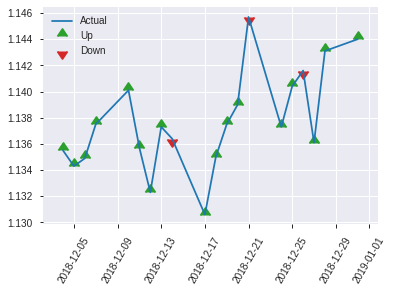


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1768004943507629
RMSE: 0.4204765086788594
LogLoss: 0.5258059091096614
Mean Per-Class Error: 0.27191697191697195
AUC: 0.8133089133089133
pr_auc: 0.8297226790536987
Gini: 0.6266178266178266
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3963892459869385: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,16.0,114.0,0.1231,(16.0/130.0)
Total,84.0,172.0,0.2891,(74.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3963892,0.7549669,171.0
max f2,0.2740690,0.8644537,202.0
max f0point5,0.6760355,0.7746479,73.0
max accuracy,0.5872042,0.7265625,103.0
max precision,0.9327330,1.0,0.0
max recall,0.0899294,1.0,248.0
max specificity,0.9327330,1.0,0.0
max absolute_mcc,0.6760355,0.4898738,73.0
max min_per_class_accuracy,0.5371228,0.7076923,125.0
max mean_per_class_accuracy,0.5872042,0.7280830,103.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9207438,1.9692308,1.9692308,1.0,0.9274584,1.0,0.9274584,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9055027,1.9692308,1.9692308,1.0,0.9108455,1.0,0.9191519,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9006408,1.9692308,1.9692308,1.0,0.9013656,1.0,0.9147054,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8965303,1.9692308,1.9692308,1.0,0.8990203,1.0,0.9104276,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8890416,1.9692308,1.9692308,1.0,0.8896658,1.0,0.9072335,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8541145,1.8177515,1.8934911,0.9230769,0.8727804,0.9615385,0.8900069,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8131457,1.8177515,1.8682446,0.9230769,0.8317448,0.9487179,0.8705862,0.0923077,0.2846154,81.7751479,86.8244576
,8,0.203125,0.7587326,1.8177515,1.8556213,0.9230769,0.7885832,0.9423077,0.8500855,0.0923077,0.3769231,81.7751479,85.5621302
,9,0.3007812,0.6694088,1.4178462,1.7134865,0.72,0.7159604,0.8701299,0.8065384,0.1384615,0.5153846,41.7846154,71.3486513
,10,0.4023438,0.5910091,1.0603550,1.5486184,0.5384615,0.6333083,0.7864078,0.7628104,0.1076923,0.6230769,6.0355030,54.8618372


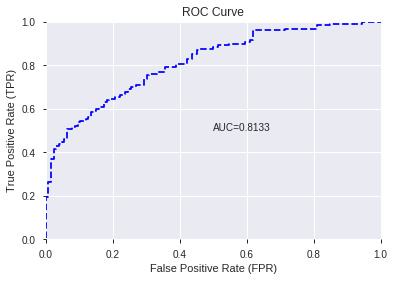

This function is available for GLM models only


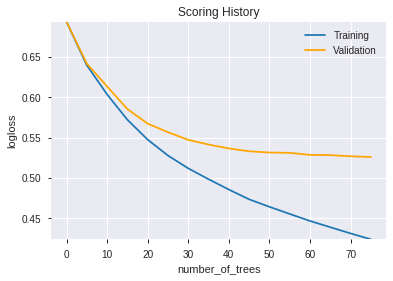

--2019-12-07 23:45:11--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.217.10.4
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.217.10.4|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


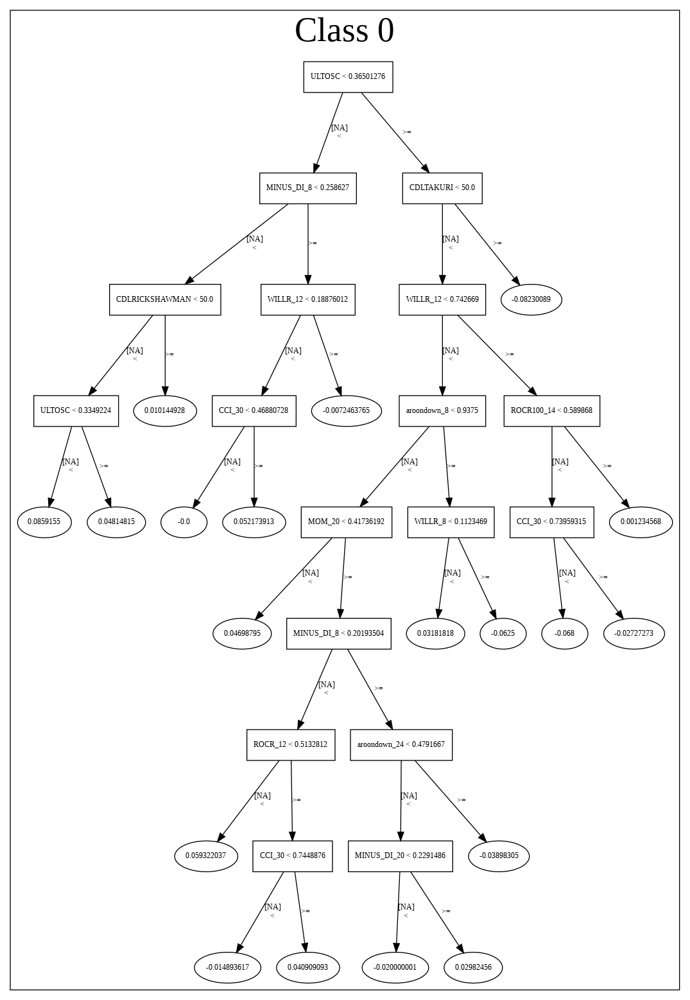

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20191207_234453',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20191207_234453',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_126_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_126_sid_8e77',
   'ty

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'ULTOSC',
 'MINUS_DI_8',
 'CCI_14',
 'WILLR_12',
 'PLUS_DI_8',
 'CCI_24',
 'BETA_8',
 'aroondown_8',
 'CCI_30',
 'STDDEV_8',
 'aroonup_8',
 'aroonup_12',
 'MINUS_DI_20',
 'MINUS_DM_24',
 'ADX_14',
 'HT_PHASOR_quadrature',
 'BOP',
 'MACDFIX_hist_20',
 'ROCR_12',
 'APO',
 'RSI_20',
 'WILLR_14',
 'PLUS_DI_12',
 'ROC_8',
 'PLUS_DM_12',
 'STOCH_slowk',
 'MOM_20',
 'BBANDS_middleband_14_2_2',
 'ROCR100_14',
 'ROC_24',
 'BBANDS_lowerband_14_1_3',
 'BBANDS_lowerband_14_2_4',
 'WILLR_30',
 'CMO_12',
 'aroondown_24',
 'MACDFIX_20',
 'ROCP_30',
 'PLUS_DI_30',
 'aroondown_30',
 'STOCHF_fastd',
 'PLUS_DI_24',
 'VAR_8',
 'AROONOSC_8',
 'CDLRICKSHAWMAN',
 'ROCR_24',
 'ROCP_24']

In [94]:
# XGBoost with recursive feature elimination
model_train(feature_name='RFE',model_algo="XGBoost",features_list=features_list)

In [95]:
# DRF with recursive feature elimination
model_train(feature_name='RFE',model_algo="DRF",features_list=features_list)

Output hidden; open in https://colab.research.google.com to view.

AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GBM_3_AutoML_20191207_234715,0.813126,0.520640,0.267033,0.419791,0.176224
1,GBM_5_AutoML_20191207_234715,0.807082,0.529644,0.271368,0.422626,0.178613
2,GBM_4_AutoML_20191207_234715,0.802259,0.532459,0.336325,0.425814,0.181318
3,GBM_2_AutoML_20191207_234715,0.801709,0.534102,0.287729,0.425645,0.181174
4,GBM_grid_1_AutoML_20191207_234715_model_1,0.799267,0.587130,0.282662,0.446509,0.199370
5,GBM_grid_1_AutoML_20191207_234715_model_4,0.799023,0.646847,0.319841,0.476457,0.227011
6,GBM_grid_1_AutoML_20191207_234715_model_2,0.797741,0.598846,0.328144,0.452336,0.204608
7,GBM_1_AutoML_20191207_234715,0.785043,0.548854,0.335958,0.434103,0.188445
8,GBM_grid_1_AutoML_20191207_234715_model_5,0.784982,0.685760,0.319841,0.496293,0.246307
9,GBM_grid_1_AutoML_20191207_234715_model_3,0.759585,0.722750,0.360745,0.476086,0.226658


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,195.026001,1.000000,0.118625
1,CDLGRAVESTONEDOJI,140.239960,0.719083,0.085301
2,STOCHF_fastk,92.071281,0.472097,0.056003
3,WILLR_12,64.274818,0.329571,0.039095
4,ULTOSC,60.086323,0.308094,0.036548
5,MINUS_DI_8,53.206966,0.272820,0.032363
6,WILLR_8,52.934723,0.271424,0.032198
7,WILLR_14,40.011009,0.205157,0.024337
8,BOP,39.868176,0.204425,0.024250
9,aroondown_8,39.482349,0.202447,0.024015


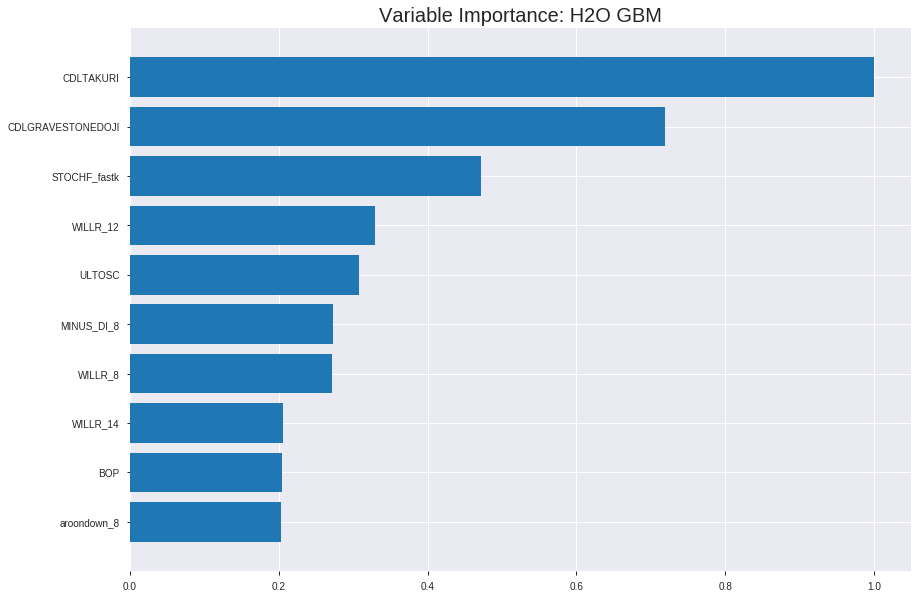

Model Details
H2OGradientBoostingEstimator :  Gradient Boosting Machine
Model Key:  GBM_3_AutoML_20191207_234715


ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.07112430346776968
RMSE: 0.26669140118828294
LogLoss: 0.2789078162660287
Mean Per-Class Error: 0.03190511263427931
AUC: 0.9947046105900273
pr_auc: 0.9913800325992936
Gini: 0.9894092211800547
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5038944732251487: 


,0,1,Error,Rate
0,860.0,31.0,0.0348,(31.0/891.0)
1,26.0,870.0,0.029,(26.0/896.0)
Total,886.0,901.0,0.0319,(57.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5038945,0.9682805,198.0
max f2,0.4167990,0.9748634,227.0
max f0point5,0.5574764,0.9740412,179.0
max accuracy,0.5038945,0.9681030,198.0
max precision,0.9757096,1.0,0.0
max recall,0.2370513,1.0,302.0
max specificity,0.9757096,1.0,0.0
max absolute_mcc,0.5038945,0.9362191,198.0
max min_per_class_accuracy,0.5067040,0.9652076,197.0
max mean_per_class_accuracy,0.5038945,0.9680949,198.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.12 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9567266,1.9944196,1.9944196,1.0,0.9642412,1.0,0.9642412,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9487159,1.9944196,1.9944196,1.0,0.9529049,1.0,0.9585731,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9407119,1.9944196,1.9944196,1.0,0.9439963,1.0,0.9537142,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9356779,1.9944196,1.9944196,1.0,0.9377605,1.0,0.9497257,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9297808,1.9944196,1.9944196,1.0,0.9324076,1.0,0.9462621,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8962892,1.9944196,1.9944196,1.0,0.9125939,1.0,0.9295220,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8581464,1.9944196,1.9944196,1.0,0.8765800,1.0,0.9119405,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8225769,1.9944196,1.9944196,1.0,0.8400847,1.0,0.8938762,0.1004464,0.3995536,99.4419643,99.4419643
,9,0.2999440,0.7484984,1.9832150,1.9906987,0.9943820,0.7853517,0.9981343,0.8578364,0.1975446,0.5970982,98.3215038,99.0698711
,10,0.4001119,0.6623667,1.9832776,1.9888408,0.9944134,0.7076855,0.9972028,0.8202462,0.1986607,0.7957589,98.3277634,98.8840847




ModelMetricsBinomial: gbm
** Reported on validation data. **

MSE: 0.17229408444687974
RMSE: 0.415083225928102
LogLoss: 0.5213296360557633
Mean Per-Class Error: 0.23342537198956892
AUC: 0.8216751035434883
pr_auc: 0.7953641058295848
Gini: 0.6433502070869765
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.46183601549439157: 


,0,1,Error,Rate
0,188.0,77.0,0.2906,(77.0/265.0)
1,52.0,194.0,0.2114,(52.0/246.0)
Total,240.0,271.0,0.2524,(129.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4618360,0.7504836,210.0
max f2,0.2296713,0.8442029,308.0
max f0point5,0.5850959,0.7839388,154.0
max accuracy,0.5850959,0.7690802,154.0
max precision,0.9669313,1.0,0.0
max recall,0.0445522,1.0,389.0
max specificity,0.9669313,1.0,0.0
max absolute_mcc,0.5850959,0.5434263,154.0
max min_per_class_accuracy,0.5104720,0.7520325,192.0
max mean_per_class_accuracy,0.5594684,0.7665746,165.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 49.02 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9437096,2.0772358,2.0772358,1.0,0.9513112,1.0,0.9513112,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.9306511,2.0772358,2.0772358,1.0,0.9387913,1.0,0.9456204,0.0203252,0.0447154,107.7235772,107.7235772
,3,0.0313112,0.9241626,1.2463415,1.8175813,0.6,0.9271274,0.875,0.9398413,0.0121951,0.0569106,24.6341463,81.7581301
,4,0.0410959,0.9196096,1.6617886,1.7804878,0.8,0.9224092,0.8571429,0.9356908,0.0162602,0.0731707,66.1788618,78.0487805
,5,0.0508806,0.9141074,1.6617886,1.7576610,0.8,0.9168662,0.8461538,0.9320707,0.0162602,0.0894309,66.1788618,75.7661038
,6,0.1017613,0.8670049,1.9174484,1.8375547,0.9230769,0.8958994,0.8846154,0.9139850,0.0975610,0.1869919,91.7448405,83.7554722
,7,0.1506849,0.8285466,1.7448780,1.8074649,0.84,0.8451678,0.8701299,0.8916418,0.0853659,0.2723577,74.4878049,80.7464893
,8,0.2015656,0.7833385,1.9174484,1.8352277,0.9230769,0.8094888,0.8834951,0.8709041,0.0975610,0.3699187,91.7448405,83.5227721
,9,0.3013699,0.6885364,1.5070142,1.7265336,0.7254902,0.7402933,0.8311688,0.8276499,0.1504065,0.5203252,50.7014188,72.6533629
,10,0.4011742,0.5734471,1.4662841,1.6617886,0.7058824,0.6286281,0.8,0.7781372,0.1463415,0.6666667,46.6284075,66.1788618



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:47:17,0.003 sec,0.0,0.4999980,0.6931433,0.5,0.0,1.0,0.4986010,0.5000540,0.6932551,0.5,0.0,1.0,0.5185910
,2019-12-07 23:47:17,0.068 sec,5.0,0.4349015,0.5678922,0.8959999,0.8983610,1.9944196,0.2081701,0.4517961,0.5988139,0.8085212,0.7763389,1.7310298,0.2544031
,2019-12-07 23:47:18,0.136 sec,10.0,0.3924603,0.4880850,0.9303489,0.9321730,1.9944196,0.1510912,0.4295589,0.5530055,0.8202485,0.7992060,1.7310298,0.3072407
,2019-12-07 23:47:18,0.202 sec,15.0,0.3623592,0.4328198,0.9521148,0.9532238,1.9944196,0.1197538,0.4214960,0.5347720,0.8211766,0.7943333,2.0772358,0.2700587
,2019-12-07 23:47:18,0.266 sec,20.0,0.3390654,0.3912698,0.9650379,0.9656126,1.9944196,0.0945719,0.4178857,0.5274609,0.8215294,0.7864413,2.0772358,0.2504892
,2019-12-07 23:47:18,0.326 sec,25.0,0.3189253,0.3576487,0.9771688,0.9770478,1.9944196,0.0777840,0.4136743,0.5180664,0.8281178,0.8027999,2.0772358,0.2465753
,2019-12-07 23:47:18,0.434 sec,30.0,0.3014553,0.3301442,0.9860115,0.9854022,1.9944196,0.0565193,0.4122206,0.5159235,0.8292990,0.7946332,1.7310298,0.2583170
,2019-12-07 23:47:18,0.498 sec,35.0,0.2820390,0.3011080,0.9915969,0.9894900,1.9944196,0.0458870,0.4135598,0.5183043,0.8242752,0.7950033,1.7310298,0.2524462
,2019-12-07 23:47:18,0.565 sec,40.0,0.2666914,0.2789078,0.9947046,0.9913800,1.9944196,0.0318970,0.4150832,0.5213296,0.8216751,0.7953641,2.0772358,0.2524462


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,195.0260010,1.0,0.1186250
CDLGRAVESTONEDOJI,140.2399597,0.7190834,0.0853013
STOCHF_fastk,92.0712814,0.4720975,0.0560026
WILLR_12,64.2748184,0.3295705,0.0390953
ULTOSC,60.0863228,0.3080939,0.0365476
---,---,---,---
AROONOSC_8,11.9358511,0.0612013,0.0072600
MACDFIX_20,10.1738262,0.0521665,0.0061883
MOM_20,9.7234039,0.0498570,0.0059143
ROCP_24,9.3523283,0.0479543,0.0056886



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.734375)

('F1', 0.7588652482269503)

('auc', 0.8131257631257631)

('logloss', 0.5206399139645914)

('mean_per_class_error', 0.26678876678876673)

('rmse', 0.4197905392663754)

('mse', 0.17622409685755427)

gbm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           1
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


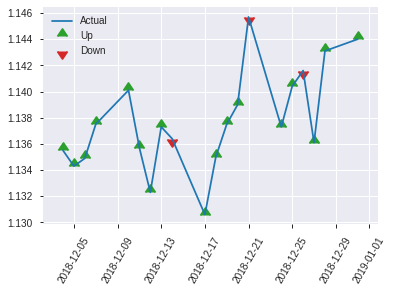


ModelMetricsBinomial: gbm
** Reported on test data. **

MSE: 0.17622409685755427
RMSE: 0.4197905392663754
LogLoss: 0.5206399139645914
Mean Per-Class Error: 0.26678876678876673
AUC: 0.8131257631257631
pr_auc: 0.8318021915294331
Gini: 0.6262515262515262
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.41552306618839857: 


,0,1,Error,Rate
0,81.0,45.0,0.3571,(45.0/126.0)
1,23.0,107.0,0.1769,(23.0/130.0)
Total,104.0,152.0,0.2656,(68.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4155231,0.7588652,151.0
max f2,0.0748284,0.8586526,236.0
max f0point5,0.6349076,0.7751092,81.0
max accuracy,0.4225426,0.734375,147.0
max precision,0.9674411,1.0,0.0
max recall,0.0748284,1.0,236.0
max specificity,0.9674411,1.0,0.0
max absolute_mcc,0.6349076,0.4916412,81.0
max min_per_class_accuracy,0.5047969,0.7222222,128.0
max mean_per_class_accuracy,0.4225426,0.7332112,147.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 48.87 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9542840,1.9692308,1.9692308,1.0,0.9623046,1.0,0.9623046,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9473537,1.9692308,1.9692308,1.0,0.9490029,1.0,0.9556538,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9437070,1.9692308,1.9692308,1.0,0.9456402,1.0,0.9531504,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9403051,1.9692308,1.9692308,1.0,0.9421335,1.0,0.9501458,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9254741,1.9692308,1.9692308,1.0,0.9338368,1.0,0.9476367,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8829213,1.9692308,1.9692308,1.0,0.9011323,1.0,0.9243845,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8128447,1.8177515,1.9187377,0.9230769,0.8489908,0.9743590,0.8992533,0.0923077,0.2923077,81.7751479,91.8737673
,8,0.203125,0.7400216,1.5147929,1.8177515,0.7692308,0.7714576,0.9230769,0.8673044,0.0769231,0.3692308,51.4792899,81.7751479
,9,0.3007812,0.6536589,1.4966154,1.7134865,0.76,0.6934630,0.8701299,0.8108624,0.1461538,0.5153846,49.6615385,71.3486513
,10,0.4023438,0.5716762,1.0603550,1.5486184,0.5384615,0.6054903,0.7864078,0.7590209,0.1076923,0.6230769,6.0355030,54.8618372


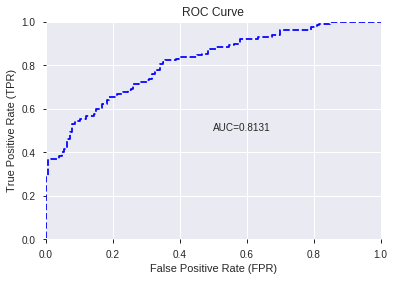

This function is available for GLM models only


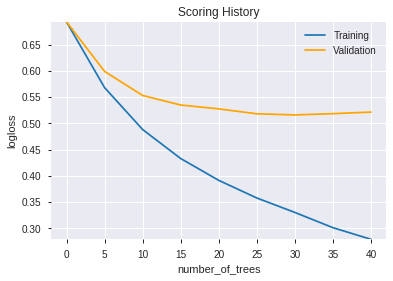

--2019-12-07 23:47:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.184.203
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.184.203|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip

Tree inconsistency found:
Note: this is a known issue for DRF and Isolation Forest models, please refer to https://0xdata.atlassian.net/browse/PUBDEV-6140
        Node 2 (parent)
            weight:      215.0
            depth:       1
            colId:       29
            colName:     PLUS_DI_24
            leftward:    true
            naVsRest:    false
            splitVal:    0.4111328
            isBitset:    false
            predValue:   0.3869731
            squaredErr:  21.320932
            leftChild:   Node 5
            right

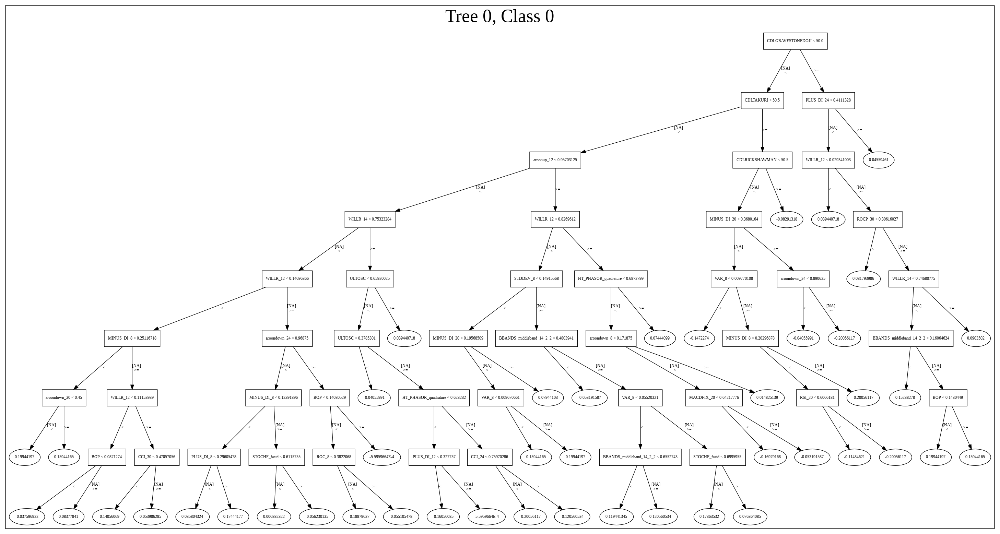

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GBM_3_AutoML_20191207_234715',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GBM_3_AutoML_20191207_234715',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_136_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_136_sid_8e77',
   'type': 'Ke

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'WILLR_12',
 'ULTOSC',
 'MINUS_DI_8',
 'WILLR_8',
 'WILLR_14',
 'BOP',
 'aroondown_8',
 'aroonup_12',
 'CCI_14',
 'STOCHF_fastd',
 'STDDEV_8',
 'HT_PHASOR_quadrature',
 'PLUS_DI_8',
 'aroonup_8',
 'VAR_8',
 'ROCR100_14',
 'MINUS_DI_20',
 'CCI_30',
 'ROC_8',
 'STOCH_slowk',
 'ROCR_12',
 'BETA_8',
 'CCI_24',
 'ADX_14',
 'WILLR_30',
 'CDLRICKSHAWMAN',
 'RSI_20',
 'aroondown_24',
 'ROCP_30',
 'aroondown_30',
 'BBANDS_lowerband_14_2_4',
 'BBANDS_lowerband_14_1_3',
 'PLUS_DM_12',
 'MINUS_DM_24',
 'PLUS_DI_30',
 'PLUS_DI_12',
 'BBANDS_middleband_14_2_2',
 'MACDFIX_hist_20',
 'CMO_12',
 'PLUS_DI_24',
 'APO',
 'ROC_24',
 'AROONOSC_8',
 'MACDFIX_20',
 'MOM_20',
 'ROCP_24',
 'ROCR_24']

In [96]:
# GBM with recursive feature elimination
model_train(feature_name='RFE',model_algo="GBM",features_list=features_list)

In [97]:
# StackedEnsemble with recursive feature elimination
model_train(feature_name='RFE',model_algo="StackedEnsemble",features_list=features_list)

AutoML progress: |████████████████████████████████████████████████████████| 100%


AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,XGBoost_2_AutoML_20191207_234829,0.813309,0.525806,0.291697,0.420477,0.176800
1,GBM_3_AutoML_20191207_234829,0.813126,0.520640,0.267033,0.419791,0.176224
2,GLM_grid_1_AutoML_20191207_234829_model_1,0.809524,0.525298,0.292430,0.422160,0.178219
3,GBM_5_AutoML_20191207_234829,0.807082,0.529644,0.271368,0.422626,0.178613
4,GBM_4_AutoML_20191207_234829,0.802259,0.532459,0.336325,0.425814,0.181318
5,GBM_2_AutoML_20191207_234829,0.801709,0.534102,0.287729,0.425645,0.181174
6,XGBoost_1_AutoML_20191207_234829,0.797802,0.538164,0.304335,0.427975,0.183162
7,XGBoost_3_AutoML_20191207_234829,0.791758,0.539900,0.320208,0.429044,0.184079
8,GBM_1_AutoML_20191207_234829,0.785043,0.548854,0.335958,0.434103,0.188445
9,DRF_1_AutoML_20191207_234829,0.776618,0.565837,0.347497,0.439023,0.192741


,variable,relative_importance,scaled_importance,percentage
0,CDLTAKURI,990.010681,1.000000,0.116810
1,CDLGRAVESTONEDOJI,740.440125,0.747911,0.087363
2,STOCHF_fastk,593.802185,0.599794,0.070062
3,WILLR_8,405.363647,0.409454,0.047828
4,ULTOSC,395.953369,0.399949,0.046718
5,MINUS_DI_8,318.366394,0.321579,0.037563
6,CCI_14,306.881927,0.309978,0.036208
7,WILLR_12,302.932068,0.305989,0.035742
8,PLUS_DI_8,220.177231,0.222399,0.025978
9,CCI_24,210.618469,0.212744,0.024851


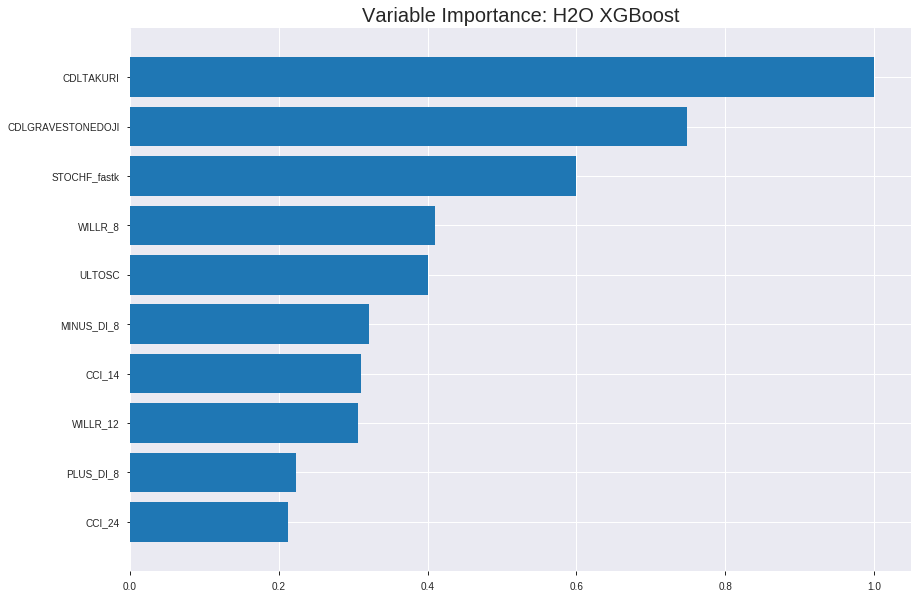

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_2_AutoML_20191207_234829


ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.1305137798234506
RMSE: 0.36126690939449546
LogLoss: 0.42418521673048454
Mean Per-Class Error: 0.14284399050024055
AUC: 0.9229891925204425
pr_auc: 0.9164694198251522
Gini: 0.8459783850408851
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4721976965665817: 


,0,1,Error,Rate
0,717.0,174.0,0.1953,(174.0/891.0)
1,81.0,815.0,0.0904,(81.0/896.0)
Total,798.0,989.0,0.1427,(255.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4721977,0.8647215,216.0
max f2,0.3816896,0.9067904,256.0
max f0point5,0.5912570,0.8606992,160.0
max accuracy,0.4721977,0.8573027,216.0
max precision,0.9407630,1.0,0.0
max recall,0.1024023,1.0,376.0
max specificity,0.9407630,1.0,0.0
max absolute_mcc,0.4721977,0.7184246,216.0
max min_per_class_accuracy,0.5101071,0.8540965,198.0
max mean_per_class_accuracy,0.4721977,0.8571560,216.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.07 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9182640,1.9944196,1.9944196,1.0,0.9256282,1.0,0.9256282,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9057612,1.9944196,1.9944196,1.0,0.9115805,1.0,0.9186044,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8971130,1.9944196,1.9944196,1.0,0.9017859,1.0,0.9129982,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8877597,1.9944196,1.9944196,1.0,0.8923622,1.0,0.9078392,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8817154,1.8836186,1.9722594,0.9444444,0.8847418,0.9888889,0.9032197,0.0189732,0.0993304,88.3618552,97.2259425
,6,0.1001679,0.8423150,1.9047828,1.9387096,0.9550562,0.8607313,0.9720670,0.8820942,0.0948661,0.1941964,90.4782805,93.8709597
,7,0.1499720,0.7940423,1.9047828,1.9274429,0.9550562,0.8172220,0.9664179,0.8605508,0.0948661,0.2890625,90.4782805,92.7442864
,8,0.2003358,0.7504952,1.7728175,1.8885706,0.8888889,0.7722605,0.9469274,0.8383549,0.0892857,0.3783482,77.2817460,88.8570556
,9,0.2999440,0.6704691,1.8151460,1.8641870,0.9101124,0.7089102,0.9347015,0.7953677,0.1808036,0.5591518,81.5145967,86.4187017
,10,0.4001119,0.5926667,1.6155913,1.8019512,0.8100559,0.6329749,0.9034965,0.7547127,0.1618304,0.7209821,61.5591331,80.1951174




ModelMetricsBinomial: xgboost
** Reported on validation data. **

MSE: 0.17494395214903288
RMSE: 0.41826301790743214
LogLoss: 0.5259777654459385
Mean Per-Class Error: 0.251280871299279
AUC: 0.8184767602393005
pr_auc: 0.7923934521907942
Gini: 0.636953520478601
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3905769884586334: 


,0,1,Error,Rate
0,151.0,114.0,0.4302,(114.0/265.0)
1,29.0,217.0,0.1179,(29.0/246.0)
Total,180.0,331.0,0.2798,(143.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3905770,0.7521664,256.0
max f2,0.3099041,0.8437730,293.0
max f0point5,0.6014697,0.7598499,153.0
max accuracy,0.6014697,0.7514677,153.0
max precision,0.9006655,0.9333333,13.0
max recall,0.1049333,1.0,379.0
max specificity,0.9315596,0.9962264,0.0
max absolute_mcc,0.6014697,0.5059097,153.0
max min_per_class_accuracy,0.5254228,0.7357724,189.0
max mean_per_class_accuracy,0.5793771,0.7487191,160.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.9209340,1.7310298,1.7310298,0.8333333,0.9254447,0.8333333,0.9254447,0.0203252,0.0203252,73.1029810,73.1029810
,2,0.0215264,0.9105544,2.0772358,1.8883962,1.0,0.9139614,0.9090909,0.9202250,0.0203252,0.0406504,107.7235772,88.8396157
,3,0.0313112,0.8967526,1.6617886,1.8175813,0.8,0.9034093,0.875,0.9149701,0.0162602,0.0569106,66.1788618,81.7581301
,4,0.0410959,0.8926458,2.0772358,1.8794038,1.0,0.8948226,0.9047619,0.9101731,0.0203252,0.0772358,107.7235772,87.9403794
,5,0.0508806,0.8854440,1.2463415,1.7576610,0.6,0.8886851,0.8461538,0.9060408,0.0121951,0.0894309,24.6341463,75.7661038
,6,0.1017613,0.8579935,1.9973421,1.8775016,0.9615385,0.8721859,0.9038462,0.8891133,0.1016260,0.1910569,99.7342089,87.7501563
,7,0.1506849,0.8256877,1.8279675,1.8614191,0.88,0.8409033,0.8961039,0.8734607,0.0894309,0.2804878,82.7967480,86.1419069
,8,0.2015656,0.7845060,1.9174484,1.8755624,0.9230769,0.8068121,0.9029126,0.8566368,0.0975610,0.3780488,91.7448405,87.5562396
,9,0.3013699,0.6924100,1.3440937,1.6995565,0.6470588,0.7444547,0.8181818,0.8194856,0.1341463,0.5121951,34.4093735,69.9556541
,10,0.4011742,0.6014697,1.4662841,1.6415229,0.7058824,0.6503764,0.7902439,0.7774145,0.1463415,0.6585366,46.6284075,64.1522903



Scoring History: 


,timestamp,duration,number_of_trees,training_rmse,training_logloss,training_auc,training_pr_auc,training_lift,training_classification_error,validation_rmse,validation_logloss,validation_auc,validation_pr_auc,validation_lift,validation_classification_error
,2019-12-07 23:48:30,0.004 sec,0.0,0.5,0.6931472,0.5,0.0,1.0,0.4986010,0.5,0.6931472,0.5,0.0,1.0,0.5185910
,2019-12-07 23:48:30,0.052 sec,5.0,0.4725844,0.6394423,0.8339872,0.7978099,1.7881004,0.2742026,0.4736094,0.6413658,0.8070793,0.7433274,1.9288618,0.2876712
,2019-12-07 23:48:30,0.084 sec,10.0,0.4538090,0.6033227,0.8476287,0.8359760,1.9944196,0.2479015,0.4591754,0.6131906,0.8040574,0.7867119,2.0772358,0.2739726
,2019-12-07 23:48:30,0.119 sec,15.0,0.4375966,0.5720556,0.8565779,0.8437312,1.9944196,0.2283156,0.4449593,0.5852665,0.8139822,0.7847476,1.7310298,0.2778865
,2019-12-07 23:48:30,0.155 sec,20.0,0.4249479,0.5474374,0.8677437,0.8581493,1.9944196,0.2104085,0.4361377,0.5672040,0.8186225,0.7999832,1.7804878,0.2661448
,2019-12-07 23:48:30,0.192 sec,25.0,0.4149804,0.5277716,0.8742152,0.8651535,1.9944196,0.2098489,0.4313232,0.5566803,0.8182390,0.7958326,1.7310298,0.2798434
,2019-12-07 23:48:30,0.238 sec,30.0,0.4070490,0.5118906,0.8779167,0.8688042,1.9944196,0.2025741,0.4270147,0.5471729,0.8189370,0.7962196,1.7310298,0.2661448
,2019-12-07 23:48:30,0.282 sec,35.0,0.4003287,0.4985179,0.8832359,0.8696761,1.9944196,0.1952994,0.4245824,0.5413728,0.8190367,0.7947340,1.7310298,0.2739726
,2019-12-07 23:48:30,0.328 sec,40.0,0.3938201,0.4857023,0.8895916,0.8791142,1.9944196,0.1841074,0.4225922,0.5365791,0.8188909,0.7945016,1.7310298,0.2641879
,2019-12-07 23:48:30,0.375 sec,45.0,0.3876958,0.4735746,0.8946609,0.8855655,1.9944196,0.1829882,0.4209533,0.5330442,0.8202025,0.7939729,1.7310298,0.2622309


Variable Importances: 


variable,relative_importance,scaled_importance,percentage
CDLTAKURI,990.0106812,1.0,0.1168096
CDLGRAVESTONEDOJI,740.4401245,0.7479112,0.0873632
STOCHF_fastk,593.8021851,0.5997937,0.0700617
WILLR_8,405.3636475,0.4094538,0.0478281
ULTOSC,395.9533691,0.3999486,0.0467178
---,---,---,---
VAR_8,44.8370056,0.0452894,0.0052902
AROONOSC_8,42.4836731,0.0429123,0.0050126
CDLRICKSHAWMAN,35.0418739,0.0353955,0.0041345
ROCR_24,25.8881035,0.0261493,0.0030545



See the whole table with table.as_data_frame()


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.7265625)

('F1', 0.7549668874172185)

('auc', 0.8133089133089133)

('logloss', 0.5258059091096614)

('mean_per_class_error', 0.27191697191697195)

('rmse', 0.4204765086788594)

('mse', 0.1768004943507629)

xgboost prediction progress: |████████████████████████████████████████████| 100%
      predict
0           1
1           0
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


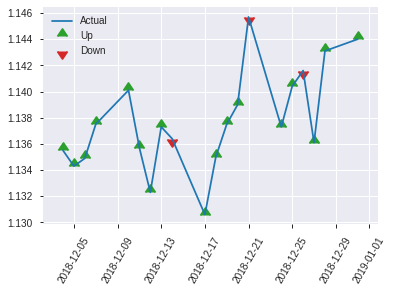


ModelMetricsBinomial: xgboost
** Reported on test data. **

MSE: 0.1768004943507629
RMSE: 0.4204765086788594
LogLoss: 0.5258059091096614
Mean Per-Class Error: 0.27191697191697195
AUC: 0.8133089133089133
pr_auc: 0.8297226790536987
Gini: 0.6266178266178266
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.3963892459869385: 


,0,1,Error,Rate
0,68.0,58.0,0.4603,(58.0/126.0)
1,16.0,114.0,0.1231,(16.0/130.0)
Total,84.0,172.0,0.2891,(74.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.3963892,0.7549669,171.0
max f2,0.2740690,0.8644537,202.0
max f0point5,0.6760355,0.7746479,73.0
max accuracy,0.5872042,0.7265625,103.0
max precision,0.9327330,1.0,0.0
max recall,0.0899294,1.0,248.0
max specificity,0.9327330,1.0,0.0
max absolute_mcc,0.6760355,0.4898738,73.0
max min_per_class_accuracy,0.5371228,0.7076923,125.0
max mean_per_class_accuracy,0.5872042,0.7280830,103.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.41 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9207438,1.9692308,1.9692308,1.0,0.9274584,1.0,0.9274584,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9055027,1.9692308,1.9692308,1.0,0.9108455,1.0,0.9191519,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9006408,1.9692308,1.9692308,1.0,0.9013656,1.0,0.9147054,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8965303,1.9692308,1.9692308,1.0,0.8990203,1.0,0.9104276,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8890416,1.9692308,1.9692308,1.0,0.8896658,1.0,0.9072335,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8541145,1.8177515,1.8934911,0.9230769,0.8727804,0.9615385,0.8900069,0.0923077,0.1923077,81.7751479,89.3491124
,7,0.1523438,0.8131457,1.8177515,1.8682446,0.9230769,0.8317448,0.9487179,0.8705862,0.0923077,0.2846154,81.7751479,86.8244576
,8,0.203125,0.7587326,1.8177515,1.8556213,0.9230769,0.7885832,0.9423077,0.8500855,0.0923077,0.3769231,81.7751479,85.5621302
,9,0.3007812,0.6694088,1.4178462,1.7134865,0.72,0.7159604,0.8701299,0.8065384,0.1384615,0.5153846,41.7846154,71.3486513
,10,0.4023438,0.5910091,1.0603550,1.5486184,0.5384615,0.6333083,0.7864078,0.7628104,0.1076923,0.6230769,6.0355030,54.8618372


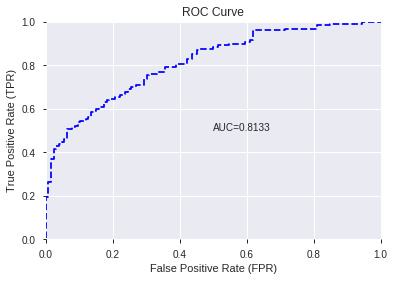

This function is available for GLM models only


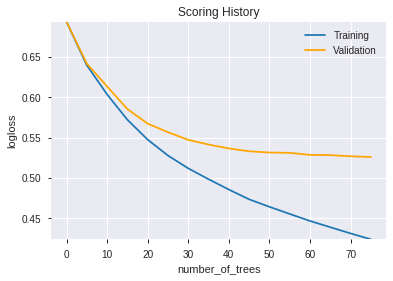

--2019-12-07 23:48:47--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.229.43
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.229.43|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip


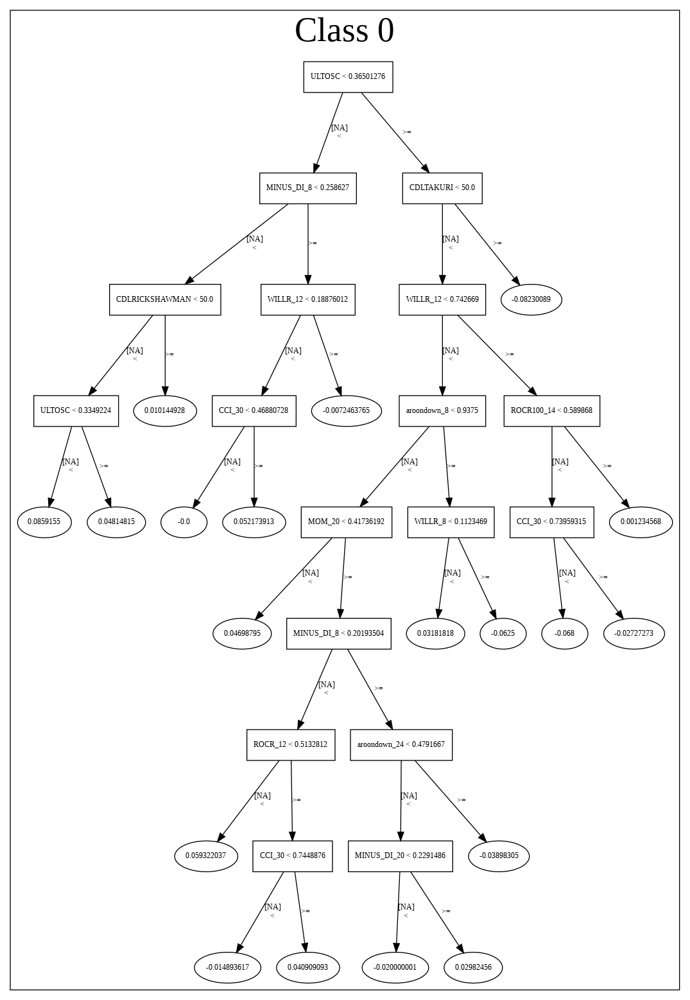

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/XGBoost_2_AutoML_20191207_234829',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'XGBoost_2_AutoML_20191207_234829',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_144_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_144_sid_8e77',
   'ty

['CDLTAKURI',
 'CDLGRAVESTONEDOJI',
 'STOCHF_fastk',
 'WILLR_8',
 'ULTOSC',
 'MINUS_DI_8',
 'CCI_14',
 'WILLR_12',
 'PLUS_DI_8',
 'CCI_24',
 'BETA_8',
 'aroondown_8',
 'CCI_30',
 'STDDEV_8',
 'aroonup_8',
 'aroonup_12',
 'MINUS_DI_20',
 'MINUS_DM_24',
 'ADX_14',
 'HT_PHASOR_quadrature',
 'BOP',
 'MACDFIX_hist_20',
 'ROCR_12',
 'APO',
 'RSI_20',
 'WILLR_14',
 'PLUS_DI_12',
 'ROC_8',
 'PLUS_DM_12',
 'STOCH_slowk',
 'MOM_20',
 'BBANDS_middleband_14_2_2',
 'ROCR100_14',
 'ROC_24',
 'BBANDS_lowerband_14_1_3',
 'BBANDS_lowerband_14_2_4',
 'WILLR_30',
 'CMO_12',
 'aroondown_24',
 'MACDFIX_20',
 'ROCP_30',
 'PLUS_DI_30',
 'aroondown_30',
 'STOCHF_fastd',
 'PLUS_DI_24',
 'VAR_8',
 'AROONOSC_8',
 'CDLRICKSHAWMAN',
 'ROCR_24',
 'ROCP_24']

In [98]:
# All algos with recursive feature elimination
model_train(feature_name='RFE',model_algo=None,features_list=features_list)

In [0]:
# recursive feature elimination with cross validation
try:
  del features_list
except:
  pass
gc.collect()

if features_to_include is True or 'RFECV' in features_to_include:
  from sklearn.feature_selection import RFECV
  from sklearn.svm import LinearSVC
  from sklearn.tree import DecisionTreeClassifier,ExtraTreeClassifier
  from sklearn.linear_model import LogisticRegression, LinearRegression

  bestfeatures = RFECV(ExtraTreeClassifier(random_state=1,criterion='entropy'), min_features_to_select=select_rfe, step=1,cv=cv_rfe).fit(pd.read_pickle('scaled_df')[:index_splits[0]].drop(data_label_name,axis=1)
                                                              ,pd.read_pickle('scaled_df')[:index_splits[0]][data_label_name])

  features_list = list(np.array(train_hf.columns)[:-1][bestfeatures.get_support()])

  del bestfeatures, RFECV, LinearSVC, DecisionTreeClassifier,ExtraTreeClassifier, LogisticRegression, LinearRegression
  gc.collect()
  display(len(features_list),features_list)
else:
  features_list = []

In [100]:
# DeepLearning with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DeepLearning",features_list=features_list)

[]

In [101]:
# GLM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GLM",features_list=features_list)

[]

In [102]:
# XGBoost with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="XGBoost",features_list=features_list)

[]

In [103]:
# DRF with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="DRF",features_list=features_list)

[]

In [104]:
# GBM with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="GBM",features_list=features_list)

[]

In [105]:
# StackedEnsemble with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo="StackedEnsemble",features_list=features_list)

[]

In [106]:
# All algos with recursive feature elimination with cross validation
model_train(feature_name='RFECV',model_algo=None,features_list=features_list)

[]

In [107]:
# Stacked ensemble

## filter models based on ensemble_model_threshold
models_arr = []
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_arr.append(best_models[model_name]['id'])

from h2o.estimators.stackedensemble import H2OStackedEnsembleEstimator

try:
  ensemble = H2OStackedEnsembleEstimator(seed=1,
                                        base_models=models_arr)

  ensemble.train(y=data_label_name, training_frame=train_hf[:index_splits[0],:], blending_frame =train_hf[index_splits[0]:index_splits[1],:])
except:
  pass

try:
  display(ensemble)
  model_performance = ensemble.model_performance(test_data=train_hf[index_splits[1]:,:])
  display(model_performance)
  for k in models_summary:
    result = getattr(model_performance, k)()
    result = result[0][1] if isinstance(result,list) else result
    models_summary[k] = models_summary[k].append(pd.DataFrame({'StackedEnsemble':[result]},index=['All']))
    display((k,result))
except Exception as e:
  print(e)

stackedensemble Model Build progress: |███████████████████████████████████| 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_model_python_1575757480454_5024
No model summary for this model


ModelMetricsBinomialGLM: stackedensemble
** Reported on train data. **

MSE: 0.08611627989020532
RMSE: 0.2934557545699271
LogLoss: 0.31166443167282465
Null degrees of freedom: 1786
Residual degrees of freedom: 1779
Null deviance: 2480.1522530898055
Residual deviance: 1113.8886787986753
AIC: 1129.8886787986753
AUC: 0.9761723134118967
pr_auc: 0.9754547456175652
Gini: 0.9523446268237934
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.4499021392635527: 


,0,1,Error,Rate
0,816.0,75.0,0.0842,(75.0/891.0)
1,46.0,850.0,0.0513,(46.0/896.0)
Total,862.0,925.0,0.0677,(121.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4499021,0.9335530,219.0
max f2,0.4227219,0.9476117,229.0
max f0point5,0.5557295,0.9399038,182.0
max accuracy,0.4826762,0.9328483,208.0
max precision,0.9373849,1.0,0.0
max recall,0.1210044,1.0,355.0
max specificity,0.9373849,1.0,0.0
max absolute_mcc,0.4826762,0.8657060,208.0
max min_per_class_accuracy,0.4826762,0.9308036,208.0
max mean_per_class_accuracy,0.4826762,0.9328541,208.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 47.98 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.9292141,1.9944196,1.9944196,1.0,0.9320110,1.0,0.9320110,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.9251582,1.9944196,1.9944196,1.0,0.9266136,1.0,0.9293123,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.9222281,1.9944196,1.9944196,1.0,0.9232419,1.0,0.9272888,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.9187279,1.9944196,1.9944196,1.0,0.9201791,1.0,0.9255114,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.9164825,1.9944196,1.9944196,1.0,0.9176346,1.0,0.9239360,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8933470,1.9944196,1.9944196,1.0,0.9059083,1.0,0.9149725,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8481951,1.9944196,1.9944196,1.0,0.8713520,1.0,0.9004866,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.7985855,1.9722594,1.9888486,0.9888889,0.8224163,0.9972067,0.8808600,0.0993304,0.3984375,97.2259425,98.8848638
,9,0.2999440,0.7123935,1.9496012,1.9758150,0.9775281,0.7528709,0.9906716,0.8383562,0.1941964,0.5926339,94.9601224,97.5814982
,10,0.4001119,0.6234598,1.8384315,1.9414211,0.9217877,0.6699093,0.9734266,0.7961856,0.1841518,0.7767857,83.8431514,94.1421079



ModelMetricsBinomialGLM: stackedensemble
** Reported on test data. **

MSE: 0.17150716005465014
RMSE: 0.41413422951339113
LogLoss: 0.5072650519278439
Null degrees of freedom: 255
Residual degrees of freedom: 248
Null deviance: 355.5431146933544
Residual deviance: 259.71970658705607
AIC: 275.71970658705607
AUC: 0.8224053724053724
pr_auc: 0.8343525326949254
Gini: 0.6448107448107447
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.17820457504369694: 


,0,1,Error,Rate
0,49.0,77.0,0.6111,(77.0/126.0)
1,3.0,127.0,0.0231,(3.0/130.0)
Total,52.0,204.0,0.3125,(80.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.1782046,0.7604790,203.0
max f2,0.1782046,0.8770718,203.0
max f0point5,0.5745508,0.7530120,91.0
max accuracy,0.4842591,0.7382812,120.0
max precision,0.9330484,1.0,0.0
max recall,0.0638154,1.0,238.0
max specificity,0.9330484,1.0,0.0
max absolute_mcc,0.4842591,0.4781909,120.0
max min_per_class_accuracy,0.4575441,0.7301587,128.0
max mean_per_class_accuracy,0.4842591,0.7387668,120.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 47.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.9215442,1.9692308,1.9692308,1.0,0.9267262,1.0,0.9267262,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.9191472,1.9692308,1.9692308,1.0,0.9197840,1.0,0.9232551,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.9132961,1.9692308,1.9692308,1.0,0.9173039,1.0,0.9217673,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.9073094,1.9692308,1.9692308,1.0,0.9094290,1.0,0.9184023,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.9037846,1.9692308,1.9692308,1.0,0.9055845,1.0,0.9164303,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8824456,1.9692308,1.9692308,1.0,0.8951731,1.0,0.9058017,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8383169,1.9692308,1.9692308,1.0,0.8645172,1.0,0.8920402,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.7558026,1.5147929,1.8556213,0.7692308,0.8038020,0.9423077,0.8699807,0.0769231,0.3769231,51.4792899,85.5621302
,9,0.3007812,0.6145643,1.1027692,1.6111888,0.56,0.6813346,0.8181818,0.8087320,0.1076923,0.4846154,10.2769231,61.1188811
,10,0.4023438,0.5393172,1.2875740,1.5294996,0.6538462,0.5805134,0.7766990,0.7511234,0.1307692,0.6153846,28.7573964,52.9499627


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.73828125)

('F1', 0.7604790419161676)

('auc', 0.8224053724053724)

('logloss', 0.5072650519278439)

('mean_per_class_error', 0.2612332112332112)

('rmse', 0.41413422951339113)

('mse', 0.17150716005465014)

Parse progress: |█████████████████████████████████████████████████████████| 100%
AutoML progress: |████████████████████████████████████████████████████████| 100%


,model_id,auc,logloss,mean_per_class_error,rmse,mse
0,GLM_grid_1_AutoML_20191207_234949_model_1,0.825153,0.522601,0.263309,0.419468,0.175953
1,DeepLearning_grid_1_AutoML_20191207_234949_model_239,0.815629,1.854165,0.283639,0.502763,0.252770
2,DeepLearning_grid_1_AutoML_20191207_234949_model_164,0.810989,1.675334,0.283394,0.505346,0.255375
3,DeepLearning_grid_1_AutoML_20191207_234949_model_21,0.810165,5.839279,0.287851,0.526179,0.276865
4,DeepLearning_grid_1_AutoML_20191207_234949_model_83,0.809096,1.897665,0.287729,0.514563,0.264775
...,...,...,...,...,...,...
374,GBM_grid_1_AutoML_20191207_234949_model_42,0.729243,0.712495,0.295910,0.485415,0.235628
375,GBM_grid_1_AutoML_20191207_234949_model_19,0.724389,0.599833,0.299878,0.452628,0.204873
376,DeepLearning_grid_1_AutoML_20191207_234949_model_85,0.723840,7.496059,0.294811,0.524649,0.275257
377,GBM_grid_1_AutoML_20191207_234949_model_37,0.721093,0.902925,0.283761,0.510590,0.260702


,variable,relative_importance,scaled_importance,percentage
0,XGBF_['DRF']predict,0.128706,1.000000,0.072296
1,DLF_['DRF']predict,0.127626,0.991608,0.071689
2,XGBF_['DRF'],0.110256,0.856649,0.061932
3,DLF_['DRF'],0.108677,0.844377,0.061045
4,RFE_['GBM']predict,0.103485,0.804041,0.058129
5,RFE_['GBM'],0.086957,0.675626,0.048845
6,DLF_None,0.059727,0.464056,0.033549
7,DLF_['XGBoost'],0.059691,0.463775,0.033529
8,Fwe_['GBM'],0.052264,0.406070,0.029357
9,DLF_Nonepredict,0.051955,0.403670,0.029184


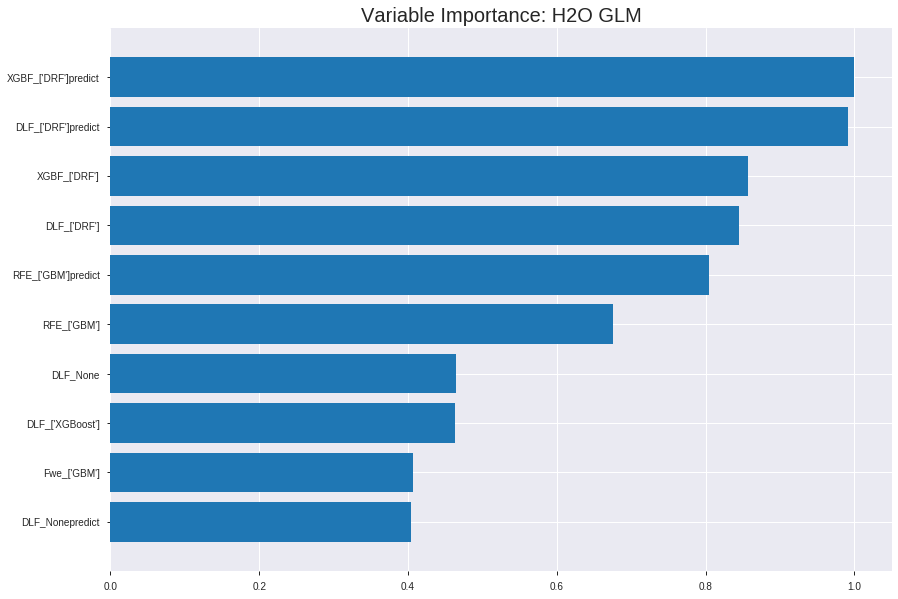

Model Details
H2OGeneralizedLinearEstimator :  Generalized Linear Modeling
Model Key:  GLM_grid_1_AutoML_20191207_234949_model_1


ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.07252842710197485
RMSE: 0.2693110229863881
LogLoss: 0.28330658892869753
Null degrees of freedom: 1786
Residual degrees of freedom: 1736
Null deviance: 2477.2940333757524
Residual deviance: 1012.5377488311649
AIC: 1114.537748831165
AUC: 0.9877250931938433
pr_auc: 0.9840125946304723
Gini: 0.9754501863876865
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5823035900995985: 


,0,1,Error,Rate
0,860.0,31.0,0.0348,(31.0/891.0)
1,62.0,834.0,0.0692,(62.0/896.0)
Total,922.0,865.0,0.052,(93.0/1787.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5823036,0.9471891,167.0
max f2,0.5004023,0.9539619,198.0
max f0point5,0.6500634,0.9681730,144.0
max accuracy,0.5999750,0.9479575,161.0
max precision,0.8991723,1.0,0.0
max recall,0.1524824,1.0,343.0
max specificity,0.8991723,1.0,0.0
max absolute_mcc,0.5999750,0.8970669,161.0
max min_per_class_accuracy,0.5411146,0.9461279,183.0
max mean_per_class_accuracy,0.5999750,0.9480275,161.0


Gains/Lift Table: Avg response rate: 50.14 %, avg score: 50.14 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0100727,0.8937279,1.9944196,1.9944196,1.0,0.8967698,1.0,0.8967698,0.0200893,0.0200893,99.4419643,99.4419643
,2,0.0201455,0.8907488,1.9944196,1.9944196,1.0,0.8926238,1.0,0.8946968,0.0200893,0.0401786,99.4419643,99.4419643
,3,0.0302182,0.8886447,1.9944196,1.9944196,1.0,0.8895579,1.0,0.8929838,0.0200893,0.0602679,99.4419643,99.4419643
,4,0.0402910,0.8851229,1.9944196,1.9944196,1.0,0.8867365,1.0,0.8914220,0.0200893,0.0803571,99.4419643,99.4419643
,5,0.0503637,0.8827614,1.9944196,1.9944196,1.0,0.8839219,1.0,0.8899220,0.0200893,0.1004464,99.4419643,99.4419643
,6,0.1001679,0.8671461,1.9944196,1.9944196,1.0,0.8760183,1.0,0.8830090,0.0993304,0.1997768,99.4419643,99.4419643
,7,0.1499720,0.8404520,1.9944196,1.9944196,1.0,0.8541582,1.0,0.8734279,0.0993304,0.2991071,99.4419643,99.4419643
,8,0.2003358,0.8171842,1.9944196,1.9944196,1.0,0.8287337,1.0,0.8621919,0.1004464,0.3995536,99.4419643,99.4419643
,9,0.2999440,0.7754007,1.9944196,1.9944196,1.0,0.7973178,1.0,0.8406479,0.1986607,0.5982143,99.4419643,99.4419643
,10,0.4001119,0.7128687,1.9721356,1.9888408,0.9888268,0.7471614,0.9972028,0.8172436,0.1975446,0.7957589,97.2135625,98.8840847




ModelMetricsBinomialGLM: glm
** Reported on validation data. **

MSE: 0.17032703906216337
RMSE: 0.41270696512436444
LogLoss: 0.514188097715049
Null degrees of freedom: 510
Residual degrees of freedom: 460
Null deviance: 708.5067427497428
Residual deviance: 525.5002358647803
AIC: 627.5002358647803
AUC: 0.8340696425832183
pr_auc: 0.8134397456148321
Gini: 0.6681392851664365
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.5112075411017227: 


,0,1,Error,Rate
0,182.0,83.0,0.3132,(83.0/265.0)
1,42.0,204.0,0.1707,(42.0/246.0)
Total,224.0,287.0,0.2446,(125.0/511.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.5112075,0.7654784,217.0
max f2,0.1952819,0.8497447,312.0
max f0point5,0.7110409,0.7761905,144.0
max accuracy,0.7110409,0.7632094,144.0
max precision,0.8963865,1.0,0.0
max recall,0.0832601,1.0,386.0
max specificity,0.8963865,1.0,0.0
max absolute_mcc,0.7110409,0.5310688,144.0
max min_per_class_accuracy,0.6091026,0.7398374,183.0
max mean_per_class_accuracy,0.5290803,0.7596257,212.0


Gains/Lift Table: Avg response rate: 48.14 %, avg score: 51.89 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117417,0.8893460,2.0772358,2.0772358,1.0,0.8928441,1.0,0.8928441,0.0243902,0.0243902,107.7235772,107.7235772
,2,0.0215264,0.8835528,1.6617886,1.8883962,0.8,0.8859893,0.9090909,0.8897283,0.0162602,0.0406504,66.1788618,88.8396157
,3,0.0313112,0.8814404,2.0772358,1.9474085,1.0,0.8825531,0.9375,0.8874860,0.0203252,0.0609756,107.7235772,94.7408537
,4,0.0410959,0.8797272,2.0772358,1.9783198,1.0,0.8807033,0.9523810,0.8858711,0.0203252,0.0813008,107.7235772,97.8319783
,5,0.0508806,0.8782225,1.2463415,1.8375547,0.6,0.8791063,0.8846154,0.8845702,0.0121951,0.0934959,24.6341463,83.7554722
,6,0.1017613,0.8671298,1.9973421,1.9174484,0.9615385,0.8720014,0.9230769,0.8782858,0.1016260,0.1951220,99.7342089,91.7448405
,7,0.1506849,0.8538959,1.7448780,1.8614191,0.84,0.8602763,0.8961039,0.8724386,0.0853659,0.2804878,74.4878049,86.1419069
,8,0.2015656,0.8283703,1.8375547,1.8553951,0.8846154,0.8417125,0.8932039,0.8646825,0.0934959,0.3739837,83.7554722,85.5395059
,9,0.3013699,0.7781025,1.5884744,1.7669993,0.7647059,0.8033682,0.8506494,0.8443771,0.1585366,0.5325203,58.8474414,76.6999261
,10,0.4011742,0.7033357,1.3440937,1.6617886,0.6470588,0.7423205,0.8,0.8189874,0.1341463,0.6666667,34.4093735,66.1788618



Scoring History: 


,timestamp,duration,iteration,lambda,predictors,deviance_train,deviance_test
,2019-12-07 23:49:52,0.000 sec,2,.5E2,51,1.2254770,1.2705880
,2019-12-07 23:49:52,0.013 sec,4,.31E2,51,1.1557792,1.2243494
,2019-12-07 23:49:52,0.024 sec,6,.19E2,51,1.0701964,1.1719801
,2019-12-07 23:49:52,0.038 sec,8,.12E2,51,0.9734568,1.1201631
,2019-12-07 23:49:52,0.049 sec,10,.74E1,51,0.8714164,1.0762882
,2019-12-07 23:49:52,0.060 sec,12,.46E1,51,0.7684689,1.0455684
,2019-12-07 23:49:52,0.070 sec,14,.29E1,51,0.6667148,1.0299600
,2019-12-07 23:49:52,0.081 sec,16,.18E1,51,0.5666132,1.0283762
,2019-12-07 23:49:52,0.087 sec,18,.11E1,51,0.4693143,1.0386041
,2019-12-07 23:49:52,0.094 sec,20,.69E0,51,0.3777256,1.0585733


/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


('accuracy', 0.74609375)

('F1', 0.7649122807017544)

('auc', 0.8251526251526251)

('logloss', 0.5226011984730007)

('mean_per_class_error', 0.2534188034188034)

('rmse', 0.419468054625251)

('mse', 0.17595344885109254)

glm prediction progress: |████████████████████████████████████████████████| 100%
      predict
0           1
1           1
2           1
3           0
4           1
...       ...
2549        1
2550        0
2551        1
2552        1
2553        1

[2554 rows x 1 columns]


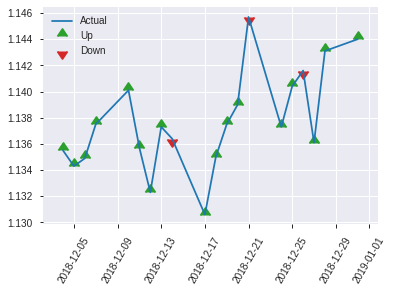


ModelMetricsBinomialGLM: glm
** Reported on test data. **

MSE: 0.17595344885109254
RMSE: 0.419468054625251
LogLoss: 0.5226011984730007
Null degrees of freedom: 255
Residual degrees of freedom: 205
Null deviance: 354.8709766655029
Residual deviance: 267.57181361817635
AIC: 369.57181361817635
AUC: 0.8251526251526251
pr_auc: 0.8370933156169562
Gini: 0.6503052503052502
Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.42805430478350504: 


,0,1,Error,Rate
0,80.0,46.0,0.3651,(46.0/126.0)
1,21.0,109.0,0.1615,(21.0/130.0)
Total,101.0,155.0,0.2617,(67.0/256.0)


Maximum Metrics: Maximum metrics at their respective thresholds



metric,threshold,value,idx
max f1,0.4280543,0.7649123,154.0
max f2,0.1798005,0.8704735,197.0
max f0point5,0.7548469,0.7655502,71.0
max accuracy,0.6181057,0.7460938,120.0
max precision,0.8952457,1.0,0.0
max recall,0.0862201,1.0,239.0
max specificity,0.8952457,1.0,0.0
max absolute_mcc,0.6181057,0.4938412,120.0
max min_per_class_accuracy,0.6181057,0.7153846,120.0
max mean_per_class_accuracy,0.6181057,0.7465812,120.0


Gains/Lift Table: Avg response rate: 50.78 %, avg score: 51.03 %



,group,cumulative_data_fraction,lower_threshold,lift,cumulative_lift,response_rate,score,cumulative_response_rate,cumulative_score,capture_rate,cumulative_capture_rate,gain,cumulative_gain
,1,0.0117188,0.8874990,1.9692308,1.9692308,1.0,0.8923844,1.0,0.8923844,0.0230769,0.0230769,96.9230769,96.9230769
,2,0.0234375,0.8854193,1.9692308,1.9692308,1.0,0.8865782,1.0,0.8894813,0.0230769,0.0461538,96.9230769,96.9230769
,3,0.03125,0.8825046,1.9692308,1.9692308,1.0,0.8833029,1.0,0.8879367,0.0153846,0.0615385,96.9230769,96.9230769
,4,0.0429688,0.8804009,1.9692308,1.9692308,1.0,0.8816890,1.0,0.8862328,0.0230769,0.0846154,96.9230769,96.9230769
,5,0.0507812,0.8798868,1.9692308,1.9692308,1.0,0.8800499,1.0,0.8852816,0.0153846,0.1,96.9230769,96.9230769
,6,0.1015625,0.8601334,1.9692308,1.9692308,1.0,0.8697102,1.0,0.8774959,0.1,0.2,96.9230769,96.9230769
,7,0.1523438,0.8414258,1.9692308,1.9692308,1.0,0.8522854,1.0,0.8690924,0.1,0.3,96.9230769,96.9230769
,8,0.203125,0.8028150,1.5147929,1.8556213,0.7692308,0.8219840,0.9423077,0.8573153,0.0769231,0.3769231,51.4792899,85.5621302
,9,0.3007812,0.7384125,1.2603077,1.6623377,0.64,0.7726602,0.8441558,0.8298299,0.1230769,0.5,26.0307692,66.2337662
,10,0.4023438,0.6686351,1.1360947,1.5294996,0.5769231,0.7067094,0.7766990,0.7987509,0.1153846,0.6153846,13.6094675,52.9499627


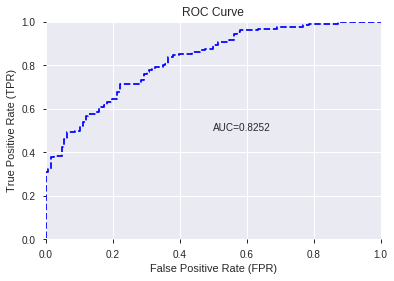

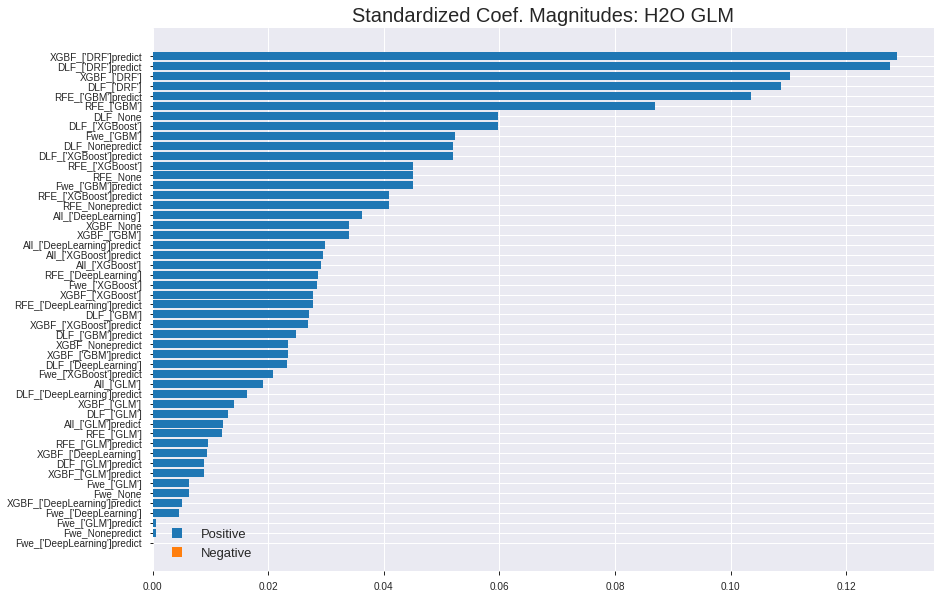

'log_likelihood'
--2019-12-08 00:23:32--  https://h2o-release.s3.amazonaws.com/h2o/rel-yates/5/h2o-3.24.0.5.zip
Resolving h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)... 52.216.176.227
Connecting to h2o-release.s3.amazonaws.com (h2o-release.s3.amazonaws.com)|52.216.176.227|:443... connected.
HTTP request sent, awaiting response... 416 Requested Range Not Satisfiable

    The file is already fully retrieved; nothing to do.

Archive:  h2o-3.24.0.5.zip
ERROR: Unknown MOJO type


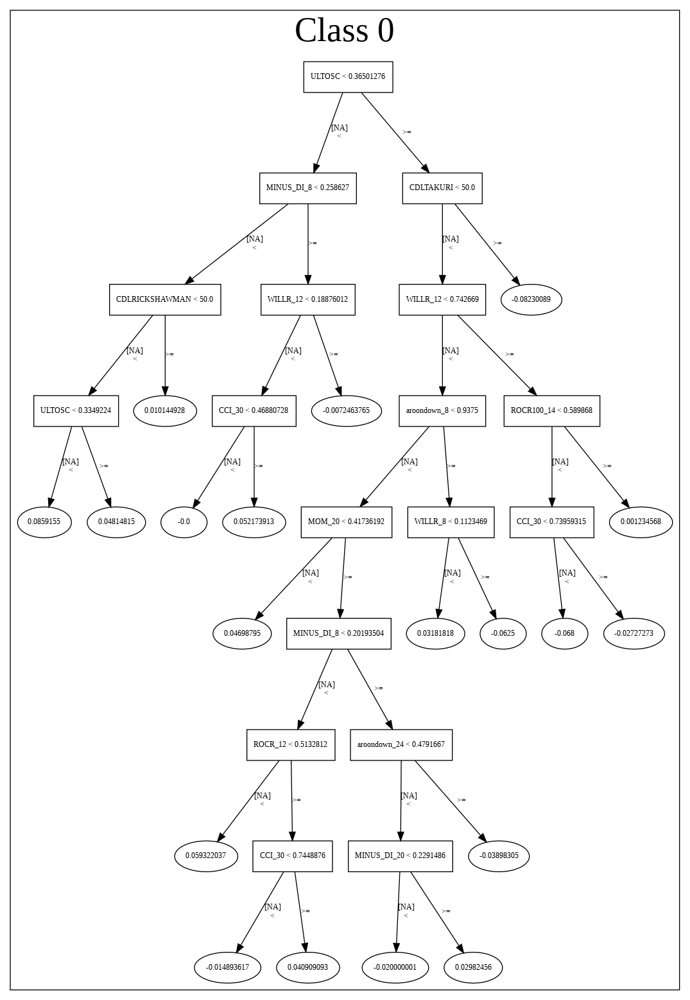

[{'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Models/GLM_grid_1_AutoML_20191207_234949_model_1',
   '__meta': {'schema_name': 'ModelKeyV3',
    'schema_type': 'Key<Model>',
    'schema_version': 3},
   'name': 'GLM_grid_1_AutoML_20191207_234949_model_1',
   'type': 'Key<Model>'},
  'default_value': None,
  'gridable': False,
  'help': 'Destination id for this model; auto-generated if not specified.',
  'is_member_of_frames': [],
  'is_mutually_exclusive_with': [],
  'label': 'model_id',
  'level': 'critical',
  'name': 'model_id',
  'required': False,
  'type': 'Key<Model>',
  'values': []},
 {'__meta': {'schema_name': 'ModelParameterSchemaV3',
   'schema_type': 'Iced',
   'schema_version': 3},
  'actual_value': {'URL': '/3/Frames/automl_training_py_153_sid_8e77',
   '__meta': {'schema_name': 'FrameKeyV3',
    'schema_type': 'Key<Frame>',
    'schema_version': 3},
   'name': 'automl_training_py_153

["XGBF_['DRF']predict",
 "DLF_['DRF']predict",
 "XGBF_['DRF']",
 "DLF_['DRF']",
 "RFE_['GBM']predict",
 "RFE_['GBM']",
 'DLF_None',
 "DLF_['XGBoost']",
 "Fwe_['GBM']",
 'DLF_Nonepredict',
 "DLF_['XGBoost']predict",
 "RFE_['XGBoost']",
 'RFE_None',
 "Fwe_['GBM']predict",
 "RFE_['XGBoost']predict",
 'RFE_Nonepredict',
 "All_['DeepLearning']",
 'XGBF_None',
 "XGBF_['GBM']",
 "All_['DeepLearning']predict",
 "All_['XGBoost']predict",
 "All_['XGBoost']",
 "RFE_['DeepLearning']",
 "Fwe_['XGBoost']",
 "XGBF_['XGBoost']",
 "RFE_['DeepLearning']predict",
 "DLF_['GBM']",
 "XGBF_['XGBoost']predict",
 "DLF_['GBM']predict",
 'XGBF_Nonepredict',
 "XGBF_['GBM']predict",
 "DLF_['DeepLearning']",
 "Fwe_['XGBoost']predict",
 "All_['GLM']",
 "DLF_['DeepLearning']predict",
 "XGBF_['GLM']",
 "DLF_['GLM']",
 "All_['GLM']predict",
 "RFE_['GLM']",
 "RFE_['GLM']predict",
 "XGBF_['DeepLearning']",
 "DLF_['GLM']predict",
 "XGBF_['GLM']predict",
 "Fwe_['GLM']",
 'Fwe_None',
 "XGBF_['DeepLearning']predict",
 "Fwe_[

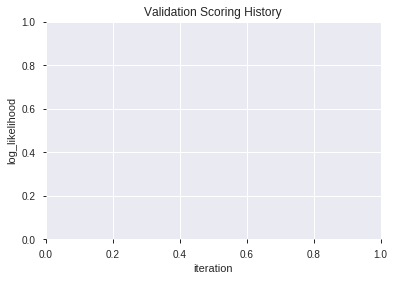

In [108]:
# Super learner
models_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models_df[model_name] = pd.read_csv(model_name+".csv")['p1']
    models_df[model_name+'predict'] = pd.read_csv(model_name+".csv")['predict']

models_df[data_label_name] = pd.read_pickle('scaled_df')[[data_label_name]].values[-len(models_df):]

training_frame = h2o.H2OFrame(models_df)
training_frame[data_label_name] = training_frame[data_label_name].ascharacter().asfactor()

model_train(feature_name='Super_learner',model_algo=None,training_frame= training_frame,max_models=500)

In [109]:
# Majority Voting
models1_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models1_df[model_name] = pd.read_csv(model_name+".csv")['predict']

model_accuracy = accuracy_score(models1_df.mode(1)[0].values[index_splits[1]:],pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'MajorityVoting':[model_accuracy]},index=['All']))
display('MajorityVoting', model_accuracy)

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


'MajorityVoting'

0.73046875

In [110]:
# LogReg SuperLearner
from sklearn.linear_model import LogisticRegression
models2_df = pd.DataFrame()
for model_name in best_models:
  if best_models[max(best_models.keys(), key=(lambda k: best_models[k]['AUC']))]['AUC'] - best_models[model_name]['AUC'] <= ensemble_model_threshold:
    models2_df[model_name] = pd.read_csv(model_name+".csv")['predict']
    models2_df[model_name+'p1'] = pd.read_csv(model_name+".csv")['p1']

clf = LogisticRegression(random_state=0, solver='lbfgs',
                         multi_class='multinomial').fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'LogReg':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.73046875

In [111]:
# DTree SuperLearner
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(random_state=0).fit(models2_df.values[index_splits[0]:index_splits[1]], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[0]:index_splits[1]])

model_accuracy = clf.score(models2_df.values[index_splits[1]:], pd.read_pickle('scaled_df')[[data_label_name]].values[index_splits[1]:])
models_summary['accuracy'] = models_summary['accuracy'].append(pd.DataFrame({'DTree':[model_accuracy]},index=['All']))
model_accuracy

/usr/local/lib/python3.6/dist-packages/pandas/core/frame.py:7138: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  sort=sort,


0.62890625

In [112]:
# Experiment Summary
pd.set_option('precision', 3) 

for k in models_summary:
  print(k)
  display(models_summary[k].max())
  print('\n'*3)
  display(models_summary[k].groupby(models_summary[k].index).max())
  print('\n'*3)
  
display(models_summary)

pd.set_option('precision', 6) 

accuracy


All                0.770
DRF                0.734
DTree              0.629
DeepLearning       0.746
GBM                0.770
GLM                0.750
LogReg             0.730
MajorityVoting     0.730
StackedEnsemble    0.738
XGBoost            0.754
dtype: float64

,All,DRF,DTree,DeepLearning,GBM,GLM,LogReg,MajorityVoting,StackedEnsemble,XGBoost
All,NaN,NaN,0.629,0.742,NaN,0.730,0.73,0.73,0.738,0.742
DLF,0.746,0.715,NaN,0.723,0.758,0.750,NaN,NaN,NaN,0.746
Fwe,0.734,0.691,NaN,0.715,0.715,0.734,NaN,NaN,NaN,0.719
RFE,0.727,0.734,NaN,0.746,0.734,0.734,NaN,NaN,NaN,0.727
Super_learner,0.746,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.770,0.715,NaN,0.730,0.770,0.734,NaN,NaN,NaN,0.754






F1


All                0.782
DRF                0.753
DeepLearning       0.763
GBM                0.782
GLM                0.776
StackedEnsemble    0.760
XGBoost            0.764
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.762,NaN,0.758,0.76,0.754
DLF,0.764,0.738,0.755,0.767,0.776,NaN,0.764
Fwe,0.751,0.751,0.763,0.752,0.751,NaN,0.763
RFE,0.755,0.725,0.757,0.759,0.764,NaN,0.755
Super_learner,0.765,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.782,0.753,0.763,0.782,0.766,NaN,0.763






auc


All                0.828
DRF                0.784
DeepLearning       0.828
GBM                0.828
GLM                0.821
StackedEnsemble    0.822
XGBoost            0.828
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.804,NaN,0.802,0.822,0.818
DLF,0.823,0.784,0.801,0.822,0.821,NaN,0.823
Fwe,0.800,0.770,0.804,0.797,0.800,NaN,0.798
RFE,0.813,0.777,0.828,0.813,0.810,NaN,0.813
Super_learner,0.825,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.828,0.783,0.795,0.828,0.820,NaN,0.828






logloss


All                0.536
DRF                0.566
DeepLearning       0.544
GBM                0.535
GLM                0.537
StackedEnsemble    0.507
XGBoost            0.532
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.544,NaN,0.537,0.507,0.529
DLF,0.511,0.548,0.534,0.520,0.508,NaN,0.511
Fwe,0.536,0.557,0.534,0.535,0.536,NaN,0.532
RFE,0.526,0.566,0.511,0.521,0.525,NaN,0.526
Super_learner,0.523,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.512,0.556,0.542,0.512,0.510,NaN,0.520






mean_per_class_error


All                0.272
DRF                0.307
DeepLearning       0.285
GBM                0.284
GLM                0.271
StackedEnsemble    0.261
XGBoost            0.283
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.259,NaN,0.271,0.261,0.258
DLF,0.254,0.285,0.278,0.242,0.252,NaN,0.254
Fwe,0.264,0.307,0.285,0.284,0.264,NaN,0.283
RFE,0.272,0.264,0.253,0.267,0.266,NaN,0.272
Super_learner,0.253,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.231,0.285,0.271,0.231,0.265,NaN,0.246






rmse


All                0.428
DRF                0.441
DeepLearning       0.430
GBM                0.428
GLM                0.428
StackedEnsemble    0.414
XGBoost            0.426
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.430,NaN,0.427,0.414,0.421
DLF,0.414,0.434,0.426,0.417,0.414,NaN,0.414
Fwe,0.428,0.441,0.426,0.428,0.428,NaN,0.426
RFE,0.420,0.439,0.418,0.420,0.422,NaN,0.420
Super_learner,0.419,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.413,0.436,0.429,0.413,0.415,NaN,0.416






mse


All                0.183
DRF                0.194
DeepLearning       0.185
GBM                0.183
GLM                0.183
StackedEnsemble    0.172
XGBoost            0.181
dtype: float64

,All,DRF,DeepLearning,GBM,GLM,StackedEnsemble,XGBoost
All,NaN,NaN,0.185,NaN,0.182,0.172,0.177
DLF,0.171,0.189,0.182,0.174,0.172,NaN,0.171
Fwe,0.183,0.194,0.181,0.183,0.183,NaN,0.181
RFE,0.177,0.193,0.175,0.176,0.178,NaN,0.177
Super_learner,0.176,NaN,NaN,NaN,NaN,NaN,NaN
XGBF,0.171,0.190,0.184,0.171,0.172,NaN,0.173


{'F1':                  All    DRF  DeepLearning    GBM    GLM  StackedEnsemble  XGBoost
 All              NaN    NaN         0.762    NaN    NaN              NaN      NaN
 DLF              NaN    NaN         0.755    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN    NaN  0.776              NaN      NaN
 DLF              NaN    NaN           NaN    NaN    NaN              NaN    0.764
 DLF              NaN  0.738           NaN    NaN    NaN              NaN      NaN
 DLF              NaN    NaN           NaN  0.767    NaN              NaN      NaN
 DLF            0.764    NaN           NaN    NaN    NaN              NaN      NaN
 All              NaN    NaN           NaN    NaN  0.758              NaN      NaN
 All              NaN    NaN           NaN    NaN    NaN              NaN    0.754
 XGBF             NaN    NaN         0.763    NaN    NaN              NaN      NaN
 XGBF             NaN    NaN           NaN    NaN  0.766              NaN      Na